In [230]:
import numpy as np
import pandas as pd
from pandas import DataFrame
import sqlite3
import matplotlib.pyplot as plt
import ast
import math
import time
from datetime import datetime
import glob
import sys
import copy
import cv2
from imp import reload

In [231]:
readin_id2 =pd.DataFrame()
dbs =['_3choice_feb.db','_3choice_feb2.db']
for n in range(len(dbs)):
    print(dbs[n])

    conn = sqlite3.connect("/home/bianca/Documents/github/locustVR/databases/locustProjects"+dbs[n])
    query2 = "SELECT  post0,exp,replicate, nStimuli  FROM projects;" #
    readin_angle = pd.read_sql_query(query2,conn)


    readin_angle['index'] = list(range(len(readin_angle.index)))

    tab2=pd.DataFrame()
    #readin_angle.head(10)

    #['position','angle','distance']

    dist_read = False
    print('readin_anglekeys',readin_angle.keys())
    #60 degree angle
    angle60=(math.pi/180*60)
    angle30=(math.pi/180*30)
    angle45=(math.pi/180*45)
    angle180=(math.pi)
    angle120=(math.pi/180*120)

    a=True
    #p= pd.DataFrame(readin_angle,l)#.T.to_dict()
    for i in range(0,750):

        #(readin_angle[readin_angle['index'] == i])
        #250 diff conditions from which to pick available



        if (ast.literal_eval(readin_angle.loc[i].values[0])) != None:
            ang=(ast.literal_eval(readin_angle.loc[i].values[0])['angle'])

            if dist_read == False:
                dist = (ast.literal_eval(readin_angle.loc[i].values[0])['distance'])
                dist_read = True
            if readin_angle['exp'][i] <10: 
                #only experiments <10 are the exp with two post condition, >10 are 3 post cond
                #print(readin_angle['exp'][i])
                #if 
                if ang == angle45 and readin_angle['nStimuli'][i]  <4 and readin_angle['nStimuli'][i] >0:
                    angle_used = ang
                        #selects for 60° cond and without nstim==0 or ==4 (controls with one post cond)
                        #print(i,ang)
                        #readin_angle[i]
                        #del tab
                        #print(readin_angle[readin_angle['index'] == i])
                        #Liste2=Liste2.append(readin_angle[readin_angle['index'] == i])
                    #print(ast.literal_eval(readin_angle.loc[i].values[0])['position'])
                    tab=(readin_angle[readin_angle['index'] == i])
                    tab2=tab2.append(tab,ignore_index=True)
                    if readin_angle['nStimuli'][i]  <4 and readin_angle['nStimuli'][i] >0:
                        #print(readin_angle['nStimuli'][i])
                        pass
                

    #readin_angle
    #ang

    #print(tab2.count())
    #print('tab2keys',tab2.keys())
    #print(dist)
    #print(ang, angle_used)
    #tab2
    
    
    #######################EXPERIMENT ID READIN

    conn = sqlite3.connect("/home/bianca/Documents/github/locustVR/databases/locustExperiments"+dbs[n])

    query = "SELECT exp, replicate, date,tStart, expId FROM experiments;"
    readin_id = pd.read_sql_query(query,conn)
    print(readin_id.keys())
    readin_id=readin_id.assign(nStimuli = 5)
    #posi=(ast.literal_eval(readin_angle.loc[0].values[0])['position'])
    #posi=0
    readin_id=readin_id.assign(position_post0_x = 1.0)
    readin_id=readin_id.assign(position_post0_y = 1.0)

    #ang=(ast.literal_eval(readin_angle.loc[i].values[0])['angle'])

    for i in range(0,len(readin_id.index)):
        #iterate through 40 rows of readin_id

        #kombi exp+ replicate in tab2 abgleichen und nStimuli rausschreiben!)
        b=readin_id['exp'][i]
        c=readin_id['replicate'][i]
        e=readin_id['date'][i]
        #tstart=readin_id['tStart'][i]

        for d in range(len(tab2)):
            #iterate through 50 rows of tab2
            if tab2['exp'][d]==b and tab2['replicate'][d]==c:
                #print(tab2['exp'][d], tab2['replicate'][d], tab2['nStimuli'][d]  )

                #print(tab2['nStimuli'][d])
                f=tab2['nStimuli'][d]
                #g=tab2['post0']
                g=(ast.literal_eval(tab2.loc[d].values[0])['position'])
                h=round(g[0], 2)
                k=round(g[1], 2)
                #print(g.keys())
                #print(h,k)
                readin_id['nStimuli'][i]=f

                readin_id['position_post0_x'][i]=h
                readin_id['position_post0_y'][i]=k

    readin_id.reset_index(drop=True, inplace=True) 
    #exper_date='2019-12-12'
    

    
    readin_id2= readin_id2.append(readin_id, ignore_index=True)
    print(readin_id)

    #40 expIDs available


_3choice_feb.db
('readin_anglekeys', Index([u'post0', u'exp', u'replicate', u'nStimuli', u'index'], dtype='object'))
Index([u'exp', u'replicate', u'date', u'tStart', u'expId'], dtype='object')


/home/bianca/.local/lib/python2.7/site-packages/ipykernel_launcher.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/bianca/.local/lib/python2.7/site-packages/ipykernel_launcher.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/bianca/.local/lib/python2.7/site-packages/ipykernel_launcher.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


    exp  replicate        date tStart                                 expId  \
0     0         10  2020-02-03  10:58  8406c44e-7acd-428c-8d56-0493c6073c53   
1     0         10  2020-02-03  13:45  d48abf4a-7115-454d-9d54-cda8522dd0fd   
2     0          9  2020-02-03  15:32  a7775da4-f8d0-4bb3-a7d2-d7dade2970ff   
3     1          6  2020-02-03  15:37  19d22288-e3aa-4437-a9dd-01c7a53285ce   
4     1         12  2020-02-04  10:03  3494a922-f9e9-4ce2-b406-414f9d859c52   
5     1          0  2020-02-04  10:57  5222ebcf-a461-4eba-b28f-1da0b1c9d4b9   
6     2         13  2020-02-04  11:55  778e20f8-9dcb-43ed-9efd-65e71bb8e397   
7     2          1  2020-02-04  13:28  b0bdcc58-d51b-471b-9c8f-7b16ba0e8f30   
8     2         10  2020-02-04  14:24  1b3190f8-729d-40d7-92e5-f29a93c894ba   
9     3          3  2020-02-04  15:15  e675c246-4345-4c78-82db-c4a4de84709b   
10    3         13  2020-02-04  16:05  7d9d09f1-373c-4a98-9426-8b9745f02d4a   
11    3          2  2020-02-04  17:00  b10ac082-f23c

In [232]:
readin_id2

,exp,replicate,date,tStart,expId,nStimuli,position_post0_x,position_post0_y
0,0,10,2020-02-03,10:58,8406c44e-7acd-428c-8d56-0493c6073c53,3,0.00,2.00
1,0,10,2020-02-03,13:45,d48abf4a-7115-454d-9d54-cda8522dd0fd,3,0.00,2.00
2,0,9,2020-02-03,15:32,a7775da4-f8d0-4bb3-a7d2-d7dade2970ff,3,0.00,2.00
3,1,6,2020-02-03,15:37,19d22288-e3aa-4437-a9dd-01c7a53285ce,3,1.41,1.41
4,1,12,2020-02-04,10:03,3494a922-f9e9-4ce2-b406-414f9d859c52,1,1.41,1.41
5,1,0,2020-02-04,10:57,5222ebcf-a461-4eba-b28f-1da0b1c9d4b9,1,1.41,1.41
6,2,13,2020-02-04,11:55,778e20f8-9dcb-43ed-9efd-65e71bb8e397,2,1.41,1.41
7,2,1,2020-02-04,13:28,b0bdcc58-d51b-471b-9c8f-7b16ba0e8f30,2,1.41,1.41
8,2,10,2020-02-04,14:24,1b3190f8-729d-40d7-92e5-f29a93c894ba,2,1.41,1.41
9,3,3,2020-02-04,15:15,e675c246-4345-4c78-82db-c4a4de84709b,1,1.41,1.41


# csv

In [233]:
directory = '/home/bianca/Documents/github/locustVR/databases/data_collection/'
filename = '/results.csv'
counting=0
initialise = False
#for i in readin_id2.index:
for i in range (0,(len(readin_id2))):
#for i in range(0,1):
    #iterate through 20 leftover exp ids in readin_id2 that have 2 post cond, no control, only 60°
    path = (directory + readin_id2['expId'][i] + filename)
    tstart = readin_id2['tStart'][i]
    exper_date = readin_id2['date'][i]
    print('tstart',tstart)  


    print(path)
    
     
    try:
        df = pd.read_csv(path)
        print(path)
    except:
        print('***************************csv in row %d doesnt exist**********************' %(i))
    
    #extends list to experimentID column
    df=df.assign(pos0x = (readin_id2['position_post0_x'][i]))
    df=df.assign(pos0y = (readin_id2['position_post0_y'][i]))
    #print(readin_id2['expId'][i])
    df.columns = ['x', 'y', 'z',  'cntr', 't', 'nStimuli', 'pos0x', 'pos0y']
    stim = readin_id2['nStimuli'][i]
    #print stim
    #for j in range(0,len(df)):
    #    if df['nStimuli'][j]== stim:
    
    #select those with stimuli according to readin_in info those with the specific angle
    df=(df.loc[df['nStimuli'] == stim])  
    print(i)
    if initialise == False:
        df3=df
        df3.columns = ['x', 'y', 'z',  'cntr', 't', 'nStimuli', 'pos0x', 'pos0y']
        initialise = True

    
    if i > 0:
        df3=df3.append(df, ignore_index=True)
        counting+=1
    print(counting, df.count)
    

    '''df3=df
    df3=df3.append(df, ignore_index=True)
    
    df3.columns = ['x', 'y', 'z',  'cntr', 't', 'nStimuli', 'pos0x', 'pos0y']'''

    
print('tstart', tstart)
df3 = df3.reset_index()
df3

('tstart', u'10:58')
/home/bianca/Documents/github/locustVR/databases/data_collection/8406c44e-7acd-428c-8d56-0493c6073c53/results.csv
/home/bianca/Documents/github/locustVR/databases/data_collection/8406c44e-7acd-428c-8d56-0493c6073c53/results.csv
0
(0, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
46970 -0.000191  0.000320  0.0     0  1950.040060         3    0.0    2.0
46971 -0.000511  0.000910  0.0     0  1950.077682         3    0.0    2.0
46972 -0.000743  0.001433  0.0     0  1950.120056         3    0.0    2.0
46973 -0.000915  0.001921  0.0     0  1950.161090         3    0.0    2.0
46974 -0.001065  0.002406  0.0     0  1950.196470         3    0.0    2.0
46975 -0.001155  0.002751  0.0     0  1950.232743         3    0.0    2.0
46976 -0.001227  0.003178  0.0     0  1950.269473         3    0.0    2.0
46977 -0.001247  0.003528  0.0     0  1950.310160         3    0.0    2.0
46978 -0.001200  0.003788  0.0     0  1950.349

(3, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
41515 -0.000096  0.000417  0.0     1  1830.000103         3   1.41   1.41
41516 -0.000102  0.000382  0.0     1  1833.061202         3   1.41   1.41
41517 -0.000139  0.000313  0.0     1  1833.119717         3   1.41   1.41
41518 -0.000152  0.000301  0.0     1  1833.163922         3   1.41   1.41
41519 -0.000147  0.000280  0.0     1  1833.203792         3   1.41   1.41
41520 -0.000137  0.000261  0.0     1  1833.242801         3   1.41   1.41
41521 -0.000112  0.000218  0.0     1  1833.284572         3   1.41   1.41
41522 -0.000097  0.000174  0.0     1  1833.323291         3   1.41   1.41
41523 -0.000089  0.000127  0.0     1  1833.362270         3   1.41   1.41
41524 -0.000082  0.000054  0.0     1  1833.401540         3   1.41   1.41
41525 -0.000077 -0.000029  0.0     1  1833.443105         3   1.41   1.41
41526 -0.000137 -0.000188  0.0     1  1833.486785         3   1.41   1.41
4

5
(5, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
9826  -0.000407  0.000109  0.0     0   390.037647         1   1.41   1.41
9827  -0.000835  0.000166  0.0     0   390.072769         1   1.41   1.41
9828  -0.001391  0.000190  0.0     0   390.110460         1   1.41   1.41
9829  -0.001967  0.000228  0.0     0   390.149107         1   1.41   1.41
9830  -0.002416  0.000269  0.0     0   390.186604         1   1.41   1.41
9831  -0.003032  0.000356  0.0     0   390.224343         1   1.41   1.41
9832  -0.003471  0.000435  0.0     0   390.259817         1   1.41   1.41
9833  -0.004019  0.000515  0.0     0   390.295843         1   1.41   1.41
9834  -0.004411  0.000590  0.0     0   390.328334         1   1.41   1.41
9835  -0.004918  0.000718  0.0     0   390.367076         1   1.41   1.41
9836  -0.005413  0.000876  0.0     0   390.408155         1   1.41   1.41
9837  -0.005899  0.001055  0.0     0   390.444744         1   1.41   1.41

/home/bianca/Documents/github/locustVR/databases/data_collection/b0bdcc58-d51b-471b-9c8f-7b16ba0e8f30/results.csv
7
(7, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
27697 -0.000014 -0.000290  0.0     0  1110.036892         2   1.41   1.41
27698 -0.000024 -0.000559  0.0     0  1110.072605         2   1.41   1.41
27699 -0.000033 -0.000882  0.0     0  1110.108212         2   1.41   1.41
27700 -0.000029 -0.001147  0.0     0  1110.145829         2   1.41   1.41
27701 -0.000007 -0.001346  0.0     0  1110.193306         2   1.41   1.41
27702  0.000035 -0.001522  0.0     0  1110.237117         2   1.41   1.41
27703  0.000111 -0.001631  0.0     0  1110.294332         2   1.41   1.41
27704  0.000179 -0.001753  0.0     0  1110.343647         2   1.41   1.41
27705  0.000181 -0.001921  0.0     0  1110.382223         2   1.41   1.41
27706  0.000176 -0.002091  0.0     0  1110.425287         2   1.41   1.41
27707  0.000210 -0.002234  0.0   

(10, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
9982   0.000000  0.000000  0.0     0   390.007486         1   1.41   1.41
9983  -0.000032 -0.000033  0.0     0   390.046674         1   1.41   1.41
9984  -0.000079 -0.000080  0.0     0   390.083432         1   1.41   1.41
9985  -0.000126 -0.000110  0.0     0   390.123639         1   1.41   1.41
9986  -0.000170 -0.000121  0.0     0   390.181144         1   1.41   1.41
9987  -0.000181 -0.000115  0.0     0   390.238536         1   1.41   1.41
9988  -0.000167 -0.000112  0.0     0   390.281915         1   1.41   1.41
9989  -0.000140 -0.000110  0.0     0   390.319651         1   1.41   1.41
9990  -0.000105 -0.000108  0.0     0   390.359123         1   1.41   1.41
9991  -0.000052 -0.000107  0.0     0   390.397251         1   1.41   1.41
9992   0.000018 -0.000106  0.0     0   390.437541         1   1.41   1.41
9993   0.000069 -0.000105  0.0     0   390.477168         1   1.41   1.41


/home/bianca/Documents/github/locustVR/databases/data_collection/38d65b63-e8fb-47ab-a040-e82d847aec6f/results.csv
12
(12, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
41955  0.000000  0.000000  0.0     0  1830.008825         3   1.41   1.41
41956  0.001576  0.001064  0.0     0  1830.054124         3   1.41   1.41
41957  0.002722  0.001825  0.0     0  1830.098725         3   1.41   1.41
41958  0.003802  0.002532  0.0     0  1830.137783         3   1.41   1.41
41959  0.004960  0.003234  0.0     0  1830.182173         3   1.41   1.41
41960  0.006080  0.003935  0.0     0  1830.220225         3   1.41   1.41
41961  0.007130  0.004620  0.0     0  1830.258537         3   1.41   1.41
41962  0.008170  0.005324  0.0     0  1830.304216         3   1.41   1.41
41963  0.009243  0.006034  0.0     0  1830.343095         3   1.41   1.41
41964  0.010277  0.006710  0.0     0  1830.383921         3   1.41   1.41
41965  0.011389  0.007416  0.0 

/home/bianca/Documents/github/locustVR/databases/data_collection/18cd62b8-2ff4-49e2-9b76-15057f5eb95e/results.csv
14
(14, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
27238 -0.000052 -0.000160  0.0     0  1110.024253         2   1.41   1.41
27239 -0.000180 -0.000463  0.0     0  1110.063120         2   1.41   1.41
27240 -0.000290 -0.000678  0.0     0  1110.101181         2   1.41   1.41
27241 -0.000436 -0.000941  0.0     0  1110.139578         2   1.41   1.41
27242 -0.000559 -0.001195  0.0     0  1110.175951         2   1.41   1.41
27243 -0.000662 -0.001449  0.0     0  1110.215870         2   1.41   1.41
27244 -0.000725 -0.001604  0.0     0  1110.254965         2   1.41   1.41
27245 -0.000833 -0.001796  0.0     0  1110.310851         2   1.41   1.41
27246 -0.000878 -0.001846  0.0     0  1110.349170         2   1.41   1.41
27247 -0.000898 -0.001865  0.0     0  1110.386457         2   1.41   1.41
27248 -0.000925 -0.001885  0.0 

(17, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
27322  0.000000  0.000000  0.0     0  1110.008418         2  -1.41  -1.41
27323 -0.000017 -0.000002  0.0     0  1110.047029         2  -1.41  -1.41
27324 -0.000028 -0.000003  0.0     0  1110.088355         2  -1.41  -1.41
27325 -0.000035  0.000004  0.0     0  1110.130262         2  -1.41  -1.41
27326  0.000018 -0.000047  0.0     0  1110.166786         2  -1.41  -1.41
27327  0.000115 -0.000126  0.0     0  1110.215050         2  -1.41  -1.41
27328  0.000267 -0.000192  0.0     0  1110.261430         2  -1.41  -1.41
27329  0.000338 -0.000181  0.0     0  1110.301476         2  -1.41  -1.41
27330  0.000340 -0.000139  0.0     0  1110.340986         2  -1.41  -1.41
27331  0.000250 -0.000053  0.0     0  1110.378890         2  -1.41  -1.41
27332  0.000073  0.000091  0.0     0  1110.416468         2  -1.41  -1.41
27333 -0.000167  0.000310  0.0     0  1110.459989         2  -1.41  -1.41


(20, <bound method DataFrame.count of                   x         y    z  cntr            t  nStimuli  pos0x  pos0y
9678   4.900000e-07 -0.000010  0.0     0   390.030991         1  -1.41  -1.41
9679   4.000000e-08 -0.000065  0.0     0   390.073795         1  -1.41  -1.41
9680  -1.930000e-06 -0.000164  0.0     0   390.127432         1  -1.41  -1.41
9681  -4.020000e-06 -0.000219  0.0     0   390.173991         1  -1.41  -1.41
9682  -6.390000e-06 -0.000282  0.0     0   390.210140         1  -1.41  -1.41
9683  -8.900000e-06 -0.000364  0.0     0   390.248837         1  -1.41  -1.41
9684  -2.995000e-05 -0.000385  0.0     0   390.290119         1  -1.41  -1.41
9685  -5.494000e-05 -0.000407  0.0     0   390.329349         1  -1.41  -1.41
9686  -6.030000e-05 -0.000457  0.0     0   390.367219         1  -1.41  -1.41
9687  -9.432000e-05 -0.000542  0.0     0   390.408804         1  -1.41  -1.41
9688  -1.526100e-04 -0.000655  0.0     0   390.447882         1  -1.41  -1.41
9689  -2.142400e-04 -0.000

(23, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
25920 -0.000509  0.000207  0.0     0  1111.594789         2  -1.41  -1.41
25921 -0.001494  0.000621  0.0     0  1111.633677         2  -1.41  -1.41
25922 -0.002381  0.000982  0.0     0  1111.671968         2  -1.41  -1.41
25923 -0.003227  0.001284  0.0     0  1111.714617         2  -1.41  -1.41
25924 -0.004022  0.001537  0.0     0  1111.759344         2  -1.41  -1.41
25925 -0.004731  0.001740  0.0     0  1111.799660         2  -1.41  -1.41
25926 -0.005324  0.001895  0.0     0  1111.841252         2  -1.41  -1.41
25927 -0.005808  0.002014  0.0     0  1111.885206         2  -1.41  -1.41
25928 -0.006114  0.002101  0.0     0  1111.923468         2  -1.41  -1.41
25929 -0.006305  0.002153  0.0     0  1111.961010         2  -1.41  -1.41
25930 -0.006402  0.002177  0.0     0  1112.005500         2  -1.41  -1.41
25931 -0.006435  0.002183  0.0     0  1112.041246         2  -1.41  -1.41


(26, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
27490  0.000000  0.000000  0.0     0  1110.012507         2   1.41   1.41
27491  0.000076  0.000184  0.0     0  1110.066768         2   1.41   1.41
27492  0.000143  0.000340  0.0     0  1110.103827         2   1.41   1.41
27493  0.000197  0.000462  0.0     0  1110.139179         2   1.41   1.41
27494  0.000267  0.000623  0.0     0  1110.179510         2   1.41   1.41
27495  0.000311  0.000772  0.0     0  1110.217063         2   1.41   1.41
27496  0.000331  0.000919  0.0     0  1110.254768         2   1.41   1.41
27497  0.000336  0.001010  0.0     0  1110.291471         2   1.41   1.41
27498  0.000333  0.001115  0.0     0  1110.333183         2   1.41   1.41
27499  0.000308  0.001181  0.0     0  1110.374491         2   1.41   1.41
27500  0.000297  0.001232  0.0     0  1110.412173         2   1.41   1.41
27501  0.000319  0.001283  0.0     0  1110.450359         2   1.41   1.41


/home/bianca/Documents/github/locustVR/databases/data_collection/276a5869-198a-404d-8d3e-683053a6c1dd/results.csv
29
(29, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
43983  0.000000  0.000000  0.0     0  1830.015284         3  -1.41  -1.41
43984 -0.001521  0.000449  0.0     0  1830.053717         3  -1.41  -1.41
43985 -0.003067  0.000895  0.0     0  1830.096834         3  -1.41  -1.41
43986 -0.004672  0.001330  0.0     0  1830.132501         3  -1.41  -1.41
43987 -0.006296  0.001798  0.0     0  1830.170375         3  -1.41  -1.41
43988 -0.007483  0.002156  0.0     0  1830.207475         3  -1.41  -1.41
43989 -0.008980  0.002610  0.0     0  1830.244064         3  -1.41  -1.41
43990 -0.010359  0.003046  0.0     0  1830.284829         3  -1.41  -1.41
43991 -0.011578  0.003419  0.0     0  1830.330336         3  -1.41  -1.41
43992 -0.012607  0.003758  0.0     0  1830.371504         3  -1.41  -1.41
43993 -0.013486  0.004033  0.0 

/home/bianca/Documents/github/locustVR/databases/data_collection/ddfc9bd4-fc45-48e1-9d4f-b63ed4837819/results.csv
32
(32, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
9973  -0.000063  0.000129  0.0     0   390.033482         1    0.0    2.0
9974  -0.000170  0.000397  0.0     0   390.070436         1    0.0    2.0
9975  -0.000237  0.000603  0.0     0   390.105537         1    0.0    2.0
9976  -0.000327  0.000884  0.0     0   390.155261         1    0.0    2.0
9977  -0.000374  0.001076  0.0     0   390.204357         1    0.0    2.0
9978  -0.000395  0.001235  0.0     0   390.251117         1    0.0    2.0
9979  -0.000401  0.001328  0.0     0   390.290218         1    0.0    2.0
9980  -0.000402  0.001377  0.0     0   390.329752         1    0.0    2.0
9981  -0.000401  0.001391  0.0     0   390.369208         1    0.0    2.0
9982  -0.000427  0.001379  0.0     0   390.408619         1    0.0    2.0
9983  -0.000476  0.001333  0.0 

/home/bianca/Documents/github/locustVR/databases/data_collection/55b037cf-b7a9-40c9-94b2-7acfe9f679d7/results.csv
35
(35, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
8925   0.000436 -0.001422  0.0     0   392.845268         1   1.41  -1.41
8926   0.001133 -0.003101  0.0     0   392.901116         1   1.41  -1.41
8927   0.001975 -0.004447  0.0     0   392.942872         1   1.41  -1.41
8928   0.003162 -0.006020  0.0     0   392.990122         1   1.41  -1.41
8929   0.004013 -0.007098  0.0     0   393.031836         1   1.41  -1.41
8930   0.004714 -0.008030  0.0     0   393.077911         1   1.41  -1.41
8931   0.005377 -0.008877  0.0     0   393.127423         1   1.41  -1.41
8932   0.005790 -0.009419  0.0     0   393.172391         1   1.41  -1.41
8933   0.006001 -0.009720  0.0     0   393.220387         1   1.41  -1.41
8934   0.006177 -0.009956  0.0     0   393.267261         1   1.41  -1.41
8935   0.006245 -0.010108  0.0 

38
(38, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
23016 -0.000028 -0.000018  0.0     0   990.020621         2    0.0    2.0
23017 -0.000156 -0.000096  0.0     0   990.073519         2    0.0    2.0
23018 -0.000313 -0.000157  0.0     0   990.130378         2    0.0    2.0
23019 -0.000443 -0.000170  0.0     0   990.186893         2    0.0    2.0
23020 -0.000506 -0.000170  0.0     0   990.233289         2    0.0    2.0
23021 -0.000530 -0.000167  0.0     0   990.273405         2    0.0    2.0
23022 -0.000550 -0.000165  0.0     0   990.313648         2    0.0    2.0
23023 -0.000555 -0.000144  0.0     0   990.357188         2    0.0    2.0
23024 -0.000518 -0.000122  0.0     0   990.397732         2    0.0    2.0
23025 -0.000448 -0.000113  0.0     0   990.435966         2    0.0    2.0
23026 -0.000365 -0.000109  0.0     0   990.473003         2    0.0    2.0
23027 -0.000275 -0.000106  0.0     0   990.514760         2    0.0    2

(41, <bound method DataFrame.count of              x         y    z  cntr           t  nStimuli  pos0x  pos0y
6544  0.000000  0.000000  0.0   0.0  270.015716       1.0   1.41   1.41
6545 -0.000370 -0.000487  0.0   0.0  270.056756       1.0   1.41   1.41
6546 -0.000776 -0.000966  0.0   0.0  270.098851       1.0   1.41   1.41
6547 -0.001260 -0.001380  0.0   0.0  270.135856       1.0   1.41   1.41
6548 -0.001866 -0.001774  0.0   0.0  270.173884       1.0   1.41   1.41
6549 -0.002784 -0.002251  0.0   0.0  270.222267       1.0   1.41   1.41
6550 -0.003776 -0.002726  0.0   0.0  270.278482       1.0   1.41   1.41
6551 -0.004950 -0.003339  0.0   0.0  270.334682       1.0   1.41   1.41
6552 -0.005850 -0.003834  0.0   0.0  270.390712       1.0   1.41   1.41
6553 -0.006622 -0.004266  0.0   0.0  270.438187       1.0   1.41   1.41
6554 -0.007238 -0.004589  0.0   0.0  270.481162       1.0   1.41   1.41
6555 -0.007854 -0.004891  0.0   0.0  270.522516       1.0   1.41   1.41
6556 -0.008432 -0.005138  

,index,x,y,z,cntr,t,nStimuli,pos0x,pos0y
0,0,-0.000191,0.000320,0.0,0,1950.040060,3.0,0.00,2.00
1,1,-0.000511,0.000910,0.0,0,1950.077682,3.0,0.00,2.00
2,2,-0.000743,0.001433,0.0,0,1950.120056,3.0,0.00,2.00
3,3,-0.000915,0.001921,0.0,0,1950.161090,3.0,0.00,2.00
4,4,-0.001065,0.002406,0.0,0,1950.196470,3.0,0.00,2.00
5,5,-0.001155,0.002751,0.0,0,1950.232743,3.0,0.00,2.00
6,6,-0.001227,0.003178,0.0,0,1950.269473,3.0,0.00,2.00
7,7,-0.001247,0.003528,0.0,0,1950.310160,3.0,0.00,2.00
8,8,-0.001200,0.003788,0.0,0,1950.349533,3.0,0.00,2.00
9,9,-0.001120,0.003955,0.0,0,1950.390161,3.0,0.00,2.00



# rotate all x and y values at certain ang from experiments

In [234]:
print(angle_used*180/math.pi)


45.0


In [235]:
rotaa= np.zeros([len(df3),2])
t0 = time.time()

#8 angles in matrices depending on starting position of post0

#change habp= half the angle between posts angle accord. to current investigation!!!:
#here for 60° angle half is 30° so pi/6
#habp = (math.pi)/6   #60
#habp = (math.pi)/12
habp = angle_used

#rotation angles; referring to post position:
# post1 immer ccc zu post0. also in kreisrichtung (pihalbe, pi..) drehrichtung ist hier richtig!!!
ang5_0 = 2  *math.pi - habp
ang33  = 1.75*math.pi - habp

ang0_5 = 1.5*math.pi - habp
angm33 = 1.25*math.pi - habp

angm5_0 = 1*math.pi   - habp
angm3m3 = 0.75*math.pi - habp

ang0_m5 = 0.5*math.pi - habp
ang3m3 = 0.25*math.pi - habp

def rotation(x,y, theta):
    #theta = 0
    c, s = np.cos(theta), np.sin(theta)
    R = np.array(((c,-s), (s, c)))
    a,b=np.dot(R,[x,y])
    return a,b

rot=[]
dist_45 = round(((dist**2)/2)**0.5 , 2)   #square_root_2a_sq, distance at on x or y axis at 45 degree 


for l in range(len(df3)): #(): len(df3) 0,40000
    print(df3['x'][l])
    x=df3['x'][l]
    y=df3['y'][l]
    #t=df3['t'][l]
    #print(x,y)
    
    if df3['pos0x'][l]== dist and df3['pos0y'][l]== 0.00:
        theta = ang5_0
        
    if df3['pos0x'][l]== dist_45 and df3['pos0y'][l]== dist_45:
        theta = ang33
        
    if df3['pos0x'][l]== 0.00 and df3['pos0y'][l]== dist:
        theta = ang0_5
        
    if df3['pos0x'][l]== -dist_45 and df3['pos0y'][l]== dist_45:
        theta = angm33
        
    if df3['pos0x'][l]== -dist and df3['pos0y'][l]== 0.00:
        theta = angm5_0
        
    if df3['pos0x'][l]== -dist_45 and df3['pos0y'][l]== -dist_45:
        theta = angm3m3
        
    if df3['pos0x'][l]== 0.00 and df3['pos0y'][l]== -dist:
        theta = ang0_m5
        

    if df3['pos0x'][l]== dist_45 and df3['pos0y'][l]== -dist_45:
        theta = ang3m3
    coord =     rotation(x,y,theta)
    #coord.extend= rotation(x,y,theta)
    rotaa[l][0]=coord[0]
    rotaa[l][1]=coord[1]   
    
    #print(rotation(x,y,theta))
    #rot.extend([(rotation(x,y,theta))])
    #list rot contains all rotated values at 60° from all experiments!
    #x_rot,y_rot=    rotation(x,y,theta)  
#print('length df3',len(df3))
#print('length of rot',len(rot))
#rot[zeile][spalte]
df3=df3.assign(x_rot = (rotaa[: ,0]))   
df3=df3.assign(y_rot = (rotaa[: ,1]))  
print(df3)

-0.00019149
-0.00051059
-0.00074334
-0.00091544
-0.00106498
-0.00115481
-0.00122747
-0.00124702
-0.00119987
-0.00111988
-0.00103954
-0.00110745
-0.00129375
-0.00157979
-0.00193468
-0.00223218
-0.00268863
-0.00326395
-0.00358395
-0.00397813
-0.00441847
-0.00508603
-0.00568216
-0.00627043
-0.0069949
-0.00752377
-0.00817675
-0.00868922
-0.00931132
-0.00998764
-0.01066442
-0.01116974
-0.01151727
-0.01194104
-0.0123784
-0.01288141
-0.01342429
-0.01406392
-0.01473788
-0.01510015
-0.01547194
-0.01601801
-0.01673235
-0.01745852
-0.01794245
-0.01850814
-0.01901752
-0.01935165
-0.01970632
-0.02005215
-0.02048396
-0.02084031
-0.02133746
-0.02195113
-0.02273519
-0.02343302
-0.02423694
-0.02509141
-0.02599383
-0.0266778
-0.02738924
-0.02791094
-0.0283154
-0.02845671
-0.02848153
-0.02841407
-0.02838128
-0.02843759
-0.02860652
-0.02886059
-0.0291717
-0.02962967
-0.03007924
-0.03074881
-0.03178306
-0.03285534
-0.03347847
-0.0339498
-0.03433637
-0.03464388
-0.0348915
-0.03501425
-0.03513109
-0.03515626

-0.17584721
-0.17587563
-0.17599777
-0.17626414
-0.1765195
-0.17671904
-0.17702363
-0.17722447
-0.17743421
-0.17768426
-0.17800987
-0.17825685
-0.17846717
-0.17860304
-0.17871307
-0.17884847
-0.17904391
-0.17920208
-0.17937143
-0.1795359
-0.17965184
-0.17968539
-0.17965322
-0.17960878
-0.17951495
-0.17941619
-0.17933226
-0.17927745
-0.17922753
-0.17920173
-0.17926708
-0.17945931
-0.17963762
-0.17980547
-0.1800577
-0.18024626
-0.18051934
-0.18084987
-0.18120876
-0.1815307
-0.18173721
-0.18196356
-0.18217959
-0.18231261
-0.18250909
-0.18269057
-0.1829189
-0.18315956
-0.18331288
-0.18348348
-0.18369861
-0.18389255
-0.18408747
-0.18426348
-0.18439586
-0.18447389
-0.18454453
-0.18465435
-0.18475636
-0.18484834
-0.18497978
-0.18502704
-0.18509621
-0.18522645
-0.18538841
-0.18556406
-0.18572307
-0.18582207
-0.18593444
-0.1860638
-0.18624397
-0.1864517
-0.18667739
-0.18685185
-0.1869984
-0.18713736
-0.18730014
-0.18748053
-0.18772146
-0.18791113
-0.18804581
-0.18812229
-0.18823832
-0.18841625


-0.03672241
-0.03711933
-0.03750814
-0.03788609
-0.03819798
-0.03850531
-0.0387451
-0.03903973
-0.03945629
-0.03978243
-0.03993042
-0.04005108
-0.04012456
-0.04024064
-0.04044833
-0.04070698
-0.04097406
-0.04117526
-0.04141521
-0.04160523
-0.04182313
-0.0421076
-0.04237748
-0.04275281
-0.04301323
-0.04331121
-0.0436674
-0.04398476
-0.0443308
-0.04460583
-0.04494552
-0.04525933
-0.04551719
-0.04576228
-0.04605738
-0.0464519
-0.04689029
-0.04717092
-0.04733448
-0.04740987
-0.04747389
-0.04750684
-0.04748053
-0.04741116
-0.04736546
-0.04737927
-0.04749407
-0.04765222
-0.0477979
-0.04800507
-0.04824021
-0.04843209
-0.04875598
-0.04916167
-0.04956677
-0.04995702
-0.0502105
-0.05045346
-0.05062938
-0.05080396
-0.05097101
-0.05131548
-0.05156685
-0.05176609
-0.05191907
-0.0520469
-0.0521507
-0.05239255
-0.05261571
-0.05293595
-0.05324828
-0.05353763
-0.05381452
-0.05416219
-0.05446514
-0.05483492
-0.05512025
-0.0553252
-0.05544716
-0.05566602
-0.05594971
-0.05625787
-0.05655651
-0.05684681
-0

-0.23173248
-0.23190552
-0.23205439
-0.23225557
-0.23243484
-0.23253449
-0.23258847
-0.23257859
-0.2325279
-0.23248834
-0.23250044
-0.23258761
-0.2327098
-0.23282658
-0.23293097
-0.23303625
-0.23311318
-0.23316658
-0.23325702
-0.23336806
-0.23355829
-0.23374321
-0.23395939
-0.2340981
-0.23422711
-0.23439297
-0.23454813
-0.23470643
-0.23489888
-0.23501275
-0.23510144
-0.23513528
-0.23513803
-0.2351792
-0.23526286
-0.23534909
-0.23539628
-0.23543214
-0.2354066
-0.23534461
-0.23530252
-0.23530061
-0.23533944
-0.23539571
-0.23541983
-0.235386
-0.23527038
-0.23513825
-0.23495293
-0.23484673
-0.23484496
-0.23489122
-0.2349954
-0.23511778
-0.23521471
-0.235334
-0.23543063
-0.23562063
-0.23579906
-0.23608384
-0.23632364
-0.23662318
-0.23691829
-0.23709337
-0.23718534
-0.23721418
-0.23720845
-0.23721097
-0.23722997
-0.23725411
-0.2372744
-0.23728498
-0.23727227
-0.23724174
-0.23725159
-0.23734471
-0.23746836
-0.23756501
-0.23767189
-0.23773719
-0.23779094
-0.23791312
-0.23804535
-0.23823399
-0.

-0.58558197
-0.58650127
-0.58775096
-0.58905216
-0.59027804
-0.59125449
-0.59294448
-0.59398646
-0.5954297
-0.59767297
-0.59953695
-0.60110179
-0.60264405
-0.60419717
-0.60578103
-0.60774015
-0.6093094
-0.61048642
-0.6120494
-0.61324429
-0.61485248
-0.61641044
-0.61789822
-0.62011507
-0.62118271
-0.62256629
-0.62393
-0.6252493
-0.62623488
-0.62761259
-0.62872228
-0.63026986
-0.63218641
-0.63414778
-0.63528057
-0.63679085
-0.63874117
-0.64106861
-0.64261641
-0.64412712
-0.64555254
-0.6466368
-0.6481154
-0.64957809
-0.65065306
-0.652419
-0.6544758
-0.65618928
-0.65723614
-0.6586308
-0.66009164
-0.66159837
-0.66271698
-0.66418688
-0.66559958
-0.66694357
-0.66824919
-0.66923472
-0.67057103
-0.67191967
-0.6729763
-0.67441539
-0.67581356
-0.67687627
-0.67831289
-0.67972568
-0.68081303
-0.68229616
-0.68338778
-0.68487947
-0.68685144
-0.68881659
-0.68998753
-0.69193355
-0.69301964
-0.69440846
-0.69543823
-0.69678777
-0.6981099
-0.69913791
-0.70064647
-0.70170268
-0.70313812
-0.70461448
-0.7057

-0.25155292
-0.25235123
-0.25346487
-0.25462521
-0.25550597
-0.25694054
-0.25778336
-0.25886504
-0.2598956
-0.2607005
-0.26181902
-0.26296753
-0.26413893
-0.26500566
-0.26612417
-0.26730026
-0.26854879
-0.27006496
-0.27095013
-0.27213818
-0.27302719
-0.27422339
-0.27523235
-0.27648171
-0.27829403
-0.2795133
-0.28064948
-0.28149417
-0.28272564
-0.28404792
-0.28505951
-0.28643439
-0.28780833
-0.28915214
-0.2901642
-0.29156621
-0.2929842
-0.29439697
-0.29649409
-0.29784036
-0.29920455
-0.30025868
-0.30166192
-0.30270336
-0.30407173
-0.30533923
-0.30652602
-0.30770081
-0.30884999
-0.30968002
-0.31076722
-0.31179777
-0.31295689
-0.3140281
-0.31484909
-0.31564481
-0.31641512
-0.31721146
-0.31779931
-0.31861402
-0.31944896
-0.32041512
-0.321103
-0.32161352
-0.32235072
-0.32310144
-0.32382684
-0.32451485
-0.32534224
-0.32624982
-0.32712684
-0.32796267
-0.32847474
-0.32912578
-0.32976419
-0.33023517
-0.33082918
-0.33136965
-0.33176218
-0.33237114
-0.3330925
-0.33401326
-0.33495452
-0.3355465
-0

-0.60011994
-0.60014416
-0.60019071
-0.60027483
-0.60041093
-0.60070497
-0.60117822
-0.60164901
-0.60256416
-0.60316902
-0.60402502
-0.60491398
-0.6055931
-0.60656497
-0.60754636
-0.60849614
-0.60941585
-0.61028347
-0.61091084
-0.61200958
-0.61319245
-0.61412701
-0.61501343
-0.61581753
-0.61638433
-0.6171672
-0.61800207
-0.61885656
-0.61945056
-0.62035847
-0.62085372
-0.62146714
-0.6221374
-0.62290509
-0.62391624
-0.62500449
-0.62564041
-0.626089
-0.62665282
-0.627355
-0.62797103
-0.62845345
-0.6290967
-0.62976461
-0.63028369
-0.63094748
-0.63148634
-0.63224699
-0.6330509
-0.63362333
-0.63436517
-0.63508863
-0.63581133
-0.6363848
-0.63717797
-0.63776312
-0.63912251
-0.64010078
-0.64120526
-0.64191418
-0.64283558
-0.64372105
-0.64435247
-0.64517518
-0.6460356
-0.64693589
-0.64780415
-0.64859468
-0.64912366
-0.6497536
-0.65024934
-0.65097467
-0.65153633
-0.65228265
-0.65302583
-0.65358346
-0.65413949
-0.65498639
-0.65593632
-0.65667034
-0.65811459
-0.6590528
-0.65994279
-0.66055784
-0.66

-1.25324927
-1.25394586
-1.25483415
-1.25588511
-1.25664283
-1.25742621
-1.25819484
-1.25895163
-1.25949556
-1.26023148
-1.26081666
-1.26161107
-1.26241847
-1.26326504
-1.26407775
-1.26466656
-1.26545549
-1.2664521
-1.26702952
-1.2680012
-1.26871267
-1.26939043
-1.26991227
-1.27057451
-1.27104145
-1.27198992
-1.27267715
-1.27337999
-1.27421974
-1.27472997
-1.27540693
-1.27628712
-1.27697206
-1.27767037
-1.27821098
-1.27892743
-1.27963739
-1.28032625
-1.28103206
-1.28155818
-1.28222531
-1.28290795
-1.28358514
-1.28419816
-1.28483702
-1.28536551
-1.28610927
-1.2866253
-1.28711357
-1.28773874
-1.28850422
-1.28923843
-1.29003207
-1.290683
-1.29159959
-1.29229685
-1.29342977
-1.29446744
-1.29542056
-1.29596718
-1.29668079
-1.29739532
-1.2979518
-1.29862401
-1.29922759
-1.29966392
-1.3002613
-1.30069346
-1.301254
-1.30168196
-1.30227034
-1.30284513
-1.30341406
-1.30409371
-1.30450967
-1.3051051
-1.30559588
-1.30624769
-1.30688199
-1.30730866
-1.30779947
-1.30825158
-1.30859892
-1.30904924
-1

-1.85458063
-1.85499503
-1.85558971
-1.85608024
-1.85655393
-1.85721821
-1.85768265
-1.85800184
-1.85842233
-1.85892856
-1.85946804
-1.86019078
-1.86081154
-1.86161422
-1.86231659
-1.8630707
-1.8636383
-1.864379
-1.86528061
-1.86582702
-1.86651945
-1.86716173
-1.86785063
-1.86858961
-1.86956031
-1.87032183
-1.8711096
-1.87185478
-1.8725661
-1.87329328
-1.87407169
-1.87487564
-1.87568506
-1.87689074
-1.87763743
-1.87837549
-1.87913909
-1.87988894
-1.88065089
-1.8814497
-1.88221162
-1.88315376
-1.88416222
-1.88518716
-1.88634635
-1.88753557
-1.88838324
-1.88940406
-1.89016675
-1.89087911
-1.89150885
-1.89197148
-1.89261592
-1.89326722
-1.89398471
-1.8947958
-1.89564211
-1.89646354
-1.89730934
-1.89815289
-1.89915027
-1.89973175
-1.90049997
-1.90117791
-1.90185659
-1.9024867
-1.9032309
-1.90386956
-1.90447217
-1.90509898
-1.90557383
-1.90636764
-1.90700654
-1.90781863
-1.90846049
-1.90913461
-1.90981347
-1.91047751
-1.91156829
-1.9126087
-1.91327512
-1.91395308
-1.91452211
-1.91506994
-1.

-0.44415298
-0.44577609
-0.44718029
-0.44862681
-0.45003887
-0.45111238
-0.45254658
-0.45390607
-0.4556155
-0.45707862
-0.45864326
-0.46084471
-0.46303691
-0.46443108
-0.46621576
-0.46772574
-0.46925544
-0.47085958
-0.47286966
-0.47451414
-0.47620282
-0.47744418
-0.47924916
-0.48085676
-0.48240014
-0.48427738
-0.48605702
-0.48774541
-0.48909622
-0.49074071
-0.49231433
-0.49366001
-0.49508266
-0.49659671
-0.49858234
-0.50057053
-0.50213436
-0.50373086
-0.50529958
-0.50677165
-0.50817347
-0.50953788
-0.51111772
-0.51226865
-0.51340202
-0.51476272
-0.5162912
-0.51757186
-0.51917547
-0.52043332
-0.5213211
-0.52206769
-0.52265847
-0.52307932
-0.52345167
-0.52359506
-0.52364869
-0.52362532
-0.52352917
-0.52339809
-0.52320115
-0.52308086
-0.52287031
-0.5227578
-0.52273761
-0.52283211
-0.52301671
-0.52331666
-0.52369525
-0.52412567
-0.52459805
-0.5253554
-0.52583595
-0.52620903
-0.5265317
-0.52672177
-0.52680917
-0.52685923
-0.52684649
-0.52678713
-0.52671078
-0.52660013
-0.52652663
-0.5264181

-1.03492469
-1.03444344
-1.03395905
-1.0335872
-1.03331565
-1.03302022
-1.03228805
-1.03188905
-1.03200198
-1.03212159
-1.03212778
-1.03184723
-1.03139384
-1.03062709
-1.02976844
-1.02901613
-1.02820045
-1.02741821
-1.02654663
-1.02596513
-1.02547983
-1.02508062
-1.02469742
-1.02431166
-1.02392373
-1.02351741
-1.02308931
-1.02267925
-1.02212589
-1.02131059
-1.02074652
-1.02002491
-1.01947358
-1.01898138
-1.01847838
-1.0179357
-1.01735632
-1.01662927
-1.01590734
-1.01533072
-1.01461771
-1.01404554
-1.01331554
-1.01276625
-1.01226892
-1.01173119
-1.01134638
-1.01083757
-1.0103126
-1.00972957
-1.00927402
-1.00851399
-1.00795938
-1.00757929
-1.00709322
-1.0065068
-1.00575181
-1.00525833
-1.00477684
-1.00411102
-1.00361184
-1.00330376
-1.00308724
-1.00289496
-1.00281367
-1.00273626
-1.00261936
-1.00241302
-1.00211746
-1.00170123
-1.00133769
-1.00092222
-1.00053533
-0.99979673
-0.9992065
-0.99845148
-0.99787128
-0.99718711
-0.99661513
-0.99600915
-0.9953734
-0.99473903
-0.99391839
-0.9929264

-0.58361632
-0.58333525
-0.58313739
-0.5828382
-0.58251857
-0.58220509
-0.58195033
-0.58177127
-0.58148742
-0.58115127
-0.58088617
-0.58051063
-0.58022909
-0.57981836
-0.57934026
-0.57884962
-0.57833844
-0.57799061
-0.5775826
-0.57720589
-0.57682536
-0.57651424
-0.57607869
-0.5756926
-0.57544264
-0.57516222
-0.57490898
-0.57467972
-0.5743222
-0.57394319
-0.57365482
-0.57325782
-0.57285318
-0.57253699
-0.57209479
-0.57174514
-0.57132336
-0.57104464
-0.5707121
-0.5703823
-0.57011676
-0.56984082
-0.56946063
-0.56918687
-0.56888002
-0.56858876
-0.5682888
-0.56793122
-0.56740026
-0.56713154
-0.56695941
-0.56673162
-0.56645147
-0.56627068
-0.56596849
-0.56580963
-0.56557502
-0.56540187
-0.56512647
-0.56478991
-0.56450655
-0.56405354
-0.56377877
-0.56341044
-0.56312143
-0.56273558
-0.5623483
-0.56209356
-0.561808
-0.56152517
-0.56130492
-0.56098827
-0.56061209
-0.56031269
-0.55990594
-0.55952284
-0.55916111
-0.55889525
-0.55843859
-0.5580564
-0.55761054
-0.55731156
-0.55700212
-0.55664857
-0.

-0.01639972
-0.01656704
-0.01673858
-0.01684499
-0.01690531
-0.017041
-0.01722425
-0.01735303
-0.01745961
-0.01751205
-0.01757925
-0.01773609
-0.01789001
-0.01808893
-0.01822509
-0.01836356
-0.01848289
-0.01855268
-0.01869938
-0.01885767
-0.01895798
-0.01907399
-0.01916838
-0.01928503
-0.01950779
-0.01969306
-0.01988234
-0.02008669
-0.02027671
-0.02047085
-0.02078276
-0.02106368
-0.02121081
-0.02135522
-0.02146392
-0.02164311
-0.02181559
-0.02201751
-0.02220925
-0.02232687
-0.02249541
-0.0226441
-0.02268881
-0.02269882
-0.02275818
-0.02291124
-0.02304417
-0.02320038
-0.02331736
-0.0234554
-0.02365094
-0.02394995
-0.02427073
-0.02450303
-0.02476196
-0.02497954
-0.0251545
-0.02547019
-0.02588941
-0.02612237
-0.02635547
-0.02650684
-0.0266219
-0.02677207
-0.02688472
-0.02700867
-0.027067
-0.02708644
-0.02704684
-0.02699237
-0.02693773
-0.02693075
-0.02700495
-0.02709126
-0.02713634
-0.02720136
-0.02725801
-0.02737639
-0.02751671
-0.02771423
-0.02790822
-0.02807681
-0.02821595
-0.02833343


-0.18941588
-0.18976715
-0.18997489
-0.19009956
-0.1902651
-0.19039084
-0.19056801
-0.19072023
-0.19081729
-0.19101471
-0.19136645
-0.19166364
-0.19193638
-0.19216593
-0.19239774
-0.19262923
-0.19298294
-0.1934162
-0.19372233
-0.19398029
-0.19431115
-0.19459971
-0.1949546
-0.19514906
-0.19535375
-0.19552266
-0.19573883
-0.19593135
-0.19623672
-0.19658835
-0.1968703
-0.1970874
-0.19735186
-0.19762748
-0.19784419
-0.19797268
-0.19803328
-0.19811161
-0.19828797
-0.19848272
-0.19861215
-0.19876088
-0.19887698
-0.1989943
-0.19912148
-0.19931351
-0.19951905
-0.19966102
-0.19973971
-0.19976636
-0.19978137
-0.1998706
-0.20001967
-0.20009383
-0.20013006
-0.20022869
-0.20035478
-0.20050049
-0.20068694
-0.20081492
-0.20103591
-0.20127001
-0.20153793
-0.20183139
-0.20200537
-0.20212731
-0.20223639
-0.20238466
-0.20255658
-0.20268453
-0.2027606
-0.20277325
-0.20278545
-0.20291337
-0.20305266
-0.20317312
-0.20328245
-0.20341561
-0.20361872
-0.20389364
-0.20423648
-0.20445959
-0.20463247
-0.20475258


-0.08010416
-0.08077699
-0.0812722
-0.08196518
-0.08259946
-0.0832249
-0.08369026
-0.08429886
-0.08503291
-0.08562934
-0.0861312
-0.08689061
-0.08748473
-0.08826172
-0.08902648
-0.08959663
-0.09033549
-0.0910423
-0.09195339
-0.09276316
-0.09361783
-0.09443034
-0.09517944
-0.09586399
-0.09647421
-0.09689632
-0.09738813
-0.09782907
-0.09826469
-0.09887706
-0.09929653
-0.09987069
-0.10058177
-0.10111898
-0.10150627
-0.10201899
-0.10268959
-0.10314243
-0.1037924
-0.10454697
-0.10588101
-0.10683166
-0.10782738
-0.10878482
-0.1096834
-0.11060973
-0.11160331
-0.11258936
-0.11355775
-0.1142873
-0.11527179
-0.11600053
-0.11695369
-0.11798589
-0.11882184
-0.11996529
-0.12109468
-0.12219073
-0.12377062
-0.12454343
-0.12591193
-0.12678434
-0.12796226
-0.12912693
-0.12996397
-0.13101674
-0.13196683
-0.13260489
-0.13336697
-0.13413697
-0.1349645
-0.13559685
-0.13639615
-0.13713566
-0.13780584
-0.13856876
-0.13898337
-0.13949685
-0.13999638
-0.14041281
-0.14104758
-0.14171207
-0.14221648
-0.14288111


-1.05251376
-1.05388575
-1.05515776
-1.0566354
-1.05823989
-1.05926782
-1.06037022
-1.06147682
-1.0623232
-1.06350866
-1.06444541
-1.06563768
-1.06658311
-1.06790416
-1.06922022
-1.0706085
-1.07201345
-1.0733688
-1.07477019
-1.075876
-1.07735784
-1.07888703
-1.08005005
-1.08158044
-1.08314411
-1.08473374
-1.08593112
-1.08745843
-1.08890272
-1.08992901
-1.09131089
-1.09300179
-1.09532291
-1.09696153
-1.09824881
-1.09959733
-1.10064968
-1.10210652
-1.10361896
-1.10515802
-1.10666298
-1.10818005
-1.10935256
-1.11089651
-1.11247813
-1.11453635
-1.11615051
-1.11770465
-1.11918879
-1.1202628
-1.12162191
-1.12287181
-1.12409137
-1.12533242
-1.12651257
-1.12734723
-1.12833006
-1.12916755
-1.12982079
-1.1303006
-1.13056477
-1.13082318
-1.13096157
-1.1310167
-1.13104298
-1.1311652
-1.13141693
-1.13173531
-1.13231614
-1.13314248
-1.13386672
-1.13494257
-1.13586086
-1.13721756
-1.13856665
-1.13999704
-1.14148043
-1.1429779
-1.14454471
-1.14573254
-1.14729537
-1.14888792
-1.15005765
-1.15160844
-1.

-0.41390424
-0.41504608
-0.41659344
-0.41819625
-0.4197746
-0.42135386
-0.42293626
-0.42445282
-0.42555237
-0.42708144
-0.42858235
-0.4296681
-0.43144647
-0.4324723
-0.43377421
-0.43474217
-0.43609409
-0.4377789
-0.43913299
-0.44016087
-0.44152515
-0.44286567
-0.44427666
-0.44618453
-0.4477415
-0.44890805
-0.45053581
-0.45252595
-0.45417126
-0.45590682
-0.4576108
-0.45886
-0.46049221
-0.4624085
-0.46433297
-0.4666693
-0.46857622
-0.47008555
-0.47189071
-0.47298311
-0.47441642
-0.47579892
-0.47716176
-0.47815891
-0.47975585
-0.48110212
-0.48217146
-0.48359311
-0.48500211
-0.48641374
-0.4877998
-0.48913142
-0.49054405
-0.4919558
-0.49338421
-0.49448635
-0.4959357
-0.49731527
-0.49900369
-0.50041336
-0.5017608
-0.50294258
-0.50413816
-0.50485259
-0.50524866
-0.50552453
-0.50573943
-0.5057803
-0.50570311
-0.50561872
-0.50552124
-0.50537389
-0.50518278
-0.50498137
-0.50483946
-0.50468737
-0.50458619
-0.50450451
-0.50445755
-0.5044517
-0.5044681
-0.50452829
-0.5046299
-0.50474383
-0.50487674

-0.10138039
-0.10239535
-0.10367989
-0.1049564
-0.10589125
-0.10709206
-0.10828665
-0.10924114
-0.1108761
-0.11221674
-0.11366021
-0.1150975
-0.11694976
-0.11814622
-0.11975625
-0.12096997
-0.12263269
-0.12425628
-0.12583381
-0.12711438
-0.12872253
-0.13026023
-0.13213106
-0.13352202
-0.13478465
-0.13598461
-0.13716546
-0.13807717
-0.13932837
-0.14058662
-0.14181246
-0.14311814
-0.14445777
-0.14609057
-0.14710184
-0.1487955
-0.15042188
-0.15167184
-0.15290545
-0.15412438
-0.15532444
-0.15660655
-0.157977
-0.15941331
-0.16055053
-0.16212002
-0.16407773
-0.16561009
-0.16707159
-0.16850066
-0.16985071
-0.17114316
-0.17245932
-0.17342962
-0.17471664
-0.17602977
-0.17772835
-0.17876845
-0.18090476
-0.18230519
-0.18372104
-0.1850829
-0.1863638
-0.18761184
-0.18883173
-0.19007049
-0.19164775
-0.19317673
-0.19441274
-0.19539976
-0.19675813
-0.19814972
-0.19957095
-0.20061266
-0.20194316
-0.20400493
-0.205803
-0.20706466
-0.20869605
-0.20991426
-0.2110206
-0.21207735
-0.21285335
-0.2141109
-0.2

-1.33118439
-1.33269387
-1.3342192
-1.3357173
-1.33721287
-1.33837315
-1.33999003
-1.34119189
-1.34272568
-1.34424704
-1.34570598
-1.34674652
-1.34812721
-1.34959042
-1.35072388
-1.35218816
-1.35331482
-1.35480969
-1.35628599
-1.35747392
-1.35915515
-1.3604197
-1.3620294
-1.36349728
-1.36446721
-1.36550125
-1.36610414
-1.36678781
-1.36721539
-1.3676216
-1.36808518
-1.36871709
-1.36957059
-1.37053847
-1.37133329
-1.37250439
-1.37379615
-1.37515478
-1.37657587
-1.37811213
-1.379657
-1.38124583
-1.38244091
-1.3839869
-1.38558885
-1.38677416
-1.38830979
-1.38986014
-1.39139162
-1.39258412
-1.39426698
-1.39600213
-1.39779749
-1.39962291
-1.40144346
-1.403259
-1.40501429
-1.4067285
-1.40794954
-1.40914821
-1.41072485
-1.41229496
-1.41387305
-1.41508126
-1.41667147
-1.4182612
-1.42028597
-1.42266953
-1.42459048
-1.42607904
-1.42761993
-1.42921781
-1.43043226
-1.43210925
-1.43379119
-1.43542365
-1.43834838
-1.44078597
-1.44324609
-1.44486121
-1.44723086
-1.449249
-1.45085789
-1.45248305
-1.454

-0.02890211
-0.02935213
-0.02993462
-0.03046001
-0.03103058
-0.03159752
-0.03217246
-0.0325969
-0.03308856
-0.03353655
-0.03394916
-0.03425835
-0.03471917
-0.03520943
-0.03602356
-0.03662475
-0.03734715
-0.03794947
-0.03879552
-0.03942978
-0.04020429
-0.04084651
-0.04162427
-0.04234489
-0.04314417
-0.0441797
-0.04557741
-0.04648797
-0.04711944
-0.04798101
-0.04884228
-0.04948204
-0.05043731
-0.05122462
-0.05182051
-0.05261139
-0.05348846
-0.05444433
-0.05554036
-0.05657659
-0.05758703
-0.05813637
-0.05908989
-0.05982222
-0.06062389
-0.06128191
-0.0621891
-0.06308767
-0.06372624
-0.0645395
-0.065335
-0.06614386
-0.06696501
-0.06758556
-0.0685078
-0.0696542
-0.07069819
-0.07143389
-0.07239586
-0.07334586
-0.0743195
-0.07529279
-0.07653284
-0.07768508
-0.07859143
-0.07976175
-0.08086182
-0.08215384
-0.08316835
-0.08395465
-0.08495713
-0.08599904
-0.0870984
-0.08814745
-0.08916235
-0.09023153
-0.09134984
-0.09248353
-0.09365883
-0.0947759
-0.0958665
-0.09691384
-0.09794106
-0.09870257
-0.1

-0.36029088
-0.3601846
-0.36011549
-0.36009951
-0.36011517
-0.36016379
-0.36026498
-0.36037525
-0.36049539
-0.3606944
-0.36089835
-0.36113028
-0.36138773
-0.36164265
-0.36183347
-0.3620828
-0.36232986
-0.36249209
-0.36269183
-0.36290383
-0.36303789
-0.36320977
-0.36321788
-0.36315882
-0.36301204
-0.36284785
-0.36271145
-0.36244416
-0.3621633
-0.36206321
-0.36204472
-0.36205651
-0.36208151
-0.36207415
-0.36197742
-0.36185086
-0.36168177
-0.36149737
-0.36134894
-0.36115236
-0.36090467
-0.36067094
-0.36046572
-0.36034596
-0.36028815
-0.3602488
-0.36023137
-0.36023873
-0.36025236
-0.36031183
-0.36039279
-0.36050502
-0.36074651
-0.36095553
-0.36122232
-0.36140353
-0.36159548
-0.36173387
-0.36186548
-0.36194733
-0.36204388
-0.36211555
-0.36213277
-0.36214951
-0.36218197
-0.36226969
-0.36229978
-0.3622817
-0.36219732
-0.36212318
-0.36203869
-0.36195125
-0.36176749
-0.36162003
-0.36150957
-0.361336
-0.36115701
-0.36098531
-0.36080576
-0.36068099
-0.36050012
-0.36023821
-0.35992257
-0.35972563


-0.31425679
-0.31411376
-0.31403588
-0.3139423
-0.31387188
-0.31383725
-0.31385614
-0.31393341
-0.31409272
-0.31433478
-0.31463919
-0.31487907
-0.31520779
-0.31551497
-0.31574245
-0.31603364
-0.31636001
-0.31662653
-0.31708161
-0.31766866
-0.31795752
-0.31830295
-0.31856724
-0.31879652
-0.31897501
-0.3190745
-0.31916106
-0.31921856
-0.31934583
-0.31955908
-0.3198409
-0.32018539
-0.32058825
-0.32102765
-0.32142893
-0.32171956
-0.32211521
-0.32253992
-0.32280779
-0.32317912
-0.32360795
-0.32399213
-0.32453642
-0.32505874
-0.32541265
-0.32581939
-0.32618482
-0.32635807
-0.32660073
-0.32681693
-0.327011
-0.32717569
-0.32729552
-0.32746236
-0.32766093
-0.32785277
-0.32817081
-0.32837408
-0.32870624
-0.32902996
-0.32931006
-0.32969903
-0.33013854
-0.33060934
-0.33096392
-0.33143008
-0.33185935
-0.33235268
-0.33283752
-0.33311866
-0.33344805
-0.33372073
-0.33392307
-0.33408088
-0.33420964
-0.33431304
-0.33437514
-0.33446759
-0.33458471
-0.3346962
-0.33479434
-0.3349228
-0.33504457
-0.33518491

-0.74206716
-0.74261337
-0.74348422
-0.74412235
-0.7445811
-0.74513636
-0.74562548
-0.74610213
-0.74637339
-0.74676028
-0.74709882
-0.74752929
-0.7480906
-0.74878675
-0.74953126
-0.75001678
-0.7506009
-0.75110207
-0.75153431
-0.75201994
-0.75248121
-0.75280008
-0.75331633
-0.75399313
-0.75475021
-0.75553108
-0.75641332
-0.75789266
-0.75922025
-0.76055959
-0.7618518
-0.76262194
-0.76366733
-0.76469163
-0.76571973
-0.76676046
-0.76782505
-0.76860936
-0.76958538
-0.7705309
-0.7712787
-0.77235055
-0.77346867
-0.77456648
-0.77558464
-0.77675414
-0.777392
-0.778174
-0.77932343
-0.78026885
-0.7810447
-0.7818758
-0.78251899
-0.78331335
-0.78387133
-0.78460232
-0.7853455
-0.78611369
-0.78687067
-0.78760065
-0.78829379
-0.7892103
-0.78960227
-0.79008198
-0.79053813
-0.7910194
-0.79140191
-0.79197247
-0.792588
-0.79318679
-0.79361035
-0.79423515
-0.79491721
-0.79563206
-0.79620093
-0.79698385
-0.7975668
-0.79832466
-0.7989738
-0.80001562
-0.80090104
-0.80203017
-0.80296657
-0.80397611
-0.80474211

-0.84621191
-0.84643536
-0.8465708
-0.84671229
-0.84680146
-0.84678641
-0.84658881
-0.84641727
-0.8462223
-0.84593985
-0.84564094
-0.84511305
-0.84475219
-0.84412935
-0.84347128
-0.84255099
-0.8416166
-0.84090545
-0.84025289
-0.83983334
-0.83935513
-0.83902652
-0.83865947
-0.83845779
-0.83822944
-0.83800424
-0.83780445
-0.8375479
-0.83723128
-0.83695687
-0.83653428
-0.83604815
-0.8355132
-0.83482471
-0.83411516
-0.83350727
-0.83289283
-0.83243119
-0.83183144
-0.83121956
-0.83064564
-0.83023676
-0.82968512
-0.82926834
-0.82874423
-0.82819584
-0.82761619
-0.82694804
-0.82626552
-0.82577478
-0.82515305
-0.82458383
-0.8241763
-0.82364185
-0.8232356
-0.8226493
-0.82219621
-0.82158871
-0.82111664
-0.82051064
-0.81995964
-0.81957537
-0.8190789
-0.81856468
-0.81803854
-0.81749725
-0.81693976
-0.81637352
-0.81590182
-0.815298
-0.81465139
-0.81398265
-0.81333657
-0.81286413
-0.81227683
-0.81171288
-0.81116653
-0.81029939
-0.80981457
-0.80916222
-0.80849185
-0.80796784
-0.8072643
-0.80658417
-0.8

-0.1208803
-0.12061693
-0.12014046
-0.11962857
-0.11908674
-0.11856781
-0.11811823
-0.1174145
-0.11635008
-0.11556233
-0.11487501
-0.11418052
-0.11326802
-0.11251729
-0.11197488
-0.11129005
-0.11064507
-0.1096325
-0.10876258
-0.10819967
-0.10749298
-0.10681479
-0.10618674
-0.10557899
-0.10513548
-0.10455686
-0.10401883
-0.10355179
-0.10320329
-0.10288185
-0.10254769
-0.10217021
-0.10178257
-0.10137018
-0.10092716
-0.1002894
-0.09974844
-0.09930013
-0.09868516
-0.09808387
-0.09750702
-0.09706469
-0.09645307
-0.09596573
-0.09530628
-0.09454686
-0.09369224
-0.09279817
-0.09169389
-0.09101064
-0.0900752
-0.08917158
-0.08850967
-0.08765114
-0.08658803
-0.08592191
-0.0850033
-0.08391897
-0.08293644
-0.08167526
-0.08048715
-0.07966044
-0.07860978
-0.07755994
-0.07657798
-0.07519681
-0.07449282
-0.07353392
-0.07260218
-0.07193642
-0.07106518
-0.07039328
-0.06955254
-0.06895227
-0.06819339
-0.06741677
-0.06675566
-0.06553848
-0.06455415
-0.06365594
-0.06303525
-0.06228384
-0.06164993
-0.0609253

0.39817981
0.39922028
0.39992501
0.40078542
0.40179679
0.40278287
0.40352394
0.40413725
0.4049689
0.40564157
0.40652944
0.40739841
0.4080412
0.40886704
0.40964829
0.41043253
0.41124394
0.41189786
0.41276817
0.41360681
0.41421375
0.41499994
0.41579669
0.41655294
0.41708854
0.41775366
0.41844201
0.41917708
0.41971076
0.42045578
0.42100431
0.42168257
0.42240929
0.42320002
0.42382491
0.42471673
0.42568173
0.42645094
0.42745706
0.4281915
0.42910088
0.42999114
0.43064862
0.43188791
0.43275743
0.43366666
0.43486156
0.43560414
0.43635906
0.43734136
0.43825121
0.43909509
0.4400754
0.4406213
0.44134425
0.44206479
0.44281943
0.44350875
0.44399297
0.44463069
0.4452536
0.44592021
0.44647171
0.4473006
0.44796986
0.4491682
0.45014918
0.45090975
0.4519184
0.45289695
0.45384873
0.45478663
0.45569544
0.45653147
0.4572778
0.45803448
0.45882348
0.45948647
0.46042989
0.46138311
0.46202718
0.46279906
0.46333082
0.46396743
0.4646841
0.46522569
0.46581705
0.46645442
0.46709964
0.46760049
0.46834344
0.46915115

0.13788217
0.13734695
0.13648371
0.13576078
0.13523481
0.13453822
0.13384129
0.13300915
0.13251385
0.13200248
0.13112365
0.13021805
0.12965406
0.12889793
0.12820114
0.12750459
0.12699403
0.12626904
0.12549902
0.12487709
0.12400665
0.12316739
0.12203447
0.12133316
0.12046522
0.11967227
0.11861477
0.11783316
0.1169847
0.11636852
0.11548612
0.11458398
0.11372341
0.11308468
0.11227416
0.11140498
0.11049719
0.1098196
0.10893264
0.10802111
0.10715902
0.10633334
0.10552279
0.10463802
0.10396235
0.10327745
0.10263373
0.10185168
0.10138854
0.10096451
0.10042754
0.09983757
0.09883114
0.09794792
0.09713596
0.09653865
0.09573566
0.09500141
0.09451824
0.09393992
0.0934043
0.09296524
0.0923152
0.09163113
0.09114288
0.09033777
0.08968351
0.08878427
0.08796436
0.08711204
0.0859916
0.08503787
0.08408231
0.08340939
0.08252464
0.08164444
0.08080857
0.08016917
0.07926212
0.07833456
0.0776931
0.07691667
0.07622315
0.0753146
0.07445143
0.07380321
0.07330858
0.07258001
0.07181676
0.07107995
0.07052421
0.0696

0.3095118
0.31020912
0.31113875
0.31215652
0.31303416
0.31422504
0.31562902
0.3166317
0.31756365
0.31849976
0.31949715
0.32026316
0.32141016
0.32261209
0.32377728
0.32490059
0.32569352
0.32668331
0.32759293
0.32845106
0.32932802
0.3302522
0.33121365
0.33192791
0.3328668
0.33433796
0.33540724
0.33627701
0.33756223
0.33895286
0.340301
0.34152549
0.342661
0.34348379
0.34460449
0.3459546
0.34675854
0.34785461
0.34897131
0.35010989
0.35122595
0.35226133
0.35294698
0.35373723
0.35421201
0.35497589
0.35562616
0.35631595
0.35709557
0.35772643
0.35855645
0.35916436
0.35997002
0.36074628
0.36130439
0.36204362
0.36324012
0.36436371
0.36537758
0.36596281
0.36688553
0.36792279
0.36842373
0.36912538
0.36983498
0.37063667
0.37238605
0.37322613
0.37432123
0.3753586
0.37602099
0.37691543
0.37754786
0.37796084
0.37811424
0.37815312
0.37814846
0.37814241
0.37817076
0.37824425
0.37843294
0.37858948
0.37884702
0.37911219
0.37937245
0.3795801
0.37979541
0.37993208
0.38007747
0.3802105
0.38041815
0.38062066


-0.15596967
-0.15694077
-0.15813919
-0.1590559
-0.16011012
-0.1611609
-0.16217399
-0.16308488
-0.16403294
-0.16502589
-0.16604545
-0.16679524
-0.16774268
-0.16864525
-0.16951346
-0.17036207
-0.17096837
-0.17172633
-0.17223506
-0.1728995
-0.17356999
-0.17416944
-0.17468587
-0.17509663
-0.17566191
-0.17619543
-0.17669698
-0.17708294
-0.17761787
-0.17812902
-0.17860114
-0.17897931
-0.17948774
-0.17996824
-0.18048337
-0.18084835
-0.18128791
-0.18154847
-0.18178344
-0.18200343
-0.18217007
-0.18223614
-0.18221719
-0.18217939
-0.18211312
-0.18205135
-0.1820605
-0.18209171
-0.18218289
-0.18230474
-0.18239444
-0.18240948
-0.18243434
-0.18251089
-0.18262754
-0.18265957
-0.18259696
-0.18243823
-0.18224911
-0.18208096
-0.1819597
-0.18189196
-0.18182155
-0.18178508
-0.18178379
-0.18179608
-0.18184203
-0.18194025
-0.18202821
-0.18211705
-0.18224061
-0.1823132
-0.18237169
-0.18245302
-0.18254228
-0.18262965
-0.18267568
-0.18272786
-0.18274788
-0.18274834
-0.18272554
-0.18270791
-0.18272565
-0.1827792

-0.34395224
-0.34386055
-0.34378689
-0.34371768
-0.34365871
-0.34357329
-0.34348336
-0.34342552
-0.34337573
-0.34336186
-0.34335529
-0.34334688
-0.343331
-0.34333312
-0.34333847
-0.3433422
-0.34336094
-0.34341081
-0.34350854
-0.34364412
-0.34387702
-0.34408656
-0.34427323
-0.34443578
-0.34460936
-0.34477576
-0.34491626
-0.34501595
-0.3450849
-0.3451188
-0.34514886
-0.34517801
-0.34520237
-0.34525433
-0.34532179
-0.34538102
-0.34542883
-0.34556096
-0.34575077
-0.34598182
-0.34616931
-0.34647147
-0.34676935
-0.34692526
-0.34701992
-0.3471141
-0.34718471
-0.34729565
-0.34742401
-0.34757692
-0.34774295
-0.34787406
-0.34805903
-0.3482609
-0.34841581
-0.34867085
-0.34897683
-0.34923679
-0.34939497
-0.34954714
-0.34963931
-0.34968346
-0.34972048
-0.34976436
-0.34980577
-0.34984728
-0.34988956
-0.34998799
-0.35013344
-0.35032207
-0.35048171
-0.35070315
-0.35091304
-0.35105558
-0.35112197
-0.35115148
-0.35113712
-0.35108571
-0.3509831
-0.35088057
-0.3507635
-0.35066903
-0.35059591
-0.35045888
-

-0.21833241
-0.21882942
-0.21919285
-0.21961757
-0.21994876
-0.22021337
-0.22036
-0.22048392
-0.22056749
-0.22061904
-0.22073736
-0.22091354
-0.22113852
-0.22138395
-0.2218056
-0.22231155
-0.22296094
-0.22370189
-0.2244233
-0.22512556
-0.2256341
-0.22632831
-0.22705631
-0.22774214
-0.22883093
-0.22966043
-0.23048287
-0.23126878
-0.23199615
-0.23269566
-0.23341835
-0.23417019
-0.23498179
-0.23564457
-0.23653865
-0.23735677
-0.23795981
-0.23873214
-0.2392925
-0.2400116
-0.24070642
-0.24140038
-0.2421668
-0.24275416
-0.24355812
-0.24415797
-0.2449422
-0.24569718
-0.24625947
-0.24705677
-0.24796142
-0.24868787
-0.24970253
-0.25068793
-0.25180541
-0.25270685
-0.25332776
-0.25452976
-0.25535692
-0.2562762
-0.25723685
-0.25794836
-0.2588313
-0.25963368
-0.26039486
-0.26113956
-0.26189979
-0.26268419
-0.26348323
-0.26434553
-0.26501556
-0.26589015
-0.26675171
-0.26737309
-0.26815667
-0.26872215
-0.26950642
-0.27039987
-0.27126424
-0.27215543
-0.27307347
-0.27376719
-0.27484961
-0.27615083
-0.2

-0.71302912
-0.71357385
-0.71427548
-0.71498592
-0.71546977
-0.71611283
-0.71677041
-0.71741032
-0.71807642
-0.71873752
-0.71937719
-0.71984759
-0.72063384
-0.72113291
-0.72179253
-0.7224322
-0.72309593
-0.72375553
-0.72425024
-0.72504815
-0.72589445
-0.72629662
-0.72684369
-0.72742568
-0.72806201
-0.72856071
-0.72923873
-0.72988315
-0.73033327
-0.73108587
-0.73154523
-0.73214317
-0.73280796
-0.73354076
-0.73438003
-0.73487762
-0.73555568
-0.73606361
-0.73684232
-0.73738292
-0.7378079
-0.73810077
-0.73833411
-0.73850783
-0.73858418
-0.73867237
-0.73870285
-0.73871611
-0.73868122
-0.73864358
-0.73862123
-0.73859984
-0.73859549
-0.73861153
-0.73863383
-0.7386588
-0.73869874
-0.73871491
-0.73869123
-0.73864957
-0.73857293
-0.73850118
-0.73848469
-0.73850634
-0.73848253
-0.73842599
-0.7384162
-0.7385191
-0.73870484
-0.73891687
-0.73926486
-0.73961642
-0.73987141
-0.74021528
-0.74045388
-0.74068372
-0.74083914
-0.74098059
-0.74109075
-0.74124117
-0.74140293
-0.74154159
-0.74169722
-0.741980

-0.70713346
-0.70723884
-0.70728914
-0.7072219
-0.70691382
-0.70666107
-0.70600661
-0.70503955
-0.70385181
-0.70255093
-0.70124846
-0.70003845
-0.69921949
-0.69824603
-0.69753237
-0.69715202
-0.69689986
-0.69657946
-0.69645591
-0.69643552
-0.69655169
-0.69659558
-0.69649821
-0.69632446
-0.69607268
-0.69586409
-0.69576707
-0.69569687
-0.6956884
-0.69558645
-0.69534122
-0.6951474
-0.69485028
-0.69447852
-0.69417249
-0.69368441
-0.69321564
-0.69259235
-0.69204021
-0.6916081
-0.69104925
-0.69055558
-0.69012927
-0.68974882
-0.68943771
-0.68932604
-0.68924465
-0.68921608
-0.68921517
-0.6892089
-0.68920042
-0.68923139
-0.6892949
-0.68940711
-0.68952129
-0.68963055
-0.68976767
-0.6898854
-0.68994401
-0.68999831
-0.69010294
-0.6902129
-0.69028974
-0.6903286
-0.69034192
-0.69035147
-0.69036609
-0.69033328
-0.69024088
-0.69011474
-0.68998298
-0.68981593
-0.68968135
-0.68951653
-0.6894082
-0.68925375
-0.68910532
-0.68894471
-0.68879774
-0.68865408
-0.68854075
-0.68847212
-0.68841498
-0.68838888
-0

-0.7071067
-0.70794265
-0.70906331
-0.71022938
-0.71116013
-0.71242436
-0.71364495
-0.71482485
-0.71569288
-0.71689109
-0.71774374
-0.7188051
-0.71989672
-0.72075995
-0.72201139
-0.72328404
-0.72450138
-0.72570602
-0.72661151
-0.7278134
-0.72893911
-0.73002137
-0.73084598
-0.7319673
-0.73279523
-0.73418786
-0.7357191
-0.7369418
-0.73806711
-0.73918893
-0.74027371
-0.74152931
-0.7425821
-0.7436044
-0.7445444
-0.74540344
-0.74617392
-0.74673967
-0.74743188
-0.74802838
-0.74849293
-0.74890551
-0.74915806
-0.74933087
-0.74955288
-0.74981154
-0.75020644
-0.75052768
-0.75096367
-0.75152031
-0.75223335
-0.75284169
-0.75366555
-0.75450252
-0.7554104
-0.75608776
-0.75743902
-0.75825711
-0.75911246
-0.75978979
-0.76073486
-0.76170428
-0.76273319
-0.76384228
-0.76496378
-0.76659179
-0.76758108
-0.76853584
-0.76947164
-0.77039996
-0.77149495
-0.7722734
-0.77305444
-0.77386492
-0.77467584
-0.77530524
-0.77619942
-0.7771081
-0.77807797
-0.77921076
-0.78063124
-0.78171992
-0.78312295
-0.7846191
-0.78

-0.95116006
-0.95071919
-0.95037001
-0.94989207
-0.94939141
-0.9490113
-0.94852406
-0.94808744
-0.94765721
-0.94728896
-0.94705146
-0.94676763
-0.94652962
-0.94602693
-0.94551716
-0.94481935
-0.94368082
-0.94319907
-0.94254782
-0.94204407
-0.94137884
-0.9407269
-0.94010962
-0.93951259
-0.93891716
-0.93822558
-0.93766137
-0.93689353
-0.93626456
-0.93545663
-0.93469082
-0.93387987
-0.93297088
-0.93223243
-0.93123473
-0.93021954
-0.92928349
-0.92842511
-0.92760379
-0.92680596
-0.92602905
-0.92544852
-0.92464556
-0.92400379
-0.92315258
-0.9222918
-0.92141609
-0.92073351
-0.91977489
-0.91849816
-0.91741307
-0.9163139
-0.91548314
-0.91446923
-0.91325938
-0.91254553
-0.91160346
-0.91090238
-0.9099735
-0.90887152
-0.90795862
-0.90723336
-0.90628315
-0.90528683
-0.90425905
-0.90329389
-0.90220234
-0.90123919
-0.90043074
-0.89978884
-0.89893672
-0.89801495
-0.89728447
-0.89624394
-0.89519756
-0.89444524
-0.89348537
-0.89257367
-0.8917555
-0.89100269
-0.89022397
-0.88957853
-0.8886438
-0.88794747

-0.85841111
-0.85945825
-0.86011493
-0.86106093
-0.86178876
-0.86271456
-0.86363193
-0.86430098
-0.86511205
-0.86599595
-0.86659944
-0.86706461
-0.86767639
-0.86827468
-0.86889341
-0.86940354
-0.87030585
-0.8708732
-0.8716915
-0.87225725
-0.87290204
-0.87334409
-0.87386052
-0.87428714
-0.87457669
-0.87477895
-0.87490024
-0.87500736
-0.87507131
-0.87515947
-0.87536444
-0.8756882
-0.87610496
-0.87652142
-0.87717786
-0.87773718
-0.87855256
-0.87941528
-0.8803649
-0.88137711
-0.88214369
-0.88313212
-0.88414507
-0.8851129
-0.88607091
-0.88700391
-0.88793576
-0.88884222
-0.88952764
-0.89043553
-0.89130644
-0.8919523
-0.8927696
-0.89332136
-0.89409016
-0.89465235
-0.89535388
-0.89605776
-0.89656314
-0.89729078
-0.89835687
-0.89928725
-0.90024498
-0.90120625
-0.9021661
-0.90310797
-0.90387066
-0.90419644
-0.90475713
-0.90529234
-0.90607269
-0.90677123
-0.90787358
-0.90870414
-0.90933806
-0.91016791
-0.91096468
-0.91154437
-0.91237399
-0.91328298
-0.91400829
-0.91501118
-0.91578658
-0.91708668


-0.29264958
-0.29274337
-0.29278567
-0.29278635
-0.29275428
-0.29275562
-0.2927714
-0.29278652
-0.29287839
-0.29291971
-0.29292761
-0.29291156
-0.2928821
-0.29284402
-0.29281498
-0.2928126
-0.29286578
-0.29295877
-0.29307895
-0.29316648
-0.29330445
-0.29345002
-0.29364798
-0.29373985
-0.29378251
-0.29380201
-0.29380066
-0.29374846
-0.29366062
-0.29357806
-0.2934985
-0.29339755
-0.29328043
-0.29319623
-0.29306477
-0.29292832
-0.29267868
-0.29246585
-0.29225304
-0.29211622
-0.29195661
-0.29181991
-0.29176405
-0.29174334
-0.29171074
-0.29165855
-0.29154164
-0.29143093
-0.29131301
-0.29124925
-0.29114532
-0.29105311
-0.29092121
-0.2907992
-0.29068474
-0.29046541
-0.29035273
-0.2902841
-0.2902263
-0.29017167
-0.29008547
-0.289954
-0.28980364
-0.28958171
-0.28936298
-0.289235
-0.28909225
-0.2890129
-0.2889108
-0.28882231
-0.28875442
-0.28866273
-0.28853786
-0.28842744
-0.2883058
-0.28805354
-0.28788952
-0.2876477
-0.28733267
-0.28707238
-0.28684478
-0.28671675
-0.28663557
-0.28656813
-0.2864

-0.0049254
-0.00551541
-0.00654568
-0.00718745
-0.00805796
-0.0089677
-0.00985753
-0.0107332
-0.01183421
-0.01299907
-0.01396166
-0.01487556
-0.01574244
-0.01638849
-0.01725426
-0.01813271
-0.01909896
-0.01985846
-0.02088841
-0.02193075
-0.02307507
-0.02427389
-0.02549053
-0.02673214
-0.02802067
-0.0296285
-0.03152199
-0.03309014
-0.03433638
-0.03528808
-0.03659788
-0.0375672
-0.03882185
-0.04034802
-0.04132133
-0.04262537
-0.04395631
-0.04494062
-0.04655602
-0.04784102
-0.04910734
-0.05038763
-0.05174399
-0.05345443
-0.05474894
-0.05599573
-0.05719833
-0.05809416
-0.05931271
-0.06083643
-0.06282901
-0.06390805
-0.0649928
-0.06585892
-0.06706808
-0.06826926
-0.06918583
-0.07039928
-0.07160159
-0.07315364
-0.07444111
-0.07573131
-0.07662745
-0.07778196
-0.07861457
-0.07966333
-0.08069297
-0.08205871
-0.08286563
-0.08391294
-0.08469057
-0.08574007
-0.08682464
-0.08766448
-0.08885494
-0.09034901
-0.09150894
-0.0929507
-0.09441792
-0.09532204
-0.09659795
-0.09759125
-0.09892263
-0.09991955

-1.30272015
-1.30418021
-1.30565487
-1.30717585
-1.30870994
-1.31097856
-1.31245301
-1.3141112
-1.31533225
-1.31652307
-1.31770039
-1.31971084
-1.32166385
-1.32318621
-1.32486937
-1.32694168
-1.32867321
-1.33010041
-1.33158589
-1.33352663
-1.33628947
-1.33790318
-1.34028396
-1.34188256
-1.34339329
-1.34493447
-1.34633367
-1.34804727
-1.34982318
-1.35092247
-1.35238041
-1.35451579
-1.35595504
-1.3574097
-1.35961577
-1.36109726
-1.3625932
-1.36413121
-1.3662092
-1.36790433
-1.36958724
-1.37129538
-1.37292797
-1.37545449
-1.37715679
-1.37881815
-1.38045057
-1.38250186
-1.38420645
-1.38596872
-1.38771305
-1.38941275
-1.39108343
-1.39269741
-1.39470858
-1.39593154
-1.39750887
-1.39903272
-1.40053364
-1.40233749
-1.40374943
-1.40524544
-1.40678667
-1.40794761
-1.40986786
-1.41139911
-1.4129165
-1.41486529
-1.41639802
-1.41792461
-1.41947042
-1.42131596
-1.42243349
-1.42433359
-1.42621854
-1.42775252
-1.42926717
-1.43151094
-1.43305719
-1.43468196
-1.43630945
-1.4378871
-1.43977823
-1.4412330

-0.13811287
-0.13809324
-0.13809386
-0.13810095
-0.13812241
-0.13816684
-0.13819822
-0.13819882
-0.13817023
-0.13815246
-0.13815781
-0.13816927
-0.13820498
-0.13824782
-0.13826806
-0.13826854
-0.13825568
-0.13820536
-0.13817957
-0.13813824
-0.13807187
-0.13803243
-0.13802186
-0.13798854
-0.13794865
-0.13794043
-0.1379814
-0.13804058
-0.13806679
-0.1380836
-0.13807562
-0.13803535
-0.13802285
-0.13800497
-0.13798635
-0.13795204
-0.13794232
-0.13792935
-0.13791725
-0.13789325
-0.13786865
-0.13786084
-0.13785737
-0.13787271
-0.13789847
-0.13793024
-0.13798825
-0.13802278
-0.13804933
-0.138073
-0.13810305
-0.13813494
-0.13816809
-0.13816017
-0.13814129
-0.13812115
-0.13812167
-0.13812828
-0.13816195
-0.13818082
-0.13816498
-0.13812441
-0.13808149
-0.13804373
-0.13796226
-0.13791247
-0.13788921
-0.13788141
-0.13794251
-0.13797177
-0.13798861
-0.13801921
-0.13805516
-0.13809027
-0.13813005
-0.13813728
-0.13812219
-0.13810797
-0.13811069
-0.13812608
-0.13817539
-0.1382114
-0.13819291
-0.138153

-0.47385195
-0.47507288
-0.47627447
-0.47748006
-0.47899563
-0.48023916
-0.48157112
-0.48299618
-0.48427052
-0.48523607
-0.48654725
-0.48788397
-0.48922868
-0.49048906
-0.49170574
-0.49288723
-0.49378238
-0.49506137
-0.49639411
-0.49772367
-0.49904711
-0.50064766
-0.50229823
-0.50366059
-0.50466232
-0.50594396
-0.5071978
-0.50844477
-0.50940581
-0.51102382
-0.512299
-0.51355675
-0.51482355
-0.51608202
-0.51739554
-0.5183646
-0.51961997
-0.5208615
-0.52217183
-0.52350914
-0.52452622
-0.52585205
-0.52715656
-0.52812458
-0.5293987
-0.5307242
-0.53207556
-0.53338386
-0.53526971
-0.5365323
-0.53753915
-0.53929147
-0.54069217
-0.54240567
-0.54375079
-0.54476004
-0.54611959
-0.54711639
-0.54840789
-0.54967637
-0.55092446
-0.55260085
-0.55400933
-0.55503281
-0.55635831
-0.55766282
-0.55889686
-0.55983873
-0.5610934
-0.56229807
-0.56342598
-0.5642577
-0.56533275
-0.56640279
-0.56727685
-0.56853081
-0.56983032
-0.57114819
-0.57246045
-0.57344172
-0.57477754
-0.57580782
-0.5771609
-0.57846812
-0.

-1.96144811
-1.9624283
-1.96365875
-1.96460784
-1.96578535
-1.96673901
-1.96840393
-1.96987431
-1.97109605
-1.97209868
-1.97311957
-1.9743806
-1.97560793
-1.97656148
-1.97775345
-1.97871222
-1.9799057
-1.98085326
-1.98200504
-1.98318981
-1.98416387
-1.98541374
-1.98644971
-1.98770254
-1.98883645
-1.98969133
-1.9907701
-1.99180734
-1.99282819
-1.99395776
-1.99489149
-1.99583544
-1.99695749
-1.99776432
-1.99883729
-2.00026423
-2.00122594
-2.00238868
-2.00357613
-2.00450901
-2.00563244
-2.00651326
-2.00759097
-2.00872799
-2.00986215
-2.01075363
-2.01161425
-2.01264561
-2.01364218
-2.01468514
-2.01574026
-2.01675542
-2.01780266
-2.01866647
-2.01981516
-2.02072383
-2.02187126
-2.0231357
-2.02438176
-2.0253751
-2.0263433
-2.02756714
-2.02854626
-2.02952555
-2.03078406
-2.03202011
-2.0332137
-2.03413679
-2.0352832
-2.036194
-2.037344
-2.03823924
-2.03911454
-2.04020865
-2.04130026
-2.04219777
-2.04334263
-2.04428958
-2.04551638
-2.04680917
-2.04841452
-2.04967364
-2.05090624
-2.05209175
-2.05

0.0526067
0.05343864
0.05402557
0.05486022
0.05554951
0.05603217
0.05682012
0.05765212
0.0582673
0.05888465
0.05909347
0.05927723
0.0594802
0.05976046
0.06002025
0.06036993
0.06080491
0.06131242
0.06160817
0.06202832
0.0623656
0.06257609
0.0629096
0.06332634
0.06367684
0.06416712
0.06468102
0.06506468
0.06561232
0.06623412
0.06664893
0.06695704
0.06714949
0.06726058
0.06733018
0.06732826
0.06721606
0.06713064
0.06701054
0.06684449
0.06671409
0.06660515
0.06655494
0.06652783
0.06650344
0.06647682
0.06644803
0.06644595
0.06642252
0.06642379
0.06648995
0.06664078
0.06688723
0.0672401
0.06769178
0.0682377
0.06886733
0.06935748
0.07002279
0.07071624
0.07137539
0.07197518
0.07253988
0.0729353
0.07345992
0.07399243
0.07453918
0.07507091
0.07546287
0.07595978
0.07648615
0.07688048
0.07738196
0.07788234
0.07844453
0.07903096
0.07962258
0.08020287
0.08059992
0.08110429
0.08160273
0.08196445
0.08243404
0.08294657
0.08364412
0.08419541
0.08486211
0.08544534
0.08589526
0.08635485
0.08681638
0.08727

-0.09385692
-0.09389262
-0.09390825
-0.09390474
-0.09387537
-0.09383349
-0.09376949
-0.09368467
-0.09357253
-0.09344984
-0.09331652
-0.09319125
-0.09310307
-0.09303808
-0.09301338
-0.092995
-0.0929703
-0.09293533
-0.09289438
-0.09286467
-0.09282956
-0.0928266
-0.09284137
-0.09286694
-0.09287059
-0.09286431
-0.09288702
-0.09291614
-0.09295794
-0.09304071
-0.09320857
-0.09343184
-0.09373647
-0.09415797
-0.09461986
-0.09543998
-0.09643561
-0.09756437
-0.0988354
-0.10061914
-0.10205616
-0.10346184
-0.10484212
-0.10617466
-0.1074
-0.10857336
-0.10973688
-0.1108964
-0.11175676
-0.11287163
-0.11398743
-0.11547584
-0.11669281
-0.11760306
-0.11914593
-0.12075018
-0.12169443
-0.12292502
-0.12421988
-0.12557051
-0.12688792
-0.12888361
-0.1302152
-0.13152323
-0.1328952
-0.13430497
-0.13568295
-0.13707912
-0.13887587
-0.14027643
-0.14202769
-0.14349077
-0.14493186
-0.14601592
-0.14755196
-0.14909938
-0.1502407
-0.1521571
-0.15365442
-0.1554757
-0.15697378
-0.15845683
-0.16021933
-0.16197199
-0.1629

-1.53304574
-1.53500441
-1.53616638
-1.53772854
-1.53970686
-1.54088195
-1.5424023
-1.54388933
-1.54538905
-1.54690123
-1.54883285
-1.55071381
-1.55251348
-1.55430002
-1.5564612
-1.55823935
-1.55962158
-1.56098878
-1.56235663
-1.56371986
-1.56509683
-1.56637632
-1.56761856
-1.56886152
-1.57044988
-1.57208664
-1.57381445
-1.57561426
-1.57712543
-1.57871027
-1.58163013
-1.58419316
-1.58589618
-1.58845743
-1.59134394
-1.59323226
-1.59466602
-1.59641623
-1.59784408
-1.59927261
-1.6007149
-1.60216815
-1.6035961
-1.60532875
-1.60739508
-1.60978294
-1.61145579
-1.61306914
-1.61435407
-1.61632076
-1.61763726
-1.6192675
-1.62062891
-1.62241819
-1.62381333
-1.62522903
-1.62701853
-1.62925455
-1.63200674
-1.63399118
-1.63557067
-1.63748209
-1.63939425
-1.6407982
-1.64204815
-1.64308723
-1.64406999
-1.64449917
-1.64487978
-1.64510907
-1.64516229
-1.64518747
-1.64530618
-1.64560139
-1.64610216
-1.64697855
-1.6478619
-1.64919479
-1.65035144
-1.65159666
-1.65326537
-1.65457104
-1.655836
-1.6574333
-1

0.12208015
0.12313255
0.1241925
0.12532937
0.12639556
0.12746059
0.1285765
0.12970876
0.13107912
0.13213232
0.13345851
0.13452479
0.13621942
0.13716424
0.13875253
0.14018945
0.14168977
0.14311405
0.14449483
0.14554564
0.14723202
0.14879518
0.15006058
0.15127424
0.15236999
0.15412093
0.15537804
0.15664105
0.15820086
0.16028944
0.1615271
0.16253615
0.16332626
0.16438607
0.16552834
0.16661332
0.16767401
0.1688578
0.17020216
0.17168895
0.17326708
0.17479418
0.17695977
0.17823172
0.17912902
0.18038693
0.18173569
0.18314464
0.18454866
0.1860688
0.18749155
0.18929967
0.19081067
0.19226572
0.19365468
0.19541089
0.19718852
0.19820744
0.19957789
0.20081992
0.20180537
0.20315902
0.20452049
0.20549817
0.20680082
0.20816714
0.2094926
0.2107961
0.21210556
0.21310274
0.21461065
0.21550507
0.21663903
0.21759771
0.21857868
0.21965707
0.22029877
0.22065762
0.22101914
0.22128213
0.22151101
0.22164812
0.22175643
0.22182445
0.22190092
0.22193228
0.22197252
0.22201646
0.22206202
0.22211592
0.22212815
0.2222

1.62827587
1.629237
1.63049719
1.63143939
1.63263909
1.63382024
1.63467306
1.63577382
1.63655933
1.63753738
1.63893795
1.63965904
1.64060071
1.64154482
1.64227066
1.64328374
1.64460251
1.64569159
1.64682091
1.64828352
1.6494461
1.65059318
1.65197448
1.65352578
1.65477364
1.65580245
1.65656274
1.65755796
1.65849046
1.65975159
1.66142212
1.6625908
1.6638848
1.66514067
1.6663881
1.66723992
1.668823
1.6702098
1.67209341
1.6735553
1.67458593
1.67592117
1.67718446
1.67838124
1.67953966
1.68069598
1.68181531
1.68289226
1.68371553
1.68480106
1.68590754
1.68761592
1.68931335
1.69056916
1.69121349
1.69212865
1.69267729
1.69309993
1.69339056
1.69354886
1.69359035
1.69357375
1.69350435
1.69338145
1.69329558
1.69320511
1.69308771
1.69298842
1.69291168
1.69280957
1.69269957
1.69263046
1.69256569
1.69257016
1.69265731
1.69289221
1.6934225
1.69431157
1.69575824
1.69680767
1.69846844
1.70031316
1.70172711
1.70411058
1.70600921
1.70790488
1.7098508
1.71180547
1.71325236
1.71514276
1.71701684
1.71886151


1.01986282
1.0216055
1.02299817
1.02431393
1.0256272
1.02694169
1.02792881
1.02895241
1.03037577
1.03184381
1.0333079
1.03478473
1.0359029
1.03815822
1.03958868
1.04095176
1.04195568
1.04325839
1.0446039
1.04635751
1.04851876
1.05111501
1.05334365
1.05519063
1.05621783
1.0582899
1.05988226
1.06086441
1.0622775
1.06339027
1.06490222
1.06646236
1.06766902
1.06926885
1.07078979
1.07206213
1.07322649
1.074003
1.07444067
1.07462773
1.07470142
1.07471341
1.07479737
1.07490083
1.07514493
1.07581154
1.07682471
1.07808755
1.07913163
1.08134121
1.08284404
1.08391827
1.08517061
1.08621484
1.08688223
1.08751539
1.08807094
1.08845172
1.08852534
1.08848967
1.08841536
1.08830406
1.08833024
1.08858728
1.08934396
1.09050891
1.09210682
1.09357948
1.09474734
1.0963579
1.09798494
1.09956982
1.10107713
1.10280089
1.10405888
1.10516653
1.1058817
1.10687611
1.10759688
1.10813149
1.10839903
1.10886851
1.10899959
1.10912816
1.10919303
1.10921043
1.10923195
1.10924237
1.10925298
1.10924232
1.10922579
1.1091953


0.9991465
0.99794805
0.99629944
0.99429377
0.99229146
0.9906928
0.98953955
0.98805101
0.98695581
0.98555613
0.98450623
0.9831271
0.98176581
0.98037578
0.97934488
0.9772419
0.97582561
0.97475532
0.97324974
0.97166574
0.97047617
0.96894131
0.96742427
0.96630113
0.96478625
0.96359266
0.96198821
0.96043173
0.95888956
0.95737721
0.95583471
0.95464622
0.9526017
0.95061794
0.94909566
0.94796849
0.94647069
0.94492246
0.94379329
0.94230917
0.94083889
0.93941989
0.93797973
0.93645707
0.93521893
0.93367554
0.93251668
0.93019192
0.92784644
0.925906
0.9236616
0.92183646
0.92073133
0.91920998
0.91769971
0.91587275
0.91433952
0.91285519
0.91087438
0.90845386
0.90684149
0.90525747
0.90374311
0.90228316
0.90082484
0.89939765
0.89803696
0.89675596
0.89557825
0.89447106
0.89367245
0.89257236
0.89113198
0.89027272
0.88915121
0.88827647
0.8870721
0.88580361
0.88439924
0.88298045
0.88156727
0.87977838
0.87834813
0.87687377
0.87533961
0.87381463
0.87227423
0.87110472
0.86954888
0.86835458
0.86673052
0.865188

-0.47846826
-0.47922926
-0.47980438
-0.48050726
-0.48115991
-0.48184201
-0.48218817
-0.48260733
-0.48300365
-0.48338392
-0.48381004
-0.4843919
-0.48492217
-0.48561361
-0.48615395
-0.48657165
-0.48696722
-0.48750261
-0.48805816
-0.48860026
-0.48914697
-0.48956604
-0.49015156
-0.49077375
-0.49139395
-0.49183467
-0.49242037
-0.49294348
-0.49354211
-0.49397937
-0.49452925
-0.49490517
-0.49537291
-0.49586151
-0.49634307
-0.49678275
-0.49709343
-0.49747165
-0.49772593
-0.49800934
-0.49830536
-0.49866046
-0.49894042
-0.49931019
-0.4995772
-0.4998435
-0.50023245
-0.50062861
-0.50102222
-0.50138602
-0.50163162
-0.50195882
-0.50229276
-0.50260292
-0.50286434
-0.5030399
-0.50329784
-0.5035926
-0.50381115
-0.50413129
-0.50448458
-0.50482528
-0.50520281
-0.50561232
-0.50622871
-0.50653777
-0.5070191
-0.50752394
-0.50784361
-0.50803629
-0.50822118
-0.50830315
-0.50835529
-0.50840107
-0.50844693
-0.50850693
-0.50853995
-0.50855007
-0.50857144
-0.50858269
-0.50858144
-0.50861552
-0.50869319
-0.5088050

0.42288627
0.42417513
0.42585501
0.42706746
0.42864095
0.43022685
0.43220766
0.4341603
0.43576565
0.43699189
0.43904043
0.44035757
0.44206878
0.44457891
0.44578841
0.44771465
0.449293
0.45125
0.4530975
0.45417667
0.45587421
0.45687488
0.45832468
0.45986252
0.46103674
0.46266636
0.46435056
0.46600845
0.4681315
0.47067842
0.47191386
0.47354975
0.47472845
0.47654041
0.47802703
0.47955988
0.4807093
0.48189925
0.48343902
0.48487213
0.4861718
0.4869913
0.48797039
0.48881302
0.4896043
0.49015002
0.49077195
0.49114558
0.49151448
0.49175526
0.49187779
0.49196482
0.49196709
0.49193568
0.49189386
0.49185276
0.49179684
0.49173081
0.49165029
0.49156455
0.49148747
0.49139174
0.49131315
0.49121714
0.49120513
0.49133264
0.49164024
0.49207756
0.49267833
0.49348127
0.49470713
0.49580186
0.49699518
0.49817078
0.49944978
0.50050104
0.50195235
0.5030698
0.50458859
0.50615086
0.50729029
0.50874953
0.5098516
0.51098404
0.5121027
0.51350455
0.51484987
0.51614978
0.51747995
0.51922408
0.52076809
0.5224089
0.52

0.89041293
0.88916314
0.88795016
0.88675026
0.88554856
0.88434691
0.88343459
0.88217633
0.88094551
0.87978315
0.87866223
0.87756606
0.8764476
0.8752504
0.87407213
0.87322072
0.87208312
0.87059122
0.86945433
0.86860204
0.8674165
0.86645827
0.86556409
0.86437506
0.86345407
0.86226471
0.86110573
0.85995531
0.85876146
0.85788163
0.85702179
0.855914
0.85478457
0.85396787
0.85293136
0.85187333
0.85073226
0.84989196
0.84879211
0.84746073
0.8464258
0.8456682
0.8446303
0.84344033
0.84249066
0.84120718
0.83989605
0.83891183
0.83760488
0.83624278
0.83486602
0.83386321
0.83223426
0.83128565
0.83036458
0.82916399
0.82793387
0.82700007
0.82608768
0.8248743
0.82368483
0.82280545
0.82157728
0.82030947
0.8190624
0.81781859
0.81627826
0.81472519
0.81342622
0.81179517
0.8105298
0.80957475
0.80797078
0.80699259
0.8056489
0.80428154
0.80293928
0.80164567
0.80039829
0.79919022
0.79825223
0.79690774
0.79588948
0.79419655
0.79284408
0.79150857
0.79050263
0.78912717
0.78771612
0.78667008
0.7852758
0.7842155
0.

-0.00022385
-0.00020156
-0.00019228
-0.00018758
-0.00018554
-0.00018817
-0.00020793
-0.00020859
-0.00020237
-0.00019512
-0.00017138
-0.00014398
-0.00011802
-0.00010252
-0.00015726
-0.00022602
-0.00034165
-0.00048729
-0.00066573
-0.00085081
-0.00110163
-0.00131804
-0.00155194
-0.00182419
-0.00206908
-0.00229599
-0.00249441
-0.00268785
-0.00287939
-0.0030418
-0.00318991
-0.00335391
-0.00352865
-0.00367563
-0.00393155
-0.00423611
-0.0045656
-0.00480651
-0.00510642
-0.00536827
-0.00561913
-0.00579589
-0.00598961
-0.00616886
-0.00630498
-0.00648968
-0.00664335
-0.00683665
-0.00703578
-0.00723957
-0.00739573
-0.00753318
-0.00769982
-0.0078131
-0.00798638
-0.00811209
-0.00829583
-0.00849943
-0.00873046
-0.00893863
-0.00922633
-0.00956828
-0.00990272
-0.01020385
-0.01051489
-0.01088007
-0.01116902
-0.01158119
-0.01198846
-0.012301
-0.01270551
-0.01310116
-0.01339381
-0.01376023
-0.01417505
-0.01448436
-0.01479881
-0.0150304
-0.01530947
-0.01558011
-0.01575323
-0.015952
-0.01607231
-0.01620691


-0.38727414
-0.38723817
-0.38721478
-0.38716017
-0.3871211
-0.38710887
-0.38713297
-0.38719979
-0.38729056
-0.38734977
-0.38737599
-0.38741731
-0.38747961
-0.38757232
-0.3876263
-0.38763965
-0.38765539
-0.38767635
-0.38769862
-0.3877101
-0.38775609
-0.3877933
-0.38784962
-0.38788075
-0.38793292
-0.3879961
-0.38805405
-0.38808854
-0.38814646
-0.38822589
-0.38830133
-0.3884022
-0.38849967
-0.38857809
-0.38864472
-0.38869709
-0.38877451
-0.38885688
-0.38895876
-0.38901576
-0.38905609
-0.38908483
-0.38905744
-0.38901553
-0.38899342
-0.3889715
-0.38896825
-0.38896403
-0.38894763
-0.38891791
-0.38887486
-0.38884194
-0.38882052
-0.38880105
-0.38878735
-0.38878586
-0.38878366
-0.3887873
-0.38879901
-0.38882124
-0.38884405
-0.38892577
-0.3889627
-0.38898528
-0.38899415
-0.38902219
-0.38903572
-0.38902886
-0.38902746
-0.38903739
-0.389018
-0.3889965
-0.38893377
-0.38886561
-0.38876334
-0.3886283
-0.38852195
-0.3883947
-0.38827488
-0.38826156
-0.38827476
-0.38829067
-0.3883084
-0.3882883
-0.38825

-0.20318131
-0.2033595
-0.20350332
-0.20373695
-0.20399791
-0.20417705
-0.20440865
-0.2046037
-0.20487198
-0.2052869
-0.20569045
-0.20594689
-0.20615584
-0.20626509
-0.20633779
-0.20640139
-0.20644996
-0.20648794
-0.2065032
-0.20650704
-0.20647821
-0.20642779
-0.20629163
-0.20614538
-0.20594154
-0.20582883
-0.20572981
-0.20568909
-0.20569735
-0.2057321
-0.20580494
-0.20585583
-0.20592445
-0.20596983
-0.20606691
-0.20619023
-0.20628923
-0.20641207
-0.20652421
-0.20663733
-0.206727
-0.20690873
-0.20708433
-0.20721683
-0.20733427
-0.20744826
-0.20763166
-0.20785037
-0.208012
-0.2082215
-0.20842696
-0.20862308
-0.20877866
-0.20883252
-0.2088203
-0.2087383
-0.20857841
-0.20830793
-0.20812135
-0.20785582
-0.20760414
-0.20732795
-0.207155
-0.20704154
-0.20692464
-0.20687284
-0.20685906
-0.20690617
-0.20695143
-0.20702351
-0.20709406
-0.20722213
-0.20738088
-0.20759697
-0.20776034
-0.20793573
-0.20820622
-0.20868055
-0.20906606
-0.20936924
-0.20977234
-0.21005544
-0.21039093
-0.21062451
-0.210

-0.19177646
-0.19151409
-0.19130065
-0.19100726
-0.19066444
-0.19031472
-0.19001458
-0.18985309
-0.18975631
-0.189691
-0.18965764
-0.18965225
-0.18965884
-0.18967702
-0.18966993
-0.18963312
-0.18955564
-0.18946967
-0.18933045
-0.18908019
-0.18877024
-0.18849196
-0.18808908
-0.18778738
-0.18739605
-0.18703968
-0.18671374
-0.18645138
-0.18629453
-0.18610951
-0.18596801
-0.1859018
-0.18584528
-0.18581343
-0.18579397
-0.18574826
-0.18569436
-0.18562678
-0.18558505
-0.18558211
-0.18556576
-0.18556686
-0.18556977
-0.18559446
-0.18563011
-0.18568921
-0.18576507
-0.1858169
-0.18589407
-0.18594008
-0.18599944
-0.18606354
-0.18611585
-0.18615029
-0.18618507
-0.18621719
-0.1862676
-0.18630933
-0.18634
-0.18638012
-0.18640716
-0.18643316
-0.18645334
-0.18649904
-0.18655111
-0.18664085
-0.18671504
-0.18674283
-0.18675564
-0.18674602
-0.18673592
-0.1867271
-0.18670938
-0.18669553
-0.18668578
-0.18665209
-0.18663574
-0.18662971
-0.1866343
-0.1866283
-0.18662504
-0.1866341
-0.18662922
-0.18662804
-0.1

-0.26551866
-0.2654219
-0.26529037
-0.26513669
-0.26495936
-0.26471957
-0.26449813
-0.26442713
-0.26436678
-0.26438918
-0.26441986
-0.26443177
-0.26444375
-0.26436246
-0.26423457
-0.264136
-0.26398914
-0.26388756
-0.2637512
-0.26362543
-0.2635099
-0.26341378
-0.26336971
-0.26336171
-0.26336423
-0.26333677
-0.26326929
-0.26316166
-0.26309235
-0.26304482
-0.26300302
-0.26297898
-0.26296853
-0.26288979
-0.26280845
-0.2627446
-0.26265662
-0.26258915
-0.26252573
-0.26247982
-0.26239307
-0.26232298
-0.26225362
-0.26217906
-0.26209743
-0.26202981
-0.26194926
-0.26184172
-0.26175305
-0.26164317
-0.26157823
-0.26152738
-0.26149018
-0.26145193
-0.26141292
-0.26138698
-0.26136792
-0.26136202
-0.26136273
-0.26136502
-0.26137507
-0.2614195
-0.26147964
-0.26154611
-0.26165906
-0.26177961
-0.26196865
-0.26215026
-0.26233107
-0.26245056
-0.26259106
-0.26268691
-0.26280413
-0.26291448
-0.26299434
-0.2630708
-0.26310978
-0.26313048
-0.26311902
-0.2630596
-0.26298632
-0.26288323
-0.26279709
-0.26272395
-

-0.15598049
-0.15591073
-0.15586014
-0.15581761
-0.15579193
-0.15579152
-0.15579229
-0.15574902
-0.15567966
-0.15556407
-0.15544089
-0.15533739
-0.15520033
-0.1550649
-0.15491046
-0.15469846
-0.15456147
-0.15438151
-0.15426785
-0.15417627
-0.15416661
-0.15418269
-0.15420302
-0.15421172
-0.1542017
-0.15421405
-0.15422337
-0.15420268
-0.15415509
-0.1541064
-0.15404539
-0.15395141
-0.15385822
-0.15382328
-0.15379266
-0.15378736
-0.15378147
-0.15372282
-0.15365105
-0.15354977
-0.15344053
-0.15335028
-0.15323262
-0.15316656
-0.15309689
-0.15301811
-0.15293333
-0.15284631
-0.15277484
-0.15269486
-0.15261775
-0.15251449
-0.1523863
-0.1522747
-0.15212377
-0.15196428
-0.15179187
-0.15161294
-0.15148865
-0.15134762
-0.15124268
-0.15116073
-0.15106721
-0.15092654
-0.15072596
-0.15054322
-0.1503499
-0.15013161
-0.14999815
-0.14987795
-0.14970929
-0.14951788
-0.1493065
-0.14918025
-0.1490209
-0.1488822
-0.14877298
-0.14872232
-0.14867832
-0.14865335
-0.14864274
-0.1486647
-0.14868541
-0.14871999
-0

-0.29034277
-0.29082221
-0.2911701
-0.29158981
-0.29195677
-0.29229434
-0.29254026
-0.29304907
-0.29339123
-0.29397107
-0.29446634
-0.29504855
-0.29552588
-0.29618802
-0.29669656
-0.29732952
-0.29793657
-0.29834352
-0.29888069
-0.29918706
-0.29951497
-0.29989403
-0.30012984
-0.30032734
-0.30055901
-0.30092777
-0.30129011
-0.30187145
-0.30256473
-0.303141
-0.30361068
-0.3040488
-0.30435191
-0.30475951
-0.30513056
-0.30536304
-0.30568647
-0.30606373
-0.30646547
-0.30741594
-0.30824912
-0.30926397
-0.31021775
-0.31059073
-0.31109204
-0.31170124
-0.3121238
-0.31247619
-0.31280343
-0.3131156
-0.31332536
-0.31364527
-0.3139162
-0.31427888
-0.31455261
-0.31498958
-0.31548469
-0.31605284
-0.31654198
-0.31702643
-0.31773241
-0.31817759
-0.31849038
-0.31889155
-0.31929296
-0.31959577
-0.3200136
-0.32041784
-0.3208098
-0.32112633
-0.32153313
-0.32194096
-0.32223658
-0.32263043
-0.32293739
-0.32337548
-0.32377486
-0.32413943
-0.32449648
-0.32483233
-0.32507654
-0.32535747
-0.32561396
-0.32579032
-

-0.430877
-0.43094554
-0.43102323
-0.43110679
-0.43117171
-0.43125919
-0.43134108
-0.43146365
-0.43157235
-0.43184232
-0.43199225
-0.4321613
-0.43239318
-0.43255522
-0.43280943
-0.43300681
-0.43326076
-0.43350793
-0.43368939
-0.43394265
-0.43414849
-0.43434907
-0.43451751
-0.4346973
-0.43491258
-0.43509157
-0.43534578
-0.4355437
-0.43580569
-0.435998
-0.43619158
-0.43635971
-0.43664354
-0.43685543
-0.43700732
-0.4372219
-0.43735891
-0.43747767
-0.43757956
-0.437674
-0.43774304
-0.43779995
-0.43790904
-0.4380552
-0.43818224
-0.43833909
-0.43861223
-0.43884063
-0.43903232
-0.43929807
-0.43950199
-0.43977825
-0.43998731
-0.44026397
-0.44055667
-0.44087558
-0.44117057
-0.44139298
-0.44150326
-0.44161881
-0.44170848
-0.44191084
-0.44205804
-0.44222161
-0.44233508
-0.44244959
-0.44257115
-0.4427453
-0.44294127
-0.44316225
-0.44336996
-0.44353287
-0.4437647
-0.44396121
-0.44407286
-0.44420176
-0.44434346
-0.44452916
-0.44467085
-0.4448061
-0.44489785
-0.44501572
-0.44511852
-0.44516433
-0.445

-0.42094773
-0.42094822
-0.42093916
-0.42091652
-0.42088704
-0.42085217
-0.42084435
-0.42082062
-0.42076589
-0.42071827
-0.42067629
-0.42063235
-0.42058574
-0.42053903
-0.42050984
-0.42051002
-0.42051091
-0.42051145
-0.42051174
-0.42049556
-0.42045654
-0.42043412
-0.42041027
-0.42035599
-0.42030936
-0.42025165
-0.42021077
-0.42018518
-0.42016929
-0.42016153
-0.42015326
-0.42013013
-0.42011602
-0.42012128
-0.42011719
-0.42007921
-0.42004475
-0.42002442
-0.42001913
-0.42002609
-0.42002389
-0.4199874
-0.41997886
-0.41998358
-0.41997389
-0.41994125
-0.41989453
-0.41984353
-0.4198103
-0.41980379
-0.41983744
-0.41985545
-0.41986722
-0.41989923
-0.4199349
-0.41995286
-0.41996889
-0.41998555
-0.42000464
-0.42004057
-0.42006109
-0.42009683
-0.42013808
-0.42019134
-0.42022839
-0.42026161
-0.42029139
-0.4203198
-0.42033779
-0.42036446
-0.42038109
-0.42037088
-0.42032829
-0.42026881
-0.42020977
-0.42016885
-0.4201347
-0.42010273
-0.42007522
-0.42007979
-0.42009368
-0.42013945
-0.42018889
-0.420252

0.07851627
0.07859726
0.07866696
0.07873593
0.07881142
0.07897166
0.07923023
0.07957752
0.07989989
0.08040985
0.08117002
0.08182592
0.08251336
0.08320549
0.08370932
0.08429854
0.08479235
0.08524208
0.08557087
0.08604423
0.086518
0.08683921
0.0872757
0.08761829
0.08816907
0.08878791
0.08952577
0.09015263
0.09100579
0.09183552
0.09257575
0.09326255
0.09373309
0.09434318
0.09479929
0.09526434
0.09588807
0.09632303
0.0970158
0.09751769
0.09804283
0.09863564
0.0990866
0.09985295
0.10048038
0.10093228
0.10154962
0.10200543
0.10243955
0.10298585
0.10358405
0.10406013
0.10472276
0.10570869
0.10633817
0.1067876
0.10748598
0.10818808
0.10894052
0.10939258
0.1099776
0.1105151
0.11103226
0.11157027
0.1120875
0.11262204
0.11323488
0.11387808
0.11433122
0.1148933
0.11539492
0.11584129
0.11616732
0.11660206
0.11707384
0.11743652
0.11781338
0.11833449
0.11881904
0.11935412
0.11980914
0.12013267
0.12056704
0.12089022
0.12133933
0.12172097
0.1222762
0.12269353
0.12320561
0.12355334
0.12394468
0.12418124

0.34775061
0.34778314
0.34780501
0.34781625
0.34781059
0.34775957
0.34764385
0.34752159
0.34739747
0.34727563
0.34721204
0.34713972
0.34710689
0.347117
0.34715388
0.34731721
0.34751635
0.34782678
0.34808504
0.34832793
0.34854437
0.34871863
0.34883154
0.34897322
0.34913494
0.34931951
0.34945591
0.34958687
0.34966213
0.34971388
0.34976461
0.34981035
0.34985196
0.34983649
0.3498014
0.34973589
0.34962813
0.34954272
0.3494246
0.34935041
0.34933556
0.349336
0.34933606
0.34930027
0.34925452
0.34913826
0.34899026
0.3487371
0.34846335
0.34827509
0.34808384
0.34795168
0.34781279
0.3477279
0.34768523
0.34764781
0.34762537
0.3476432
0.34765883
0.34767401
0.34768427
0.34774598
0.3477935
0.34782989
0.34787018
0.34788587
0.34790027
0.34790973
0.34792783
0.34795941
0.3479935
0.34799591
0.34799076
0.34795877
0.34793661
0.34791404
0.34788301
0.347868
0.34784989
0.34784493
0.34784643
0.34787585
0.3479031
0.34795358
0.34799263
0.34806073
0.348117
0.34813944
0.34810968
0.34808359
0.34803238
0.34799014
0.34

0.40781247
0.40798756
0.40814459
0.4083353
0.40847673
0.40862412
0.40874508
0.40891944
0.40919916
0.40938115
0.40956529
0.40964443
0.40971181
0.40974681
0.40973251
0.40969876
0.409658
0.40959951
0.40954353
0.40944582
0.40939001
0.40931761
0.40927079
0.40923306
0.40921355
0.40919848
0.40918206
0.40917744
0.40917333
0.40916959
0.40916483
0.40914249
0.40914727
0.40916777
0.40919184
0.40922267
0.40926703
0.40932985
0.40938591
0.40943838
0.409482
0.40950359
0.40952159
0.40953219
0.40953692
0.40954025
0.40949627
0.40948101
0.40948335
0.40948411
0.40948366
0.40948211
0.40948075
0.40947926
0.4094882
0.40951808
0.40957823
0.40961314
0.40964334
0.40970297
0.40975246
0.40980335
0.40987136
0.40992128
0.40995933
0.40996954
0.40997408
0.4099775
0.40997878
0.4099689
0.40995621
0.40994404
0.40993768
0.4099175
0.4099025
0.40987312
0.40985057
0.40983898
0.40982603
0.40981827
0.40979994
0.40978107
0.40975747
0.40973539
0.40972129
0.40971051
0.40970508
0.40970069
0.40969843
0.4096968
0.4096956
0.40969489


0.4672877
0.46729679
0.46726695
0.46723351
0.46720218
0.46717042
0.46714014
0.46718341
0.46721881
0.46725198
0.46727922
0.46731695
0.46736183
0.46738704
0.4674185
0.46746463
0.46745059
0.46740609
0.46733833
0.46729902
0.46725469
0.46721928
0.46719887
0.46720993
0.46727618
0.4673614
0.46746968
0.46752271
0.46757929
0.46760977
0.4676401
0.46767263
0.46771238
0.46775424
0.46779322
0.46785765
0.46790265
0.46795877
0.46801135
0.46813102
0.4683284
0.4684971
0.46871831
0.4689655
0.46924244
0.46942829
0.46965181
0.46985749
0.4699304
0.47000137
0.46994701
0.46983663
0.46969346
0.46947828
0.46915588
0.46897465
0.46877187
0.46862947
0.46849277
0.46836011
0.46828783
0.4682531
0.46827635
0.468335
0.46845265
0.46859017
0.46868393
0.468801
0.46892915
0.46897372
0.46901443
0.46903923
0.46904743
0.46900786
0.46894894
0.46887311
0.46875865
0.46861281
0.46844743
0.46824598
0.46807185
0.46782925
0.46754915
0.4673249
0.46713876
0.46687673
0.46661623
0.46634049
0.46605041
0.4657292
0.4655236
0.46526155
0.46

0.36130134
0.36122857
0.36116127
0.36109293
0.36104835
0.36099171
0.36092137
0.3607766
0.36061975
0.36034641
0.36019953
0.36007284
0.35996438
0.35984446
0.35972915
0.35968983
0.35965639
0.35963415
0.35964514
0.35968873
0.35973691
0.35978066
0.35984002
0.35987817
0.35989688
0.3598985
0.35990055
0.35988596
0.35985414
0.35981928
0.35979896
0.35977973
0.35976157
0.35974636
0.35973725
0.35973408
0.35973491
0.35973272
0.35971701
0.35971012
0.35970491
0.35970307
0.35970251
0.35970348
0.35970471
0.35970985
0.35972607
0.35973872
0.3597797
0.35984256
0.35989913
0.36000454
0.36014192
0.36020634
0.36027002
0.36032556
0.36037409
0.36043059
0.36045877
0.36048466
0.36050115
0.36052192
0.36057702
0.36059472
0.36060976
0.36061723
0.36062267
0.36062758
0.36063113
0.36063275
0.36063356
0.36063424
0.36063463
0.36062161
0.36060702
0.36059789
0.36059312
0.36058892
0.36058628
0.36058498
0.36058174
0.36056627
0.36055245
0.36054552
0.36054054
0.36053615
0.36053406
0.36053217
0.36053126
0.36053049
0.36051496
0.

0.36973964
0.36971196
0.36970955
0.3697149
0.36972026
0.36973777
0.36977186
0.36984242
0.36992898
0.37001941
0.37010572
0.3702024
0.37033745
0.37046128
0.37056047
0.37061518
0.37065185
0.3706777
0.37069014
0.37071282
0.37072903
0.37074324
0.37074969
0.37072124
0.37069667
0.37067495
0.37063952
0.37059062
0.37055555
0.37049635
0.37046273
0.37045295
0.37044366
0.37043652
0.3704182
0.37040466
0.37039232
0.37038605
0.37039932
0.3704075
0.37041244
0.37043111
0.37046085
0.37047952
0.37052601
0.37058354
0.37069548
0.37078654
0.3709408
0.37114771
0.37139632
0.37157167
0.37179225
0.37196507
0.37209973
0.37216689
0.37224917
0.37237047
0.37253588
0.37274463
0.3730467
0.37344709
0.37394391
0.37437649
0.37482523
0.37522832
0.37554919
0.37585086
0.37599518
0.3761709
0.37633266
0.37648593
0.37665218
0.37679717
0.37699069
0.37721128
0.3775063
0.37788905
0.37815393
0.3785183
0.378799
0.3791275
0.37942207
0.37972174
0.37999454
0.38022422
0.38039249
0.38056333
0.38074962
0.3809129
0.38109055
0.38123521
0.

0.09306365
0.09218763
0.09164115
0.09110226
0.0906045
0.09018279
0.08985411
0.08958458
0.08935169
0.08897255
0.08850733
0.08811881
0.08762572
0.08720963
0.0869427
0.08670197
0.08640802
0.08618938
0.08591388
0.0857197
0.08548745
0.08532151
0.08500905
0.08473137
0.08432782
0.08399568
0.08351248
0.0831717
0.08280832
0.08258414
0.08232942
0.08212056
0.08197327
0.0817839
0.08159677
0.08144776
0.08125759
0.08110706
0.08087187
0.08050995
0.0800212
0.07946216
0.07885101
0.07829339
0.07783493
0.07753876
0.07721086
0.07694566
0.07671505
0.07652455
0.07632413
0.07595834
0.07562865
0.07508797
0.07448753
0.0739076
0.07339341
0.07291023
0.07256172
0.07223396
0.07182174
0.07155117
0.07124466
0.07102734
0.07068178
0.0703375
0.06978372
0.06934026
0.06875315
0.06820079
0.06783913
0.06742167
0.06705903
0.0667965
0.06647538
0.06627544
0.06607231
0.0659159
0.06581977
0.06568153
0.06545562
0.0651105
0.06478302
0.06430166
0.06382317
0.06348744
0.06307003
0.06278844
0.06248087
0.06223034
0.06204244
0.06192852

0.05935476
0.05934963
0.05935529
0.0593911
0.05942152
0.05943437
0.05943401
0.05945342
0.05945715
0.05944594
0.05937059
0.05928234
0.05919195
0.05911408
0.05904407
0.058974
0.05887594
0.05877536
0.05872786
0.05869331
0.05867443
0.05870198
0.05873802
0.0587636
0.05876826
0.0587634
0.05872595
0.05867339
0.05855998
0.05840779
0.05826147
0.0580957
0.05796691
0.05782729
0.05772041
0.0575827
0.05746525
0.0572845
0.05710914
0.05688487
0.05672393
0.05651561
0.05632814
0.05616123
0.05602915
0.05585473
0.05572013
0.05563469
0.05553464
0.05540202
0.05521554
0.05498283
0.05476533
0.05460831
0.05440482
0.05420545
0.05404398
0.05388663
0.05367697
0.05351343
0.05327053
0.05305451
0.0527324
0.0523681
0.05200352
0.05174674
0.051434
0.05121644
0.05094389
0.05075583
0.05053127
0.05035488
0.05022854
0.05001925
0.04975079
0.04952758
0.04915202
0.04883092
0.04868906
0.04859742
0.04851578
0.04849392
0.04850014
0.04856171
0.04869449
0.04879608
0.04881046
0.04873019
0.04862073
0.0483554
0.04819413
0.04799056
0

-0.14748834
-0.14859504
-0.14964797
-0.15063595
-0.15164232
-0.15266195
-0.1534071
-0.15440173
-0.15514347
-0.15616829
-0.1569255
-0.15832532
-0.15931053
-0.159837
-0.16064946
-0.16124141
-0.16181129
-0.1623758
-0.16297038
-0.16376578
-0.16473062
-0.16537876
-0.16662268
-0.16739721
-0.16798758
-0.16883983
-0.16973452
-0.17091046
-0.17193756
-0.17275574
-0.17420219
-0.17543924
-0.17638089
-0.17754794
-0.17862381
-0.17966
-0.18083626
-0.18148687
-0.18242567
-0.18302206
-0.18351932
-0.18407533
-0.18438104
-0.18478337
-0.18517698
-0.18554542
-0.18597454
-0.18633662
-0.18662829
-0.18716539
-0.18777532
-0.18832479
-0.18895337
-0.18974524
-0.19064524
-0.1916192
-0.19256598
-0.19343206
-0.19402095
-0.19476466
-0.19547592
-0.19615966
-0.19684587
-0.19751728
-0.1982498
-0.19891559
-0.19988988
-0.2015077
-0.20284179
-0.20380519
-0.20448651
-0.20531498
-0.20609083
-0.20680613
-0.20759314
-0.2085232
-0.2092058
-0.21048192
-0.21132889
-0.21247987
-0.21363566
-0.21446729
-0.21554753
-0.21661503
-0.21

-0.52509065
-0.52501108
-0.52495972
-0.52499029
-0.52504239
-0.52517733
-0.52533533
-0.52546406
-0.52551483
-0.52554329
-0.52551963
-0.52540005
-0.52535137
-0.525269
-0.525154
-0.52495672
-0.52465279
-0.52453992
-0.52452502
-0.52450396
-0.52458247
-0.52463277
-0.52456007
-0.52453593
-0.52451448
-0.52440196
-0.52427652
-0.52418982
-0.52415098
-0.52410668
-0.52409746
-0.52403419
-0.52401192
-0.5239996
-0.52398304
-0.52397381
-0.52404874
-0.52413676
-0.52428866
-0.52441477
-0.52446698
-0.52458995
-0.52468356
-0.52477218
-0.5248797
-0.52490546
-0.52489649
-0.52485224
-0.52478094
-0.52468188
-0.52459243
-0.5245226
-0.524467
-0.52442399
-0.52436279
-0.52427528
-0.52423295
-0.52414214
-0.52406092
-0.52396345
-0.52389254
-0.52382848
-0.52378385
-0.52373408
-0.52371325
-0.52375406
-0.52383654
-0.52387553
-0.52392222
-0.52411427
-0.52427084
-0.52449973
-0.52474106
-0.52505265
-0.52536197
-0.52575324
-0.52614467
-0.52654755
-0.52698761
-0.52743238
-0.52774674
-0.52791588
-0.52786521
-0.52768343
-

-0.80093156
-0.80106306
-0.80124719
-0.80160254
-0.80228019
-0.80288738
-0.80336685
-0.80381429
-0.80425626
-0.80454906
-0.80490376
-0.80525796
-0.80547923
-0.8056367
-0.80575705
-0.8057928
-0.80577625
-0.80572327
-0.80564771
-0.80554229
-0.80546886
-0.80544876
-0.80544804
-0.80549275
-0.80562278
-0.8059317
-0.80630964
-0.80675778
-0.80733006
-0.80774313
-0.80810165
-0.80833532
-0.80865129
-0.80882478
-0.80894648
-0.80905348
-0.80914703
-0.80919012
-0.80920848
-0.80924568
-0.80939009
-0.8095361
-0.80973728
-0.80995398
-0.8103049
-0.81071535
-0.81123411
-0.81183119
-0.81245689
-0.81329086
-0.81374619
-0.81412004
-0.81444061
-0.81472669
-0.81499133
-0.81521347
-0.81541434
-0.8160658
-0.81659422
-0.81711346
-0.81763298
-0.8183646
-0.81886628
-0.81940558
-0.82009091
-0.8206118
-0.82113146
-0.82164646
-0.82220643
-0.82279229
-0.82340015
-0.82408427
-0.8247396
-0.8251309
-0.82549529
-0.82586005
-0.82624608
-0.82678419
-0.82755125
-0.82807508
-0.82856072
-0.82904594
-0.82933435
-0.82954279
-0

-0.07725954
-0.07714416
-0.07702534
-0.07694332
-0.07682873
-0.07676936
-0.07671045
-0.0766583
-0.07659993
-0.07657873
-0.07656316
-0.07655536
-0.07655245
-0.07655243
-0.07655424
-0.07655632
-0.07656985
-0.07657006
-0.07658757
-0.07664312
-0.07665927
-0.07668208
-0.07670098
-0.07672171
-0.07675345
-0.07677478
-0.07681477
-0.07687442
-0.07693153
-0.07698577
-0.07702435
-0.07704913
-0.07706556
-0.07708766
-0.07709601
-0.07713978
-0.07716463
-0.07715851
-0.07714188
-0.07713278
-0.07712722
-0.0770992
-0.07706269
-0.07703073
-0.07698587
-0.07692205
-0.07684606
-0.07676217
-0.07670882
-0.07666279
-0.0765904
-0.07651888
-0.0764923
-0.0764697
-0.07645031
-0.07642485
-0.07642872
-0.07644654
-0.07645949
-0.0764717
-0.07647999
-0.07648586
-0.07650207
-0.07652047
-0.0765298
-0.07654042
-0.07656018
-0.07657817
-0.07658989
-0.07659597
-0.07660178
-0.07660665
-0.07660993
-0.07661178
-0.07661782
-0.07664006
-0.07667132
-0.07672907
-0.0767661
-0.07680531
-0.07682873
-0.07685303
-0.07686329
-0.07686332


0.14996155
0.14955967
0.14918398
0.14892221
0.14857926
0.14827039
0.14807617
0.14788248
0.14776403
0.14766625
0.14760659
0.14759309
0.14756271
0.14746506
0.14735366
0.14709209
0.14675153
0.14649098
0.14608936
0.14579188
0.14540262
0.14513954
0.14497856
0.14484918
0.14466525
0.14442105
0.14417156
0.14391647
0.14370827
0.14348276
0.14331514
0.14318932
0.14303011
0.14286361
0.14269169
0.14247076
0.14226765
0.14198773
0.14170236
0.14149027
0.14119453
0.1409202
0.14074607
0.14055082
0.14028551
0.14002626
0.13977444
0.13956808
0.13926898
0.13893802
0.13866893
0.13833756
0.13801666
0.13775233
0.13744684
0.13723885
0.13691032
0.13655969
0.13619953
0.135739
0.13546536
0.13511096
0.1347741
0.13444656
0.13425959
0.1340149
0.13379595
0.13365341
0.13351963
0.13333076
0.13319122
0.13300697
0.13282536
0.13267363
0.13257358
0.13244128
0.13232698
0.13224917
0.13216942
0.13213314
0.13209976
0.13206988
0.13205833
0.13202106
0.13194816
0.13185329
0.1316618
0.13150104
0.13132815
0.13120788
0.1311566
0.1311

0.07352311
0.07335368
0.07323898
0.07320309
0.07325394
0.07327652
0.07326411
0.07320799
0.0730894
0.0728786
0.07243632
0.07204594
0.07147715
0.07086504
0.07028787
0.06985589
0.06928468
0.06875953
0.06839135
0.06787786
0.06738616
0.06702994
0.06656011
0.06622936
0.06582056
0.06541632
0.06513027
0.06478588
0.0644519
0.06423252
0.06413783
0.06405346
0.06400628
0.06395639
0.06391026
0.06386967
0.06379773
0.06375117
0.06372632
0.06375183
0.06381448
0.0639409
0.0640635
0.06412695
0.06420657
0.06431395
0.06440944
0.06451016
0.06459343
0.06462921
0.06466578
0.06468619
0.06470757
0.06471158
0.06468551
0.06460187
0.06450224
0.06435509
0.06421784
0.06412584
0.06398584
0.06386843
0.06370199
0.06357134
0.06339278
0.06321081
0.06307245
0.06290695
0.06276186
0.0626086
0.0624537
0.06229507
0.06212464
0.06197151
0.0618411
0.06176219
0.06169577
0.0616458
0.06153539
0.06140759
0.06119911
0.06095736
0.06074411
0.06042632
0.06018439
0.05988522
0.05964455
0.05943762
0.05932531
0.05923955
0.05911596
0.058971

-0.07042004
-0.07293872
-0.07492117
-0.07688369
-0.07925981
-0.08153206
-0.0833405
-0.0850047
-0.08687221
-0.08850889
-0.09005038
-0.09078468
-0.09134954
-0.09181022
-0.09205628
-0.09226681
-0.09257179
-0.09287416
-0.093245
-0.09375485
-0.0942716
-0.09537744
-0.09637846
-0.0974542
-0.09831989
-0.09917223
-0.1002661
-0.10115115
-0.10221465
-0.10326897
-0.10430655
-0.10528762
-0.10597651
-0.10672021
-0.10731543
-0.10813244
-0.10880748
-0.10952498
-0.11027552
-0.11106084
-0.11206176
-0.11333372
-0.11444054
-0.11532615
-0.11674139
-0.1176903
-0.11868155
-0.11994585
-0.12092082
-0.12187803
-0.12356898
-0.12457761
-0.12584572
-0.12680802
-0.12777653
-0.128979
-0.13014555
-0.13107945
-0.13196058
-0.13278343
-0.13381887
-0.13465185
-0.13574367
-0.13672221
-0.13799013
-0.13969763
-0.1408247
-0.14164218
-0.14238799
-0.14323121
-0.14386788
-0.14461371
-0.14523827
-0.1460528
-0.14676065
-0.14768667
-0.14844279
-0.14921816
-0.15002624
-0.15126778
-0.15257693
-0.1534227
-0.15424998
-0.15509106
-0.15

-0.58660502
-0.58662556
-0.58664968
-0.58667543
-0.58672489
-0.58679398
-0.58685433
-0.58690666
-0.58696516
-0.58696582
-0.58689817
-0.58684173
-0.58677236
-0.58667721
-0.58655154
-0.58643484
-0.58631278
-0.58623369
-0.5861723
-0.58614173
-0.58611599
-0.58606686
-0.58605108
-0.58604
-0.58603026
-0.58602458
-0.58601899
-0.58601454
-0.58601149
-0.58601284
-0.58602825
-0.58603748
-0.58606297
-0.5861474
-0.58620682
-0.58624311
-0.58625946
-0.58622341
-0.58618339
-0.58613126
-0.58602819
-0.58585309
-0.58569753
-0.58544275
-0.5852198
-0.58490482
-0.58435309
-0.583359
-0.58265
-0.58170442
-0.58094603
-0.58021924
-0.57934293
-0.57839912
-0.57738955
-0.57654306
-0.575443
-0.57406511
-0.57311074
-0.57180907
-0.57037334
-0.56914507
-0.56784774
-0.56618977
-0.56455499
-0.56316058
-0.56174801
-0.56035044
-0.55853293
-0.55742256
-0.55560096
-0.55419209
-0.55309145
-0.55159596
-0.54972339
-0.54820826
-0.54672236
-0.54527865
-0.54384833
-0.54236196
-0.54086899
-0.53939683
-0.53829397
-0.53640516
-0.53

-0.41900161
-0.41794302
-0.4168882
-0.4158473
-0.41481891
-0.41381159
-0.41278096
-0.41096992
-0.40994271
-0.40891801
-0.40784414
-0.40672025
-0.40523977
-0.40403977
-0.40286231
-0.4014204
-0.4002252
-0.39931726
-0.39810522
-0.39689003
-0.39537556
-0.39389964
-0.39271784
-0.39123068
-0.39002504
-0.38851547
-0.38671277
-0.38543798
-0.38348161
-0.38155089
-0.3802842
-0.37901626
-0.37736215
-0.37601378
-0.37465602
-0.37334312
-0.37172246
-0.37003601
-0.3686648
-0.36728505
-0.36558602
-0.3645468
-0.36309513
-0.36161917
-0.36010577
-0.35857619
-0.356659
-0.35426838
-0.35260774
-0.35091479
-0.34881696
-0.34663169
-0.3452943
-0.34392701
-0.34205067
-0.34019136
-0.33880161
-0.33690919
-0.33550587
-0.33366264
-0.33184663
-0.33007895
-0.32827274
-0.32689695
-0.32552153
-0.32368723
-0.32181224
-0.32043917
-0.31809343
-0.31668963
-0.3144034
-0.3125904
-0.31078803
-0.30947259
-0.30816223
-0.30640761
-0.30458002
-0.30270226
-0.30081706
-0.29886066
-0.29683554
-0.29476684
-0.29266115
-0.29053787
-0.2

0.14799953
0.14929035
0.15010422
0.15120225
0.15230541
0.15340069
0.15419325
0.15500256
0.15671204
0.1579126
0.15914527
0.16034825
0.16124639
0.16246879
0.1636697
0.16453768
0.16566269
0.16672257
0.16781738
0.16870671
0.16999656
0.17136897
0.1727541
0.17379088
0.17487143
0.17636309
0.17789048
0.17901419
0.18046086
0.18188638
0.18339048
0.1845603
0.18572795
0.18724028
0.18866446
0.19008434
0.19188952
0.19328636
0.19464042
0.19594215
0.19693976
0.19836537
0.19981214
0.20093188
0.20243555
0.20398179
0.2060331
0.20776495
0.20950297
0.2111677
0.21283344
0.21456211
0.21636692
0.21814725
0.21943485
0.22147232
0.22312788
0.22481212
0.22648892
0.22891211
0.23009264
0.23176596
0.23355234
0.23532011
0.23664683
0.2383885
0.24020231
0.24207087
0.24397191
0.2453969
0.24813401
0.25002653
0.2519562
0.25383904
0.25561072
0.25733119
0.25865942
0.26047324
0.26230033
0.26408923
0.26634178
0.26821938
0.26959938
0.27195094
0.27378787
0.27513444
0.27700788
0.27898247
0.28095759
0.28289947
0.28482851
0.286837

0.51560453
0.51753405
0.51899637
0.52088653
0.52267761
0.5239982
0.5257919
0.52811081
0.52996476
0.53133873
0.53310477
0.53434209
0.53557084
0.53684622
0.53859035
0.53991936
0.54210888
0.54336233
0.54542156
0.54720037
0.5491401
0.55117866
0.55320044
0.55558359
0.55742816
0.55884247
0.5607692
0.56267831
0.56453807
0.56626047
0.56786706
0.56905079
0.5706896
0.57241843
0.57462031
0.57639332
0.57856615
0.5803257
0.58216386
0.58354795
0.58536626
0.58712637
0.58873558
0.59036302
0.59189494
0.593666
0.59510637
0.59656511
0.59767341
0.59922863
0.60046902
0.60212653
0.60372651
0.6048763
0.60633929
0.60740275
0.6087156
0.6099476
0.61093862
0.61269749
0.6141576
0.61523638
0.61664929
0.61772214
0.61920247
0.62076804
0.62200632
0.62371418
0.62502352
0.62675072
0.62847956
0.62982638
0.63276367
0.63591393
0.63805573
0.63969672
0.64138234
0.64372328
0.64549394
0.64789153
0.65028384
0.65208799
0.65453711
0.65635231
0.65874011
0.66045186
0.66257344
0.66410059
0.66612383
0.66763866
0.66963096
0.67157747


0.40954855
0.4105764
0.41202829
0.41343703
0.41474548
0.41570574
0.41700773
0.41832205
0.41934435
0.4207932
0.42188503
0.42331667
0.42440422
0.42592249
0.42744678
0.4286156
0.42981969
0.4314368
0.43347351
0.43565914
0.43743307
0.43925094
0.44103083
0.44235441
0.44469032
0.44611143
0.44799945
0.44939023
0.4511911
0.45286593
0.45414307
0.45631665
0.45760055
0.45933714
0.46101586
0.46220774
0.46377691
0.46546381
0.46678644
0.46859826
0.47090291
0.47224165
0.47396116
0.47571812
0.47703879
0.47922989
0.48190741
0.48388656
0.48535867
0.48677593
0.48784587
0.4892809
0.49072863
0.49181197
0.4942665
0.49567763
0.49708395
0.49812919
0.49953108
0.50059715
0.50237128
0.5037161
0.50472715
0.50616892
0.50728453
0.50838473
0.50975651
0.51145654
0.51246851
0.51302274
0.51329406
0.51349086
0.51352829
0.51347793
0.51336293
0.51320631
0.51305103
0.51276788
0.51243297
0.51188891
0.5115587
0.51132967
0.5112104
0.51113148
0.51112097
0.51115633
0.51123625
0.51134415
0.51148212
0.51162413
0.51176958
0.5118709

0.43456322
0.43459368
0.43462163
0.43463537
0.43464749
0.43464438
0.43459589
0.43455486
0.43451768
0.43448815
0.43445005
0.43444569
0.43445955
0.43450532
0.43455038
0.43459318
0.43459035
0.43458153
0.43457364
0.43457951
0.43460384
0.43464012
0.43466974
0.4347071
0.43474337
0.43477918
0.43476467
0.43469402
0.43463892
0.43456563
0.43448874
0.43443578
0.43440254
0.4343816
0.43438634
0.43439451
0.43442991
0.43449993
0.43462016
0.43481468
0.43504648
0.43525172
0.43553286
0.4358178
0.43601865
0.43636384
0.43658766
0.43688746
0.43718403
0.43749617
0.43773944
0.43807501
0.43833097
0.43867306
0.4390606
0.43959476
0.43992224
0.44032417
0.44062758
0.44099857
0.4412492
0.44163165
0.44186233
0.4421871
0.4425489
0.44294177
0.4434388
0.44396097
0.44439289
0.44472794
0.4451853
0.44569871
0.44624379
0.44698947
0.44764687
0.44831888
0.4488372
0.44955283
0.45008432
0.45060626
0.45132635
0.45211917
0.45293377
0.45374505
0.45473933
0.45535407
0.45621611
0.4572776
0.45805531
0.45905103
0.45966377
0.46049104

1.19822987
1.19831701
1.198375
1.19848729
1.19864622
1.1988016
1.19900977
1.199179
1.19935793
1.19957356
1.19982882
1.20005682
1.20020871
1.20026024
1.20027281
1.20022994
1.20016833
1.20012333
1.20008377
1.20001747
1.19991439
1.19975882
1.19967498
1.19958393
1.19955806
1.19957302
1.1996367
1.1997351
1.19986746
1.20008639
1.20027135
1.20056347
1.20089579
1.20116271
1.20151796
1.20186866
1.20215966
1.20240587
1.2026269
1.20276531
1.20292774
1.20305152
1.20311362
1.203156
1.20317113
1.20320154
1.20325897
1.20328862
1.20327262
1.20323789
1.2031624
1.20301124
1.20284629
1.20260936
1.20229911
1.20192216
1.20149134
1.20085663
1.20032135
1.19991632
1.19938987
1.19897357
1.19837704
1.19775278
1.19714028
1.19655158
1.196095
1.19556925
1.19481604
1.19418825
1.19375976
1.19343875
1.19319003
1.19289116
1.19259884
1.1923694
1.1920403
1.19166476
1.19129741
1.19101575
1.19072532
1.19030884
1.18994978
1.18933253
1.18872485
1.1883817
1.18786342
1.18757782
1.18718357
1.18689658
1.18651609
1.18622003
1.18

-0.27413299
-0.27483863
-0.27540673
-0.27594489
-0.27658641
-0.27704997
-0.27766043
-0.27842485
-0.27901336
-0.27958759
-0.2801784
-0.28057958
-0.28098455
-0.28150892
-0.28195573
-0.28244692
-0.28306035
-0.28356494
-0.28400382
-0.28442167
-0.28474455
-0.28503063
-0.2853029
-0.28551532
-0.28562175
-0.28570982
-0.28575188
-0.2857672
-0.28575646
-0.28573156
-0.28567207
-0.28547236
-0.28528068
-0.28506674
-0.28469819
-0.28438795
-0.28396173
-0.28345334
-0.28290604
-0.2823011
-0.28178505
-0.28111088
-0.28056319
-0.27984493
-0.27925072
-0.27865264
-0.2778585
-0.27708941
-0.27657425
-0.27605545
-0.27574406
-0.2754941
-0.2754084
-0.27540811
-0.2755017
-0.27565502
-0.27579313
-0.27592994
-0.2760707
-0.27620572
-0.27629489
-0.27638269
-0.276425
-0.27648839
-0.27651511
-0.27653278
-0.27654479
-0.27655318
-0.2765606
-0.2765531
-0.27654968
-0.276521
-0.27651082
-0.27649728
-0.27647972
-0.27645575
-0.27646425
-0.27647019
-0.2764846
-0.27646113
-0.27641056
-0.27632427
-0.27623458
-0.27616247
-0.27609

-1.06365098
-1.06432922
-1.06495054
-1.06560779
-1.06631576
-1.06702276
-1.06773272
-1.06843358
-1.06942059
-1.07006444
-1.07115332
-1.07223588
-1.0731
-1.07400213
-1.07486204
-1.07585957
-1.07674916
-1.07745506
-1.07816053
-1.07882986
-1.07948036
-1.0800748
-1.08067045
-1.08133671
-1.08205754
-1.08282016
-1.08360727
-1.08436331
-1.08517225
-1.08593775
-1.08670946
-1.08750496
-1.08828422
-1.0891077
-1.09021728
-1.09143298
-1.09244274
-1.09348912
-1.09488766
-1.09667731
-1.09788658
-1.09906232
-1.10025026
-1.10175285
-1.10266377
-1.10416599
-1.10531426
-1.10650886
-1.10806592
-1.10927857
-1.11043788
-1.11156105
-1.11269295
-1.11388482
-1.11510133
-1.11681175
-1.11787731
-1.11918439
-1.12078416
-1.12173429
-1.12261261
-1.12342154
-1.12439622
-1.1251724
-1.12607359
-1.12664515
-1.12708212
-1.12745041
-1.1277345
-1.12796325
-1.12820714
-1.12859533
-1.1291152
-1.12993696
-1.1307148
-1.13157001
-1.13275625
-1.13376351
-1.13479112
-1.13579834
-1.13679573
-1.13779223
-1.13897581
-1.13986209
-1

-1.23678623
-1.2389257
-1.24305253
-1.24588354
-1.2486998
-1.25215607
-1.25480172
-1.25742197
-1.26003457
-1.26268245
-1.26588019
-1.26833304
-1.27074292
-1.27302683
-1.27518313
-1.2777345
-1.28058287
-1.28345988
-1.28646616
-1.28855062
-1.29065886
-1.29293707
-1.29471413
-1.29714352
-1.29956022
-1.30188307
-1.3042407
-1.30733819
-1.3105099
-1.31241486
-1.31486558
-1.31733735
-1.31992632
-1.32258207
-1.32520133
-1.32838685
-1.3310116
-1.33432247
-1.3369541
-1.33949673
-1.34204472
-1.34470456
-1.34738617
-1.35196042
-1.35456639
-1.35723365
-1.35990339
-1.36248083
-1.36433601
-1.36685789
-1.36949463
-1.37218258
-1.37550969
-1.37868281
-1.38129553
-1.38460817
-1.38727695
-1.39044085
-1.39296923
-1.39555632
-1.39812651
-1.40117126
-1.40344545
-1.40574289
-1.40804977
-1.41037495
-1.41263548
-1.41484897
-1.41707398
-1.41929077
-1.42150272
-1.42360234
-1.42560093
-1.4279816
-1.42982696
-1.43121645
-1.43350117
-1.43633848
-1.43761407
-1.43912046
-1.44064382
-1.4417891
-1.44303139
-1.44442697
-

0.70279542
0.70143599
0.70032383
0.69870538
0.69747768
0.69622284
0.69456727
0.69296258
0.69172328
0.69041338
0.68862667
0.68684203
0.68552944
0.68341845
0.68123118
0.67954281
0.67793925
0.67645825
0.67469694
0.67358243
0.6720431
0.67087436
0.66934745
0.6679227
0.66686561
0.66537158
0.66380947
0.66221269
0.66103379
0.65906993
0.65783319
0.65607471
0.65474555
0.6521339
0.65050432
0.64889626
0.64765277
0.64598521
0.64436376
0.64292252
0.64172541
0.64079758
0.64027752
0.63980024
0.63953686
0.63945308
0.6394653
0.63957843
0.63975302
0.63996665
0.64014241
0.64032606
0.64060477
0.64087793
0.64093988
0.64090126
0.64070453
0.64030205
0.63984209
0.6390629
0.63833021
0.63712023
0.6360342
0.63434796
0.63249646
0.63070822
0.62898118
0.62727306
0.62520666
0.62324843
0.622127
0.62059023
0.61938948
0.61770647
0.61597628
0.61468272
0.61286962
0.61095502
0.60897727
0.60697607
0.6054973
0.60342454
0.60178816
0.59954224
0.59783241
0.59559934
0.5939377
0.59163075
0.58929349
0.58754938
0.58528224
0.5830559

0.21701868
0.21520082
0.21280757
0.21086044
0.20893008
0.20673841
0.20526332
0.20384621
0.2032328
0.20256737
0.20233602
0.20218646
0.20223247
0.20236408
0.20255084
0.20283766
0.20309211
0.20328714
0.20353873
0.20377057
0.20397261
0.20410966
0.204132
0.20399049
0.20358266
0.20294133
0.20211075
0.20111375
0.19995372
0.19833564
0.19697976
0.19592823
0.19316874
0.19194223
0.18994829
0.1883467
0.1868277
0.18540511
0.18394475
0.18236578
0.180705
0.17892846
0.17709427
0.17531669
0.17357781
0.17177344
0.16990292
0.16801365
0.16608607
0.16423258
0.16291503
0.16122009
0.15947974
0.15768021
0.15534376
0.15300588
0.15125588
0.14884075
0.14681312
0.14518779
0.14355532
0.14231635
0.14110537
0.13951112
0.1378204
0.13647868
0.13463397
0.13321992
0.13131608
0.12948899
0.12770327
0.12631452
0.12441777
0.12257447
0.12118557
0.11937997
0.11770812
0.11578116
0.11417264
0.1125053
0.11121019
0.10942746
0.10767988
0.10599442
0.10467484
0.10279386
0.10128187
0.09971865
0.09763576
0.0960754
0.09393446
0.0922489

0.17281642
0.17376066
0.17471855
0.17567847
0.17691755
0.17819014
0.17943261
0.1803195
0.18092184
0.1817129
0.18228595
0.18320295
0.18402091
0.18444259
0.18483723
0.18531609
0.18575668
0.18621928
0.1868616
0.18742137
0.18803228
0.18869033
0.18942687
0.19026502
0.1911843
0.19188287
0.19257544
0.19347247
0.1941075
0.1949716
0.19588436
0.19683088
0.19772649
0.19861984
0.19978818
0.20095369
0.20182462
0.20247634
0.20376246
0.20479126
0.20534859
0.20610942
0.20694553
0.20780371
0.20844163
0.20927312
0.21014195
0.21079647
0.21188673
0.21253684
0.21345195
0.21418234
0.21519009
0.21617377
0.21682914
0.21778073
0.21855773
0.2191386
0.21986894
0.22075332
0.22152748
0.22218327
0.22303274
0.22410682
0.2249871
0.22566919
0.22661217
0.22732766
0.2283288
0.22910779
0.23015451
0.23090122
0.23161488
0.23253006
0.23321935
0.23415074
0.23510695
0.23581391
0.23674922
0.23766441
0.23837117
0.23931136
0.24003228
0.24102653
0.24208306
0.24310552
0.24411767
0.24514302
0.24618676
0.24721799
0.24821293
0.248931

0.60174083
0.60160287
0.60149912
0.60139174
0.60124268
0.6010508
0.60088191
0.60078548
0.60069373
0.60062724
0.60058762
0.60055114
0.60042162
0.60027164
0.60005732
0.59991335
0.59980599
0.59968238
0.59949977
0.59927781
0.5990604
0.59882799
0.59859859
0.59849782
0.59842148
0.5982805
0.59811576
0.59793995
0.59782122
0.59769272
0.59759665
0.59753147
0.59747528
0.59740372
0.5972981
0.59713507
0.59695472
0.59672206
0.5964514
0.59625886
0.59604949
0.59580865
0.59554634
0.59534127
0.59515049
0.59492938
0.59473901
0.59448319
0.59425175
0.59407555
0.59375454
0.59356864
0.59340864
0.59329045
0.59309241
0.59281989
0.59257029
0.59227597
0.59200052
0.59174299
0.59156816
0.59132864
0.59107306
0.59079213
0.59058375
0.59040657
0.59022184
0.59005481
0.58993472
0.589798
0.58963626
0.58938967
0.589196
0.58891854
0.58867901
0.58831784
0.58807124
0.58773669
0.58734631
0.58698416
0.58663089
0.58616335
0.58569411
0.58536508
0.58511991
0.58474991
0.58424968
0.58384912
0.58340848
0.58296166
0.58255618
0.582261

-0.09688
-0.09792111
-0.09868468
-0.09945184
-0.10046351
-0.10144629
-0.10218899
-0.10381841
-0.10494459
-0.10579173
-0.10696169
-0.10812237
-0.10921566
-0.11029646
-0.11142872
-0.11255358
-0.11336956
-0.11468409
-0.11548747
-0.11651337
-0.11747507
-0.11846982
-0.11953418
-0.12063563
-0.12200076
-0.12306258
-0.1238386
-0.1248849
-0.12599809
-0.1277205
-0.12895125
-0.12986017
-0.13101885
-0.13212424
-0.1331655
-0.13411615
-0.13480048
-0.13603055
-0.13680353
-0.13759684
-0.1386364
-0.13964529
-0.14039737
-0.14136828
-0.14227314
-0.14291756
-0.14382648
-0.14484245
-0.14568544
-0.14684043
-0.14802813
-0.14923318
-0.15009122
-0.15116669
-0.15196007
-0.15301302
-0.15407367
-0.15485588
-0.15588197
-0.1571787
-0.15821962
-0.15949517
-0.16053863
-0.16138117
-0.16254239
-0.16369078
-0.16451043
-0.16556684
-0.16655497
-0.16724688
-0.16817434
-0.16891994
-0.17001669
-0.17119132
-0.17237235
-0.17354189
-0.17438893
-0.17547217
-0.17657314
-0.17769812
-0.17854117
-0.17938198
-0.18047074
-0.18123848
-

-1.01271847
-1.01282333
-1.01286269
-1.01294708
-1.0130957
-1.0132721
-1.01336535
-1.01341742
-1.01336775
-1.01320536
-1.01305043
-1.01293451
-1.01287664
-1.01284228
-1.01287648
-1.01292808
-1.01295354
-1.01299198
-1.01310862
-1.01325587
-1.01343909
-1.01362867
-1.01379664
-1.0139306
-1.01407848
-1.01440464
-1.01477043
-1.0150883
-1.01544661
-1.01583194
-1.01625414
-1.01674849
-1.01695787
-1.01702954
-1.01667303
-1.01596873
-1.01485634
-1.01419131
-1.01361852
-1.01324861
-1.01283981
-1.0125441
-1.0122883
-1.012065
-1.01188932
-1.01174731
-1.01163515
-1.01154651
-1.01149132
-1.01145728
-1.01141774
-1.01136772
-1.01131711
-1.01121972
-1.01109688
-1.01098455
-1.01086755
-1.01074933
-1.01060824
-1.01036079
-1.010125
-1.00989228
-1.00972779
-1.00950818
-1.0093081
-1.00905054
-1.00882149
-1.00858007
-1.00832185
-1.00804884
-1.00775879
-1.00747775
-1.0073235
-1.0070127
-1.006759
-1.00647121
-1.00623008
-1.0058888
-1.00554417
-1.0052314
-1.00495709
-1.00468038
-1.00438054
-1.00407791
-1.003783

-0.45850442
-0.45784042
-0.45734286
-0.45665798
-0.45614948
-0.45532672
-0.45486233
-0.45426601
-0.45365813
-0.45318758
-0.45245168
-0.45176984
-0.45107275
-0.45039869
-0.44975869
-0.44910889
-0.448437
-0.44789654
-0.44716743
-0.44644623
-0.44590021
-0.44518541
-0.44446056
-0.44391298
-0.44315753
-0.44260039
-0.44191684
-0.44126679
-0.44082105
-0.44025392
-0.43970041
-0.43927098
-0.43865375
-0.43822074
-0.43770103
-0.43732823
-0.43687191
-0.43642669
-0.43610199
-0.43569143
-0.43531055
-0.43504077
-0.43471228
-0.43438352
-0.43413069
-0.43378793
-0.43337336
-0.43298911
-0.43276157
-0.43246248
-0.4319659
-0.43155897
-0.43122525
-0.43099926
-0.43077153
-0.43052368
-0.43026985
-0.42993637
-0.42963061
-0.42944391
-0.42919399
-0.4290227
-0.42880797
-0.42851994
-0.42834231
-0.42819769
-0.42808909
-0.4279334
-0.42774261
-0.42752763
-0.42735456
-0.42723455
-0.42710898
-0.42694249
-0.42679263
-0.4266856
-0.42651807
-0.42631967
-0.42606011
-0.42583793
-0.42558046
-0.42528548
-0.42503333
-0.4247878

-1.29485634
-1.29505761
-1.29508043
-1.29506825
-1.2950337
-1.29497047
-1.29488563
-1.29484911
-1.29480337
-1.29477298
-1.29471747
-1.29464968
-1.29457438
-1.29445721
-1.2943426
-1.29425532
-1.29416879
-1.29409961
-1.29410884
-1.29414717
-1.29416167
-1.29420283
-1.29425257
-1.2943333
-1.29439025
-1.29446906
-1.29451617
-1.29453768
-1.29452475
-1.29451578
-1.29455831
-1.29467887
-1.29481419
-1.29491817
-1.29499435
-1.29505883
-1.29511339
-1.29515367
-1.29517803
-1.29521049
-1.29523523
-1.29525478
-1.2952585
-1.29525578
-1.29529524
-1.29532865
-1.29536114
-1.29539254
-1.29543269
-1.29547079
-1.29552951
-1.29554078
-1.29554908
-1.29555091
-1.29554886
-1.29556165
-1.29559011
-1.29562297
-1.29567927
-1.29577518
-1.29582693
-1.29586688
-1.29591863
-1.2959476
-1.29594761
-1.29594013
-1.29592609
-1.29595058
-1.29597781
-1.29598862
-1.29599288
-1.29597436
-1.29593393
-1.29588714
-1.29580412
-1.29574386
-1.29565971
-1.29563526
-1.29560913
-1.29560752
-1.29559784
-1.29554928
-1.29546357
-1.295392

-0.83665121
-0.83481729
-0.83286892
-0.83190542
-0.83035471
-0.82943921
-0.82817187
-0.82630777
-0.82474938
-0.82351004
-0.82231509
-0.82110295
-0.81992366
-0.81870966
-0.81745822
-0.81588705
-0.81461335
-0.81338408
-0.81166398
-0.80986141
-0.80833001
-0.80709474
-0.80585558
-0.80464005
-0.80348416
-0.80242171
-0.80132883
-0.80024256
-0.79919504
-0.79783493
-0.79696982
-0.79553163
-0.79443367
-0.79330448
-0.79212837
-0.79092733
-0.78977312
-0.78862758
-0.78749805
-0.78642695
-0.78544295
-0.78448301
-0.78347273
-0.78217257
-0.78088413
-0.77958912
-0.77854042
-0.77751348
-0.77650176
-0.77546407
-0.77438817
-0.773318
-0.77225806
-0.77117939
-0.76990774
-0.76887995
-0.76781546
-0.76669149
-0.76553193
-0.76442053
-0.76332994
-0.76181077
-0.76088156
-0.76013521
-0.75951805
-0.75881293
-0.75792588
-0.75663548
-0.75536948
-0.75402958
-0.753007
-0.75108487
-0.74983709
-0.74871365
-0.74772744
-0.7470696
-0.74668473
-0.74598732
-0.745348
-0.74480075
-0.74394439
-0.74294591
-0.74178861
-0.74056777

0.00056804
0.00066188
0.00079215
0.00092567
0.00115831
0.00143085
0.00171447
0.00201632
0.0024555
0.00305384
0.00358675
0.00416797
0.00474386
0.00532539
0.00593337
0.00660136
0.00729545
0.0080903
0.00881442
0.00988502
0.0106027
0.01133543
0.01226239
0.01297442
0.01350557
0.014171
0.01481266
0.01549397
0.01602423
0.01674589
0.01748254
0.01806497
0.01886199
0.01963155
0.02035811
0.02114423
0.02251044
0.02332772
0.02418531
0.02481549
0.02587327
0.02709505
0.02787318
0.0286419
0.02944182
0.03025201
0.03125587
0.03206786
0.03269306
0.0335346
0.03437714
0.03519055
0.03613675
0.03685668
0.03738366
0.03814727
0.03884276
0.03954936
0.04025936
0.04095302
0.04162556
0.04228524
0.04295843
0.04365162
0.04415527
0.04480414
0.04543327
0.0463
0.04717954
0.04801134
0.04884555
0.04982038
0.05077513
0.05142913
0.05190365
0.05246658
0.0529883
0.05340261
0.05382295
0.05427314
0.05476295
0.05530413
0.05589654
0.05671707
0.05772921
0.05855808
0.05939503
0.06038931
0.06090037
0.0615732
0.0622383
0.06304004
0.

-0.42208581
-0.42241207
-0.42280436
-0.42316238
-0.4234764
-0.42378495
-0.4241386
-0.42452353
-0.4249306
-0.42534888
-0.42574616
-0.42599124
-0.42627436
-0.42643896
-0.42657913
-0.42674122
-0.42680525
-0.42680785
-0.42677627
-0.42673226
-0.42672445
-0.42677844
-0.42693205
-0.42710409
-0.42742791
-0.42781131
-0.42825818
-0.42861937
-0.42909773
-0.42962374
-0.43033296
-0.43078271
-0.43142856
-0.43191848
-0.43254518
-0.43316354
-0.43370932
-0.4349557
-0.43562482
-0.43657939
-0.43813901
-0.43892838
-0.43971783
-0.4409525
-0.44189943
-0.44289156
-0.4436568
-0.44472145
-0.44552538
-0.44685498
-0.44844491
-0.44939851
-0.45001881
-0.4507993
-0.45165422
-0.45255453
-0.45347855
-0.45418161
-0.4551414
-0.45610066
-0.45697691
-0.45754543
-0.45817556
-0.45866397
-0.45917259
-0.45956021
-0.46010571
-0.46072126
-0.46141304
-0.46201202
-0.46289427
-0.46406442
-0.46499664
-0.46574634
-0.46680941
-0.4679045
-0.46870754
-0.47007515
-0.47117704
-0.47223828
-0.47301127
-0.47378785
-0.4748594
-0.47614228
-0

-1.29411332
-1.29557956
-1.29698664
-1.29807062
-1.29946749
-1.30118674
-1.30289337
-1.30401402
-1.305073
-1.30606502
-1.30704706
-1.30808406
-1.30964335
-1.31068348
-1.31193923
-1.31309234
-1.31417938
-1.3150929
-1.31609001
-1.31712504
-1.31843962
-1.31922815
-1.3202425
-1.32124707
-1.32228987
-1.32335892
-1.32438373
-1.32530748
-1.32608087
-1.32656523
-1.32714853
-1.32747088
-1.32764382
-1.32781078
-1.32795497
-1.32818332
-1.32851561
-1.32901963
-1.32968769
-1.33090818
-1.33184059
-1.33282704
-1.33387397
-1.3353512
-1.33631878
-1.33791152
-1.33883039
-1.34001426
-1.34114542
-1.34230399
-1.34351572
-1.34476638
-1.34599186
-1.34778543
-1.34891406
-1.34976072
-1.35089513
-1.35264674
-1.35352378
-1.35463317
-1.35542962
-1.3564213
-1.35752102
-1.35836785
-1.35928567
-1.36027438
-1.36130206
-1.3626547
-1.36376557
-1.36489423
-1.36637054
-1.36845197
-1.3696026
-1.37070251
-1.37176385
-1.3728619
-1.37428842
-1.37514346
-1.37625709
-1.37733323
-1.37831712
-1.37938866
-1.38015843
-1.38067402
-

-0.50298947
-0.50328986
-0.50384661
-0.50436987
-0.50500153
-0.50569949
-0.5065865
-0.50742904
-0.50827503
-0.50899816
-0.50972418
-0.51042257
-0.51113852
-0.51166349
-0.5123369
-0.51301927
-0.51375654
-0.51447186
-0.51515645
-0.5156603
-0.51646765
-0.51709713
-0.51778503
-0.51847512
-0.51948512
-0.52031101
-0.52095625
-0.52165002
-0.52240888
-0.52311527
-0.52363197
-0.52432541
-0.52497981
-0.52550005
-0.52624658
-0.5269713
-0.52785654
-0.52852044
-0.52937526
-0.52989255
-0.53044104
-0.53085292
-0.5313901
-0.531957
-0.5326102
-0.53326067
-0.5338767
-0.53451914
-0.53516758
-0.53580522
-0.53644035
-0.53690181
-0.5375653
-0.53811588
-0.53857081
-0.5392222
-0.53987397
-0.54066508
-0.54112732
-0.54172196
-0.54232732
-0.54297893
-0.5436357
-0.54410515
-0.54474061
-0.54534772
-0.54593684
-0.54653104
-0.54715168
-0.54766586
-0.54829794
-0.54896366
-0.54961332
-0.55021457
-0.55067035
-0.55127441
-0.55187122
-0.55245083
-0.55303831
-0.55347156
-0.55402648
-0.5544573
-0.55508499
-0.55591777
-0.55

-1.33139067
-1.33158637
-1.331738
-1.33187534
-1.3319171
-1.33195734
-1.33200286
-1.33202359
-1.33199618
-1.3319395
-1.33184304
-1.33181113
-1.33188534
-1.33203017
-1.33216749
-1.33229996
-1.33240808
-1.33255431
-1.33274906
-1.33284528
-1.33291111
-1.33297147
-1.3330181
-1.33300857
-1.33292453
-1.33284953
-1.33279694
-1.33276551
-1.33277492
-1.33281216
-1.33286707
-1.33294654
-1.33309506
-1.33323418
-1.33331179
-1.33342736
-1.33353229
-1.33368392
-1.3338199
-1.33392881
-1.3340755
-1.33414342
-1.33418591
-1.33423178
-1.3342579
-1.33424573
-1.33423261
-1.3342209
-1.33419401
-1.33413668
-1.33406109
-1.33397411
-1.33388049
-1.33378256
-1.33365688
-1.33359395
-1.33351764
-1.33345994
-1.33344049
-1.33339955
-1.33335892
-1.33330541
-1.33326015
-1.33318963
-1.33312461
-1.33306445
-1.33300719
-1.33291855
-1.33279782
-1.33272327
-1.33264273
-1.33257536
-1.33253627
-1.33251754
-1.33250529
-1.33249724
-1.33249176
-1.33248806
-1.33248605
-1.33250382
-1.33253719
-1.33260488
-1.33264613
-1.33272795
-

-0.77253483
-0.7712372
-0.76991298
-0.76793423
-0.76626417
-0.76495017
-0.76365809
-0.7616171
-0.76026867
-0.75794362
-0.75637118
-0.75515234
-0.75360171
-0.75207304
-0.75057506
-0.74910551
-0.74798591
-0.74698385
-0.74577544
-0.74450656
-0.74354434
-0.74259458
-0.74170481
-0.74081203
-0.73971607
-0.73850333
-0.73775608
-0.73694384
-0.73607284
-0.73519865
-0.7345355
-0.73340824
-0.7327512
-0.73187602
-0.73088378
-0.72980109
-0.72838584
-0.7269098
-0.72569039
-0.72474679
-0.72335412
-0.72217839
-0.72098187
-0.71981649
-0.71866261
-0.71749354
-0.71635492
-0.7152726
-0.71394387
-0.71287497
-0.71206391
-0.71085501
-0.70981892
-0.70846238
-0.70762922
-0.70654823
-0.70551372
-0.70439767
-0.70323719
-0.70208953
-0.70091202
-0.69971778
-0.69854261
-0.69711668
-0.69596458
-0.69477561
-0.69362896
-0.69224243
-0.69139732
-0.69036137
-0.68940181
-0.68840226
-0.6873265
-0.68623581
-0.68482579
-0.68394406
-0.68243384
-0.6812797
-0.680106
-0.67894311
-0.67811593
-0.67709015
-0.67602799
-0.67487829
-0

-0.29720227
-0.29800045
-0.2986412
-0.29926414
-0.2999977
-0.30068765
-0.30143505
-0.30218646
-0.30298207
-0.30355929
-0.30429865
-0.30502732
-0.30578895
-0.30640736
-0.30725625
-0.30819395
-0.30888278
-0.30954091
-0.31038194
-0.31134634
-0.31192153
-0.31265915
-0.31343663
-0.3142744
-0.31519482
-0.31591798
-0.31691614
-0.31791216
-0.31866545
-0.31965162
-0.32039819
-0.32144874
-0.32252446
-0.3236091
-0.32464162
-0.32536862
-0.32627794
-0.32712838
-0.32773546
-0.32835102
-0.32898178
-0.32987452
-0.33101753
-0.33193321
-0.33280055
-0.33343573
-0.33426953
-0.33509942
-0.33595139
-0.33687901
-0.33807828
-0.33899797
-0.33986127
-0.34118122
-0.3422547
-0.34374044
-0.34503971
-0.34581505
-0.34681227
-0.34778033
-0.34868259
-0.34954336
-0.35040368
-0.35134001
-0.35205595
-0.35307551
-0.35416134
-0.35497793
-0.35605485
-0.35708034
-0.3578306
-0.35885301
-0.35963796
-0.36066621
-0.3616462
-0.36285945
-0.36355644
-0.36445624
-0.36536186
-0.36631521
-0.36747395
-0.36885614
-0.36978426
-0.37046743

-0.99930933
-1.00023936
-1.00109424
-1.00186341
-1.00272596
-1.00348378
-1.00452692
-1.00582435
-1.007153
-1.00802229
-1.00920578
-1.00996454
-1.01077767
-1.01140447
-1.01223957
-1.01306331
-1.01382585
-1.0145475
-1.01521444
-1.01581118
-1.01626428
-1.01695125
-1.01772282
-1.01851267
-1.01927376
-1.02002094
-1.02073554
-1.02142015
-1.02212777
-1.02292847
-1.02379429
-1.02467905
-1.02568047
-1.02640546
-1.02707888
-1.02768912
-1.02823623
-1.02883358
-1.029751
-1.03055867
-1.03198616
-1.03325549
-1.034074
-1.03486169
-1.03569662
-1.03637032
-1.03729646
-1.03818488
-1.03928262
-1.04051177
-1.0412645
-1.04205127
-1.04293216
-1.04385409
-1.04472584
-1.0455667
-1.04637064
-1.0471567
-1.04786339
-1.04852336
-1.0492557
-1.05006101
-1.05086939
-1.05165583
-1.05240438
-1.05293598
-1.05360016
-1.05422407
-1.05490069
-1.05568473
-1.0565196
-1.05735371
-1.05818892
-1.05922918
-1.05998902
-1.06074595
-1.0618003
-1.06275061
-1.06396351
-1.06469455
-1.06569115
-1.06665892
-1.06757353
-1.06851558
-1.06

-1.83574981
-1.83499919
-1.83415496
-1.83289628
-1.83194049
-1.83123762
-1.83056062
-1.82993675
-1.82949954
-1.82902896
-1.82852707
-1.82799685
-1.82758821
-1.82706319
-1.82649855
-1.82596482
-1.82526054
-1.82471492
-1.82412899
-1.82360918
-1.8231324
-1.82269522
-1.82225891
-1.8218045
-1.82160478
-1.82131447
-1.82097121
-1.8205976
-1.82005822
-1.81960406
-1.81921381
-1.81865349
-1.81789338
-1.81725348
-1.81663409
-1.81599389
-1.81531097
-1.81460972
-1.81393542
-1.81343844
-1.8127637
-1.81200903
-1.81138164
-1.81070115
-1.80998003
-1.80927754
-1.80856614
-1.80738228
-1.80629099
-1.80544836
-1.80444769
-1.80368276
-1.8030078
-1.80234085
-1.80168122
-1.80100858
-1.80048642
-1.79977172
-1.79874387
-1.79797673
-1.79716738
-1.79634393
-1.79547558
-1.79393119
-1.79251399
-1.79124191
-1.78935232
-1.7885148
-1.7877309
-1.78695416
-1.78611798
-1.78522884
-1.78455174
-1.7836277
-1.7827634
-1.78213728
-1.78106426
-1.77991176
-1.77895946
-1.77803175
-1.77717228
-1.77637923
-1.7755701
-1.77473225
-1

-1.06087039
-1.06104137
-1.06129772
-1.06159246
-1.06194026
-1.06234321
-1.06278123
-1.06328796
-1.06410168
-1.06464059
-1.06488059
-1.06501544
-1.06503855
-1.06504972
-1.06508553
-1.06516902
-1.06532419
-1.06551664
-1.06573301
-1.06584727
-1.06619425
-1.06647138
-1.06657495
-1.06658854
-1.06656041
-1.06649029
-1.06643279
-1.06642265
-1.06639196
-1.06633375
-1.06626385
-1.06620797
-1.06626327
-1.0664483
-1.06668455
-1.06692652
-1.06727315
-1.06758461
-1.06791309
-1.06834815
-1.06876702
-1.06912582
-1.06950273
-1.0697716
-1.07014922
-1.0705134
-1.07128109
-1.07164038
-1.07171707
-1.07171695
-1.07164119
-1.07164705
-1.0716909
-1.07174079
-1.0718141
-1.07192053
-1.07212195
-1.07240435
-1.07266729
-1.07313544
-1.07360735
-1.07388505
-1.07427641
-1.07475564
-1.07513812
-1.07552901
-1.07588581
-1.07611151
-1.07656142
-1.07679593
-1.07701409
-1.07726504
-1.07748574
-1.07767436
-1.07790213
-1.07812136
-1.0782927
-1.07845537
-1.07861468
-1.07875715
-1.07893297
-1.07914067
-1.0793345
-1.07962872

-0.75105509
-0.75109037
-0.75107362
-0.75101425
-0.75094683
-0.75095649
-0.75107317
-0.75140035
-0.75190775
-0.75254935
-0.75331289
-0.75395554
-0.75506901
-0.75616165
-0.75713874
-0.75778328
-0.75832056
-0.75878659
-0.75920947
-0.75965119
-0.7599927
-0.76044511
-0.76085867
-0.76131439
-0.76180261
-0.76231804
-0.76285625
-0.76336584
-0.7639462
-0.76438998
-0.76494804
-0.76550873
-0.7659687
-0.76645369
-0.76718521
-0.76782051
-0.76817625
-1.446e-05
-2.439e-05
-3.296e-05
-2.866e-05
-7.28e-06
3.457e-05
0.00011126
0.00017905
0.00018095
0.00017613
0.00021001
0.00025802
0.00026505
0.00023315
0.00025439
0.00026843
0.00030269
0.00041611
0.00058673
0.00081354
0.00106134
0.00129128
0.00159282
0.00184316
0.00217401
0.00232063
0.00248674
0.00259721
0.00263324
0.00269367
0.00279836
0.00294606
0.00300169
0.00304518
0.00305611
0.00297897
0.00291036
0.0028572
0.00279395
0.00269295
0.00266552
0.00259478
0.0024625
0.002465
0.00256187
0.00262891
0.00264381
0.00260907
0.00258828
0.00249756
0.00229061
0.00

0.04221435
0.04276374
0.04323989
0.04343317
0.04335968
0.04292739
0.04246676
0.04208721
0.04180224
0.0414601
0.04105158
0.04079898
0.04070813
0.04061557
0.04080629
0.04126144
0.0420337
0.04284105
0.04385187
0.04469728
0.04508015
0.04553829
0.04585235
0.04618616
0.04641802
0.04640807
0.04623423
0.04613975
0.04606056
0.045923
0.04572732
0.04553613
0.0454773
0.04550009
0.04576061
0.04663146
0.04725321
0.04783717
0.04839552
0.04899374
0.04951268
0.05002298
0.05059739
0.05103634
0.05166414
0.0522727
0.05268328
0.0531785
0.0534797
0.05359262
0.05361057
0.05364139
0.05369211
0.0536862
0.05358212
0.05362751
0.05384671
0.05415142
0.05440155
0.05463021
0.05480208
0.05496283
0.05528761
0.05561829
0.05612537
0.05655004
0.05715091
0.05799891
0.05873179
0.05927289
0.05967106
0.06005356
0.06023572
0.06048509
0.06072148
0.06094618
0.06111215
0.06131184
0.06150995
0.06168281
0.06180094
0.06192271
0.06209141
0.06227534
0.0624934
0.06272448
0.06313392
0.0635487
0.06386375
0.06431928
0.06492865
0.06533554

0.20529188
0.20546763
0.20570528
0.20589584
0.20636516
0.20671747
0.20708066
0.207357
0.20770993
0.20800515
0.20827941
0.20854541
0.20870806
0.20878563
0.20893084
0.20926516
0.20963398
0.20994188
0.21043995
0.21080129
0.21104155
0.2113054
0.2115219
0.21167866
0.21179976
0.21202373
0.21228691
0.21251262
0.21283789
0.21305644
0.21331387
0.21354355
0.21375503
0.21392632
0.21412172
0.21423898
0.21440389
0.2145758
0.21470706
0.21484078
0.21510978
0.21530951
0.21563434
0.21601211
0.21639387
0.21667289
0.21703107
0.21734917
0.21764801
0.21793919
0.21813456
0.21837317
0.21868526
0.21889126
0.21912507
0.21950343
0.21994049
0.22041173
0.22073818
0.22113972
0.221496
0.22174216
0.22205427
0.22236748
0.22263082
0.2230546
0.2235477
0.2240689
0.22445023
0.22493157
0.22538942
0.22571047
0.22613491
0.22643998
0.22684807
0.2272958
0.22778472
0.2281709
0.22881677
0.22931254
0.22964911
0.23004495
0.23043666
0.23073447
0.2311525
0.23160067
0.23196311
0.23263035
0.23312347
0.23347451
0.23372599
0.23404843
0

0.40453926
0.4045871
0.40464331
0.40466901
0.40467795
0.40468206
0.40471325
0.40477345
0.40488206
0.40496399
0.40517333
0.40542003
0.40564449
0.40589462
0.40618653
0.40677025
0.40724491
0.40752472
0.40773394
0.40774532
0.40768933
0.40753278
0.4073592
0.40711721
0.4069317
0.40683339
0.40679524
0.40682632
0.40721285
0.40754833
0.40787379
0.40807444
0.40851391
0.40872033
0.40915444
0.40957921
0.41003207
0.41038358
0.41050128
0.41055037
0.41058663
0.41061288
0.41059479
0.41060597
0.41066546
0.41071875
0.41084213
0.41109159
0.41155464
0.41235576
0.41311609
0.41448645
0.41612569
0.41683241
0.41751549
0.41790615
0.41803963
0.41799994
0.41787036
0.41777305
0.41756886
0.41733073
0.41720508
0.41705618
0.41708091
0.41709869
0.41746294
0.41786508
0.41814219
0.41871366
0.41916927
0.41985714
0.42025528
0.42083355
0.42146601
0.42189013
0.42221366
0.42247259
0.42265486
0.42270918
0.42274035
0.42269093
0.4231754
0.42402769
0.42486031
0.42612082
0.42741971
0.42869008
0.42985781
0.43060905
0.43158334
0.4

0.3677554
0.36745787
0.36725709
0.36716422
0.36704594
0.36690089
0.36667277
0.36646443
0.36626714
0.36609984
0.36598174
0.3658477
0.36566168
0.36550311
0.36529341
0.36504496
0.36478618
0.36467951
0.3645817
0.36444363
0.36433672
0.3641928
0.36407738
0.3639219
0.36370522
0.36351253
0.3632116
0.36292636
0.36270222
0.36231141
0.36185202
0.36139296
0.36107652
0.3606752
0.3602593
0.35994202
0.35963107
0.35909353
0.35875249
0.3582899
0.35783075
0.35745023
0.35682247
0.35648387
0.35609577
0.35577735
0.35547078
0.35514057
0.35489283
0.35447148
0.35395128
0.35347359
0.35309566
0.35246944
0.35213852
0.35172749
0.35131098
0.35089555
0.35045245
0.34997587
0.34948646
0.34893504
0.34831468
0.34785786
0.34738187
0.34693607
0.34661894
0.34622122
0.3458888
0.34563016
0.3453572
0.34496526
0.34464074
0.34442579
0.34416902
0.34399664
0.343764
0.34353656
0.34333653
0.34321476
0.34310782
0.34305904
0.34301573
0.34295589
0.34288486
0.34276074
0.34258274
0.34232414
0.34204112
0.34183756
0.34158414
0.34135031
0

-0.01008798
-0.01062831
-0.01118815
-0.01180693
-0.01230738
-0.01297135
-0.01361692
-0.0140834
-0.01473476
-0.01541853
-0.01590704
-0.01653255
-0.01714417
-0.01756693
-0.0180963
-0.01890495
-0.01957383
-0.02025603
-0.02088858
-0.02155755
-0.02204499
-0.02265299
-0.02316971
-0.02360109
-0.02397591
-0.02420308
-0.02437617
-0.02442223
-0.02436713
-0.02433172
-0.02433304
-0.02439111
-0.02454888
-0.02470595
-0.02502419
-0.0254196
-0.02587086
-0.02633661
-0.0267567
-0.02703764
-0.02729676
-0.02762428
-0.02786192
-0.02822951
-0.02842083
-0.02867613
-0.02887071
-0.02913336
-0.02939769
-0.02964547
-0.02984925
-0.03007283
-0.03037625
-0.03068132
-0.03091323
-0.0311375
-0.03142717
-0.03174759
-0.03210067
-0.03232232
-0.03248286
-0.03267128
-0.03280409
-0.03296448
-0.03312269
-0.03322746
-0.03334419
-0.03344651
-0.03353976
-0.03361317
-0.03364389
-0.03366591
-0.03367231
-0.03367199
-0.03366333
-0.03365234
-0.03363941
-0.03365598
-0.03371668
-0.03384807
-0.03398535
-0.03421553
-0.03456242
-0.034948

-0.51403191
-0.5150531
-0.51598433
-0.5167732
-0.51760032
-0.51813413
-0.51893507
-0.51984935
-0.52072304
-0.52164047
-0.52266578
-0.52350637
-0.52460425
-0.52588573
-0.52715469
-0.52817588
-0.52917307
-0.53039988
-0.53142819
-0.5321793
-0.53312361
-0.53408989
-0.53533902
-0.53636138
-0.53736775
-0.53829922
-0.53919785
-0.54005973
-0.54083842
-0.54172778
-0.54224386
-0.54293128
-0.54363174
-0.54428689
-0.54496742
-0.54567011
-0.54647146
-0.54763336
-0.54857101
-0.54952484
-0.55049475
-0.55120614
-0.55191959
-0.55303947
-0.55361847
-0.5544336
-0.55528637
-0.55592893
-0.55674822
-0.55735401
-0.55818378
-0.55882851
-0.55967839
-0.56050994
-0.56114472
-0.56199074
-0.56276947
-0.56355281
-0.56433462
-0.56508646
-0.56580549
-0.56632814
-0.56698877
-0.56745246
-0.56805187
-0.56866543
-0.56917052
-0.56992465
-0.57090906
-0.57151019
-0.57227701
-0.5729873
-0.57370848
-0.5742544
-0.57512118
-0.57564676
-0.57641319
-0.57721831
-0.578021
-0.57884527
-0.57949783
-0.5804309
-0.58138743
-0.58234509
-

-0.83746544
-0.83734934
-0.83727829
-0.83718219
-0.8370853
-0.83696355
-0.83686633
-0.83676895
-0.83667005
-0.83655498
-0.83652298
-0.83648876
-0.83648971
-0.83649389
-0.83649782
-0.8365014
-0.83652273
-0.83653954
-0.83654806
-0.83655497
-0.83655953
-0.8365673
-0.8365943
-0.83660847
-0.83661614
-0.83661932
-0.83662158
-0.83662325
-0.83662454
-0.83662557
-0.83662644
-0.83666212
-0.83670885
-0.8367465
-0.83678919
-0.83680928
-0.8368261
-0.83685686
-0.83687152
-0.83688499
-0.83690884
-0.83692405
-0.83693346
-0.83694006
-0.83694357
-0.83694571
-0.836947
-0.83694789
-0.83694823
-0.8369484
-0.83694836
-0.83694822
-0.83694807
-0.83694794
-0.8369478
-0.83694766
-0.83694753
-0.83694739
-0.83694723
-0.83694711
-0.83694699
-0.83694687
-0.83696108
-0.83699429
-0.83701096
-0.83702917
-0.83703863
-0.83704308
-0.83705038
-0.83706998
-0.83707975
-0.83709019
-0.83709485
-0.8370977
-0.83709936
-0.83710031
-0.83710079
-0.83710097
-0.83710098
-0.83710087
-0.8371007
-0.83709633
-0.83707592
-0.83703305
-0.8

0.05692529
0.0568607
0.05678361
0.05665185
0.05650952
0.0563944
0.05616616
0.05605455
0.05589652
0.05574279
0.05562419
0.05556803
0.0555231
0.05545934
0.05538425
0.05531154
0.05520355
0.05514297
0.05509398
0.05501354
0.05494571
0.05485385
0.05478427
0.05470974
0.05462844
0.05455148
0.05443874
0.05435016
0.05431153
0.05428378
0.05422666
0.05417473
0.05412398
0.05406303
0.0540079
0.05396172
0.05383806
0.05365733
0.05348236
0.05333687
0.05321052
0.05310351
0.05300328
0.0529354
0.05289494
0.05290108
0.05291244
0.05289002
0.05284642
0.05279309
0.05267091
0.0524957
0.05229094
0.05205876
0.05186468
0.0517143
0.05162144
0.05153753
0.05148767
0.05147668
0.05150008
0.05153318
0.05153787
0.05150564
0.05146303
0.0513487
0.05116981
0.05101091
0.05083268
0.05064826
0.05042464
0.0502585
0.05009882
0.0499379
0.04983728
0.04976278
0.0496981
0.0496224
0.04946599
0.04939407
0.04933145
0.04927786
0.04920035
0.04915121
0.04913693
0.04910025
0.04908239
0.04907008
0.04906439
0.04904807
0.04903281
0.04899916


-0.0474757
-0.04746853
-0.04750027
-0.04754143
-0.04756734
-0.04758377
-0.04759978
-0.04760745
-0.04758723
-0.04756324
-0.04752631
-0.04749961
-0.04750064
-0.04750112
-0.0475014
-0.04750159
-0.04748276
-0.04748708
-0.04750806
-0.0475473
-0.04764001
-0.04772327
-0.04781849
-0.04791285
-0.04797049
-0.04803294
-0.04815033
-0.04829678
-0.04840535
-0.04857442
-0.04878104
-0.04899381
-0.04912823
-0.04924321
-0.04939064
-0.04947211
-0.04954288
-0.04959887
-0.04973225
-0.04986403
-0.04996556
-0.05006344
-0.05001759
-0.04982826
-0.04956357
-0.04926629
-0.04889447
-0.04860169
-0.04828529
-0.04800681
-0.04787459
-0.04781094
-0.04775404
-0.04772612
-0.04771271
-0.04773992
-0.04780039
-0.047852
-0.04786955
-0.04789129
-0.04788691
-0.04787615
-0.04786559
-0.04787683
-0.04790395
-0.04794384
-0.04798002
-0.04799294
-0.04800784
-0.04803619
-0.04806964
-0.04810885
-0.04813647
-0.04818514
-0.04825078
-0.04831949
-0.04837773
-0.04846234
-0.04852958
-0.04864052
-0.04882514
-0.04906947
-0.04934064
-0.049552

0.01381556
0.01393657
0.01407033
0.01420341
0.01432822
0.01442515
0.01457211
0.01472404
0.01482373
0.01503703
0.01524726
0.01536209
0.01555346
0.01577915
0.01608145
0.01642322
0.01679071
0.01714245
0.01745365
0.01773625
0.01794201
0.01824993
0.01851405
0.01874519
0.01888523
0.01900996
0.01907833
0.0190669
0.01902044
0.01893212
0.01889008
0.01883929
0.01881216
0.0187948
0.01871735
0.01859187
0.01840698
0.01829194
0.01809186
0.0179748
0.01783524
0.01771887
0.01765893
0.01758976
0.01754201
0.01749771
0.01746612
0.01747962
0.01751811
0.01753843
0.01753539
0.01750613
0.01746721
0.01742224
0.01737661
0.01734664
0.0173267
0.01734891
0.01743916
0.01760629
0.01783362
0.0181818
0.01839615
0.01871161
0.01887419
0.01907163
0.01923028
0.01936515
0.01945614
0.01955734
0.01963267
0.01968535
0.0197293
0.01981703
0.01987442
0.01992717
0.01996782
0.02002684
0.0200807
0.02017771
0.02023861
0.02033736
0.02040987
0.02051009
0.02062533
0.02077556
0.0209776
0.02117049
0.02138179
0.02165968
0.0219078
0.022120

-0.14859838
-0.14869791
-0.14877286
-0.14887266
-0.14896236
-0.14902149
-0.14907826
-0.14915801
-0.14920432
-0.1492336
-0.14925165
-0.14925415
-0.1492213
-0.14916951
-0.14912574
-0.14906569
-0.14899552
-0.14885631
-0.14866412
-0.1484728
-0.14841573
-0.14836548
-0.14831802
-0.14828899
-0.14828736
-0.14828646
-0.14829718
-0.14831322
-0.14834852
-0.14836612
-0.14838322
-0.14839426
-0.14834847
-0.14824776
-0.1480574
-0.14783834
-0.14761222
-0.14746109
-0.14736098
-0.14729886
-0.14726881
-0.14722921
-0.14719879
-0.14718463
-0.14718513
-0.14719861
-0.14725934
-0.1473076
-0.14735873
-0.14742411
-0.14751514
-0.14757739
-0.14766624
-0.14775885
-0.14782991
-0.1479018
-0.14799771
-0.14807609
-0.14816228
-0.14822801
-0.14828937
-0.14831924
-0.14834085
-0.14837696
-0.14840188
-0.14841786
-0.14842776
-0.14843584
-0.14842945
-0.14840761
-0.14835965
-0.14827299
-0.14814302
-0.14800825
-0.14782799
-0.14764563
-0.14744497
-0.14728556
-0.14704774
-0.14678907
-0.14652808
-0.14631529
-0.14605194
-0.1458293

0.14856796
0.14885431
0.14915661
0.14943654
0.14957953
0.14970104
0.149771
0.14979239
0.14984747
0.14992226
0.15005333
0.15015379
0.15031873
0.15047291
0.15058526
0.15064033
0.15069286
0.15073562
0.15074521
0.15078368
0.15081234
0.15085796
0.15091212
0.15095188
0.15093759
0.15082666
0.15065959
0.15046796
0.15028089
0.15005483
0.14984676
0.14963551
0.14951768
0.14943819
0.14935665
0.14927443
0.14912872
0.14894525
0.14868472
0.1484348
0.14824236
0.14814293
0.14803411
0.14799181
0.14792257
0.14784937
0.14768043
0.147498
0.14728252
0.14704261
0.14690083
0.14680819
0.14672011
0.14666348
0.14663357
0.14667094
0.14676641
0.14686471
0.1469909
0.14707515
0.14711783
0.14716347
0.14720485
0.14725163
0.14731992
0.14744537
0.14759723
0.14775204
0.14790368
0.14800336
0.14810468
0.14814075
0.14809603
0.14794453
0.14779876
0.147534
0.14737462
0.14714128
0.1468913
0.14668029
0.14650798
0.14638513
0.14624329
0.14608041
0.1458692
0.14568311
0.14533118
0.14505082
0.14477661
0.14457614
0.14424574
0.1439933

-0.18528218
-0.18636104
-0.18775212
-0.18887134
-0.1897302
-0.19036757
-0.19116927
-0.19171135
-0.19243285
-0.19336285
-0.19405799
-0.19471149
-0.19517503
-0.19595062
-0.19643149
-0.19704327
-0.19764166
-0.19822574
-0.19870317
-0.19937176
-0.20007964
-0.2008169
-0.20139737
-0.20221663
-0.2030428
-0.20389395
-0.20514363
-0.20639451
-0.20762345
-0.20845807
-0.20929739
-0.20991713
-0.21071058
-0.21146579
-0.21219919
-0.21271906
-0.21341652
-0.21394411
-0.21467793
-0.21540659
-0.2159452
-0.21661456
-0.21724322
-0.21789648
-0.21877444
-0.2193138
-0.22005502
-0.22082103
-0.22154872
-0.22221876
-0.22284108
-0.22334382
-0.22367726
-0.22411914
-0.22457885
-0.22504669
-0.22537099
-0.22576984
-0.22612234
-0.22645108
-0.22676431
-0.22701929
-0.22714266
-0.22727558
-0.22735277
-0.2274429
-0.22755966
-0.22769233
-0.22783607
-0.2279685
-0.22815714
-0.22836611
-0.22848405
-0.22861695
-0.22874385
-0.22883731
-0.22894398
-0.22909939
-0.22926963
-0.22939972
-0.22942723
-0.22940224
-0.22932736
-0.22919691

-0.55887092
-0.55976834
-0.56065316
-0.5615184
-0.56237867
-0.56298826
-0.56376652
-0.56436589
-0.56521227
-0.56610434
-0.5670067
-0.56767942
-0.56857145
-0.56983282
-0.57071575
-0.57142652
-0.57199278
-0.57277748
-0.57336597
-0.57409853
-0.574814
-0.57547045
-0.57598
-0.57634171
-0.57656676
-0.57669108
-0.57678377
-0.57688971
-0.5770448
-0.57719157
-0.57726193
-0.57731099
-0.57732518
-0.57731024
-0.57725862
-0.57718296
-0.57712319
-0.57704825
-0.57695584
-0.57688509
-0.57672009
-0.57660417
-0.57648515
-0.57636434
-0.57624236
-0.57610578
-0.57600207
-0.57593529
-0.5758932
-0.57587929
-0.57586782
-0.57585177
-0.57583528
-0.57582641
-0.57582861
-0.57582567
-0.5757999
-0.57575736
-0.57574747
-0.57579754
-0.57589736
-0.57601257
-0.57614349
-0.5762725
-0.57636774
-0.5764968
-0.57664667
-0.57680027
-0.57691333
-0.57704608
-0.57712923
-0.57720249
-0.57723564
-0.5772623
-0.57726055
-0.57725304
-0.57726603
-0.57730673
-0.577365
-0.57743569
-0.57750212
-0.57759336
-0.57767598
-0.57773457
-0.5778

0.03044602
0.03079394
0.03105393
0.03123393
0.03131873
0.03133746
0.03127338
0.03120356
0.03105811
0.03091468
0.03072561
0.03056893
0.03052637
0.03056872
0.03071262
0.0309076
0.03130735
0.03182529
0.03263815
0.03332883
0.03400751
0.03464853
0.0351881
0.03552792
0.03592571
0.03627047
0.0364956
0.03680878
0.03717191
0.03749346
0.03795554
0.03845665
0.03890417
0.03958446
0.04014058
0.04085725
0.04152451
0.04196977
0.04237985
0.04288656
0.0434537
0.04390007
0.04419785
0.04458952
0.04501766
0.04549158
0.04615636
0.04676111
0.04726341
0.04796199
0.04864982
0.04929138
0.04985369
0.05022316
0.05065946
0.0510485
0.05136928
0.0516989
0.05208545
0.05262455
0.0530701
0.05362448
0.054092
0.05475816
0.05547831
0.05618441
0.05701527
0.05758782
0.05818011
0.05852438
0.05922564
0.05996018
0.06050493
0.06126409
0.06186596
0.06246198
0.06313868
0.06370801
0.06446175
0.06505224
0.06560795
0.06609895
0.06659128
0.06709843
0.06765588
0.06827072
0.06887147
0.06942316
0.06996377
0.07049895
0.07101596
0.071518

0.50058131
0.5011713
0.50193879
0.50278418
0.50334832
0.50373879
0.50423387
0.50455114
0.50478388
0.50494842
0.50501033
0.50506686
0.50508807
0.50505353
0.50502365
0.50498672
0.50495347
0.50495009
0.50496921
0.50500529
0.50502702
0.50502565
0.50505883
0.50504825
0.50493405
0.50475682
0.50462847
0.50450076
0.50436468
0.50429878
0.50423608
0.50426459
0.50442448
0.50466889
0.50498735
0.5054984
0.50604323
0.50650763
0.50719753
0.50784487
0.50831826
0.50907502
0.5095662
0.51013658
0.51071067
0.51136227
0.51179015
0.51225566
0.51267241
0.51319485
0.51367082
0.51401733
0.51433395
0.51463332
0.51483424
0.51495688
0.51511809
0.51539249
0.51562338
0.51606656
0.51642223
0.51706771
0.51767428
0.51806804
0.51864201
0.5191372
0.51960405
0.52002806
0.52050984
0.52085426
0.52127978
0.52147817
0.52170684
0.52186028
0.52197342
0.5220726
0.52213273
0.5221776
0.52220741
0.52230425
0.52235357
0.52241389
0.52245016
0.52249436
0.52253624
0.52257738
0.52258362
0.52272545
0.5227934
0.5228429
0.52294061
0.52302

0.53853826
0.53855292
0.53856868
0.53853412
0.53847876
0.53839577
0.53832961
0.53827256
0.53816336
0.53805725
0.53800518
0.53799265
0.53801107
0.53800081
0.53794268
0.53784986
0.53777481
0.53768831
0.53765431
0.53761954
0.53758052
0.53756051
0.53752349
0.53749092
0.53744491
0.53735097
0.53723815
0.53709524
0.53698747
0.53690932
0.5368393
0.53680491
0.53675734
0.53669704
0.53661324
0.53656363
0.53656101
0.53656261
0.53654674
0.53648917
0.5364345
0.5364132
0.53636573
0.53630981
0.53627395
0.53624646
0.53622198
0.53616485
0.53605893
0.53590381
0.53576535
0.53556229
0.53532839
0.53509632
0.53489188
0.53471964
0.53461375
0.53456792
0.5345407
0.53452846
0.53453987
0.53458443
0.5346233
0.53463092
0.53461368
0.53461343
0.53462483
0.53463463
0.53463611
0.53463761
0.53462041
0.53459685
0.53455242
0.534468
0.53433934
0.53415618
0.53393306
0.53367464
0.53338545
0.53310219
0.53282376
0.53252027
0.53237615
0.53223008
0.53213118
0.53206043
0.53201324
0.5319593
0.53188413
0.53183512
0.531835
0.5318607

0.10182991
0.10264212
0.10412037
0.1059986
0.10723297
0.10854529
0.1103039
0.11171575
0.11297112
0.11406274
0.11483262
0.11582054
0.11651638
0.11744442
0.11818889
0.1192299
0.12028513
0.1214806
0.12235553
0.12385028
0.12475679
0.12565944
0.12684345
0.12786332
0.1287573
0.12949813
0.12988505
0.1303462
0.13054941
0.13084434
0.13120367
0.13170709
0.13252885
0.13342456
0.1345851
0.13588942
0.13690939
0.1383744
0.13948426
0.14094135
0.14201411
0.14343063
0.1444817
0.1458373
0.14714385
0.14836053
0.14922542
0.15067201
0.15191243
0.15325486
0.15460455
0.15560156
0.15656643
0.15777712
0.15917942
0.16004062
0.16116835
0.16233258
0.16357844
0.16487154
0.16622261
0.16823389
0.16986698
0.17122821
0.17253034
0.17344075
0.17458959
0.17596422
0.17730639
0.17845581
0.17936711
0.1803171
0.18146051
0.18255038
0.18325807
0.18426456
0.18530863
0.18637275
0.18757793
0.18852226
0.18978193
0.19073419
0.19202283
0.1932219
0.19409367
0.19521499
0.19607781
0.19726452
0.19844141
0.19957046
0.20061588
0.20134414


0.59057896
0.59082498
0.59113923
0.59136828
0.59165029
0.5918967
0.59212099
0.59233074
0.59255627
0.59274354
0.59279516
0.59283781
0.59283083
0.5927854
0.5927352
0.59265396
0.59254729
0.59250474
0.59245895
0.59235847
0.59225834
0.59205558
0.59175339
0.59150217
0.59105658
0.59079871
0.59049349
0.59030202
0.59010838
0.59001029
0.59001141
0.59009665
0.59022284
0.59034253
0.59056006
0.59081013
0.59100151
0.59121083
0.59148294
0.59172633
0.59194414
0.59211325
0.59218081
0.59217197
0.59211802
0.59186746
0.59167585
0.59137273
0.5910276
0.59070976
0.59048612
0.59021898
0.58997768
0.58982853
0.58968999
0.58963288
0.58962896
0.58965841
0.58971431
0.58981639
0.58995943
0.59003014
0.59010923
0.59016793
0.59022243
0.59023887
0.5901716
0.5900096
0.58978933
0.5895952
0.58927848
0.58889613
0.58861455
0.58826709
0.58796991
0.58770946
0.58739043
0.58716344
0.58696793
0.58677515
0.5866311
0.58648252
0.58627044
0.58602255
0.585815
0.58554235
0.58531346
0.58517784
0.58501031
0.58481304
0.58458081
0.5842914

0.4056474
0.40517927
0.40456206
0.40399547
0.40346122
0.40306788
0.4025228
0.40174718
0.40107328
0.40038685
0.39969078
0.39898743
0.39849008
0.39784776
0.39715591
0.39644615
0.39593302
0.39508089
0.39399724
0.39308701
0.39254028
0.39178777
0.39102504
0.39032937
0.38970554
0.38923502
0.38853873
0.38782459
0.38713095
0.38642864
0.38588935
0.38515809
0.38461849
0.3839091
0.38336083
0.38260016
0.38183931
0.38099676
0.3803563
0.37953282
0.37875498
0.37797688
0.37724568
0.37673237
0.37613982
0.37559868
0.37517785
0.37458668
0.37412404
0.37354812
0.37292688
0.37244612
0.37197227
0.37121757
0.37032062
0.36968995
0.3690952
0.36858042
0.36814367
0.36783775
0.36741603
0.36699865
0.3665708
0.36611751
0.36547126
0.36486779
0.36422472
0.36357665
0.36301625
0.36237113
0.36191652
0.36146983
0.36106296
0.3606693
0.36023702
0.35976288
0.35929124
0.35886562
0.35836381
0.35793099
0.357464
0.35696258
0.35657576
0.35607595
0.35553194
0.35481624
0.35419461
0.35360222
0.3530799
0.35256182
0.35226086
0.3520304

-0.18360786
-0.18456657
-0.18569843
-0.18696556
-0.18890777
-0.19045055
-0.19131228
-0.1924073
-0.19350598
-0.19485931
-0.195916
-0.19700006
-0.19802219
-0.19892694
-0.19958699
-0.2004518
-0.20130913
-0.20199741
-0.20300572
-0.2040848
-0.20548685
-0.20688331
-0.20774301
-0.20892821
-0.20981622
-0.21097058
-0.21188194
-0.21312649
-0.21461673
-0.21543554
-0.21643122
-0.21741041
-0.21833498
-0.21923209
-0.21990832
-0.22127269
-0.22221861
-0.22292532
-0.22391555
-0.22464128
-0.22555749
-0.22643064
-0.22725782
-0.22809423
-0.22894316
-0.22980032
-0.23069065
-0.23168022
-0.23274542
-0.23407059
-0.23545494
-0.23635158
-0.23757937
-0.23868334
-0.23958435
-0.24081224
-0.24204065
-0.2429634
-0.24471278
-0.24583811
-0.24690424
-0.24794084
-0.24869767
-0.24971057
-0.2507215
-0.25173324
-0.25249918
-0.25355962
-0.2544061
-0.25580311
-0.25708575
-0.25785756
-0.25912529
-0.26008624
-0.26084879
-0.26188387
-0.26264728
-0.2636771
-0.26474153
-0.26576817
-0.26672414
-0.26764758
-0.26849642
-0.26909844
-

-0.1683289
-0.1674157
-0.16668587
-0.16566963
-0.16467431
-0.16395151
-0.16300947
-0.16233179
-0.16169512
-0.16088356
-0.16000459
-0.15933568
-0.15843864
-0.157554
-0.1569166
-0.15591743
-0.15512071
-0.15431178
-0.15348127
-0.15244124
-0.15166801
-0.15071989
-0.15014258
-0.14938064
-0.14859385
-0.14796889
-0.14713287
-0.14652858
-0.14574537
-0.14517045
-0.14440396
-0.14363024
-0.14300798
-0.14212313
-0.14142201
-0.14051456
-0.13961706
-0.13875276
-0.13795505
-0.13737072
-0.13624291
-0.13551084
-0.13495277
-0.13429685
-0.13373159
-0.13336141
-0.13291744
-0.13250147
-0.13175408
-0.1307367
-0.12991513
-0.12946171
-0.12919865
-0.12890327
-0.12870363
-0.12848251
-0.12834132
-0.12823964
-0.12819593
-0.12817153
-0.12812633
-0.12799092
-0.12779306
-0.12747635
-0.12707191
-0.12659267
-0.12610426
-0.12559161
-0.12504587
-0.12448969
-0.1239036
-0.12315299
-0.12255542
-0.12200517
-0.12152187
-0.12119896
-0.12083526
-0.12060098
-0.12032061
-0.12011197
-0.11981682
-0.1195321
-0.11933631
-0.119118
-0

0.53090847
0.53213591
0.53340625
0.53476978
0.53648429
0.53782135
0.53915436
0.54048168
0.54176203
0.5427147
0.54397816
0.54518129
0.54662988
0.54773336
0.54880125
0.55017668
0.55132504
0.55278009
0.55366837
0.55483261
0.55599879
0.55686936
0.55810029
0.55907591
0.56067435
0.56193442
0.56317821
0.56446316
0.56614215
0.56784801
0.56914836
0.5703644
0.57175758
0.57280699
0.57359763
0.5749777
0.57641178
0.57752656
0.57855918
0.57957158
0.58063611
0.58167555
0.58270669
0.58368097
0.58488022
0.58584002
0.58680089
0.58781872
0.58890462
0.59001505
0.59108714
0.59232398
0.59345146
0.59428965
0.59490431
0.59579885
0.59638379
0.59681393
0.59709103
0.59728538
0.59757569
0.59790302
0.5984039
0.59894089
0.59936053
0.59992086
0.60041477
0.60091092
0.60121085
0.60145169
0.60167416
0.60190771
0.60253
0.60317726
0.60424152
0.60517601
0.60651847
0.60787133
0.60915614
0.6100296
0.61110928
0.61238793
0.61312399
0.61405911
0.61499462
0.61596071
0.61717618
0.61859046
0.61926436
0.62030845
0.62093964
0.62175

0.04308838
0.04285366
0.04253097
0.04229486
0.04198807
0.04159138
0.04139257
0.0412316
0.04107789
0.04094768
0.04084612
0.0407075
0.0405208
0.04035545
0.04004959
0.03978805
0.03942972
0.03906804
0.0387691
0.03861227
0.03840342
0.03820263
0.03807461
0.03796489
0.03788723
0.03786474
0.03785471
0.03781944
0.03774232
0.03764194
0.03754565
0.03735513
0.03722314
0.03709942
0.0369382
0.03676731
0.03662088
0.03651929
0.03636737
0.0362047
0.03604945
0.03592196
0.035744
0.03558683
0.03537673
0.03515454
0.03497242
0.03472185
0.03454805
0.03434132
0.03417925
0.0340435
0.03397812
0.03395826
0.03400331
0.03403937
0.03408555
0.03415691
0.03422177
0.0342643
0.03434383
0.03440191
0.03446821
0.03441642
0.03431686
0.03412948
0.03396411
0.03372262
0.03341247
0.03312917
0.03271511
0.03226159
0.03177018
0.03140435
0.03091744
0.03041046
0.02995389
0.02956112
0.02914512
0.02881468
0.02845702
0.02809137
0.02772544
0.02746818
0.0271715
0.02698893
0.02678004
0.02660688
0.02644381
0.02632519
0.02613951
0.02595419

-0.55732495
-0.55818555
-0.55936099
-0.56078063
-0.56185346
-0.56292362
-0.56394763
-0.56494993
-0.56599148
-0.56704705
-0.56809571
-0.56913808
-0.57066873
-0.57168363
-0.57274979
-0.5735781
-0.57467386
-0.57566765
-0.57680717
-0.57760643
-0.57827494
-0.57871
-0.57926151
-0.5800337
-0.58053026
-0.58126624
-0.58223604
-0.58324114
-0.58404211
-0.58503349
-0.58585416
-0.58666341
-0.5872756
-0.58807341
-0.58901147
-0.59011809
-0.59108722
-0.59191209
-0.59263066
-0.59321996
-0.59402849
-0.59485116
-0.59567031
-0.59629747
-0.59716651
-0.5980283
-0.59887737
-0.59973489
-0.60035656
-0.60115559
-0.60191441
-0.60265827
-0.60323269
-0.60401174
-0.60506478
-0.6059931
-0.60697332
-0.60797363
-0.60901422
-0.61004805
-0.61078008
-0.61169314
-0.61267321
-0.61369022
-0.61446739
-0.61572006
-0.61670711
-0.61796779
-0.61870731
-0.61975047
-0.62055688
-0.62165863
-0.62270864
-0.62401512
-0.62506135
-0.62629345
-0.62725533
-0.62847705
-0.6296241
-0.6304494
-0.63102424
-0.631802
-0.63256967
-0.63329879
-0.6

-0.1855275
-0.18638588
-0.18722557
-0.18790524
-0.18884506
-0.18954926
-0.19047477
-0.19141075
-0.19215434
-0.19317163
-0.19418258
-0.19493594
-0.19598227
-0.1972954
-0.19831273
-0.19910858
-0.20047488
-0.20157133
-0.20238747
-0.20385421
-0.20476178
-0.20594243
-0.20751922
-0.20932694
-0.21103673
-0.21213739
-0.21324424
-0.21430558
-0.21507965
-0.21636301
-0.21766862
-0.21892212
-0.21964202
-0.22061212
-0.22132965
-0.22227263
-0.2231602
-0.22396405
-0.22454763
-0.22531091
-0.22624476
-0.22718572
-0.22797925
-0.22859925
-0.22924831
-0.23015282
-0.23107725
-0.23202434
-0.23293032
-0.23360389
-0.2344866
-0.23512564
-0.23603339
-0.23671623
-0.23782403
-0.23895365
-0.24016044
-0.24131971
-0.24227392
-0.24329186
-0.24431561
-0.24504615
-0.24602674
-0.24680045
-0.24792417
-0.24905337
-0.25020123
-0.2510958
-0.25231257
-0.25347352
-0.25429963
-0.25536181
-0.25614866
-0.25770473
-0.25872146
-0.25950528
-0.26050995
-0.26144137
-0.26231907
-0.26297284
-0.26388098
-0.26453654
-0.26532998
-0.265897

-1.05768047
-1.05858248
-1.05925979
-1.06023057
-1.06096096
-1.06182607
-1.06250661
-1.06330788
-1.06389054
-1.06458451
-1.06518335
-1.0658442
-1.06670872
-1.0674118
-1.06835025
-1.06908928
-1.06997682
-1.07066328
-1.07135787
-1.07224418
-1.07361561
-1.07429249
-1.075096
-1.07567115
-1.07627532
-1.07690349
-1.07772286
-1.07843644
-1.07934603
-1.08007414
-1.08078404
-1.08149339
-1.08230845
-1.08290951
-1.08354493
-1.0844921
-1.08521466
-1.08574541
-1.0863535
-1.08682056
-1.08743782
-1.0878825
-1.0885032
-1.08902228
-1.08970675
-1.0902278
-1.09073853
-1.0911304
-1.09154789
-1.0917954
-1.09200824
-1.09231683
-1.09253668
-1.09271225
-1.09281483
-1.09289564
-1.09297619
-1.093091
-1.09322587
-1.09328869
-1.09340686
-1.09361245
-1.09388878
-1.09410418
-1.09429127
-1.09445409
-1.09462808
-1.09487626
-1.09518092
-1.09570204
-1.09622861
-1.09673384
-1.09707834
-1.09738668
-1.09770326
-1.09798934
-1.09838113
-1.09889176
-1.09930591
-1.09982405
-1.10017233
-1.10061795
-1.10102106
-1.10150604
-1.10

-0.07606562
-0.07644811
-0.0766812
-0.07691641
-0.07713114
-0.07733101
-0.07744332
-0.07758042
-0.07768205
-0.07775976
-0.07775544
-0.07769909
-0.07761474
-0.07748739
-0.07734914
-0.07728164
-0.07721556
-0.07709097
-0.07703315
-0.07699758
-0.07698038
-0.07694868
-0.07691894
-0.0769113
-0.07695527
-0.07696508
-0.0769186
-0.0768833
-0.07678488
-0.07671227
-0.07666959
-0.07666467
-0.07670489
-0.07669109
-0.076711
-0.0766346
-0.07649989
-0.07634797
-0.07621598
-0.07611889
-0.07611055
-0.07614096
-0.07625876
-0.07636539
-0.07650551
-0.07670738
-0.07684387
-0.07699903
-0.07715149
-0.07724843
-0.07739067
-0.07760376
-0.07790629
-0.07821035
-0.07860413
-0.07901984
-0.07950399
-0.07986604
-0.08007725
-0.08030759
-0.080515
-0.0807796
-0.08111964
-0.08160743
-0.08195043
-0.08236407
-0.08273871
-0.08303649
-0.08345441
-0.08380678
-0.08401996
-0.08424221
-0.08451676
-0.08477417
-0.08516988
-0.08553715
-0.08605276
-0.08645825
-0.08683405
-0.08723038
-0.08755972
-0.08809517
-0.08857929
-0.08893302
-0

0.01742192
0.01764034
0.01788037
0.01812487
0.01831737
0.01857821
0.01879806
0.01894124
0.01911409
0.01923594
0.01937737
0.01947238
0.01955682
0.01967005
0.01978015
0.01992263
0.02006996
0.02022874
0.02035028
0.02048444
0.02065914
0.02076978
0.02093112
0.02106731
0.02115708
0.02127464
0.02138921
0.02152733
0.02170059
0.02184171
0.02202512
0.02223501
0.02250746
0.02281334
0.02309839
0.02334663
0.00225757
0.00225757
0.00235889
0.00250553
0.00264772
0.00274558
0.00289326
0.00302832
0.00317602
0.00333205
0.00348979
0.00374958
0.00388765
0.0039807
0.00406267
0.00416867
0.00429421
0.00439535
0.00448702
0.00455605
0.00464128
0.00465731
0.00466865
0.00468246
0.00472324
0.00476286
0.00489255
0.00514242
0.00526577
0.00540571
0.00550825
0.00558277
0.00569376
0.0058533
0.00599404
0.00609096
0.00614051
0.00620363
0.00630798
0.00643345
0.00660403
0.00680937
0.00699471
0.00714318
0.00737132
0.00755717
0.00781881
0.00801684
0.00827756
0.00849302
0.00878564
0.00909516
0.00933309
0.00965741
0.00989269
0

0.46682474
0.46729661
0.46777045
0.46846677
0.4693201
0.47027154
0.47101173
0.47198874
0.47271495
0.47363965
0.47450481
0.47516289
0.47650834
0.47761787
0.47879411
0.47947269
0.4800842
0.48064673
0.48124237
0.48172258
0.48224375
0.48267471
0.48327209
0.48388471
0.48450968
0.4851392
0.48576064
0.48622755
0.48688558
0.487592
0.48833238
0.48907886
0.4898233
0.4905598
0.49173086
0.49219281
0.49286222
0.49338703
0.49412377
0.49483992
0.4955369
0.49601837
0.49681728
0.4973944
0.49781875
0.49814337
0.4984378
0.49867199
0.49884186
0.49894225
0.49906006
0.49924016
0.49940652
0.49950366
0.49961335
0.49973183
0.49988484
0.50001675
0.50017051
0.50041476
0.50062878
0.50105505
0.50131978
0.50170134
0.50215289
0.50254288
0.50308463
0.50363388
0.50416742
0.50454121
0.50499563
0.50542173
0.50588163
0.50627233
0.50680412
0.50734957
0.50792935
0.50867001
0.50942117
0.50993357
0.51067402
0.51162747
0.51234117
0.5132208
0.51406898
0.51468294
0.5151437
0.51580075
0.51635647
0.51731541
0.51804048
0.51890027


0.5376397
0.53731014
0.53709014
0.53681853
0.53653691
0.53600613
0.53569892
0.53526924
0.53484355
0.53452683
0.53402373
0.5335489
0.5330341
0.53253948
0.53220064
0.53167164
0.53124881
0.53091164
0.53043032
0.52991883
0.52955251
0.52904655
0.52852154
0.52805343
0.52775086
0.52731579
0.526845
0.52648036
0.52598301
0.52551455
0.52516536
0.52470058
0.52435959
0.52384519
0.52330618
0.52290424
0.52242253
0.52201283
0.52166629
0.52141528
0.52104537
0.52075854
0.52036632
0.51995028
0.51950972
0.51904843
0.51853108
0.51793327
0.5173126
0.51669562
0.51624562
0.51567478
0.51512968
0.51454073
0.51375861
0.51299989
0.51252265
0.51190915
0.51131706
0.51054215
0.50991176
0.5092808
0.50884368
0.50826168
0.50772252
0.50732814
0.50678085
0.50638502
0.50584533
0.50519571
0.50465356
0.50423577
0.50362448
0.50311054
0.50258627
0.50188497
0.50120505
0.50056319
0.49990231
0.49919653
0.49851989
0.49788599
0.49744919
0.49688179
0.49647247
0.4958995
0.49542864
0.49481394
0.49423338
0.49368104
0.4932418
0.492809

-0.27738802
-0.2779049
-0.27862993
-0.27930273
-0.28000828
-0.28055301
-0.28135593
-0.28219322
-0.28280999
-0.28359505
-0.28447892
-0.28513841
-0.28610423
-0.28693907
-0.28760318
-0.28809551
-0.28875413
-0.28945813
-0.29003139
-0.29082684
-0.29166278
-0.29251845
-0.29316725
-0.29400152
-0.29477547
-0.29549432
-0.29629885
-0.29714401
-0.29798275
-0.29862421
-0.29950963
-0.30020542
-0.30117499
-0.30190488
-0.3028924
-0.30387933
-0.30486182
-0.30583091
-0.30677712
-0.30746504
-0.30839677
-0.30929277
-0.31022072
-0.31113193
-0.31206161
-0.31280428
-0.3138024
-0.31502036
-0.31604656
-0.31710819
-0.31867262
-0.31966175
-0.32066578
-0.32202632
-0.32312465
-0.32424244
-0.32536504
-0.32621621
-0.32728986
-0.32830053
-0.32934102
-0.33042143
-0.33200724
-0.33304262
-0.33415004
-0.33528662
-0.33612589
-0.33695881
-0.33800343
-0.33875384
-0.34002955
-0.34108594
-0.34186372
-0.34288265
-0.3439848
-0.34508932
-0.34611214
-0.34681401
-0.34773029
-0.34861577
-0.34949975
-0.35013237
-0.35089859
-0.35159

-0.80470904
-0.80492711
-0.80520605
-0.80552207
-0.80572024
-0.80590157
-0.80604794
-0.80617867
-0.80630614
-0.80638143
-0.80646067
-0.8065548
-0.80664089
-0.80668158
-0.80663717
-0.80659662
-0.80657579
-0.80659115
-0.80665679
-0.80689287
-0.80708366
-0.80726641
-0.80748721
-0.80779458
-0.80802012
-0.80829628
-0.80856176
-0.80879193
-0.80911939
-0.80949195
-0.80971209
-0.81005954
-0.81031376
-0.81047045
-0.81068174
-0.81087447
-0.81122493
-0.81151603
-0.8118285
-0.81209133
-0.81228943
-0.81250254
-0.81273117
-0.81298002
-0.81324053
-0.81350994
-0.81375485
-0.81396739
-0.81417998
-0.81446629
-0.81472933
-0.81498318
-0.81535425
-0.81558716
-0.81576439
-0.81590666
-0.81603564
-0.81617711
-0.81636799
-0.8165077
-0.81662909
-0.81675174
-0.81702574
-0.81722399
-0.81740217
-0.81761747
-0.81792738
-0.81813775
-0.81833862
-0.81854456
-0.81875072
-0.81894198
-0.81909522
-0.81927322
-0.81942074
-0.81969323
-0.81996669
-0.82033443
-0.82076924
-0.82103804
-0.82124418
-0.82155013
-0.82185589
-0.8221

0.02464873
0.02475147
0.02484627
0.02501864
0.02517556
0.02539112
0.02555386
0.02577451
0.02595694
0.02621917
0.02644197
0.02684059
0.02724579
0.02763282
0.02785456
0.02795401
0.02798186
0.02795908
0.02793239
0.02791214
0.02790253
0.0279417
0.02798687
0.02805685
0.02813402
0.02822993
0.02832906
0.02840726
0.0285238
0.02864819
0.02876117
0.02895588
0.02912426
0.02933371
0.02949319
0.02968611
0.02986078
0.02997135
0.03005806
0.03010053
0.030162
0.03016148
0.03011327
0.03010775
0.03018538
0.03028416
0.03045055
0.03066089
0.03083656
0.03122719
0.03158513
0.03202234
0.03233155
0.03264599
0.03294757
0.03325213
0.03346369
0.03359744
0.03366495
0.03374185
0.03383224
0.03388447
0.03393945
0.03401629
0.03406959
0.03413298
0.03415607
0.03414686
0.03413611
0.0341344
0.03411955
0.03411007
0.03409901
0.03410093
0.03414593
0.03418305
0.03425362
0.03435397
0.03444198
0.0345085
0.03459781
0.03475238
0.03486339
0.03502504
0.03517846
0.03532065
0.03539467
0.03547289
0.03555592
0.03561067
0.03562567
0.035

0.10538355
0.10524523
0.1051646
0.1050577
0.1050106
0.10500113
0.10502238
0.10505862
0.10511679
0.10518168
0.10524804
0.10531143
0.10536558
0.10539327
0.10541111
0.1054093
0.1054241
0.10546968
0.10554522
0.10566431
0.10579872
0.10590685
0.10608204
0.10630269
0.10646093
0.10668403
0.10685557
0.10705685
0.10722942
0.107354
0.10741373
0.10734783
0.10715595
0.10690969
0.10668576
0.10638403
0.1061488
0.10589257
0.10553484
0.10524887
0.1049997
0.10480384
0.10469921
0.10464226
0.1046597
0.10474514
0.10486441
0.10498877
0.1050679
0.10514517
0.10518447
0.10521981
0.1052568
0.10532163
0.10538655
0.10542356
0.1054784
0.10560795
0.10586809
0.10615434
0.10639005
0.1066244
0.10683981
0.10702434
0.10714565
0.10722147
0.10726892
0.10729245
0.10733959
0.10738503
0.10743214
0.10747453
0.10750018
0.10751213
0.10752209
0.10752746
0.10752977
0.10753021
0.10751486
0.10748575
0.10744799
0.10739664
0.10726734
0.10712818
0.10693676
0.1067066
0.10660805
0.10649335
0.10643203
0.10640553
0.10638157
0.10637326
0.1

0.09757406
0.09770209
0.09789222
0.09807381
0.09833479
0.09859712
0.09877224
0.09896738
0.0991012
0.09924223
0.09931874
0.09935741
0.09937082
0.09937674
0.09937947
0.09937917
0.09939096
0.09940387
0.09937198
0.09931749
0.09929427
0.09934236
0.09951398
0.09967402
0.0999363
0.10019248
0.1003683
0.10051455
0.10063746
0.10070838
0.1007843
0.10083066
0.10084585
0.10084706
0.10084612
0.1008878
0.10095608
0.10099813
0.10107259
0.10114695
0.10121064
0.10126951
0.10127392
0.10125124
0.10122246
0.10117087
0.10108533
0.10100333
0.10092384
0.10087181
0.10082161
0.10078123
0.10074049
0.10072747
0.10072503
0.1007229
0.10068315
0.10062838
0.10060137
0.10057029
0.10054433
0.10052771
0.10051926
0.10051131
0.10050618
0.10051005
0.10054758
0.10060218
0.1006548
0.10068459
0.10070536
0.10068936
0.10067749
0.10067417
0.10068388
0.10068545
0.10067052
0.10067242
0.10069133
0.10072111
0.10075915
0.10082537
0.10090328
0.10103999
0.10118558
0.10133238
0.10152626
0.1016277
0.10166765
0.10165339
0.10156955
0.10147

0.05342367
0.05339562
0.05335671
0.0533117
0.05324436
0.0532033
0.05319176
0.05318483
0.05319859
0.0532404
0.05324415
0.05322145
0.05315371
0.05306263
0.05297929
0.05289784
0.05286548
0.05290152
0.0530285
0.053218
0.05338338
0.05355336
0.05385627
0.05402481
0.05434189
0.0545762
0.05471683
0.05486299
0.05495993
0.05509433
0.05522473
0.05531542
0.05539059
0.05550827
0.05561467
0.05567057
0.05571851
0.05574157
0.05577204
0.05577866
0.0557823
0.0558361
0.0558918
0.05593462
0.05598885
0.05601771
0.05607989
0.05619693
0.05642744
0.05689419
0.05716851
0.05740074
0.0576061
0.05773419
0.05781469
0.05790151
0.05797517
0.05805565
0.058134
0.05825141
0.05839466
0.05853793
0.05868722
0.0588862
0.0590675
0.05924903
0.0593733
0.05948499
0.05957947
0.05965608
0.05975701
0.05984151
0.05992706
0.0599548
0.05998969
0.06001074
0.06003174
0.06007302
0.06011743
0.0601871
0.06026512
0.06034852
0.06041349
0.06048975
0.06059543
0.06069654
0.06083808
0.06093833
0.06100763
0.06109624
0.0611914
0.06133176
0.06138

0.12427454
0.12442877
0.12456544
0.12472439
0.12488577
0.12513541
0.12535088
0.12563644
0.12585214
0.12611752
0.12636492
0.12654462
0.12678736
0.12703035
0.12728257
0.12745719
0.1276741
0.12792594
0.12820054
0.12841339
0.12856444
0.12877658
0.12899817
0.12917452
0.12934406
0.12954227
0.12971027
0.12994303
0.13016543
0.1304697
0.13069824
0.13098266
0.13119437
0.13134425
0.13149005
0.13175006
0.13207374
0.13224172
0.13246676
0.13268779
0.13289179
0.13307591
0.13334933
0.13356129
0.1340176
0.13428026
0.13450519
0.13477771
0.13498021
0.13515953
0.13536704
0.13556905
0.13580011
0.13597433
0.13620821
0.13638782
0.13662938
0.13681014
0.13706526
0.13727252
0.13757909
0.13791205
0.13826586
0.1385092
0.13883677
0.13906953
0.13939979
0.13975251
0.13999964
0.14027395
0.14042228
0.14059855
0.14072116
0.14089313
0.14099097
0.1410272
0.14105338
0.14106258
0.14105763
0.14100268
0.14093038
0.14087137
0.14084268
0.14086149
0.14084771
0.14080509
0.14075548
0.14069273
0.14065911
0.14063688
0.14066398
0.14

0.1725786
0.17257078
0.17255574
0.17254224
0.17253373
0.17252838
0.17252429
0.17252286
0.17252155
0.17252063
0.17252023
0.17254758
0.17257071
0.17259482
0.17260405
0.17261223
0.1725949
0.17256736
0.17255356
0.17254121
0.17253338
0.17252845
0.17252534
0.17252339
0.17250284
0.17247362
0.17243624
0.17240947
0.17240115
0.17240029
0.17238695
0.17237709
0.17237103
0.17234936
0.17235443
0.17235874
0.17236154
0.17237831
0.17239391
0.17240385
0.17241011
0.17243655
0.17245056
0.17246466
0.17250154
0.1725311
0.17256911
0.17259608
0.17264345
0.17271371
0.17277918
0.17285544
0.17292151
0.17299237
0.17304865
0.17309054
0.1730877
0.17309636
0.1731194
0.17313328
0.17314184
0.17314594
0.17314853
0.17314578
0.17312879
0.17310602
0.17308379
0.17305644
0.1730398
0.17301312
0.17296982
0.17293764
0.17292097
0.17289361
0.17286905
0.17285385
0.17284612
0.17281571
0.17278794
0.17276239
0.17273974
0.17268755
0.1726329
0.17260786
0.17259851
0.17257195
0.17256134
0.17253597
0.17252283
0.17253292
0.17257064
0.1726

0.17812009
0.1781162
0.17811158
0.17810832
0.17807851
0.17802595
0.17796007
0.17790011
0.17786714
0.17786467
0.17789926
0.17792613
0.17793149
0.17791589
0.17789196
0.17785066
0.17781609
0.17778476
0.17778827
0.17781547
0.17783123
0.17780256
0.17781544
0.17783673
0.1778568
0.17789801
0.17792695
0.17792759
0.17789502
0.17786267
0.17781474
0.1777834
0.1777677
0.17771549
0.17769954
0.17768578
0.17765773
0.17755821
0.1774539
0.17739704
0.17733444
0.17731316
0.17734906
0.17741186
0.17748874
0.17753989
0.17758976
0.17763625
0.17771163
0.17774032
0.17775062
0.17774742
0.17772258
0.17769067
0.1776566
0.17762772
0.17760728
0.17760075
0.17761067
0.1776264
0.17763399
0.17764288
0.17768949
0.17776331
0.17781765
0.17788153
0.17794748
0.17800298
0.17806867
0.17807989
0.17803243
0.17799146
0.17797064
0.17796128
0.17793898
0.17793377
0.17790176
0.17785711
0.17781384
0.17779103
0.17779135
0.17778016
0.1777854
0.1777874
0.17779622
0.17779957
0.17779705
0.17779579
0.17779469
0.177794
0.17779359
0.17779334

0.03153679
0.03151916
0.03149757
0.03145378
0.0314075
0.0313324
0.03125607
0.03116347
0.03110038
0.03098862
0.03089539
0.03082396
0.03075464
0.03069055
0.0306501
0.03061118
0.03056279
0.03048713
0.03042381
0.03037003
0.03031616
0.03027082
0.03021002
0.03013861
0.03009174
0.03002378
0.02997382
0.02991379
0.02986233
0.02984293
0.02981838
0.02981068
0.02983745
0.02990078
0.03001268
0.03011736
0.03030572
0.03053285
0.03079801
0.0311198
0.03148225
0.03187248
0.03225226
0.03253106
0.03283951
0.03309497
0.03324942
0.03340551
0.03347734
0.03352819
0.03357654
0.03362083
0.03364747
0.0336617
0.03366873
0.03367141
0.03367645
0.03369258
0.03371921
0.03373832
0.03377105
0.03381619
0.03388971
0.03397373
0.03415223
0.03435648
0.03453461
0.03468383
0.03490964
0.03502144
0.03515195
0.03523806
0.03530546
0.03534739
0.0353774
0.03542646
0.03544769
0.03545695
0.03549563
0.03557225
0.0356448
0.03575868
0.03586643
0.03599067
0.03612135
0.03620983
0.03630314
0.03638999
0.0364478
0.03648162
0.0364971
0.036507

0.06970293
0.06970344
0.06970397
0.06970438
0.06970471
0.06970499
0.06970517
0.06970539
0.06970559
0.06971226
0.06973733
0.06975943
0.06979289
0.06982061
0.06985732
0.06988345
0.06991744
0.06995721
0.06997637
0.06999379
0.07000237
0.07001002
0.07001467
0.07001686
0.07001903
0.07001986
0.07002023
0.07002031
0.07002026
0.07002013
0.07001989
0.07001961
0.0700193
0.07001898
0.07001866
0.07001826
0.07001795
0.07001765
0.07001736
0.07001714
0.07001693
0.07001666
0.07001647
0.07001621
0.07001597
0.07001579
0.07001551
0.07001529
0.07001513
0.07001492
0.07001473
0.07001458
0.0700144
0.07001418
0.07001401
0.07001384
0.07001369
0.07001353
0.07001339
0.07001328
0.07001315
0.07003671
0.07007232
0.07011253
0.07015307
0.07020513
0.07025299
0.07032824
0.0703904
0.07047789
0.07054607
0.0706528
0.07076283
0.07085652
0.07097245
0.07106857
0.07115814
0.07124089
0.07129227
0.07132399
0.07134705
0.07135827
0.07133644
0.07127795
0.07123189
0.07120635
0.07115329
0.07109309
0.07103604
0.07099151
0.07095809
0.0

0.17820986
0.17814079
0.17805606
0.17792848
0.17783327
0.17776405
0.17768099
0.17761217
0.17757896
0.17756415
0.17758864
0.17759195
0.17762923
0.17767203
0.17774286
0.17780282
0.17787468
0.17794873
0.17800179
0.17803048
0.1779751
0.17792523
0.17778782
0.1776721
0.17754286
0.17731153
0.17708218
0.17685576
0.17658739
0.17648687
0.17637775
0.17627768
0.17625604
0.17628009
0.17631352
0.17634762
0.17634129
0.17636638
0.17636939
0.17637326
0.17633377
0.17634619
0.17638125
0.17639689
0.17641141
0.17643077
0.17646876
0.17644174
0.17644501
0.17641335
0.17647958
0.1766128
0.17674293
0.17694
0.17717347
0.17736872
0.17765642
0.17797438
0.17827101
0.17851089
0.17869924
0.17892907
0.17912127
0.17947047
0.17976252
0.18007402
0.1803076
0.18075522
0.18130067
0.18208534
0.18270126
0.18304753
0.18327349
0.18344974
0.18355397
0.183758
0.18393861
0.18408911
0.18426324
0.18469437
0.18534701
0.1861499
0.18701763
0.18809256
0.18874115
0.18918246
0.18943944
0.18975593
0.19021372
0.19062931
0.1912915
0.19209603

0.33003163
0.32996067
0.3299264
0.32987934
0.32984514
0.32982922
0.32981953
0.32981397
0.32981087
0.32980929
0.32980879
0.3298188
0.32984757
0.32990565
0.32997941
0.33003767
0.33010697
0.33016013
0.33020879
0.33023928
0.33025882
0.33027328
0.33028152
0.33028457
0.33028726
0.33028946
0.33029024
0.33029084
0.33029105
0.33029112
0.33029109
0.33029104
0.33029098
0.33029089
0.33028982
0.33027049
0.33025395
0.3302477
0.33024379
0.33024048
0.33025141
0.33026572
0.33027485
0.33028071
0.33028511
0.33028669
0.33028814
0.33028903
0.33028957
0.33028988
0.33029006
0.33029014
0.33029018
0.33029072
0.33030977
0.33032175
0.33032944
0.33033326
0.33033657
0.33031676
0.3303026
0.33029651
0.33029355
0.33029167
0.33028019
0.33026359
0.33025312
0.33024518
0.33023313
0.33021418
0.33020214
0.33019463
0.33018995
0.33018776
0.33018578
0.3301846
0.33018406
0.33018362
0.33016504
0.33014556
0.33013884
0.33013517
0.33013298
0.33013225
0.33013187
0.33013174
0.33013169
0.33011474
0.33009897
0.33009147
0.33008621
0.33

0.27929474
0.27926989
0.27926093
0.27924949
0.27923974
0.27923269
0.2792453
0.27932232
0.27942929
0.27952326
0.27960599
0.27971335
0.27982959
0.2799255
0.27999026
0.28001342
0.27998779
0.27998842
0.28001414
0.28003229
0.28007956
0.28010543
0.28012482
0.28012392
0.28011246
0.28007
0.28002815
0.28000117
0.27998734
0.27995842
0.27988531
0.27980467
0.27964849
0.27943388
0.27918327
0.27899645
0.27875616
0.27859857
0.27847262
0.27828222
0.27815511
0.27810313
0.27807547
0.27807736
0.27809253
0.27813183
0.27818985
0.27822668
0.27828577
0.2783434
0.27839458
0.27849111
0.27854198
0.27862004
0.27869392
0.27871011
0.27872486
0.27873429
0.27874048
0.27874362
0.27875827
0.27877163
0.2787841
0.27879027
0.27879592
0.27881381
0.27883201
0.27888266
0.2789136
0.27893661
0.2789684
0.27899882
0.27905153
0.2791042
0.27915213
0.27913995
0.27912746
0.2791268
0.27914457
0.279168
0.27917356
0.27920893
0.27923835
0.27931333
0.27940946
0.27946811
0.27950869
0.27950838
0.27954304
0.27959919
0.27962873
0.27966627
0

0.40573179
0.40512947
0.40435296
0.40362853
0.40311629
0.40248441
0.40187857
0.4010207
0.40046991
0.39983294
0.39942225
0.39879534
0.39768971
0.39690239
0.39552835
0.39473876
0.39416604
0.39337103
0.39274924
0.39205744
0.3907866
0.38953372
0.38860293
0.38769771
0.38683834
0.3862294
0.3853936
0.38443866
0.38309968
0.38199621
0.38118362
0.3799025
0.37917336
0.37820228
0.37728123
0.376489
0.37593752
0.37512533
0.37439367
0.37347286
0.37275328
0.37181037
0.37086737
0.37018992
0.36935533
0.36879607
0.36812577
0.36734728
0.36694401
0.36649979
0.36615907
0.36593704
0.36571036
0.36557239
0.36547289
0.36542699
0.36541148
0.36542398
0.36545761
0.36551266
0.36563641
0.36577258
0.3658745
0.36599767
0.36604732
0.36602337
0.36586026
0.36567317
0.36535316
0.36496472
0.3645363
0.36417922
0.36369509
0.36312509
0.36282032
0.36244345
0.36216909
0.36200891
0.36186293
0.36181899
0.36181379
0.36186957
0.36192212
0.36198535
0.36200162
0.36199624
0.36201254
0.36208223
0.36215674
0.36226435
0.36232673
0.362304

0.23479098
0.23478395
0.23468459
0.23450229
0.23431816
0.23401599
0.23375348
0.2335118
0.2331548
0.23254174
0.23219277
0.23170682
0.2311622
0.2305053
0.2299622
0.22919931
0.22842669
0.22782202
0.22701149
0.22618766
0.22532354
0.22434947
0.2233452
0.22234479
0.22159215
0.22067924
0.21954598
0.21888801
0.21801874
0.21714059
0.21626146
0.21556114
0.21440254
0.21370654
0.21277633
0.21181145
0.21088128
0.21020357
0.20932027
0.20842306
0.20751556
0.20664013
0.2060357
0.20517585
0.2045937
0.20398208
0.20370569
0.20349686
0.2033393
0.20321804
0.20311948
0.20303585
0.20290944
0.20280569
0.20263848
0.20238054
0.2021921
0.20191167
0.20181477
0.20171679
0.20163236
0.20155246
0.20149468
0.20144644
0.20140892
0.20135171
0.20128957
0.20117746
0.20108019
0.20101912
0.20095947
0.20089137
0.20077686
0.20062162
0.20045943
0.20031251
0.20021224
0.20013988
0.19998629
0.19985617
0.19966545
0.19950442
0.19928679
0.19904877
0.19866796
0.19843539
0.19827485
0.19799441
0.19773434
0.1975146
0.19725664
0.19695731

0.08044208
0.08176566
0.08275731
0.08439985
0.08564968
0.08686034
0.08813026
0.08949251
0.09055282
0.09199741
0.09343857
0.09486918
0.09588741
0.09714341
0.09832439
0.09947591
0.1003817
0.10192633
0.10284519
0.10403401
0.10516853
0.1065386
0.10811637
0.10917365
0.10997204
0.11109845
0.11227621
0.11315714
0.11522306
0.11640268
0.11756524
0.11874789
0.11964346
0.1208579
0.12217465
0.12322699
0.12463934
0.12597749
0.12691697
0.12781822
0.12893433
0.12975449
0.13084521
0.13170289
0.13298311
0.13474354
0.13581567
0.13721855
0.13856451
0.139524
0.1407574
0.14198199
0.14288789
0.14417889
0.14518808
0.14653882
0.14784382
0.14881735
0.15048125
0.15255531
0.1540532
0.15521762
0.1567403
0.15823197
0.15971698
0.16082917
0.16224858
0.16405101
0.16554343
0.16710643
0.16902852
0.17044177
0.17176846
0.17266129
0.17372418
0.17440635
0.17509772
0.17572766
0.17624364
0.17660781
0.17690803
0.17715395
0.17735989
0.17752594
0.17777403
0.17803599
0.17824899
0.1784338
0.17852549
0.17860382
0.17862323
0.178608

0.28150869
0.28131139
0.28118588
0.28109255
0.28108055
0.28107897
0.28110749
0.28116362
0.28120061
0.2812482
0.28133068
0.28139467
0.28147385
0.28164688
0.28176744
0.28194064
0.28207627
0.28226276
0.2824614
0.28263101
0.28284547
0.28305068
0.28329004
0.28349353
0.28365892
0.28381955
0.28402213
0.28419321
0.28441372
0.28459251
0.28486427
0.28506637
0.28531067
0.28554078
0.28578489
0.28607352
0.28625274
0.28638888
0.28656173
0.28678163
0.28703639
0.28733437
0.28767854
0.28811213
0.28833412
0.28859878
0.28879715
0.28896419
0.28917121
0.28946191
0.289823
0.29033537
0.29093504
0.29126977
0.29148142
0.29173194
0.29198236
0.29227447
0.29249527
0.29278548
0.29307286
0.29335592
0.29360931
0.2938258
0.29393269
0.29399397
0.294016
0.2939939
0.2939113
0.2938111
0.29366909
0.29357065
0.29343477
0.29333881
0.29324408
0.29317417
0.29312394
0.29312528
0.29313877
0.29309426
0.29295978
0.29266927
0.2922297
0.29185827
0.29136967
0.29099819
0.29045513
0.29008092
0.28987924
0.28958925
0.28935453
0.28896699

-0.00037916
-0.0003602
-0.00032597
-0.0002727
-0.00030403
-0.0002946
-0.0003347
-0.00035339
-0.00040413
-0.00040488
-0.00037388
-0.00031802
-0.00026582
-0.00020189
-0.0001315
-9.46e-05
-0.00015316
-0.00022908
-0.00029682
-0.00030628
-0.00028218
-0.00023087
-0.00022016
-0.00019776
-0.00014766
-8.947e-05
-2.189e-05
2.989e-05
8.081e-05
0.00011302
0.00016123
0.00023781
0.00028059
0.00033654
0.0003709
0.00040923
0.0004448
0.00047333
0.00052769
0.00051884
0.00049101
0.00046421
0.0004468
0.00043822
0.00042866
0.00036397
0.00033544
0.00035455
0.00037576
0.00039538
0.00042137
0.00045158
0.00047551
0.00046756
0.00044537
0.00045373
0.00047817
0.00050999
0.00053624
0.00058385
0.00062118
0.00059053
0.00056804
0.00053046
0.00039086
0.00027554
0.00017209
7.179e-05
-1.959e-05
-7.698e-05
-8.164e-05
-5.176e-05
-3.384e-05
-7.8e-06
4.69e-06
3.13e-06
-3.164e-05
-1.728e-05
-5.784e-05
-6.493e-05
-3.708e-05
-5.047e-05
-0.00011177
-0.00017865
-0.00027053
-0.0002808
-0.00025096
-0.00031639
-0.00035459
-0.000429

0.02876227
0.02875169
0.02870171
0.02867317
0.02864758
0.02861894
0.02859403
0.02855491
0.02850983
0.02846138
0.02834674
0.02819436
0.0280999
0.02801248
0.0279575
0.02791661
0.0278793
0.02785634
0.02784259
0.02782651
0.02779862
0.02779979
0.02782828
0.02785916
0.0278965
0.02793559
0.02797683
0.0280286
0.02807472
0.02811856
0.02818059
0.02823011
0.02827288
0.0283241
0.02833446
0.02836685
0.02838286
0.02839747
0.02842009
0.02843595
0.02844208
0.02839004
0.02834273
0.02831883
0.02829761
0.02828693
0.0282776
0.02828008
0.02829302
0.02830604
0.02832909
0.02834379
0.02836415
0.02838068
0.02840961
0.02843382
0.02844564
0.02845648
0.02846181
0.02846653
0.02846944
0.0284712
0.02847203
0.02849241
0.02853827
0.02861183
0.02864727
0.02868567
0.028707
0.02871699
0.0287231
0.02872782
0.02872935
0.02873008
0.0287303
0.0287346
0.02875819
0.02878462
0.02876788
0.02878048
0.02880731
0.02885242
0.02888474
0.0288548
0.02880784
0.02877842
0.02875977
0.02876324
0.02876946
0.02877321
0.028775
0.0287765
0.028

0.08412328
0.08417659
0.08423913
0.08428039
0.08430939
0.08428772
0.08424126
0.08412074
0.08402207
0.08380982
0.0835947
0.08344051
0.0832964
0.08314975
0.08311793
0.08311983
0.08316928
0.08322845
0.08327994
0.08331687
0.08329151
0.0831965
0.08311543
0.08293887
0.08269551
0.08232947
0.08185555
0.08155194
0.08129795
0.08114659
0.08102607
0.08093546
0.08083531
0.08079209
0.08075897
0.08064297
0.08053989
0.08057849
0.08060552
0.08057913
0.08052822
0.08047749
0.0804766
0.08044827
0.08020583
0.08005041
0.07985369
0.07976073
0.0797487
0.07975031
0.07978735
0.07989212
0.08008035
0.08023819
0.08040227
0.08063429
0.08081143
0.08098604
0.08111162
0.08126383
0.08138752
0.08142882
0.08140807
0.08131134
0.08113199
0.08097851
0.08076192
0.08058464
0.08028844
0.07998149
0.07975651
0.07944803
0.0791884
0.07899658
0.07870789
0.07835418
0.07800472
0.07775948
0.07750488
0.07728342
0.07705875
0.07688414
0.07672934
0.0765499
0.07639117
0.07634063
0.07635454
0.07641103
0.07647155
0.07647989
0.07640247
0.0763

0.10925222
0.10930507
0.10930061
0.10928759
0.10923946
0.10919361
0.1091144
0.10903726
0.10893548
0.10882642
0.10874142
0.10865423
0.10864106
0.10866715
0.10874711
0.10879726
0.10890635
0.10906683
0.10925696
0.10935576
0.10948674
0.10956055
0.10958804
0.10958957
0.10951708
0.10945846
0.1093817
0.10939591
0.10946039
0.10958164
0.10970768
0.10977732
0.10978886
0.10980767
0.10983149
0.10986921
0.10989964
0.10991031
0.10992066
0.10991407
0.10992084
0.10991356
0.10988963
0.10988368
0.10987769
0.10988624
0.10990099
0.10993154
0.10996438
0.11000177
0.11006819
0.11014995
0.11027154
0.11031953
0.11035929
0.11045225
0.11054116
0.11067619
0.11077105
0.11082901
0.11082444
0.11078798
0.11073112
0.11072378
0.1107438
0.11077709
0.11081809
0.11092055
0.11104631
0.11120807
0.11132629
0.11147179
0.1115761
0.11170096
0.11182545
0.11190259
0.11194215
0.11195325
0.11195548
0.11192507
0.11185559
0.11183175
0.11178675
0.11167344
0.11156643
0.11140965
0.11130465
0.11118696
0.1110358
0.11094328
0.11082044
0.11

0.11044712
0.11055
0.11051075
0.11032364
0.11023297
0.11025649
0.11034325
0.11043414
0.11047196
0.11052836
0.11059057
0.11068485
0.11075613
0.11086924
0.11094137
0.11089752
0.11077013
0.11067039
0.11052951
0.11041025
0.11031524
0.11022445
0.11011938
0.11003718
0.10998485
0.10998514
0.11001708
0.11000082
0.10991007
0.10987743
0.1098032
0.10968901
0.10952281
0.10933806
0.10928146
0.10929037
0.10934797
0.10930769
0.10919593
0.1090536
0.10903956
0.10900083
0.10900947
0.10911348
0.10920364
0.1093761
0.10957856
0.1097206
0.10985076
0.10992316
0.1099757
0.11003772
0.11008733
0.11010148
0.11016458
0.11023005
0.11027539
0.1102787
0.11030428
0.11023603
0.11008133
0.10995275
0.10980718
0.10962349
0.10948791
0.10939386
0.10935396
0.10936928
0.10944944
0.10964469
0.10979052
0.10989993
0.11001338
0.11011627
0.1102441
0.11035137
0.11037054
0.11042504
0.11046627
0.11051011
0.11053922
0.11054741
0.11047753
0.11044091
0.1102939
0.11020541
0.11013788
0.11011815
0.11012473
0.1101189
0.11012109
0.11014036


0.10435817
0.10429069
0.10421102
0.10415638
0.10410742
0.10405886
0.10402394
0.10400164
0.10399021
0.1039737
0.10394884
0.1039048
0.10383071
0.10380546
0.10378175
0.10376651
0.10375892
0.10375176
0.10374708
0.10374392
0.10374176
0.1037375
0.10371031
0.10370021
0.10368606
0.1036654
0.1036548
0.10364551
0.10363949
0.10362981
0.10360989
0.1035999
0.10359088
0.10358622
0.10358219
0.10357722
0.10355672
0.10354665
0.10353945
0.1035522
0.10355842
0.10356409
0.10356834
0.10357037
0.10355594
0.10354553
0.10353634
0.10353053
0.10352618
0.10350917
0.10347434
0.10345684
0.10345008
0.10345676
0.1034611
0.10346448
0.10347781
0.1034898
0.1034822
0.10347983
0.10349562
0.10351751
0.10353893
0.10355235
0.10357012
0.10358705
0.10360242
0.10361193
0.10361792
0.10362166
0.10362397
0.10363584
0.10368004
0.10373636
0.10379032
0.10384645
0.10391578
0.1039543
0.10398661
0.10403915
0.10405623
0.10408435
0.10412324
0.10417555
0.1042267
0.10427102
0.10433879
0.10437656
0.10441
0.10443081
0.10444967
0.10444083
0.1

0.14131074
0.14131749
0.14131394
0.14131128
0.14130356
0.14128485
0.14127242
0.14133842
0.14142481
0.14147815
0.1415284
0.14155484
0.141578
0.14158907
0.1415975
0.14158071
0.14151853
0.14147012
0.1414104
0.14136115
0.14131192
0.14125551
0.14119289
0.14113154
0.14109991
0.14105051
0.14100319
0.14097197
0.14094496
0.14090725
0.14087027
0.1408377
0.14080801
0.14078984
0.14078108
0.14077194
0.14076791
0.14076601
0.14076454
0.14076385
0.14076365
0.14076362
0.14076379
0.14076409
0.14078654
0.14082308
0.14084503
0.14085342
0.14087284
0.14087467
0.14087469
0.1408748
0.1408789
0.14091087
0.14093176
0.14095058
0.14096239
0.14097118
0.14097677
0.14099274
0.14100954
0.14103239
0.1410568
0.14108853
0.14110823
0.1411178
0.14114623
0.14116407
0.1411751
0.14118195
0.14118612
0.14118859
0.14118974
0.14119063
0.14119105
0.14119117
0.14119113
0.14119098
0.14119074
0.14119047
0.14119018
0.14120278
0.14121735
0.14122922
0.14125335
0.1412686
0.14127593
0.14128247
0.14128644
0.14128882
0.14129014
0.14131787


0.17131612
0.17137365
0.17143984
0.17149648
0.17157414
0.17167243
0.17175566
0.17175621
0.17166031
0.17158353
0.17157642
0.17159924
0.171639
0.17171199
0.17177311
0.17178818
0.17176878
0.17175439
0.17162405
0.17150205
0.17142133
0.17140602
0.17141721
0.17143071
0.17140706
0.17138267
0.17139549
0.17145256
0.17145969
0.1714369
0.17141346
0.17141676
0.171357
0.17121832
0.17115575
0.17114564
0.17116728
0.17120319
0.17126788
0.17134937
0.17145224
0.17152814
0.17156986
0.17161145
0.17167338
0.17173548
0.17178074
0.17176265
0.17177911
0.17176352
0.17177024
0.17180018
0.17173513
0.17163829
0.17161412
0.17164197
0.17169535
0.17175872
0.17176689
0.1717787
0.17179
0.17182522
0.17186981
0.17184945
0.17178011
0.17171707
0.17166377
0.17162361
0.17163905
0.17167838
0.17176283
0.17179873
0.17175653
0.17174701
0.1717774
0.17184572
0.17181022
0.17177066
0.17176166
0.17180125
0.17179936
0.17182986
0.17187657
0.17187773
0.17180923
0.17170881
0.17170639
0.17168195
0.17171902
0.17176853
0.17179988
0.1718058

-0.01879766
-0.01879358
-0.01879167
-0.01879001
-0.01878927
-0.0187887
-0.01878844
-0.01878838
-0.01878841
-0.01878853
-0.01878601
-0.01876444
-0.0187292
-0.01867501
-0.01861526
-0.01852017
-0.01844828
-0.01835167
-0.01826194
-0.01820271
-0.01816573
-0.01814417
-0.01815986
-0.01823554
-0.01837394
-0.01853513
-0.01870615
-0.01881951
-0.01895317
-0.01907944
-0.01919599
-0.01937334
-0.01951067
-0.01966826
-0.01977118
-0.01989502
-0.02000852
-0.02012287
-0.02017739
-0.02019902
-0.02023104
-0.02025944
-0.02030027
-0.02032359
-0.02029219
-0.02022673
-0.02015923
-0.02005602
-0.01992608
-0.01983434
-0.01974772
-0.01962286
-0.01952368
-0.01932991
-0.01921648
-0.01905316
-0.01890917
-0.01880104
-0.01871439
-0.01862532
-0.01855678
-0.01848283
-0.01841625
-0.01837476
-0.01836024
-0.01831788
-0.01828685
-0.01826299
-0.01821645
-0.01817973
-0.01814356
-0.01812143
-0.0181385
-0.01815424
-0.01818348
-0.01820881
-0.01825467
-0.01831687
-0.01840689
-0.0185003
-0.0185962
-0.01866902
-0.01876637
-0.018839

0.02979712
0.02980093
0.02978503
0.02969582
0.0295583
0.02943261
0.02930797
0.02918453
0.02909304
0.02897197
0.02883492
0.02874595
0.02866182
0.02861504
0.02856769
0.02853186
0.02852085
0.02853384
0.02854964
0.02855864
0.02856198
0.02858972
0.02861002
0.02860956
0.02859402
0.02859534
0.0286061
0.02863739
0.0286903
0.02873248
0.02876156
0.02881363
0.02888385
0.02893605
0.02900011
0.02905842
0.02909765
0.02912975
0.02914415
0.02916369
0.0291829
0.02915722
0.02913413
0.02909437
0.02905912
0.02902035
0.0289871
0.0289626
0.02892913
0.02889597
0.02887993
0.02889211
0.02892274
0.02895582
0.02898591
0.02901488
0.02912677
0.02922929
0.02936674
0.02954462
0.02980975
0.03008813
0.03040036
0.03063555
0.03097573
0.03127977
0.03164224
0.03185651
0.03206893
0.03217577
0.03227507
0.03231823
0.03235808
0.03244073
0.03258943
0.03275846
0.03296033
0.03318549
0.03342522
0.03366371
0.03383374
0.03400189
0.03414147
0.03425585
0.03447019
0.03475979
0.03510023
0.03545643
0.03572175
0.03607036
0.036497
0.03674

0.03895859
0.03895781
0.03895691
0.03895613
0.03895542
0.03895493
0.03895431
0.03895373
0.0389462
0.03892884
0.0389176
0.03891033
0.03890559
0.03890321
0.03890088
0.03889929
0.03889845
0.03889741
0.03889669
0.03889626
0.0388959
0.03889558
0.03889531
0.03889506
0.03889488
0.03889466
0.03889445
0.0388943
0.03889411
0.03889397
0.0388938
0.03889363
0.03889346
0.03889331
0.03889319
0.03889304
0.03889287
0.03889273
0.03889263
0.03889347
0.03893108
0.03895591
0.03897148
0.03898126
0.03898722
0.03896994
0.03896013
0.03895527
0.03895075
0.03894784
0.03894596
0.03894499
0.03894405
0.0389434
0.03894295
0.0389352
0.03892131
0.03888428
0.03884533
0.03882677
0.03881059
0.03880036
0.03878215
0.03876277
0.03875076
0.03872653
0.0387088
0.03869752
0.03869063
0.03868564
0.03866369
0.03864998
0.0386432
0.03863731
0.03863454
0.03863213
0.03863075
0.03863017
0.03862977
0.0386151
0.03856966
0.03851373
0.03846066
0.03843284
0.0384084
0.03839334
0.03838408
0.03836191
0.03833027
0.03831037
0.03827603
0.03825656

0.02121001
0.02120999
0.02120996
0.02120995
0.02120992
0.02120991
0.02121432
0.02124601
0.02127204
0.02128469
0.02129626
0.02130195
0.02130698
0.02131015
0.02131206
0.02131318
0.02131368
0.02131407
0.02131425
0.0213143
0.02131426
0.02131417
0.02131405
0.02131394
0.0213138
0.02131365
0.02131354
0.0213134
0.02131325
0.02131315
0.02131301
0.02131288
0.02131275
0.0213126
0.02131251
0.02131239
0.02131231
0.0213122
0.02131209
0.02131199
0.0213119
0.0213118
0.02131171
0.02131163
0.02131156
0.02131148
0.0213114
0.02131129
0.0213112
0.02131115
0.02130743
0.02129301
0.02126921
0.02121439
0.0211327
0.02101114
0.02083048
0.0205048
0.02018565
0.01993065
0.01961444
0.01930604
0.01903932
0.0188292
0.01848453
0.01807813
0.01763211
0.01728741
0.01685804
0.01646216
0.01604185
0.01548312
0.01504803
0.01473388
0.01424262
0.01389749
0.01360047
0.01316237
0.0126821
0.01230899
0.01183315
0.01139763
0.01110392
0.01069414
0.01022686
0.00973219
0.00939527
0.00898636
0.0086477
0.00819741
0.00773651
0.00704677
0.

-0.09965178
-0.09955661
-0.09948528
-0.09941173
-0.09929714
-0.09917106
-0.09905641
-0.0989752
-0.09887156
-0.09877141
-0.09869095
-0.09856531
-0.09841532
-0.0983435
-0.09827757
-0.09823785
-0.09820931
-0.0982009
-0.0982105
-0.09820262
-0.09821754
-0.09822987
-0.09825657
-0.09827767
-0.09832431
-0.09835152
-0.09839449
-0.09842416
-0.0984399
-0.09845454
-0.09846774
-0.09849364
-0.09851084
-0.09851995
-0.0985287
-0.09853481
-0.09853932
-0.098542
-0.09854491
-0.09854672
-0.09854882
-0.09855067
-0.09855233
-0.09851831
-0.09844531
-0.09835172
-0.09824583
-0.09815625
-0.09808728
-0.09798057
-0.09788321
-0.09776431
-0.09767366
-0.09755979
-0.0974531
-0.09737603
-0.09729158
-0.09717647
-0.09709476
-0.09696199
-0.09681663
-0.09667678
-0.09649177
-0.09634319
-0.09610537
-0.09598478
-0.0958378
-0.09567519
-0.09550089
-0.09527516
-0.09509225
-0.09493862
-0.09476158
-0.09467393
-0.09459275
-0.09450935
-0.0943978
-0.0943212
-0.09427602
-0.09422171
-0.09418054
-0.09408303
-0.09401517
-0.09391029
-0.0

-0.02162199
-0.02152057
-0.02137184
-0.02126237
-0.02111814
-0.02100243
-0.0208106
-0.02060279
-0.02036632
-0.020105
-0.01980694
-0.01951195
-0.01922207
-0.0189351
-0.0186594
-0.01824676
-0.0178605
-0.01762458
-0.01735662
-0.01709156
-0.01696323
-0.0168522
-0.01678007
-0.01665767
-0.01652117
-0.0164146
-0.01625996
-0.01614254
-0.01603976
-0.0159209
-0.01582212
-0.01574704
-0.01561878
-0.01543063
-0.01527966
-0.01517794
-0.01501504
-0.01487534
-0.01477407
-0.01468796
-0.01463554
-0.01461097
-0.01459748
-0.0145958
-0.01462057
-0.01466908
-0.01474556
-0.01479083
-0.01481155
-0.01486939
-0.0149385
-0.01500286
-0.01503663
-0.0150547
-0.01505284
-0.01503829
-0.01500238
-0.01496163
-0.01489415
-0.01482724
-0.01476386
-0.01470584
-0.01467467
-0.01460747
-0.01456621
-0.01453065
-0.01450191
-0.01445119
-0.0143843
-0.01432748
-0.01424601
-0.01415995
-0.01409353
-0.01400318
-0.01389613
-0.01378627
-0.01366458
-0.01353574
-0.01342028
-0.0133124
-0.01321046
-0.01311773
-0.01303875
-0.01294046
-0.012

-0.01281841
-0.01283038
-0.01283641
-0.01284177
-0.01284513
-0.01284313
-0.01282633
-0.01281573
-0.01280902
-0.01280472
-0.01279278
-0.01279459
-0.01279574
-0.01279647
-0.01279693
-0.01279733
-0.01279692
-0.01277775
-0.01275665
-0.01272768
-0.01271164
-0.01270565
-0.01270036
-0.01269755
-0.0126717
-0.01267278
-0.01267828
-0.01268341
-0.01268675
-0.01268842
-0.0127064
-0.01271813
-0.01273041
-0.0127418
-0.01276329
-0.0127769
-0.01278566
-0.0127911
-0.0127945
-0.01279704
-0.01279839
-0.01279901
-0.0127993
-0.01281637
-0.01282997
-0.01286358
-0.01288277
-0.01291092
-0.01292501
-0.01295491
-0.01296974
-0.01295496
-0.01294011
-0.01291408
-0.01287131
-0.01284386
-0.01282266
-0.01281286
-0.0128055
-0.01280274
-0.01280025
-0.01279901
-0.01279792
-0.01279738
-0.01279683
-0.01279649
-0.01279636
-0.01279631
-0.0127981
-0.01281711
-0.0128292
-0.01283669
-0.0128479
-0.01286403
-0.01286588
-0.01283613
-0.01279969
-0.01277933
-0.01276654
-0.01275845
-0.01275076
-0.01274897
-0.01274746
-0.01274655
-0.

0.12241031
0.12240978
0.12242181
0.12243319
0.12244352
0.12244978
0.12245353
0.12245637
0.1224572
0.1224533
0.12243897
0.12242367
0.12241371
0.12240988
0.12240787
0.12240597
0.12240494
0.12239065
0.12237875
0.12236788
0.12236084
0.12237007
0.12239407
0.12242062
0.12245534
0.12248599
0.12249888
0.12250163
0.12252948
0.12256778
0.12262334
0.12265073
0.12267547
0.12268757
0.12271374
0.12271729
0.12269924
0.12270359
0.12270781
0.12272258
0.12273825
0.12274588
0.12275272
0.12275681
0.12275914
0.12276017
0.1227609
0.12276113
0.12276111
0.1227609
0.12276055
0.12276004
0.12275959
0.12275913
0.1227781
0.12278998
0.12279877
0.12280269
0.1228058
0.12280674
0.12280717
0.12280729
0.12280724
0.12280706
0.1228068
0.1228065
0.12280617
0.12278289
0.12275226
0.12272721
0.12269358
0.12266373
0.12265804
0.12265302
0.12266833
0.12267694
0.12268459
0.12268047
0.12264583
0.12260556
0.12259163
0.12259173
0.12259181
0.12260778
0.12261898
0.1226463
0.12264952
0.12264848
0.12264741
0.1226468
0.12264652
0.1226463

0.13938163
0.13936606
0.13935632
0.13935139
0.13934707
0.13934446
0.1393432
0.13934212
0.13934165
0.13934128
0.13934111
0.13934108
0.13934114
0.13934123
0.13932534
0.139312
0.13930538
0.13929957
0.13929667
0.13929422
0.13928452
0.13927071
0.13925853
0.13925099
0.13924458
0.13924277
0.13924102
0.13923228
0.13921511
0.13920433
0.13919771
0.13919364
0.1391912
0.13918977
0.13918909
0.13918866
0.13918849
0.13918857
0.13918872
0.13918892
0.1391892
0.13918938
0.13918968
0.13918993
0.13919022
0.13919039
0.13919062
0.13919083
0.13919104
0.13919124
0.13919144
0.13919167
0.13919189
0.13919206
0.13919219
0.13919239
0.13919254
0.13919269
0.13919279
0.13917265
0.13916073
0.1391535
0.13914985
0.1391467
0.1391448
0.13914347
0.13914291
0.13914263
0.13914252
0.13914252
0.13913924
0.13912163
0.13911037
0.13910334
0.1390991
0.13909705
0.13909526
0.13909422
0.13909366
0.13909338
0.13907836
0.13906171
0.13905381
0.13904904
0.13904563
0.139036
0.13900227
0.13897738
0.13895945
0.13893088
0.13891334
0.13889043

0.20223339
0.20223034
0.2022289
0.2022285
0.20223498
0.20228984
0.20234974
0.2024062
0.20245447
0.20252539
0.2025718
0.2025747
0.20256115
0.20252564
0.20248752
0.20242181
0.20237271
0.20230619
0.2022617
0.20218192
0.20209024
0.20199659
0.20194205
0.20189935
0.2018994
0.20193229
0.201983
0.20205868
0.20215997
0.20225759
0.20240066
0.20249692
0.20261603
0.20272723
0.20286221
0.20299404
0.20311359
0.20322369
0.2032868
0.2033613
0.20343549
0.20353393
0.20370765
0.20384312
0.20401015
0.20412107
0.20417935
0.20419689
0.20419624
0.2041952
0.20418442
0.20416598
0.20416829
0.20417387
0.20420551
0.20427632
0.20438979
0.2045225
0.20463801
0.20480457
0.20498104
0.20516414
0.20530458
0.20547095
0.20557811
0.20570574
0.20581269
0.20590283
0.20597708
0.2060123
0.20604435
0.20604496
0.20602109
0.205967
0.20589593
0.2058341
0.20572986
0.20565607
0.20565747
0.20568817
0.20574242
0.20578111
0.20585614
0.20599129
0.20614811
0.20627496
0.20645093
0.20656774
0.20670438
0.20678856
0.20684825
0.20689932
0.206

-0.31227016
-0.31316796
-0.31411634
-0.31479466
-0.31585947
-0.31719125
-0.31832933
-0.31924306
-0.32015222
-0.32106595
-0.32176211
-0.32287627
-0.32373384
-0.32435028
-0.32540559
-0.32606392
-0.32697008
-0.32790839
-0.32890685
-0.32970892
-0.33079348
-0.3318484
-0.33284759
-0.3335909
-0.33459067
-0.33557208
-0.33653345
-0.33746172
-0.33840181
-0.3390884
-0.33999078
-0.34085415
-0.34145913
-0.34222037
-0.34299202
-0.34359546
-0.344468
-0.34535953
-0.34626756
-0.3471597
-0.34800542
-0.34883375
-0.34963436
-0.35056169
-0.35129053
-0.35202785
-0.35258634
-0.35333381
-0.35431175
-0.35502014
-0.355682
-0.3563026
-0.35688167
-0.35729334
-0.35778298
-0.35834204
-0.35871935
-0.35943121
-0.36014523
-0.36082554
-0.36120911
-0.36169664
-0.36221614
-0.36279498
-0.36341698
-0.36411513
-0.36468549
-0.36546371
-0.36622295
-0.36698853
-0.36797395
-0.36875614
-0.36933462
-0.37003701
-0.3709298
-0.37169264
-0.37225281
-0.37298114
-0.37364622
-0.37408465
-0.37458952
-0.37506011
-0.37534097
-0.37564646
-0

-0.8262015
-0.82667198
-0.82713693
-0.82755996
-0.82818417
-0.82876475
-0.8293272
-0.82990813
-0.83023647
-0.8306504
-0.8309566
-0.83132065
-0.83161924
-0.83196112
-0.83241227
-0.83290033
-0.83334179
-0.83381746
-0.83432661
-0.83483601
-0.8353297
-0.8356929
-0.83612923
-0.83653638
-0.83694979
-0.83738157
-0.83778683
-0.83825621
-0.83890485
-0.83943486
-0.83984134
-0.8404951
-0.84095986
-0.84145654
-0.84196566
-0.84241825
-0.84300361
-0.84341966
-0.84369572
-0.84399781
-0.84437241
-0.84461055
-0.84510104
-0.845561
-0.84594982
-0.84633567
-0.84673637
-0.84725834
-0.84775574
-0.84804593
-0.84842755
-0.84907094
-0.84965576
-0.85031678
-0.85089761
-0.85132804
-0.85189592
-0.85236313
-0.85261877
-0.85293863
-0.85317991
-0.85337028
-0.8537283
-0.85401879
-0.85443148
-0.85470765
-0.85517976
-0.85556942
-0.85592299
-0.85617727
-0.85647803
-0.85675118
-0.85700473
-0.85726173
-0.8575387
-0.85776817
-0.85812722
-0.85843411
-0.85871613
-0.85902498
-0.85934157
-0.85989271
-0.86065532
-0.86131033
-0.

-0.72948964
-0.72994223
-0.73031256
-0.73064285
-0.73099699
-0.73141654
-0.73189472
-0.73250508
-0.73304966
-0.73342929
-0.73386816
-0.73443601
-0.73502462
-0.73547683
-0.73585419
-0.73618647
-0.7365451
-0.73695422
-0.7372969
-0.73774461
-0.73822728
-0.7387818
-0.73933903
-0.73985331
-0.74034046
-0.74083142
-0.74149768
-0.74207089
-0.74265207
-0.7433153
-0.74398665
-0.74462963
-0.7451006
-0.74573085
-0.74632184
-0.74691508
-0.74764583
-0.74829743
-0.7492552
-0.74986207
-0.75071809
-0.75163713
-0.75238991
-0.75299366
-0.75347634
-0.75384153
-0.75411121
-0.75446513
-0.75495422
-0.75534877
-0.75568329
-0.75594325
-0.75612409
-0.7562525
-0.75635173
-0.75644446
-0.75663538
-0.75687074
-0.75713205
-0.75756881
-0.75796539
-0.75845474
-0.75903542
-0.75961549
-0.76060408
-0.7612587
-0.76166027
-0.76177968
-0.76169361
-0.76152153
-0.76135645
-0.76111279
-0.76084062
-0.76056591
-0.76026177
-0.7601115
-0.75998055
-0.76004092
-0.7602055
-0.76073785
-0.76114195
-0.76158588
-0.76192291
-0.76221982
-0

-1.5936481
-1.5944217
-1.59521096
-1.59606456
-1.59693875
-1.59795551
-1.59876434
-1.59956387
-1.60035058
-1.6011806
-1.60249723
-1.60346843
-1.6044275
-1.60537209
-1.60636462
-1.60737064
-1.6083931
-1.60947828
-1.61085841
-1.61196667
-1.6133726
-1.61457038
-1.61578338
-1.61699287
-1.618133
-1.61926357
-1.62036133
-1.62141173
-1.62242538
-1.62371157
-1.62469672
-1.62594192
-1.62693408
-1.62788799
-1.6287987
-1.62963969
-1.63043754
-1.63143601
-1.6320387
-1.63286413
-1.63371208
-1.63459255
-1.63551538
-1.63641966
-1.63730116
-1.63866896
-1.63954783
-1.64031135
-1.64116155
-1.64154364
-1.64184141
-1.64196273
-1.64199489
-1.64192093
-1.64181562
-1.64167688
-1.6414835
-1.64131226
-1.64118711
-1.64104063
-1.64098181
-1.6410787
-1.64130649
-1.64167983
-1.64218151
-1.6428654
-1.64375385
-1.64452839
-1.64562846
-1.64674406
-1.6479062
-1.64906945
-1.65017422
-1.65145672
-1.65251231
-1.65353778
-1.65482708
-1.65587085
-1.6566874
-1.65805525
-1.65912538
-1.66042632
-1.6619957
-1.66302198
-1.66401

-1.4873304
-1.48730119
-1.48727921
-1.48726758
-1.48726423
-1.48726761
-1.48724694
-1.48726016
-1.48726118
-1.48725511
-1.48724178
-1.48721933
-1.48719861
-1.48716376
-1.48709
-1.487067
-1.48705567
-1.4870502
-1.48710141
-1.48719464
-1.48739485
-1.4876231
-1.48786851
-1.48814394
-1.48846026
-1.48876936
-1.48893421
-1.48913005
-1.48928729
-1.48941103
-1.48948522
-1.48956794
-1.48968454
-1.48978799
-1.48992986
-1.49015906
-1.49033965
-1.49050256
-1.49065651
-1.49075835
-1.4908323
-1.490899
-1.49096087
-1.49106067
-1.49122536
-1.49146478
-1.4917407
-1.49203082
-1.49230223
-1.49255718
-1.49278343
-1.49295141
-1.49307225
-1.49313862
-1.49314304
-1.4931369
-1.49316489
-1.4931993
-1.49331621
-1.49355763
-1.49395588
-1.49432275
-1.49480991
-1.49541537
-1.49589829
-1.49631288
-1.49670552
-1.49711351
-1.49746407
-1.49763607
-1.49775677
-1.497702
-1.49755713
-1.49733085
-1.49709089
-1.49672733
-1.4964373
-1.49611713
-1.49583389
-1.49557824
-1.49530635
-1.49503215
-1.49476777
-1.49452365
-1.494214

0.03652701
0.03649182
0.03645405
0.03643488
0.0364182
0.03641019
0.03641654
0.03642706
0.03643385
0.0364384
0.03644218
0.03645513
0.03645249
0.03645098
0.03645022
0.03645733
0.03647406
0.03650368
0.0365677
0.03660926
0.03663927
0.03666722
0.0366848
0.03669381
0.03670162
0.03672478
0.03674393
0.03674291
0.03673257
0.03672352
0.03672005
0.03673126
0.03674491
0.03677239
0.03677214
0.03677095
0.03678476
0.03681614
0.03685871
0.03690006
0.03696404
0.03700884
0.03707361
0.03713232
0.03717662
0.03720321
0.03719962
0.03719477
0.03719206
0.03718934
0.03718772
0.03718602
0.03718463
0.03716717
0.0371558
0.03714789
0.03714042
0.03713544
0.03713211
0.03713028
0.03712887
0.03712743
0.03712634
0.03712529
0.03712461
0.03713957
0.03715297
0.03716002
0.037149
0.03708957
0.03702277
0.03698957
0.0369487
0.0369463
0.036995
0.03714937
0.03727618
0.03732106
0.03729954
0.03722472
0.03717618
0.03717378
0.03719531
0.0372459
0.03732068
0.03745174
0.03755995
0.03768924
0.03780392
0.03790939
0.03804797
0.03816507


-0.3894265
-0.39008856
-0.39077356
-0.3912822
-0.39179437
-0.39254847
-0.39359809
-0.39445943
-0.39531452
-0.39658489
-0.39720802
-0.39806117
-0.39870179
-0.39959276
-0.40024141
-0.40108663
-0.40193042
-0.40278289
-0.40387094
-0.40475606
-0.40590012
-0.40661919
-0.40757274
-0.40849168
-0.40941267
-0.41032662
-0.41120979
-0.41228053
-0.41292559
-0.41376772
-0.41437513
-0.41556275
-0.4165818
-0.41784956
-0.41851795
-0.4194533
-0.4206264
-0.42131716
-0.42224793
-0.42318637
-0.42408346
-0.42498045
-0.42564392
-0.42651345
-0.42739706
-0.42802763
-0.42882401
-0.42960931
-0.4302125
-0.43103391
-0.43168632
-0.43301591
-0.43389256
-0.43476855
-0.43541939
-0.43628979
-0.43715294
-0.43779172
-0.43864638
-0.43949279
-0.44035929
-0.44138574
-0.44221196
-0.4430969
-0.44399866
-0.4446831
-0.44558915
-0.44651997
-0.44743505
-0.44863057
-0.44987411
-0.45085574
-0.45183757
-0.4525929
-0.45359877
-0.45456415
-0.45551042
-0.45620451
-0.45722214
-0.45785664
-0.45865512
-0.4595835
-0.46028087
-0.46096508
-0

-1.60268317
-1.60220272
-1.60177492
-1.60133154
-1.60068733
-1.60006397
-1.59956234
-1.59902489
-1.59840728
-1.59773793
-1.59720638
-1.59615026
-1.59545792
-1.59472378
-1.59398896
-1.59325591
-1.59250713
-1.59174657
-1.59082992
-1.59004991
-1.58924016
-1.58840166
-1.58753877
-1.58664988
-1.58553065
-1.58443987
-1.58354416
-1.58262272
-1.5812
-1.58023575
-1.57925744
-1.57826618
-1.5772816
-1.57605952
-1.57508684
-1.5741272
-1.57317991
-1.5724917
-1.57160019
-1.57092157
-1.56974464
-1.5685189
-1.56692004
-1.56552419
-1.56447058
-1.56348896
-1.56253056
-1.56159514
-1.56069828
-1.55979739
-1.55887758
-1.55773752
-1.55707511
-1.55621037
-1.55511898
-1.55421098
-1.55329936
-1.55234
-1.5513868
-1.55041118
-1.54900753
-1.54759294
-1.54686931
-1.54590135
-1.54492894
-1.54395948
-1.54300299
-1.54181715
-1.54064826
-1.53971711
-1.53876554
-1.53752689
-1.536506
-1.53572688
-1.53415001
-1.53314536
-1.53212674
-1.53105603
-1.52996556
-1.5288527
-1.52771969
-1.52659014
-1.52550861
-1.52451966
-1.5235

-0.9978017
-0.99781845
-0.9978606
-0.99789753
-0.99793996
-0.99797539
-0.99805118
-0.99813979
-0.99820666
-0.99830393
-0.99838354
-0.99847835
-0.99856938
-0.99860858
-0.99868602
-0.99872151
-0.99873891
-0.99873729
-0.99873063
-0.99869795
-0.99865616
-0.99857609
-0.99849941
-0.99845071
-0.99842276
-0.99836001
-0.99833262
-0.99836725
-0.99837554
-0.99836615
-0.99833776
-0.99837585
-0.99840591
-0.99844051
-0.99845912
-0.99850517
-0.99860015
-0.998679
-0.99876582
-0.99881455
-0.99883484
-0.99875306
-0.99861588
-0.99840902
-0.99811644
-0.99778019
-0.99749279
-0.99709263
-0.99651764
-0.99585663
-0.99531547
-0.99478294
-0.99426142
-0.99374574
-0.99324017
-0.99271162
-0.99218154
-0.99139502
-0.99059796
-0.99011242
-0.98977322
-0.98933494
-0.98899083
-0.9884168
-0.98788976
-0.98746999
-0.98695752
-0.98647844
-0.98597351
-0.98537366
-0.98471466
-0.98404484
-0.98313981
-0.98237041
-0.98119126
-0.98025072
-0.97946065
-0.97866297
-0.97784295
-0.97700997
-0.97616314
-0.97534698
-0.97456614
-0.973800

-0.29873769
-0.29961137
-0.30040423
-0.30097362
-0.301732
-0.30255495
-0.30344917
-0.30413442
-0.30523471
-0.3058617
-0.30666693
-0.3074578
-0.30819494
-0.30864612
-0.30914887
-0.30954756
-0.30974863
-0.31000791
-0.31019619
-0.31029606
-0.31034698
-0.31060713
-0.31079541
-0.31082003
-0.31072638
-0.3105771
-0.31048329
-0.31023295
-0.31016704
-0.31009469
-0.31000949
-0.30992416
-0.30980983
-0.30979719
-0.30993764
-0.31019234
-0.31064904
-0.31134019
-0.31196624
-0.31246329
-0.31318344
-0.31399733
-0.3152813
-0.31635469
-0.31713546
-0.31785637
-0.31831743
-0.31895318
-0.31938729
-0.3197029
-0.32000917
-0.32016517
-0.32031075
-0.32035279
-0.32037126
-0.32047146
-0.32071022
-0.32099074
-0.32136651
-0.32187312
-0.32252911
-0.32326707
-0.32386041
-0.32467146
-0.32546047
-0.32603059
-0.32675589
-0.32724708
-0.32787718
-0.3285507
-0.32906267
-0.32959514
-0.33033694
-0.33089464
-0.3317264
-0.3326005
-0.33325507
-0.33375942
-0.3342613
-0.33492913
-0.33552954
-0.33594173
-0.33648532
-0.33704256
-0.

0.53281513
0.53361561
0.5346816
0.53568517
0.53672299
0.53783097
0.53867541
0.5398282
0.54095587
0.54205148
0.54332958
0.54454246
0.54550944
0.54613145
0.54672186
0.54745154
0.54815973
0.54867084
0.54948741
0.54997457
0.55061188
0.55130197
0.55199161
0.55312027
0.55372604
0.55438783
0.55535388
0.55634516
0.55765858
0.55873936
0.55985016
0.56072022
0.56193922
0.56314415
0.56438184
0.56534677
0.56659863
0.56779484
0.56865986
0.56981777
0.57067503
0.57178192
0.5731828
0.5742918
0.57512079
0.57621571
0.57758983
0.57865663
0.57968553
0.58047423
0.58150313
0.58250611
0.58326085
0.58454287
0.58559284
0.58637946
0.58790142
0.58894609
0.59023497
0.59126413
0.59207906
0.59321993
0.59438567
0.59522409
0.59632293
0.59745909
0.59829689
0.59942162
0.60030487
0.60217857
0.60399581
0.6055369
0.60640889
0.60758265
0.60883424
0.60979684
0.61107555
0.61232838
0.61391175
0.61515845
0.61643211
0.61778753
0.61878912
0.62009258
0.62139591
0.62231226
0.62346301
0.62430825
0.62545741
0.62632961
0.62746314
0.62

0.94067247
0.94058325
0.94049101
0.94035386
0.94025455
0.94010491
0.93995646
0.93971938
0.93954305
0.93945035
0.9393915
0.9393388
0.9393103
0.939286
0.93927817
0.93928521
0.93929221
0.93928907
0.93929197
0.93928791
0.93928716
0.93929539
0.9393035
0.93930936
0.93930778
0.93930921
0.93934498
0.93940644
0.93943031
0.9394729
0.93951847
0.93957715
0.93961137
0.93962702
0.93963716
0.93964072
0.93963828
0.9396627
0.93971345
0.93975226
0.93978511
0.93979927
0.93980468
0.93974717
0.93968776
0.93961804
0.93958407
0.93955309
0.9395379
0.93952466
0.93951804
0.93951248
0.93951762
0.93954291
0.93958761
0.93960596
0.93960867
0.93961012
0.93961095
0.93961181
0.93961264
0.93959443
0.93958473
0.93957611
0.9395803
0.93959015
0.93961348
0.93964176
0.93968004
0.93970983
0.93975403
0.93981114
0.93987468
0.93992218
0.93998546
0.9400312
0.94007254
0.94008044
0.94009608
0.94011047
0.94012359
0.94013625
0.94017861
0.94024134
0.9402674
0.9402446
0.94023984
0.94027876
0.94030686
0.94036341
0.94041594
0.94048749
0

0.80405432
0.80392801
0.80378657
0.80364557
0.80354139
0.80340684
0.80331737
0.80323403
0.80319354
0.80316089
0.80314348
0.80315186
0.80316286
0.80317273
0.80316722
0.80314156
0.8031383
0.80315972
0.80319578
0.80323875
0.80329558
0.80335183
0.8033913
0.80341834
0.8034394
0.8034645
0.80348871
0.80352299
0.80356582
0.80365365
0.80375383
0.80385727
0.80401043
0.80418037
0.80436516
0.80458522
0.80489375
0.8051628
0.80536703
0.80550499
0.80565501
0.80572363
0.80578961
0.80584754
0.80587528
0.80590019
0.80591219
0.80588128
0.80584118
0.80577208
0.80569148
0.80560421
0.80554438
0.80548401
0.80543348
0.80539719
0.80535818
0.80529329
0.80523393
0.80515393
0.80510638
0.80506642
0.80503893
0.8050128
0.80497369
0.80491487
0.80487793
0.80485987
0.80484086
0.80483223
0.80482696
0.80482336
0.80482177
0.80482128
0.80480111
0.80478914
0.80478331
0.80477826
0.80477543
0.80477414
0.80477382
0.80478856
0.80479139
0.80478483
0.80478164
0.80476483
0.80474579
0.80473703
0.80472247
0.8047031
0.80469101
0.8046

0.4566109
0.45582947
0.4551245
0.45461815
0.45398325
0.45334759
0.45267458
0.45215943
0.45148531
0.45077563
0.45025289
0.44950116
0.44879555
0.44806944
0.44753663
0.446985
0.44642317
0.44600056
0.44547301
0.44495275
0.44437511
0.44365838
0.44298908
0.44246528
0.44185768
0.44137827
0.44074192
0.44013536
0.4395775
0.4389636
0.43815364
0.43721963
0.43669431
0.43625662
0.43560231
0.43509246
0.43442228
0.43392365
0.43340196
0.43269299
0.43206423
0.43134093
0.43090858
0.43026343
0.42974188
0.42897663
0.42841605
0.42733518
0.42654718
0.42595181
0.42525491
0.4245884
0.42387208
0.42329505
0.42248955
0.42188319
0.42090468
0.42011836
0.41933868
0.41845887
0.41781861
0.41698034
0.41613549
0.41563834
0.41497764
0.41448768
0.41379331
0.41307045
0.4123681
0.41171609
0.41103534
0.41049028
0.40977272
0.40904452
0.40831232
0.40751347
0.40691332
0.40601136
0.40513241
0.40438406
0.40346536
0.40276886
0.40210027
0.40128965
0.40061813
0.39996618
0.3991164
0.39852642
0.39770823
0.39649321
0.39552408
0.394791

0.52260407
0.52263408
0.52267117
0.5227221
0.52274418
0.52277727
0.52280195
0.52281418
0.52280831
0.52280142
0.52279606
0.52279281
0.52279115
0.5227717
0.5227608
0.52275103
0.52276381
0.5227723
0.52278778
0.52280663
0.52282056
0.52282568
0.52284567
0.52285892
0.52285254
0.52284676
0.52285799
0.52286945
0.5228756
0.52286076
0.52284639
0.52282716
0.52280673
0.52280689
0.52279903
0.52279592
0.52280942
0.52281789
0.52282325
0.52282649
0.52280973
0.52280058
0.52278057
0.52275029
0.52273094
0.52271325
0.52269764
0.52270708
0.52271484
0.52271853
0.52273961
0.52275414
0.52276331
0.52276897
0.52277251
0.52277472
0.5227762
0.52280506
0.52285155
0.52288307
0.52290841
0.52293144
0.5229338
0.52291957
0.52288557
0.52286531
0.52285233
0.52284407
0.52283989
0.52283613
0.52283785
0.52288275
0.52296641
0.52311457
0.52335184
0.52367782
0.52406411
0.52439838
0.52502491
0.52543447
0.52595962
0.52654675
0.5269364
0.52734847
0.52780329
0.52817463
0.52892423
0.52963035
0.53041169
0.53102508
0.53184607
0.53266

0.10275418
0.10402772
0.10536012
0.10641913
0.10786997
0.10931295
0.11071143
0.11173375
0.11309938
0.11449866
0.11585422
0.1171246
0.11827442
0.11931389
0.12088974
0.12202728
0.12294203
0.12450987
0.12542363
0.12663951
0.12788077
0.12918589
0.1302232
0.13199093
0.13302245
0.13465297
0.13595384
0.13759131
0.13955561
0.14077738
0.14161263
0.14269137
0.14379974
0.14496808
0.14583843
0.14696379
0.14776565
0.14872086
0.14935371
0.15014744
0.15099855
0.15192858
0.15268757
0.15381469
0.15467311
0.15583043
0.15706704
0.15821928
0.15947438
0.16043789
0.1617491
0.16296977
0.1642088
0.16522208
0.16702603
0.16890803
0.17034603
0.17133486
0.17253361
0.17365599
0.17470044
0.17541365
0.17629369
0.1771292
0.1779479
0.17874605
0.17935022
0.1802515
0.18129195
0.18242951
0.18364141
0.18479369
0.18564873
0.18682777
0.1880323
0.18932701
0.19065874
0.19197779
0.19321604
0.19439074
0.19524521
0.19635594
0.19746943
0.19863182
0.19981391
0.20100001
0.20215715
0.20330863
0.20446912
0.20570533
0.20670353
0.20807

0.55687918
0.55685987
0.55684555
0.55678518
0.55673202
0.55668504
0.55666783
0.55666255
0.55664919
0.55661281
0.55657032
0.5565335
0.55651619
0.55650494
0.55649745
0.55649231
0.55648801
0.5564851
0.55648339
0.55648202
0.55648088
0.55648012
0.55649793
0.55650967
0.55651684
0.55652187
0.55652356
0.55652485
0.55651413
0.55649791
0.55648821
0.55648049
0.55646661
0.55644835
0.55643899
0.55643014
0.5564249
0.55641103
0.55639692
0.55636624
0.55634032
0.55630992
0.5563041
0.55630712
0.55632337
0.55635313
0.55638957
0.55643022
0.556465
0.55649071
0.55650273
0.55652009
0.55655849
0.55658395
0.55659721
0.5565901
0.55658434
0.55658056
0.55657853
0.55657662
0.55657525
0.55655877
0.55654714
0.55653674
0.55654645
0.55655744
0.55656495
0.55656772
0.55656863
0.55655365
0.55654035
0.55653368
0.5565277
0.55652382
0.5565067
0.55649084
0.556483
0.55647447
0.55646906
0.55647196
0.55647305
0.55646911
0.55646659
0.5564644
0.55646359
0.55646309
0.55646278
0.55646258
0.55646246
0.55646239
0.55646234
0.5564957
0

0.42282686
0.4228373
0.42286909
0.42289326
0.42291603
0.42293113
0.42293924
0.42296023
0.42299974
0.42305162
0.42310758
0.42316221
0.42321725
0.42326868
0.42332026
0.42338542
0.42340439
0.4234259
0.42345498
0.42347339
0.423485
0.42351112
0.42352092
0.42351507
0.42351568
0.4235455
0.42357019
0.42358561
0.42359472
0.4235778
0.42352759
0.42346099
0.42338813
0.42335339
0.42333171
0.42331813
0.42332246
0.42333227
0.42334819
0.42339367
0.4234363
0.42346322
0.42347674
0.42348888
0.42349805
0.42351046
0.42352578
0.42353928
0.42354918
0.42354437
0.42353109
0.42352272
0.42351636
0.42352012
0.42356943
0.42358586
0.42360221
0.42363141
0.42366355
0.42370128
0.42372748
0.42374393
0.42374254
0.423753
0.42374004
0.42373152
0.42373213
0.42376587
0.42380895
0.42387991
0.42394531
0.42407805
0.42418413
0.42429302
0.4243937
0.4245397
0.42465364
0.42473211
0.42483369
0.42492156
0.42495337
0.42499685
0.42501724
0.42503516
0.42503281
0.42499914
0.42498315
0.42497303
0.42496864
0.42496407
0.42496058
0.42493959

0.81662093
0.81822879
0.81988764
0.82112811
0.82275315
0.82433046
0.82591683
0.82711399
0.82912679
0.83078752
0.8320259
0.83358393
0.8355008
0.83665668
0.83855317
0.83972154
0.84132804
0.84290472
0.84445629
0.84562887
0.84723369
0.84887261
0.85015999
0.85188716
0.8536701
0.85546113
0.85682766
0.8591993
0.86209127
0.86456723
0.86605255
0.86845363
0.86988604
0.87177133
0.87359994
0.87547464
0.87779711
0.88008765
0.88194191
0.88380686
0.88566876
0.88709357
0.88907946
0.890468
0.89233959
0.89464893
0.89691888
0.89868132
0.90033551
0.90211143
0.90347223
0.9041992
0.90476416
0.90500594
0.90506287
0.9050025
0.9048501
0.90457162
0.90439941
0.90417109
0.90394738
0.90377077
0.90350384
0.90334069
0.90326205
0.9032153
0.90322565
0.90327877
0.90340895
0.90349651
0.90362053
0.90372985
0.90389776
0.90406637
0.90423663
0.90442057
0.90465056
0.9048719
0.90524821
0.90569854
0.90620728
0.90683192
0.90755414
0.90842387
0.90963667
0.91081271
0.91194357
0.91311959
0.91409014
0.91565233
0.91710731
0.91803487

0.1863416
0.18520079
0.18399364
0.1827513
0.18149253
0.1802364
0.17932369
0.17814512
0.17701944
0.17579721
0.17487567
0.17361461
0.17205777
0.17085589
0.16970277
0.1688462
0.16770992
0.16653095
0.1653199
0.16413039
0.16263896
0.16176864
0.16062815
0.15974004
0.15858031
0.15708784
0.15558962
0.15414132
0.15304113
0.1519743
0.1509185
0.14986059
0.14877103
0.14762094
0.14674882
0.14561569
0.14452997
0.14373604
0.14270967
0.14150159
0.14026724
0.1389648
0.13817232
0.13709799
0.13604332
0.13506551
0.13437375
0.133496
0.13262193
0.1316942
0.13070995
0.12996965
0.12903957
0.12819729
0.12745916
0.12697379
0.12640993
0.12594679
0.12556944
0.12527562
0.12509931
0.12502564
0.12498159
0.12500255
0.12505173
0.12516483
0.12532486
0.12553071
0.12570709
0.12584934
0.12598044
0.12609492
0.12618242
0.12623647
0.1262964
0.12635476
0.12635164
0.12632787
0.12628457
0.12621867
0.12616376
0.12609163
0.12602025
0.12594895
0.12587687
0.12578537
0.12567983
0.12559325
0.12557168
0.12556633
0.12557099
0.12558474


-0.29142293
-0.2914156
-0.29139705
-0.29135994
-0.29129796
-0.29123934
-0.29118365
-0.29114558
-0.29111803
-0.2910715
-0.29103736
-0.29095889
-0.29094449
-0.29094381
-0.29096916
-0.29099055
-0.29100652
-0.2910146
-0.29101846
-0.29102192
-0.29102415
-0.29102562
-0.29102658
-0.29103342
-0.29103541
-0.29102926
-0.29100906
-0.29099638
-0.29098847
-0.2909834
-0.29098093
-0.29097845
-0.290969
-0.29095194
-0.29094131
-0.29093466
-0.2909175
-0.29090381
-0.29088719
-0.29088721
-0.29090099
-0.29091151
-0.29091655
-0.29092457
-0.2909459
-0.29095824
-0.29096592
-0.29097081
-0.29097387
-0.29097586
-0.29097714
-0.29097796
-0.29097849
-0.29097891
-0.29097912
-0.29099022
-0.29098628
-0.29098383
-0.2909823
-0.29098127
-0.29098066
-0.29098431
-0.29100208
-0.2910135
-0.29102036
-0.29102376
-0.29102687
-0.29102913
-0.29103035
-0.29103077
-0.29103126
-0.2910314
-0.29103146
-0.29102997
-0.29100769
-0.29097912
-0.29095763
-0.29092595
-0.29090555
-0.29089321
-0.29088392
-0.29088057
-0.29087758
-0.29087578
-0.

-1.05200791
-1.05198085
-1.05196391
-1.05193389
-1.05192345
-1.05192357
-1.05192187
-1.05191913
-1.05191483
-1.05191108
-1.05190719
-1.0519033
-1.05189754
-1.05189289
-1.05189807
-1.05193486
-1.05195241
-1.05196394
-1.05196825
-1.05196986
-1.05198317
-1.05199649
-1.0519934
-1.05197192
-1.05194748
-1.05192776
-1.05191756
-1.05188481
-1.0518318
-1.05179585
-1.05176794
-1.05174911
-1.05174158
-1.05173515
-1.05173192
-1.05174865
-1.05176064
-1.05176598
-1.05176888
-1.05177052
-1.0517709
-1.05178792
-1.05182606
-1.05184696
-1.05185636
-1.05186198
-1.05186569
-1.05189034
-1.05190189
-1.05189726
-1.05188598
-1.05187706
-1.05187245
-1.05189642
-1.05190458
-1.05190905
-1.05190183
-1.05186157
-1.05183672
-1.05181119
-1.05178868
-1.05178781
-1.05180777
-1.05182637
-1.05182212
-1.05181465
-1.05180062
-1.05177758
-1.0517667
-1.05175836
-1.0517471
-1.05170407
-1.05168028
-1.05166211
-1.0516538
-1.05164851
-1.05162477
-1.05161116
-1.0516025
-1.05159592
-1.05159246
-1.0515829
-1.05156186
-1.0515536
-1

-1.41894294
-1.41894277
-1.41894261
-1.41892395
-1.41890856
-1.41889998
-1.41889509
-1.41889277
-1.41889102
-1.4188897
-1.41888931
-1.41888911
-1.41888896
-1.41888892
-1.41888891
-1.41888891
-1.41888892
-1.41888892
-1.41888894
-1.41888895
-1.41888896
-1.41888897
-1.41889534
-1.41891371
-1.4189246
-1.41893261
-1.41893771
-1.4189399
-1.41892435
-1.41890665
-1.4188988
-1.41889439
-1.41889235
-1.41889106
-1.41889007
-1.41888953
-1.41890157
-1.41894145
-1.41897987
-1.418998
-1.41899642
-1.41899277
-1.41896361
-1.41893934
-1.4189334
-1.41891299
-1.41890034
-1.41889481
-1.41889218
-1.41889023
-1.41888932
-1.41888868
-1.41888833
-1.41890923
-1.41892094
-1.41895196
-1.41896784
-1.41897942
-1.41898596
-1.41899001
-1.41899146
-1.4189926
-1.41899313
-1.41899318
-1.41899311
-1.41901059
-1.41902375
-1.41903344
-1.41903876
-1.41904124
-1.41905438
-1.41905042
-1.41903259
-1.41901756
-1.41900615
-1.41899969
-1.41897438
-1.41895861
-1.41894968
-1.41894479
-1.41894204
-1.41894075
-1.41893981
-1.4189394
-

0.46684132
0.46900252
0.4706138
0.47325764
0.4753345
0.47748711
0.47973411
0.48201416
0.4842782
0.48647161
0.4886126
0.49136468
0.49354299
0.49566611
0.49720462
0.49913727
0.50099896
0.50248425
0.50441233
0.50644876
0.50895812
0.51073126
0.51296093
0.51437049
0.51626563
0.5186244
0.52043522
0.52218875
0.52401486
0.52592023
0.52786712
0.53028099
0.53219821
0.53418217
0.53572985
0.53787379
0.53996519
0.541966
0.54394698
0.54601848
0.54811654
0.5502203
0.55223974
0.5536867
0.55607591
0.55808149
0.5595914
0.56155911
0.56342826
0.56518022
0.56693778
0.5687659
0.5701538
0.57201736
0.57385724
0.57575201
0.57779249
0.57932958
0.5813164
0.58322823
0.58461222
0.58655637
0.58858543
0.5906297
0.59215199
0.59463941
0.59671805
0.59834955
0.60056214
0.60222302
0.60441
0.606566
0.60883602
0.61120274
0.61383271
0.61623172
0.61865823
0.62121879
0.62316417
0.62634859
0.62818084
0.63053964
0.63294277
0.63539302
0.63905582
0.64143359
0.64443231
0.64625352
0.64918744
0.65144166
0.65360204
0.65585002
0.65813

0.93031266
0.93025328
0.93014755
0.92987486
0.9295851
0.92933627
0.92910131
0.92887225
0.92873142
0.92856002
0.92844325
0.92840128
0.92837876
0.92836706
0.92836212
0.92837458
0.92842147
0.92847145
0.92854009
0.92861611
0.92866842
0.9287317
0.92879125
0.92886375
0.92890181
0.92893654
0.92897089
0.92900186
0.92902394
0.9290466
0.92907242
0.92908964
0.92912699
0.92916501
0.9291848
0.92920312
0.92921539
0.9292221
0.92922725
0.92921833
0.92920698
0.92918147
0.92914735
0.92912988
0.92911244
0.92910474
0.92910039
0.92909826
0.92909744
0.92909764
0.92909147
0.92907538
0.92906549
0.92905196
0.92900857
0.92899015
0.92897433
0.9289669
0.92896061
0.92895711
0.92895533
0.92895469
0.92895474
0.92895505
0.92895569
0.9289565
0.92893863
0.92892665
0.92892089
0.92889772
0.92888573
0.9288742
0.92882972
0.92879922
0.92875056
0.9286864
0.92865369
0.92863814
0.92862905
0.92864054
0.92864524
0.9286498
0.92866203
0.92868059
0.92869269
0.92870076
0.92870618
0.92870907
0.92871194
0.92869924
0.92868645
0.9286772

0.6026229
0.60451716
0.60693462
0.6083543
0.61023256
0.61213468
0.61357244
0.61549707
0.61797281
0.61995978
0.62197716
0.62396635
0.62587136
0.62778512
0.62925749
0.63126129
0.6333151
0.63541967
0.63807287
0.64076963
0.64298153
0.64517363
0.64735387
0.65010235
0.65292932
0.6553689
0.65780707
0.66025116
0.663692
0.66582621
0.66741124
0.66951754
0.67157457
0.67312345
0.67518964
0.67723895
0.678781
0.68144075
0.68361995
0.68528542
0.68750749
0.69081705
0.69249222
0.69470799
0.69686891
0.69846217
0.70056395
0.70267008
0.70477481
0.70684161
0.70933342
0.7113052
0.71325912
0.71489825
0.7168155
0.71869893
0.72097507
0.72279518
0.72471923
0.72710899
0.72904825
0.73100176
0.7329766
0.73501469
0.73708623
0.73918914
0.74130834
0.74337722
0.7453713
0.74683841
0.74874059
0.7506171
0.75336183
0.75472837
0.75646198
0.75861939
0.760341
0.76212019
0.76396832
0.76579412
0.76714778
0.76889793
0.77062254
0.77230905
0.77357117
0.77526035
0.77690109
0.77884557
0.78030842
0.78171355
0.7834447
0.78489617
0.78

0.65011696
0.65011737
0.65012261
0.65014417
0.65018887
0.65025384
0.65032121
0.65040955
0.65049126
0.65054267
0.65060279
0.65064045
0.65066405
0.65068234
0.6506903
0.65069392
0.65069748
0.65069883
0.65069941
0.65069951
0.65069931
0.65068217
0.65066844
0.65065952
0.65065371
0.65064978
0.65064713
0.6506453
0.65064399
0.65064301
0.65064242
0.65064177
0.65064098
0.65064042
0.65063286
0.65061895
0.6506068
0.65059893
0.65059287
0.6505906
0.65058665
0.65056267
0.65055128
0.65054412
0.65053789
0.65053561
0.65053388
0.65053304
0.65053252
0.65053218
0.65053196
0.65053182
0.6505357
0.65055399
0.65056746
0.65057385
0.65057784
0.65058042
0.65058202
0.65058299
0.65058356
0.65058383
0.65057533
0.65055902
0.65054878
0.65054226
0.65053734
0.65052936
0.65051018
0.65050054
0.65049208
0.65047535
0.65045672
0.65044493
0.65043739
0.65043365
0.65043031
0.65042842
0.65042707
0.6504077
0.65039736
0.6503882
0.65038261
0.65037909
0.65037693
0.65037565
0.65037485
0.65036759
0.65034989
0.65033219
0.65029681
0.6502

1.77888355
1.77997603
1.78100551
1.78195892
1.78287938
1.78359041
1.78459869
1.78541484
1.7862509
1.78733556
1.78828123
1.78931474
1.79068242
1.79177155
1.79287513
1.79430354
1.79548236
1.79663082
1.79800835
1.7990739
1.79989013
1.80099865
1.80213678
1.80319821
1.80416816
1.80507501
1.80591049
1.8068008
1.80798625
1.80893421
1.80981993
1.81065533
1.81153878
1.81240297
1.81358676
1.81456513
1.81553943
1.81681311
1.81819186
1.81926419
1.82002933
1.82106837
1.82238071
1.82329026
1.82417342
1.82498313
1.82568883
1.82634626
1.82717684
1.82795657
1.82877194
1.82960721
1.83047925
1.83134658
1.83230152
1.83336686
1.83474106
1.8358054
1.83683373
1.83787382
1.83901621
1.84020494
1.8413703
0.01068761
0.01126841
0.0119331
0.01248659
0.013238
0.01369437
0.01425824
0.01475235
0.01519366
0.01555412
0.01582945
0.01602446
0.01613722
0.01624146
0.01630201
0.01632787
0.01633245
0.01634449
0.01641532
0.01648667
0.01656582
0.01657617
0.01654474
0.01648472
0.0163927
0.01633773
0.01631512
0.01625503
0.016109

0.12295224
0.12392749
0.12512754
0.12629579
0.12751313
0.12866333
0.12956025
0.1304582
0.13118109
0.13218079
0.13317236
0.13389181
0.13507629
0.13580732
0.13674343
0.13762308
0.13848198
0.13935298
0.14027111
0.14118396
0.14187347
0.14276868
0.14334711
0.14404408
0.14469614
0.1453381
0.14593214
0.1463847
0.1470376
0.14755507
0.14827393
0.14902112
0.14955804
0.15026607
0.15080286
0.15150703
0.15223825
0.15298488
0.15394478
0.15531569
0.15626574
0.15700981
0.15765634
0.15846017
0.15923652
0.15999897
0.16078741
0.16161955
0.16222071
0.1629979
0.16373709
0.1646146
0.16539021
0.16613282
0.16666261
0.16734227
0.16797641
0.16871018
0.1694101
0.1700115
0.17058605
0.17115625
0.1716849
0.17204629
0.17247525
0.17285883
0.17321634
0.17358895
0.17397926
0.17438786
0.17485004
0.17535834
0.1758781
0.17629889
0.17703553
0.17768257
0.17832972
0.17882361
0.17947853
0.18004019
0.18051095
0.1808241
0.18125698
0.18160917
0.18225843
0.18281412
0.18325002
0.18387433
0.18452014
0.18517102
0.18585533
0.18671743

0.92232718
0.92272705
0.92323434
0.9235364
0.92400881
0.9243601
0.92464438
0.92483312
0.92506357
0.92524261
0.92532719
0.92539717
0.92540377
0.92533802
0.92525437
0.92515286
0.92505949
0.92499799
0.92489439
0.92473827
0.92461404
0.92453388
0.92442571
0.92434123
0.92421739
0.92413655
0.92408846
0.92408705
0.92410778
0.92417065
0.92425958
0.92434104
0.92450259
0.92469897
0.92488112
0.92506481
0.9252394
0.92538357
0.92558999
0.92579118
0.92598369
0.9262284
0.92640749
0.92658383
0.92671386
0.92678303
0.92683335
0.92691152
0.92701326
0.92711583
0.92720793
0.92736865
0.92752347
0.92764518
0.92789083
0.92827291
0.92879583
0.92940326
0.93005185
0.93054624
0.9312153
0.93200503
0.9329116
0.93335577
0.93394073
0.93452475
0.93512389
0.93561225
0.93631131
0.93712973
0.93772896
0.93831271
0.9388633
0.93968625
0.94011635
0.9407535
0.94150072
0.94211594
0.94297991
0.94384484
0.94449923
0.94534019
0.94594299
0.94692105
0.94747032
0.94816384
0.94886427
0.94959251
0.95036343
0.95108402
0.9517992
0.952544

0.05886372
0.05937588
0.05987701
0.06032279
0.0607215
0.06107909
0.06131535
0.06163965
0.06194521
0.06225468
0.06260944
0.06294466
0.06316529
0.06336335
0.06359503
0.06382866
0.06397686
0.06411354
0.06420144
0.06428851
0.06430531
0.06425166
0.06430823
0.06455424
0.06483067
0.06519326
0.06593263
0.06707152
0.06824626
0.06871157
0.06917588
0.06944571
0.06961066
0.06968967
0.06982058
0.07008222
0.07036854
0.07081533
0.07133389
0.07191461
0.07226265
0.07255818
0.0728122
0.07313448
0.07346886
0.07375804
0.07417494
0.07451198
0.07477404
0.0751546
0.07558921
0.07590353
0.07643592
0.07685441
0.07745422
0.07803773
0.07848416
0.07928415
0.07963999
0.08020432
0.08068063
0.08112234
0.08146439
0.08223188
0.08270987
0.08329861
0.08380757
0.08424053
0.08453917
0.08484922
0.08512691
0.08533203
0.08564426
0.08581375
0.08604858
0.08628713
0.08653599
0.08671777
0.08691965
0.08718471
0.0874866
0.08776794
0.08816039
0.08863675
0.08893435
0.08930486
0.08967027
0.08996671
0.09044919
0.09092368
0.09133036
0.0

0.5685918
0.56922682
0.569596
0.57009766
0.57062458
0.57118129
0.57160503
0.57220748
0.57283115
0.57345029
0.57392068
0.57468219
0.57511713
0.57570432
0.57631984
0.5774406
0.57794733
0.57863017
0.57928969
0.5801059
0.58074628
0.58123078
0.5818337
0.58245281
0.58305593
0.58362876
0.5841898
0.58458987
0.58511956
0.58563536
0.58616409
0.58662594
0.58709274
0.58742245
0.58794952
0.5882658
0.58878709
0.58920483
0.58963496
0.59007263
0.59055776
0.59102466
0.59153522
0.59208298
0.59247649
0.59298754
0.5933428
0.59375268
0.59411161
0.59441616
0.59470526
0.59511837
0.59530936
0.59553313
0.59573893
0.59587561
0.59607187
0.59630418
0.59663906
0.5969048
0.59731651
0.59774794
0.5981858
0.59848956
0.59881761
0.59903757
0.59929231
0.59949559
0.5997508
0.59988955
0.60002298
0.60017233
0.60047672
0.60089003
0.60127593
0.60186866
0.60251158
0.60299899
0.60363688
0.60409045
0.60467188
0.60549265
0.6060053
0.60657247
0.60703282
0.60764049
0.60807204
0.60859791
0.60909264
0.60942744
0.60984716
0.6102681
0.

1.17938388
1.17950611
1.17955572
1.17964837
1.17975618
1.17984349
1.17992918
1.18003264
1.18012657
1.18042376
1.1806877
1.18093126
1.18110963
1.18129806
1.18141572
1.18145845
1.18154088
1.18160935
1.18169654
1.18176381
1.18181528
1.18184786
1.18185461
1.18188673
1.18193711
1.18205804
1.18223307
1.1824551
1.1828548
1.18322312
1.18348089
1.18380316
1.18409966
1.18442127
1.18484735
1.18533019
1.18566559
1.18606968
1.18648832
1.18680932
1.18725433
1.1876708
1.18793703
1.18828523
1.18857893
1.1890599
1.18948758
1.19013064
1.1908212
1.19154821
1.19213558
1.19294559
1.1937449
1.19450081
1.19506254
1.19579226
1.19653906
1.19728594
1.19794342
1.1986942
1.19927484
1.19982147
1.20035965
1.2010522
1.20205151
1.20302472
1.20375221
1.20440861
1.20501829
1.2057732
1.20650536
1.2070599
1.20761663
1.20806508
1.20870086
1.20933239
1.20991811
1.21034694
1.21088541
1.21143294
1.21194867
1.21232131
1.21299317
1.21371079
1.21428866
1.21473806
1.2152252
1.21564415
1.21613529
1.21665417
1.21719397
1.21781901


0.50989454
0.50992629
0.50995615
0.50999708
0.5100706
0.51018747
0.51029798
0.51037139
0.5104713
0.51054817
0.51060446
0.51063643
0.51066702
0.51066905
0.51066567
0.51068167
0.51070537
0.5107523
0.51079599
0.51090513
0.51110764
0.51138654
0.51171118
0.5119629
0.51213046
0.51227459
0.51241718
0.51256949
0.51272085
0.51283155
0.51295951
0.5130987
0.51319391
0.51325744
0.51333871
0.51341985
0.5136077
0.51383955
0.51416436
0.51461327
0.51518722
0.51595484
0.51659354
0.51725648
0.51791735
0.51840318
0.51906647
0.51973111
0.52027178
0.5208506
0.52163716
0.5224048
0.52317127
0.52392394
0.52446034
0.52514338
0.5258304
0.52639033
0.5271819
0.52781608
0.52866639
0.52953384
0.53045639
0.53159949
0.53290613
0.53381396
0.53452626
0.53565087
0.5365301
0.53741869
0.53836936
0.53908447
0.54000677
0.54091448
0.54208554
0.54276486
0.54361933
0.54442095
0.545185
0.54596634
0.5465553
0.54733415
0.54815534
0.54899559
0.54963487
0.55068572
0.55148305
0.55228959
0.55304846
0.55377403
0.55429964
0.55505267
0.

1.08521219
1.08556983
1.08593468
1.08648943
1.08695859
1.08741542
1.08793407
1.08832283
1.08866286
1.0893105
1.08975549
1.09043506
1.09116405
1.09187441
1.09257095
1.09325234
1.09389829
1.09450483
1.0951058
1.09576191
1.09648722
1.09706548
1.09784529
1.09855333
1.09936957
1.10000079
1.10061313
1.10120824
1.10163616
1.10234084
1.1029659
1.10348631
1.10419607
1.10488095
1.10554131
1.10619004
1.10687955
1.10759533
1.1083012
1.1088216
1.10952548
1.11027323
1.11085317
1.11181518
1.11270629
1.11354233
1.11415342
1.11473774
1.11528892
1.11578933
1.11616741
1.11668082
1.11718489
1.11754189
1.11806387
1.11831256
1.11867365
1.11897108
1.11920872
1.11942862
1.1198178
1.12028659
1.12064763
1.12118369
1.12175746
1.12232398
1.12275287
1.12348082
1.12420133
1.12462482
1.12525464
1.12595363
1.12686048
1.12773493
1.12836571
1.12895305
1.12948286
1.13001871
1.13060937
1.13120445
1.13186566
1.13237897
1.13321397
1.13405385
1.13491607
1.13545192
1.13617772
1.13689185
1.13752405
1.13799734
1.13857583
1.138

0.15087184
0.1513883
0.15203173
0.1526064
0.15327328
0.15382922
0.15428789
0.15481742
0.15538566
0.15603414
0.15729939
0.15892559
0.15985927
0.16052834
0.16156521
0.16230955
0.1628043
0.16372832
0.1641679
0.16472838
0.16539937
0.16616736
0.16698741
0.16761664
0.16840841
0.16888384
0.1695238
0.17016977
0.17083769
0.17155178
0.17252508
0.17354074
0.17415891
0.17498774
0.17587892
0.17670116
0.17749293
0.17824827
0.17880306
0.17961052
0.18044081
0.18126211
0.18226456
0.18305917
0.18382221
0.18455474
0.18507392
0.1857499
0.18641197
0.18707099
0.18757051
0.18829495
0.18903702
0.18979449
0.19037918
0.19158435
0.19244599
0.19334437
0.1942522
0.19513945
0.195794
0.19668363
0.19758305
0.1982659
0.1991214
0.19991477
0.20069036
0.20190931
0.20270144
0.20329301
0.20389873
0.20435727
0.20487517
0.20551882
0.20609454
0.20659425
0.20734774
0.20819321
0.2088605
0.21000551
0.21145957
0.21257535
0.21387697
0.21459627
0.21517278
0.21556041
0.21601026
0.21632249
0.21671406
0.21703439
0.21770125
0.21835952


0.95622761
0.95647501
0.95681624
0.95716728
0.9574483
0.95792802
0.95849466
0.95902874
0.95953571
0.95996757
0.96062636
0.96111379
0.96176854
0.96240072
0.96286513
0.96349734
0.96411747
0.96457966
0.96522081
0.96586163
0.966353
0.96702038
0.96770195
0.96839807
0.96911946
0.96992665
0.97082471
0.9717107
0.97259806
0.97332174
0.97447825
0.97558895
0.97648564
0.97742881
0.97861316
0.97980362
0.98086799
0.9816923
0.98251625
0.98331009
0.98415453
0.98505758
0.98647317
0.98738727
0.98823154
0.98907279
0.98990511
0.99072411
0.99155897
0.99238329
0.99325969
0.99392338
0.99478162
0.99541304
0.99625433
0.99706263
0.99783031
0.99853062
0.99921869
1.00014039
1.00106958
1.00196226
1.00267878
1.00336606
1.00420647
1.00488162
1.00560748
1.0063909
1.00700542
1.00780958
1.00862331
1.00943989
1.01004567
1.01083028
1.01158173
1.01231861
1.01310475
1.01392838
1.0147466
1.01535311
1.01632809
1.01705994
1.0179761
1.01883704
1.01967285
1.02035234
1.02101539
1.02164208
1.02225476
1.02302042
1.02361693
1.02423

0.11940614
0.12002239
0.12062181
0.12133181
0.12215605
0.12290412
0.12369563
0.12428316
0.12502769
0.1257178
0.12624212
0.12709495
0.12780796
0.12854194
0.12929205
0.12983473
0.13054316
0.13118757
0.13178057
0.13237248
0.13295925
0.13354055
0.13400603
0.13472743
0.13541299
0.13622973
0.1372617
0.13781576
0.13836383
0.13908436
0.13955086
0.1402228
0.14086011
0.14133943
0.14199665
0.14248778
0.14312678
0.14377191
0.14473026
0.14549663
0.14607583
0.14654469
0.14716987
0.14760368
0.14812434
0.14860195
0.14905046
0.14935602
0.14971815
0.15005238
0.15034646
0.15056396
0.15089793
0.15129981
0.15169704
0.15205993
0.15248873
0.15292615
0.15326826
0.1537487
0.15424745
0.15474579
0.15525156
0.15579165
0.15634645
0.1568872
0.15732253
0.15791083
0.15848436
0.1590084
0.15938624
0.15987486
0.16035247
0.16072085
0.16121382
0.16167174
0.16201889
0.1624563
0.16294088
0.16332759
0.16384274
0.16445834
0.16489316
0.16542685
0.16577269
0.16626691
0.16681317
0.16733619
0.16786268
0.16835945
0.16873139
0.1692

0.6449614
0.64578879
0.64658699
0.64770249
0.64878168
0.64957476
0.65021075
0.65106349
0.65193741
0.65274611
0.65352875
0.65446355
0.6550246
0.65576442
0.65658917
0.65745727
0.65810569
0.65894587
0.65991072
0.66062394
0.66153165
0.66246878
0.66324658
0.66430551
0.66517438
0.66601656
0.66659917
0.66734746
0.66804669
0.66871958
0.66952037
0.66996179
0.67057411
0.67125072
0.67215172
0.67307356
0.67377994
0.6742934
0.67494862
0.6757643
0.67655199
0.67715666
0.67778922
0.67850689
0.67929187
0.68029931
0.6811258
0.68196178
0.68282742
0.6836895
0.68449152
0.68524235
0.68617448
0.68728785
0.68829869
0.6888562
0.689319
0.68957753
0.68983662
0.69000182
0.69010157
0.69013838
0.6901639
0.69030935
0.69048839
0.69081018
0.69138064
0.69255815
0.69380911
0.69467274
0.69531062
0.69612151
0.69730643
0.69826156
0.69917971
0.69992085
0.70069474
0.70147534
0.70206297
0.70279466
0.70344136
0.70387376
0.70427863
0.70465163
0.70499143
0.70533553
0.70560897
0.70596994
0.70622915
0.70674465
0.70721389
0.7078681

1.29298101
1.29306934
1.2932047
1.29335648
1.29356115
1.29386124
1.2941475
1.29439381
1.29482412
1.29510303
1.29539657
1.2958357
1.29622199
1.29658365
1.29690646
1.29723059
1.29752205
1.29776775
1.29830017
1.29866802
1.29905429
1.29941143
1.2997253
1.29998008
1.30012604
1.3002052
1.30025307
1.30030387
1.30033315
1.30034355
1.30034221
1.30036695
1.30041361
1.30048093
1.30055791
1.30066302
1.3008154
1.30107075
1.30133779
1.30179893
1.30238284
1.30287094
1.30338386
1.30392773
1.30446866
1.30499587
1.30555278
1.30598677
1.30655658
1.30698524
1.30756849
1.30817242
1.3087703
1.30932297
1.30987709
1.31045179
1.31120159
1.31184042
1.31231933
1.31299397
1.31368841
1.31439979
1.31505185
1.31582321
1.31641982
1.31701451
1.31777639
1.31822567
1.31886802
1.31953123
1.32019602
1.32071467
1.3214285
1.32218432
1.32298459
1.32377568
1.32436577
1.32515424
1.32592796
1.32669381
1.32746439
1.32805906
1.32898938
1.32950506
1.33034685
1.33086354
1.33159283
1.33229801
1.33298513
1.33364557
1.33426355
1.33482

1.81792436
1.81859875
1.81929964
1.82000432
1.82076564
1.82167709
1.82236722
1.82304608
1.82356827
1.82433742
1.82511636
1.82588621
1.82661766
1.82738869
1.82796542
1.82869488
1.82949361
1.83021062
1.83082848
1.8313191
1.83199099
1.83268873
1.8333624
1.83403147
1.83470282
1.83537375
1.8360525
1.83668176
1.83710853
1.8376306
1.8381373
1.83864173
1.83903103
1.83955473
1.84005353
1.84050717
1.84090902
1.84126843
1.84160984
1.84189669
1.84244485
1.84292919
1.84346589
1.8439857
1.84448149
1.84495222
1.84543315
1.84589288
1.84642945
1.84708721
1.84748955
1.84802967
1.84847024
1.84904875
1.84947824
1.85004669
1.85062829
1.85105761
1.85171756
1.85231583
1.85276935
1.85334629
1.85386768
1.85452315
1.85505206
1.85559259
1.8561264
1.85652554
1.85706365
1.85782914
1.85845762
1.85891123
1.85956087
1.86023085
1.86071673
1.8614879
1.86204838
1.8624402
1.86296581
1.86333431
1.86392692
1.86436347
1.86476597
1.86548294
1.86615159
1.86683651
1.86739063
1.8679142
1.86826928
1.86869203
1.86908799
1.869495


0.18388667
0.18388348
0.18391072
0.1839764
0.18404268
0.1840768
0.18409281
0.18409647
0.18408977
0.18410233
0.18413398
0.1841542
0.18420952
0.18427525
0.18433268
0.18439496
0.18441669
0.18441423
0.184387
0.18428771
0.18420515
0.18409451
0.18395644
0.18375466
0.18348853
0.18335673
0.18319089
0.18301407
0.18293715
0.18283265
0.18276426
0.18273094
0.18270241
0.18270244
0.18272022
0.18274383
0.18279354
0.18286148
0.18293789
0.18298223
0.18298471
0.18297296
0.18294716
0.1829091
0.18286145
0.18283154
0.18281703
0.18278478
0.18273618
0.18263498
0.18251238
0.18238395
0.18229705
0.18222564
0.18217749
0.18220921
0.18226459
0.18230825
0.18233254
0.1823724
0.1823884
0.1823891
0.18239021
0.18238413
0.18235244
0.18232922
0.182284
0.18218462
0.18208367
0.18194232
0.18175647
0.18153103
0.18135939
0.18115337
0.18097615
0.18082958
0.18064977
0.18047185
0.18030664
0.1801719
0.17988833
0.17966232
0.17952388
0.17929406
0.17912767
0.17889886
0.17866154
0.17837762
0.1781455
0.1779218
0.17771064
0.17742324
0.

-0.10758401
-0.10799416
-0.10842661
-0.10889303
-0.10927529
-0.10977566
-0.11034952
-0.11080141
-0.11128094
-0.11179265
-0.11232267
-0.11281709
-0.11332295
-0.11368707
-0.11422683
-0.11476836
-0.11522336
-0.11559248
-0.11591024
-0.11609507
-0.11631832
-0.11658529
-0.11680954
-0.11710273
-0.11746366
-0.11796965
-0.11837877
-0.1187363
-0.11930558
-0.11979476
-0.12036412
-0.12078674
-0.1210694
-0.12141039
-0.12172663
-0.12204722
-0.12229923
-0.12264696
-0.1229631
-0.12318694
-0.12349535
-0.12383593
-0.12409773
-0.1244837
-0.1249927
-0.12530166
-0.12574716
-0.12635119
-0.1269769
-0.12737569
-0.12758511
-0.12787036
-0.12814319
-0.12844568
-0.12869073
-0.12904869
-0.12941069
-0.12974942
-0.1300005
-0.13032916
-0.13067516
-0.13102909
-0.13136647
-0.13172593
-0.13203812
-0.13222449
-0.13246929
-0.13272478
-0.13301604
-0.13347709
-0.13387962
-0.13429141
-0.13465859
-0.1349905
-0.13537745
-0.13559903
-0.13596897
-0.13633637
-0.13676327
-0.13714159
-0.13756756
-0.13804902
-0.1385825
-0.1389949
-0

-0.15462121
-0.15453738
-0.15445811
-0.15444415
-0.15445942
-0.15449331
-0.15453496
-0.15456414
-0.15462776
-0.15469187
-0.15473154
-0.15476705
-0.15478153
-0.15478958
-0.15479792
-0.1548012
-0.15482633
-0.15483332
-0.15484606
-0.1548663
-0.15488447
-0.15489842
-0.15489889
-0.15485315
-0.15478488
-0.15471158
-0.1546633
-0.15460188
-0.15452838
-0.15443353
-0.15435946
-0.15425474
-0.15412096
-0.15399463
-0.15382166
-0.15365485
-0.15356793
-0.15346308
-0.15339148
-0.15332307
-0.15329778
-0.15330842
-0.15336511
-0.15339925
-0.15343296
-0.15348187
-0.15353491
-0.1535905
-0.15362597
-0.15367825
-0.15373716
-0.15380444
-0.15386421
-0.15390362
-0.15394196
-0.1539688
-0.15401886
-0.15404932
-0.1540707
-0.1540863
-0.15409541
-0.1541053
-0.15411333
-0.15412158
-0.15415844
-0.15419067
-0.1542082
-0.15422835
-0.15423709
-0.15424594
-0.15423577
-0.15420788
-0.15420302
-0.15420936
-0.15421341
-0.15422781
-0.15421921
-0.15417823
-0.15411728
-0.15403967
-0.15395402
-0.15387073
-0.15377245
-0.15369234
-

0.51167368
0.51239255
0.51306382
0.51354567
0.5141958
0.51474618
0.51548336
0.51614493
0.51689843
0.51798165
0.51883336
0.51946348
0.52050465
0.5211306
0.52173977
0.52246126
0.52313278
0.52368728
0.52446618
0.52518824
0.52583688
0.52631802
0.52691741
0.52755434
0.5280588
0.52869256
0.52966373
0.53032915
0.53084431
0.53163526
0.53246484
0.53314084
0.5343084
0.53560505
0.5372502
0.53823188
0.53910884
0.53984634
0.54050791
0.54092016
0.54141931
0.54187136
0.54225282
0.54261645
0.54302518
0.54352436
0.54413534
0.5446806
0.54528904
0.54629228
0.54716834
0.54789942
0.54866775
0.54934212
0.54999531
0.55044464
0.55102008
0.55159849
0.5520933
0.55258065
0.55320371
0.5538096
0.55444696
0.55512111
0.55566536
0.55633555
0.55701763
0.55768195
0.5581265
0.55864495
0.5591375
0.55954828
0.55993996
0.56035447
0.56065097
0.56102062
0.56126447
0.56149371
0.56179698
0.56206713
0.56273967
0.56331165
0.56376815
0.56438304
0.56499433
0.5656392
0.56630765
0.56681228
0.56744009
0.5680026
0.56842903
0.56884514


1.17891066
1.17946529
1.18026474
1.18110658
1.1821013
1.18285471
1.18344815
1.18446404
1.18514296
1.18561133
1.18625406
1.18678367
1.18751759
1.18826979
1.18915022
1.1902297
1.19078235
1.19147354
1.19211089
1.19273937
1.1932673
1.19399366
1.19470943
1.19520063
1.19576019
1.19618191
1.1966231
1.19729904
1.19780167
1.19822283
1.1985307
1.1991615
1.19971517
1.20043914
1.201032
1.20154039
1.20209291
1.20283876
1.20356051
1.20423631
1.20472089
1.20540067
1.20590783
1.20659065
1.20707374
1.20752988
1.20814983
1.20861232
1.2092495
1.20984576
1.21038705
1.21078866
1.21138133
1.21185179
1.21249413
1.21311837
1.21354588
1.21396422
1.21452108
1.21496524
1.21536645
1.21587452
1.21645701
1.21674624
1.21703737
1.21724843
1.21738644
1.2174632
1.21749848
1.21750052
1.21747908
1.217451
1.21740348
1.21737248
1.21735091
1.21734334
1.21734603
1.2173918
1.2174351
1.21752577
1.21763984
1.2177262
1.21783799
1.21791826
1.2180024
1.21814345
1.21827105
1.21839736
1.21850097
1.21860413
1.21865158
1.21867692
1.21

0.44674249
0.44729547
0.44832525
0.44921453
0.45012398
0.45094137
0.45194462
0.45279642
0.45365105
0.4542882
0.45507131
0.45555819
0.45607336
0.45641976
0.45704721
0.45761871
0.45838957
0.4589318
0.45943665
0.45980102
0.46034981
0.46100946
0.46157005
0.46234945
0.46292951
0.46366656
0.4642031
0.46508302
0.46572862
0.46620604
0.46680495
0.46737445
0.46789263
0.46845487
0.46876951
0.46917192
0.46949386
0.46995619
0.47035478
0.47092487
0.47135913
0.47192325
0.47233049
0.47286003
0.47339564
0.47383921
0.47447724
0.47514274
0.47582017
0.47630106
0.47709597
0.47773405
0.47835756
0.47892731
0.47947757
0.48009437
0.48052525
0.4809026
0.4813734
0.48188187
0.48243586
0.4828972
0.48352751
0.48436929
0.48510361
0.4856139
0.48605081
0.48635659
0.48650262
0.48654708
0.48658962
0.48665938
0.48694727
0.48746552
0.48800389
0.48845816
0.48929913
0.49028635
0.49101616
0.49200664
0.49332382
0.49454966
0.49545783
0.4962968
0.49708309
0.49791535
0.49856375
0.4988871
0.49961244
0.50015911
0.50076231
0.501316

0.94105634
0.94106336
0.9410815
0.94114037
0.94119569
0.94126464
0.94135276
0.9415446
0.94178446
0.9420391
0.94216685
0.94229079
0.94238467
0.94244448
0.94250204
0.94253246
0.94254272
0.94251792
0.94248253
0.94246594
0.9424962
0.94254753
0.94258299
0.94257768
0.94257131
0.94258852
0.94260499
0.94264683
0.94268825
0.94274677
0.94277031
0.94285007
0.94294046
0.94306392
0.94320987
0.94336953
0.94350677
0.9436728
0.94388648
0.94406286
0.94416825
0.94427653
0.94437391
0.94441789
0.94445033
0.94449136
0.94450061
0.94447984
0.94439967
0.94435326
0.9443509
0.94438193
0.94440166
0.94443252
0.9444968
0.94454286
0.94459564
0.94462625
0.94463925
0.94462648
0.94459934
0.94457961
0.94455614
0.94452847
0.94450847
0.94449683
0.94448458
0.9444747
0.94446836
0.94446098
0.94445637
0.94446636
0.94448552
0.94451533
0.94455401
0.94461983
0.94467161
0.94470277
0.9447315
0.94476502
0.94478364
0.9447813
0.94477876
0.94477285
0.94478673
0.9447939
0.94479918
0.94480472
0.94483998
0.94490815
0.94494852
0.94498874

1.01515826
1.01526445
1.01531178
1.01533379
1.0153526
1.01534529
1.01527359
1.01514509
1.01504736
1.01490282
1.01479272
1.01466183
1.01449906
1.01432774
1.01417546
1.0139947
1.01383042
1.01365052
1.01336322
1.0130612
1.01283891
1.01232711
1.01199922
1.01156022
1.011281
1.01091207
1.01054168
1.01021854
1.0099297
1.00958706
1.00936053
1.00908614
1.00885085
1.00851451
1.00815791
1.00783867
1.00763605
1.0073996
1.00723742
1.00709402
1.00692844
1.00673367
1.0065112
1.00633517
1.00609547
1.00590481
1.00564037
1.00543662
1.00510242
1.00480062
1.00437453
1.00395844
1.00361844
1.003128
1.00276543
1.00229051
1.00191211
1.00141748
1.00093607
1.00030409
0.9996432
0.99920373
0.99868577
0.99829441
0.99777468
0.9972693
0.99666678
0.99630869
0.99581997
0.99546674
0.99503393
0.99471218
0.99432781
0.99406422
0.99379038
0.99345842
0.99324447
0.99299246
0.99278975
0.99259148
0.99241535
0.99223134
0.99201945
0.99172282
0.99134151
0.99109232
0.99090104
0.99078652
0.99062732
0.9905445
0.9905066
0.99045067
0.

0.96295982
0.96377375
0.96436495
0.9652161
0.96589651
0.96682961
0.96751299
0.96845482
0.96942312
0.97039933
0.97111479
0.97203509
0.97267129
0.9735069
0.97436443
0.9752285
0.97606546
0.97687746
0.9775128
0.97834269
0.97913809
0.97971435
0.98042834
0.98101087
0.98156889
0.9820193
0.98265331
0.98326003
0.98369764
0.98428237
0.98489603
0.98541525
0.98617359
0.98673244
0.98748105
0.98854206
0.98934452
0.98980031
0.9905394
0.99093549
0.99143611
0.99189595
0.99233566
0.99282164
0.99321271
0.99377657
0.99420623
0.99479081
0.99535443
0.99573683
0.99620333
0.99667284
0.99719466
0.99777645
0.99838667
0.99916373
1.000081
1.00089416
1.0015079
1.0022923
1.00320094
1.00424969
1.00533305
1.0064539
1.00730526
1.00818966
1.00883307
1.00964585
1.01024063
1.01106598
1.01190758
1.01255963
1.01343342
1.01430297
1.01539298
1.01601013
1.01660107
1.0172844
1.01785676
1.01830444
1.01855702
1.0187977
1.01899357
1.019119
1.01924004
1.01943203
1.01970717
1.01995931
1.02045699
1.0207978
1.02118219
1.02173646
1.02

1.02629676
1.02638264
1.02653809
1.02664676
1.02672443
1.02674563
1.02674718
1.02675835
1.02667277
1.02649948
1.02644262
1.02642862
1.02654658
1.02663699
1.02670155
1.02675736
1.02680821
1.02683021
1.0268606
1.02686114
1.02685052
1.02680232
1.02678129
1.02683424
1.02687737
1.02693929
1.02701226
1.02704659
1.02705019
1.02705074
1.02704002
1.02703335
1.02704941
1.02700664
1.02696045
1.0268699
1.02675387
1.02665763
1.02652109
1.02641821
1.02630735
1.02622974
1.02612399
1.02605964
1.02600424
1.02597222
1.02585705
1.0256369
1.02554565
1.02548049
1.02541868
1.02544325
1.02559671
1.02573399
1.02584456
1.02601308
1.02620039
1.02628863
1.02639957
1.02646843
1.02653152
1.02658639
1.02658211
1.02652517
1.0265081
1.02650856
1.02653025
1.02660874
1.02662771
1.02660646
1.02659952
1.02661312
1.02663942
1.02668779
1.02673359
1.02678924
1.02683529
1.02693298
1.02698493
1.0270221
1.0270236
1.02699243
1.02698745
1.02697945
1.0269623
1.02695211
1.02692789
1.02691221
1.02696207
1.02699627
1.02701937
1.0270

0.73556176
0.73526585
0.73511522
0.73502461
0.73499545
0.73495873
0.73495163
0.7349377
0.73488856
0.7348054
0.73472807
0.73467654
0.73464784
0.73452225
0.73434205
0.73423315
0.73408333
0.73373924
0.73334584
0.7330443
0.73282499
0.7328192
0.7330043
0.73329059
0.73372538
0.73401936
0.73429267
0.73445312
0.73447786
0.73444437
0.73428285
0.73404321
0.73378948
0.73346529
0.73306
0.73273659
0.73232621
0.73205644
0.73174689
0.73158884
0.73157917
0.73168667
0.73191367
0.73223329
0.73259969
0.73298065
0.7333493
0.73358071
0.73380303
0.73393053
0.7339753
0.73401844
0.73410109
0.73421532
0.73430942
0.73440473
0.73448235
0.73452175
0.7345632
0.73454733
0.73452215
0.73454695
0.73466433
0.73491415
0.73506715
0.73518387
0.73525868
0.73521517
0.73514138
0.73505604
0.7349379
0.73485411
0.73466872
0.73452559
0.73442262
0.73436952
0.73442175
0.73449779
0.73460151
0.73470556
0.73481129
0.73488181
0.73494174
0.734976
0.73499388
0.73491634
0.73478744
0.73470238
0.73463567
0.73452979
0.73444774
0.73438949
0.

0.01761175
0.01761908
0.01762301
0.01764508
0.01765878
0.01766712
0.0176824
0.01774453
0.01779485
0.01787183
0.01794121
0.01801379
0.0180778
0.01812521
0.01818119
0.01823424
0.01830607
0.01833508
0.01828751
0.01823351
0.01818669
0.01809221
0.01800682
0.01793847
0.01790364
0.01785394
0.01780415
0.01776602
0.01770831
0.01761744
0.01756742
0.01753392
0.01744022
0.01740374
0.01738499
0.01740239
0.01742312
0.01745726
0.01749711
0.01755351
0.01762541
0.0177062
0.01779761
0.01786173
0.0179207
0.01796175
0.01800763
0.01805632
0.01810479
0.01814149
0.01813436
0.01811937
0.01808802
0.01805934
0.01803373
0.01799215
0.01797128
0.0179561
0.01795263
0.01801395
0.01809103
0.01824198
0.01834324
0.01855175
0.01883658
0.01906412
0.01921127
0.01943785
0.01966943
0.02011164
0.02060006
0.0211145
0.02166016
0.02210399
0.02272701
0.02332037
0.0237056
0.02425129
0.02464604
0.02506817
0.02537873
0.02569936
0.02617646
0.02679257
0.02749019
0.02811147
0.02862838
0.02925989
0.02984498
0.03042972
0.03126658
0.0320

0.34363288
0.34348796
0.3433618
0.34330317
0.3432339
0.34321053
0.34322131
0.34322249
0.34317345
0.34306222
0.3429578
0.34285834
0.34275548
0.34262038
0.34250763
0.34241697
0.3423341
0.34222806
0.34213052
0.3420733
0.34197692
0.34187084
0.34178109
0.34167651
0.34159754
0.34155754
0.34150203
0.3413587
0.3411804
0.34104267
0.34085724
0.34071567
0.34063361
0.3405057
0.34034605
0.34021089
0.34003963
0.33989911
0.3397482
0.33966601
0.33955824
0.33947013
0.33926842
0.33908653
0.33892303
0.33872567
0.33849616
0.33831047
0.33798444
0.33780848
0.3375992
0.33742994
0.33720888
0.3369892
0.33678135
0.33662098
0.33640886
0.33618465
0.33600166
0.33574369
0.33546974
0.33515376
0.33478791
0.33452282
0.33417235
0.33378102
0.3333843
0.33299285
0.33260597
0.33231804
0.33191731
0.33156227
0.33104257
0.33048598
0.32996136
0.32959581
0.32908069
0.3286727
0.32816061
0.32783177
0.32743947
0.32706176
0.32680187
0.32642097
0.32611218
0.32568298
0.32537533
0.32499229
0.32456464
0.32417527
0.32382899
0.32347547
0

0.07564333
0.07552638
0.07542141
0.07535282
0.07528544
0.07520251
0.0750646
0.07483839
0.07467732
0.07437431
0.07412791
0.07372737
0.07324301
0.07275819
0.0724096
0.07201784
0.071758
0.0714491
0.07124492
0.07099146
0.07082616
0.07061191
0.07045523
0.07017097
0.06982605
0.06951395
0.06911714
0.06884903
0.06860507
0.06838491
0.06823296
0.06808643
0.06796228
0.06783828
0.06773139
0.06763723
0.06753206
0.06737772
0.06707832
0.06683977
0.06656836
0.06640947
0.06618042
0.06590773
0.06560061
0.06543697
0.06528827
0.06503094
0.06484483
0.06437501
0.06360148
0.06282914
0.06238627
0.06193344
0.06164305
0.06136059
0.06123937
0.0609293
0.0607185
0.06055103
0.06035064
0.06001192
0.05976389
0.05958913
0.05944509
0.05933281
0.05919758
0.05906307
0.05883999
0.05867029
0.0584277
0.05811665
0.05784413
0.05744834
0.05704112
0.05664346
0.05635056
0.05595239
0.0555867
0.05528243
0.05478962
0.05449235
0.05414883
0.05391325
0.0536283
0.0533037
0.05302464
0.05261738
0.05230122
0.05195201
0.05164608
0.05142793

0.04839497
0.04865125
0.04900973
0.04931372
0.04962341
0.04986766
0.05018418
0.05045614
0.05073883
0.05103215
0.05127097
0.05172289
0.05223276
0.05273161
0.05313531
0.05340288
0.05376273
0.0540246
0.05434112
0.05454074
0.05479861
0.05498758
0.05521488
0.0553732
0.05566183
0.05606238
0.05631364
0.05649337
0.0566998
0.05686127
0.05710637
0.05733809
0.05753806
0.05769959
0.05801167
0.0582783
0.05853794
0.05877431
0.05905919
0.05940376
0.05955936
0.0597156
0.05983315
0.05990714
0.05996422
0.06002127
0.0601285
0.06025816
0.06046839
0.06065234
0.06089968
0.06123599
0.0615067
0.06175981
0.06204772
0.06228035
0.06258485
0.06281932
0.0631363
0.06348485
0.06384388
0.06427618
0.06470933
0.06495424
0.06520146
0.06539439
0.06570583
0.06597134
0.06618309
0.06649367
0.06674352
0.06717275
0.06757271
0.06797288
0.06837399
0.06880474
0.06907468
0.06941248
0.06972695
0.06996684
0.07026988
0.07068093
0.07092019
0.07118716
0.07141178
0.07153746
0.07167517
0.07179157
0.07190444
0.07196403
0.07202012
0.07204

0.70004042
0.700757
0.70147174
0.70243316
0.70341124
0.70433501
0.70496762
0.70576792
0.70702705
0.70817521
0.70911915
0.70998072
0.71080405
0.71141314
0.71220681
0.71300344
0.71358965
0.7143615
0.7151786
0.71581921
0.71667233
0.71750015
0.71807988
0.71884381
0.71942809
0.72020134
0.72092771
0.72143871
0.72210275
0.72266435
0.72346942
0.72427622
0.72509982
0.72588748
0.72643177
0.72695088
0.72762503
0.72813415
0.72912452
0.72959238
0.73032218
0.73090602
0.73142442
0.73219313
0.73303862
0.73391626
0.73454498
0.73597194
0.73720427
0.73796995
0.73868694
0.73945485
0.74024443
0.74085056
0.74166497
0.74245098
0.74316096
0.74375154
0.74419605
0.74444162
0.74469706
0.74489071
0.74503807
0.74517457
0.74529899
0.7454285
0.7455064
0.74558736
0.74564133
0.7456614
0.74567404
0.74567554
0.74574773
0.74593284
0.74629802
0.7468835
0.74731399
0.7479628
0.74871573
0.74955735
0.75021081
0.75102259
0.75176985
0.75234155
0.75297393
0.75352788
0.75437435
0.75527856
0.75624097
0.75756148
0.75865165
0.759474

0.09057665
0.09075303
0.09096797
0.09123793
0.09159026
0.0920001
0.09234523
0.09283501
0.09334593
0.09387632
0.09411814
0.09435428
0.09449902
0.0946751
0.09481954
0.09498599
0.09516977
0.09535553
0.09557904
0.09571069
0.09582971
0.09596753
0.09609176
0.09620287
0.09627736
0.09636144
0.09642218
0.09651222
0.09659569
0.09665068
0.09675363
0.09686476
0.09698182
0.09709571
0.09718352
0.09734137
0.09745695
0.09752085
0.09749489
0.09738594
0.09728797
0.09719878
0.09704069
0.09695762
0.096887
0.09688923
0.09690603
0.09691741
0.09694033
0.09698647
0.09707885
0.09723963
0.09740978
0.09756858
0.09764699
0.09770646
0.09774524
0.09777005
0.09779027
0.09780589
0.0978107
0.09778587
0.09773622
0.0976767
0.09759807
0.09750151
0.09744635
0.09744422
0.0974635
0.09747958
0.09747805
0.09748116
0.0974536
0.09740505
0.09731727
0.09726058
0.09718263
0.09717303
0.09717317
0.09718921
0.09717594
0.09712738
0.09701
0.09695281
0.09693818
0.09696821
0.0970119
0.09706769
0.09710282
0.09712022
0.09714974
0.09721863


0.16330995
0.16171377
0.15969567
0.15764812
0.15601199
0.15433151
0.15274931
0.1511432
0.14915723
0.14756004
0.14602425
0.14446826
0.1429645
0.14153236
0.14012001
0.1387192
0.13724427
0.13574988
0.13467523
0.13322018
0.13141054
0.1299608
0.12853716
0.12747921
0.12608315
0.12474648
0.12374871
0.1224725
0.12123199
0.12023725
0.11911376
0.11831606
0.11720769
0.11609528
0.11526224
0.11412893
0.11301168
0.11190314
0.11106599
0.11000508
0.10920692
0.108158
0.1071658
0.10644963
0.10555612
0.10470412
0.10387441
0.10310956
0.10220114
0.10134457
0.10067309
0.09998703
0.09948648
0.09882148
0.09810452
0.09734328
0.09631834
0.09546531
0.09476911
0.09380528
0.09285
0.09186425
0.0911392
0.09010743
0.08926623
0.08816194
0.08712257
0.08617788
0.08491444
0.08367085
0.08304411
0.08234844
0.08172776
0.08121706
0.080532
0.07989693
0.07946562
0.07893469
0.07842756
0.07793263
0.07749591
0.07715647
0.07682026
0.07643153
0.07604903
0.07579262
0.07548455
0.07523112
0.07477821
0.07449354
0.07414927
0.07383116
0.

0.07819987
0.07648025
0.07514931
0.07330415
0.07190901
0.06949549
0.06756707
0.06464502
0.06174729
0.05983037
0.05796143
0.05613927
0.0543037
0.05248436
0.05067037
0.04850722
0.04682659
0.04463887
0.0427757
0.04134408
0.03942061
0.0374383
0.03487129
0.03333209
0.03087251
0.0289667
0.02708234
0.02555933
0.02413985
0.02231211
0.02046768
0.0185765
0.01714363
0.01517241
0.01325366
0.01131414
0.00936697
0.00735514
0.00533765
0.00333778
0.00181533
-0.00019518
-0.00225421
-0.00381485
-0.00587306
-0.00794621
-0.00997338
-0.01147227
-0.01299284
-0.01497235
-0.01642767
-0.01839522
-0.01989092
-0.02194453
-0.02452108
-0.02653642
-0.02808653
-0.03011679
-0.03164888
-0.03365754
-0.03511371
-0.03699982
-0.038868
-0.04077044
-0.04267756
-0.0440597
-0.04582751
-0.04715889
-0.04892803
-0.05076584
-0.05265618
-0.05505611
-0.05701891
-0.06004007
-0.06250253
-0.06444983
-0.06636134
-0.06824864
-0.07005629
-0.07174185
-0.07373705
-0.07528342
-0.07686077
-0.07803633
-0.07993328
-0.08183541
-0.0833262
-0.085

0.259198
0.25921917
0.25913843
0.25899085
0.25885443
0.25868339
0.25854734
0.25844068
0.25835405
0.25822665
0.25810602
0.25799507
0.25793743
0.2578975
0.25789754
0.25790227
0.2579132
0.2579103
0.25790931
0.25795743
0.2580391
0.2582739
0.25869224
0.25910862
0.25983103
0.26048243
0.26190385
0.26265365
0.26395376
0.26503657
0.26608761
0.26730225
0.26796993
0.26878687
0.26950305
0.27009282
0.27061335
0.27111369
0.2715097
0.27211665
0.27274283
0.27322795
0.27391074
0.27496749
0.27570516
0.2765569
0.27726849
0.27824596
0.27897134
0.28013787
0.28127421
0.28200738
0.28343305
0.28465751
0.28591237
0.28686637
0.2881624
0.28960405
0.29110449
0.29224259
0.29379014
0.29493017
0.29698364
0.29826311
0.29998642
0.30127909
0.30251964
0.3041533
0.30536526
0.3069057
0.30839302
0.30946462
0.31077033
0.31230872
0.31347223
0.31481574
0.31609617
0.31705727
0.31797084
0.31888613
0.31981898
0.32054978
0.32160288
0.32272013
0.32422183
0.32514299
0.32632482
0.32738851
0.32812531
0.32905627
0.329731
0.33059494
0.

-0.17794603
-0.17780812
-0.17755878
-0.17732138
-0.17710221
-0.17691333
-0.17675764
-0.17657285
-0.17643471
-0.17632612
-0.17623756
-0.17616232
-0.1761054
-0.17608547
-0.17609181
-0.17612467
-0.17614089
-0.1761583
-0.17617119
-0.17619449
-0.17622538
-0.176273
-0.17634634
-0.17642638
-0.17649931
-0.17654619
-0.17662006
-0.17667999
-0.17675278
-0.176861
-0.17700877
-0.17718693
-0.17735259
-0.17759682
-0.1778402
-0.17801543
-0.17824711
-0.17848152
-0.17858765
-0.17867498
-0.17872413
-0.17877256
-0.17882106
-0.17883401
-0.1788617
-0.17890336
-0.17895019
-0.17898896
-0.17898771
-0.17897455
-0.17897656
-0.17897393
-0.17897114
-0.17905088
-0.17913367
-0.17936234
-0.17976544
-0.18013534
-0.18073955
-0.18151706
-0.1822016
-0.18324896
-0.1841904
-0.18521274
-0.18664783
-0.18811356
-0.18989699
-0.19132308
-0.19240938
-0.19415296
-0.19548655
-0.19676613
-0.19767138
-0.19878386
-0.1995699
-0.20060038
-0.20159548
-0.20227526
-0.20310302
-0.20371412
-0.20452521
-0.20513384
-0.20597066
-0.2066644
-0.2

-0.3403185
-0.34032402
-0.34031431
-0.34027943
-0.34020165
-0.34010384
-0.34000739
-0.33997875
-0.33991708
-0.33982748
-0.3397401
-0.33968831
-0.33968432
-0.33968053
-0.33967167
-0.33968795
-0.33968677
-0.33963144
-0.33959552
-0.33955944
-0.33951821
-0.33948236
-0.33942105
-0.33932505
-0.33920135
-0.33907734
-0.33892805
-0.33878212
-0.33861695
-0.33858812
-0.33867587
-0.33881395
-0.33893411
-0.33902
-0.33914099
-0.33923327
-0.33934226
-0.33942508
-0.33957509
-0.33974534
-0.33990014
-0.34004186
-0.34012371
-0.34012041
-0.34007076
-0.34004506
-0.34002377
-0.34002327
-0.34003355
-0.34000797
-0.34001101
-0.34002526
-0.3400305
-0.34000458
-0.33998455
-0.34000945
-0.34004047
-0.34005869
-0.34008769
-0.34010042
-0.34008977
-0.3400704
-0.34004909
-0.33989831
-0.33976629
-0.33965701
-0.33960083
-0.33948877
-0.33941646
-0.33938812
-0.33926725
-0.33921584
-0.33921883
-0.33921841
-0.33920083
-0.3391901
-0.3391776
-0.33908505
-0.33902252
-0.3390391
-0.33906006
-0.33903895
-0.33907386
-0.33911268
-0

0.01771604
0.01793876
0.01821923
0.01851373
0.01873335
0.01901116
0.01928402
0.0195558
0.02003226
0.0202424
0.02051033
0.02080964
0.02110485
0.02138364
0.02157033
0.02166104
0.02173699
0.02179102
0.02182676
0.0218522
0.02186771
0.02191633
0.02192852
0.02191336
0.02192482
0.02196129
0.02201311
0.02208871
0.02219091
0.02228026
0.02234019
0.02242687
0.02256605
0.02273356
0.02285272
0.02297224
0.02307294
0.02319409
0.02329118
0.02343934
0.02351844
0.02362975
0.02377011
0.02388087
0.02403904
0.02414163
0.02429354
0.0244137
0.0245576
0.02467262
0.02476736
0.02479757
0.02480496
0.02478973
0.0247687
0.02473812
0.02471394
0.02467833
0.02469978
0.02472191
0.02473288
0.02475848
0.0247693
0.02476392
0.024764
0.02476344
0.02470904
0.0246286
0.02455143
0.0244619
0.024439
0.02442353
0.0244337
0.02444886
0.02446799
0.02454984
0.02465123
0.02481581
0.02495349
0.02502501
0.02511294
0.0251804
0.02525254
0.02529536
0.02532046
0.02533315
0.0253027
0.02526404
0.02520796
0.02512054
0.02496345
0.0247234
0.024

-0.26815562
-0.26800167
-0.26789273
-0.26781209
-0.26766419
-0.26747201
-0.26723557
-0.26705124
-0.26681376
-0.26662464
-0.26636261
-0.26611027
-0.26587515
-0.26565812
-0.26547758
-0.26525603
-0.2649559
-0.26474885
-0.26437429
-0.26409032
-0.26381696
-0.26340102
-0.26311105
-0.26283701
-0.26262661
-0.26239804
-0.26214211
-0.26194575
-0.2616705
-0.2614491
-0.26131746
-0.26111668
-0.26094522
-0.26069749
-0.26043143
-0.26010964
-0.25973029
-0.25947808
-0.25922558
-0.2589902
-0.25875575
-0.2585362
-0.2583453
-0.25815177
-0.25791074
-0.25778604
-0.25768761
-0.25760744
-0.25755352
-0.25755323
-0.25756463
-0.25759978
-0.25771242
-0.25780756
-0.25792502
-0.25803928
-0.25814645
-0.25819654
-0.25818733
-0.25819034
-0.25822474
-0.25817446
-0.25810789
-0.25798352
-0.2577122
-0.25747141
-0.25713296
-0.25680432
-0.25645621
-0.25616429
-0.2558794
-0.25568296
-0.25545436
-0.25532568
-0.25534827
-0.25536935
-0.25538088
-0.25545563
-0.25564315
-0.25589253
-0.25602489
-0.25615468
-0.25616276
-0.25615865


-0.02490782
-0.02481878
-0.02466161
-0.02447304
-0.02436004
-0.02431969
-0.02430299
-0.02431243
-0.02425988
-0.0242722
-0.02436273
-0.02440837
-0.02450819
-0.02453938
-0.02444995
-0.02431755
-0.02420783
-0.02415813
-0.02409894
-0.02423258
-0.02444922
-0.02468734
-0.02490875
-0.02510014
-0.02520219
-0.02525621
-0.02522906
-0.02511035
-0.02488948
-0.0246142
-0.02405476
-0.02333339
-0.02214888
-0.02129953
-0.02011456
-0.01886891
-0.01727899
-0.01563627
-0.01458118
-0.01311426
-0.01163146
-0.01014477
-0.00906202
-0.00724598
-0.00572513
-0.00417885
-0.00295923
-0.00133137
0.00030172
0.0017301
0.00359018
0.00526439
0.00694597
0.00913073
0.0113638
0.01315811
0.01495253
0.0171808
0.01904971
0.02087958
0.02271161
0.02498454
0.02687105
0.02875795
0.03064693
0.0325132
0.03480848
0.03731268
0.03995669
0.04261867
0.04475202
0.04696783
0.04913833
0.05180029
0.0539249
0.05552641
0.05763221
0.0601548
0.06210884
0.06354879
0.06551934
0.06791674
0.06973245
0.07155509
0.07292196
0.07481743
0.07672255
0.0

-0.63960503
-0.63974364
-0.63994088
-0.6401004
-0.64024251
-0.64032125
-0.64040504
-0.64047108
-0.64049439
-0.64048765
-0.64045609
-0.6404114
-0.64033701
-0.64022897
-0.64006334
-0.63983846
-0.63963186
-0.63938512
-0.63918638
-0.63905157
-0.63888651
-0.63875561
-0.6386453
-0.63854754
-0.63849086
-0.63842976
-0.63839887
-0.63838662
-0.63838594
-0.63839042
-0.63840063
-0.63841049
-0.63842493
-0.63844035
-0.63845211
-0.6384678
-0.63848343
-0.63849865
-0.63851349
-0.63852435
-0.63853837
-0.63855196
-0.63856186
-0.63857462
-0.63856972
-0.63856724
-0.63856964
-0.63857507
-0.63858985
-0.63862072
-0.63865732
-0.63868648
-0.63871609
-0.63874519
-0.63876662
-0.6387885
-0.63881856
-0.6389019
-0.63896986
-0.63904095
-0.63909664
-0.63913668
-0.63920041
-0.63923266
-0.63925491
-0.63926713
-0.6392795
-0.63928117
-0.639272
-0.63926745
-0.63926588
-0.63926627
-0.63926778
-0.63926992
-0.63927179
-0.63927458
-0.63927806
-0.63928086
-0.6392692
-0.63925993
-0.63925254
-0.63924941
-0.63924737
-0.63923203
-0

-0.56387779
-0.56483009
-0.56575319
-0.56669773
-0.5674345
-0.56840802
-0.56913856
-0.57009793
-0.57121539
-0.57192101
-0.57285243
-0.57374332
-0.57463149
-0.5752603
-0.57613002
-0.57703616
-0.57794536
-0.57886014
-0.57950638
-0.58035564
-0.58119986
-0.58203127
-0.58286555
-0.58365753
-0.58426802
-0.58513509
-0.58598771
-0.58679945
-0.58760462
-0.58857364
-0.5891824
-0.59007139
-0.59071314
-0.59152594
-0.59230265
-0.5928668
-0.59363242
-0.59452324
-0.59538815
-0.59627514
-0.59716733
-0.59783156
-0.59869737
-0.5996296
-0.60055754
-0.60124294
-0.60213686
-0.60300518
-0.60366285
-0.60463784
-0.60562989
-0.60659977
-0.60756183
-0.60824244
-0.60905633
-0.6097298
-0.61023777
-0.61064394
-0.61088721
-0.61115195
-0.6113726
-0.6115988
-0.61184529
-0.61203072
-0.61225295
-0.61243227
-0.61258253
-0.61268176
-0.6127455
-0.61276635
-0.61277302
-0.61276283
-0.61274863
-0.61271749
-0.61267386
-0.61264341
-0.61261283
-0.61256558
-0.61246776
-0.61238772
-0.61232974
-0.61228828
-0.61227075
-0.61227697
-

-0.59820679
-0.59657485
-0.59447972
-0.59284998
-0.59111645
-0.58936209
-0.58723495
-0.5852255
-0.58361176
-0.58190348
-0.57978661
-0.5781205
-0.57652264
-0.57490401
-0.57320797
-0.57152189
-0.56990918
-0.56842401
-0.5668155
-0.56568492
-0.56452381
-0.56327308
-0.56197313
-0.56060995
-0.55900133
-0.55771813
-0.55649554
-0.55523161
-0.55379774
-0.55288309
-0.551383
-0.55048047
-0.54917624
-0.54770833
-0.54615957
-0.54453713
-0.54284889
-0.54089302
-0.53839057
-0.53675103
-0.53512671
-0.53353591
-0.53200878
-0.53047857
-0.52895502
-0.52747407
-0.52607361
-0.52479016
-0.52390526
-0.52272872
-0.52118097
-0.51930947
-0.5177626
-0.51632627
-0.514925
-0.51373908
-0.51253541
-0.51165529
-0.51049494
-0.50938034
-0.50805212
-0.5065036
-0.50519264
-0.50441509
-0.50341656
-0.50219918
-0.50101988
-0.5003339
-0.49938003
-0.49831173
-0.49717955
-0.49631711
-0.49515234
-0.49369566
-0.49230415
-0.49145538
-0.49034663
-0.4892133
-0.48839828
-0.48736203
-0.48641379
-0.48553212
-0.48460181
-0.48399123
-0.

-0.18279894
-0.18453477
-0.18542032
-0.18661506
-0.18778168
-0.18891916
-0.19003351
-0.19081516
-0.19185185
-0.19291675
-0.19395497
-0.19499684
-0.19590883
-0.19695035
-0.19804529
-0.19921357
-0.20039487
-0.20133126
-0.202611
-0.20417734
-0.20547986
-0.20745174
-0.2087477
-0.20994952
-0.21113795
-0.21232194
-0.21348504
-0.21462334
-0.21592222
-0.21739049
-0.21836474
-0.21935803
-0.22063817
-0.22163611
-0.22244072
-0.22357316
-0.22473833
-0.22622719
-0.22742451
-0.22868127
-0.22996763
-0.23126844
-0.23293761
-0.23422748
-0.23550246
-0.23647207
-0.23764571
-0.23901199
-0.24003373
-0.24104414
-0.24199275
-0.24293561
-0.24390598
-0.2448814
-0.24565581
-0.24669556
-0.24771865
-0.24874546
-0.24978519
-0.25085246
-0.25223744
-0.25336402
-0.25447652
-0.25557388
-0.25645839
-0.257658
-0.25882974
-0.25994717
-0.26125314
-0.26228689
-0.26332356
-0.2643383
-0.26536341
-0.26663256
-0.26766319
-0.26868916
-0.26969535
-0.27092041
-0.27182815
-0.27274915
-0.27393855
-0.27490694
-0.27614764
-0.27709659

-0.62001164
-0.62000175
-0.61999346
-0.61999046
-0.61998864
-0.61998758
-0.61998702
-0.61998677
-0.61998669
-0.61998673
-0.61998684
-0.61998699
-0.61998716
-0.61998735
-0.61998754
-0.61998773
-0.61998796
-0.61998819
-0.61998832
-0.6199885
-0.61998866
-0.61998879
-0.61998899
-0.61997731
-0.6199623
-0.61995485
-0.61994813
-0.619944
-0.61994149
-0.61993993
-0.61993904
-0.61993854
-0.61993834
-0.61993823
-0.61993822
-0.61993826
-0.61993836
-0.61993848
-0.61993862
-0.61993876
-0.61993891
-0.61993906
-0.6199392
-0.61993934
-0.61993948
-0.61993961
-0.6199398
-0.61993992
-0.61994001
-0.61994013
-0.61994024
-0.61994032
-0.61994042
-0.61994049
-0.61994059
-0.61994068
-0.61994949
-0.61996577
-0.61997626
-0.61998292
-0.6199871
-0.61999019
-0.61999165
-0.61999257
-0.61999313
-0.6199934
-0.61999364
-0.61999379
-0.61999386
-0.61999388
-0.61999389
-0.61999388
-0.61999387
-0.61999385
-0.61999384
-0.61999382
-0.61999379
-0.61999377
-0.61999375
-0.61999373
-0.6199937
-0.61999368
-0.61999366
-0.61999363
-

-0.42411033
-0.42358768
-0.42303623
-0.422612
-0.42215238
-0.42179519
-0.42131796
-0.42075098
-0.42013571
-0.41958249
-0.41909629
-0.41861347
-0.4180724
-0.41768447
-0.41727114
-0.41693695
-0.41651629
-0.41610085
-0.41578517
-0.41531995
-0.4147787
-0.41425091
-0.41378261
-0.41334808
-0.41302963
-0.41273109
-0.41239017
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


-0.66527114
-0.6665959
-0.66841288
-0.67025914
-0.67164956
-0.67392557
-0.67527768
-0.67708293
-0.67890066
-0.68110862
-0.6832745
-0.68494866
-0.68659151
-0.68782867
-0.68947973
-0.69112028
-0.69276395
-0.69437616
-0.69597968
-0.69761491
-0.69886746
-0.70057199
-0.70227857
-0.70397205
-0.70565202
-0.70730944
-0.70855412
-0.71021813
-0.71184887
-0.71410912
-0.71517918
-0.71689078
-0.71823284
-0.71956513
-0.72133767
-0.7221472
-0.72317503
-0.72422762
-0.72503302
-0.72609348
-0.72739791
-0.72841124
-0.72919215
-0.73028206
-0.73139029
-0.73223868
-0.73334567
-0.73445694
-0.73532485
-0.73654969
-0.73817248
-0.73953277
-0.74058369
-0.74201971
-0.74355834
-0.7447623
-0.74688207
-0.7482041
-0.74999921
-0.75180828
-0.75362881
-0.75546597
-0.75782068
-0.75968915
-0.76104317
-0.76285146
-0.76459797
-0.76585752
-0.7674604
-0.76898713
-0.77046206
-0.77158406
-0.77310022
-0.77463911
-0.77658483
-0.77813047
-0.77970808
-0.780933
-0.78218599
-0.78429505
-0.78692524
-0.78911741
-0.79135465
-0.79269438


-1.50642488
-1.50721515
-1.50801403
-1.5088167
-1.50957828
-1.51030798
-1.51106048
-1.5120805
-1.51293751
-1.51381689
-1.51466295
-1.5154864
-1.51659522
-1.51751581
-1.5182177
-1.51917245
-1.51988199
-1.52082182
-1.52179669
-1.52280117
-1.52407406
-1.52533385
-1.52631691
-1.52734179
-1.52845604
-1.52925298
-1.53032966
-1.53113439
-1.5324435
-1.53324701
-1.5343225
-1.53542298
-1.53680422
-1.53844856
-1.54018971
-1.54141104
-1.54289126
-1.54377121
-1.544994
-1.54590953
-1.54716335
-1.54811692
-1.54936977
-1.55032701
-1.55159856
-1.5528638
-1.55380934
-1.55505891
-1.55625137
-1.55742616
-1.55832762
-1.55951644
-1.56073367
-1.56165113
-1.5628491
-1.56405589
-1.56544585
-1.56672104
-1.56772179
-1.56904912
-1.57002997
-1.57138502
-1.57240717
-1.57372212
-1.57502458
-1.57624024
-1.57710821
-1.57827022
-1.5794306
-1.58058895
-1.58174263
-1.58286229
-1.58394636
-1.5847658
-1.58586383
-1.58697398
-1.58783012
-1.58921432
-1.59005805
-1.59122479
-1.59239011
-1.59354788
-1.59475478
-1.59564818
-1.5

-0.76051196
-0.7605491
-0.76057151
-0.76060078
-0.76062025
-0.760632
-0.76065139
-0.76065054
-0.76065385
-0.76065701
-0.76065158
-0.76065337
-0.76068209
-0.76071465
-0.76075243
-0.76080657
-0.76087405
-0.76092665
-0.76101959
-0.7610887
-0.76111503
-0.76112707
-0.7611272
-0.76112425
-0.76111706
-0.76110767
-0.76110971
-0.76112275
-0.76113559
-0.76114273
-0.76115271
-0.7611399
-0.7611361
-0.76114692
-0.76114979
-0.76114751
-0.76114256
-0.76115102
-0.76118935
-0.76122672
-0.76126004
-0.76129563
-0.76133123
-0.76134416
-0.76134772
-0.76135726
-0.7613635
-0.76135086
-0.76134804
-0.76136541
-0.76139798
-0.76145313
-0.76154067
-0.76161001
-0.76171747
-0.7618369
-0.76195959
-0.76204397
-0.7621847
-0.7622425
-0.76231993
-0.76237095
-0.76240019
-0.76238679
-0.76237697
-0.762359
-0.76234592
-0.7623358
-0.76231256
-0.76227245
-0.7622568
-0.76225408
-0.76225087
-0.76224741
-0.76224474
-0.76224205
-0.76225603
-0.76226046
-0.76224774
-0.76224061
-0.76221627
-0.76219259
-0.76214732
-0.76211993
-0.7620

-0.77727812
-0.77822446
-0.7791687
-0.78037851
-0.78136869
-0.78242323
-0.78352559
-0.78491418
-0.78579404
-0.78701367
-0.78863347
-0.79002519
-0.79141694
-0.79260994
-0.79401745
-0.79540611
-0.79681795
-0.79823377
-0.79964111
-0.80101456
-0.80233464
-0.80361851
-0.80489134
-0.80640183
-0.80726116
-0.80835062
-0.80937183
-0.81010125
-0.81101563
-0.81182826
-0.81252552
-0.81310792
-0.81355178
-0.81388221
-0.81412143
-0.8142523
-0.81437384
-0.81442614
-0.81442292
-0.81437386
-0.81432079
-0.81427053
-0.81422287
-0.81419573
-0.81416462
-0.81413074
-0.81410965
-0.8141001
-0.81409981
-0.8141144
-0.81412999
-0.81412974
-0.81412233
-0.81410552
-0.81410199
-0.81410799
-0.8141203
-0.81414197
-0.81421193
-0.81432042
-0.81440722
-0.81449582
-0.81452392
-0.8145231
-0.81446559
-0.81440007
-0.81435215
-0.81435219
-0.81441269
-0.81448455
-0.8145988
-0.81467859
-0.81469012
-0.81473107
-0.81477575
-0.81484169
-0.81487069
-0.81489478
-0.81492121
-0.81495948
-0.81506583
-0.81521914
-0.81537886
-0.81568886

0.15647702
0.15761565
0.1586872
0.15991333
0.16058042
0.16157332
0.16208697
0.16255771
0.16313235
0.1635706
0.16410495
0.16459531
0.16501401
0.16535712
0.16562628
0.16588232
0.1660847
0.16635525
0.16664951
0.16697161
0.16752272
0.16787139
0.1681725
0.16842483
0.16861822
0.16877832
0.16888475
0.16898957
0.16901965
0.16899597
0.1689165
0.16878874
0.16868345
0.1685739
0.16843702
0.16832552
0.1682433
0.16809939
0.16794784
0.1677016
0.16757158
0.16738043
0.16715523
0.16697863
0.16671962
0.16635474
0.16612296
0.16577158
0.16542734
0.16511696
0.16480753
0.16450134
0.1642881
0.16404143
0.163802
0.16360491
0.16345989
0.16329829
0.16317985
0.16307861
0.16300318
0.16293101
0.16287143
0.16285258
0.16279405
0.1627495
0.16268822
0.16267653
0.16264967
0.16257612
0.16250166
0.16237381
0.16220586
0.16199827
0.16182085
0.16153989
0.16121111
0.16083043
0.16041121
0.15995647
0.1596253
0.15919532
0.15884336
0.15832627
0.15758317
0.1569121
0.15623332
0.15555397
0.15485703
0.15418711
0.15350114
0.15297509
0.

0.17463116
0.17485218
0.17505009
0.17530266
0.17549551
0.17580661
0.1759653
0.17609295
0.17621228
0.17628274
0.17611714
0.17597495
0.17572489
0.17557821
0.17534079
0.17479215
0.17430195
0.17359896
0.17309172
0.17268417
0.17188367
0.17132375
0.17097546
0.17049535
0.17005186
0.16965487
0.16952401
0.16964569
0.16982343
0.1700096
0.17010738
0.170308
0.17048958
0.17067045
0.17089558
0.17119677
0.17161089
0.17194876
0.17220335
0.17229846
0.17200838
0.1715523
0.17105488
0.17078665
0.17064816
0.17059272
0.17066765
0.17097726
0.17130322
0.17174453
0.17216213
0.17245989
0.17281981
0.17309987
0.173334
0.17339863
0.17330941
0.17309271
0.17285982
0.17277939
0.17283344
0.17296369
0.17325348
0.17356426
0.17396017
0.17428929
0.17474138
0.17517598
0.17553913
0.17587337
0.17610487
0.17624657
0.17642052
0.17655297
0.1766264
0.17666433
0.17668035
0.17668662
0.17669036
0.17669058
0.17667713
0.17666279
0.17664794
0.17664649
0.17666965
0.17670149
0.17674993
0.17679234
0.17682746
0.17690918
0.17702534
0.17717

0.63111932
0.63185431
0.6328147
0.63363757
0.63452112
0.63549973
0.63652533
0.63752142
0.63830084
0.63934283
0.6400979
0.64108979
0.64181534
0.6427358
0.64365565
0.64455746
0.64560687
0.64664275
0.64743385
0.64802295
0.64885305
0.64976645
0.65099567
0.65202682
0.6536952
0.65484976
0.65603519
0.65692001
0.65809872
0.65920054
0.6599418
0.6610184
0.66182127
0.66241772
0.66301038
0.66371546
0.66448995
0.66530615
0.6661674
0.66682063
0.66787315
0.66912827
0.67042459
0.67143294
0.67250561
0.67404703
0.67562111
0.6768061
0.67834915
0.67984149
0.68124191
0.68226053
0.68422912
0.68575494
0.68695103
0.68780782
0.68885028
0.68976354
0.69064518
0.69127334
0.69211949
0.69280484
0.69386253
0.6949829
0.69619729
0.69715681
0.69845373
0.69982724
0.7013171
0.70249287
0.7041337
0.70576779
0.70734093
0.70959711
0.71111092
0.71227004
0.71381278
0.71570761
0.71751812
0.71928584
0.72092536
0.72180778
0.72334344
0.72428741
0.72563322
0.72706371
0.7285041
0.73000601
0.7311399
0.73261867
0.73416596
0.7357636
0.

0.31427339
0.31461219
0.31481083
0.31490131
0.31483981
0.31466424
0.31453298
0.31435647
0.3143623
0.31469037
0.31524453
0.31605448
0.31680466
0.31822939
0.31947026
0.32084764
0.32195306
0.32345408
0.32531841
0.32695288
0.32802319
0.32915378
0.3301646
0.33096978
0.33181886
0.33266955
0.33378261
0.3355935
0.3373808
0.33832207
0.33955957
0.34074484
0.34186624
0.34295709
0.34468509
0.34644947
0.34729906
0.34839417
0.34940144
0.35007388
0.35085021
0.35138311
0.35206499
0.35275321
0.3532933
0.35404815
0.35483751
0.35561827
0.35615262
0.35688176
0.35763102
0.35844732
0.35913164
0.36059884
0.36160433
0.36235313
0.36343161
0.36454356
0.36579324
0.36704411
0.36831211
0.36928245
0.37056844
0.37190609
0.37330667
0.37437968
0.37584941
0.37732475
0.37839239
0.37969344
0.38102291
0.38242759
0.38424315
0.38534893
0.3867783
0.38849053
0.39039737
0.39185244
0.39296482
0.39477978
0.39656272
0.39800569
0.39948551
0.40100461
0.40213449
0.40358657
0.40491189
0.4062351
0.40726303
0.40867341
0.41008189
0.4111

0.03331498
0.03336196
0.03338921
0.03340435
0.03341212
0.03342699
0.03345315
0.03347736
0.0334844
0.03348597
0.0334599
0.03344159
0.03342376
0.03343001
0.03346887
0.03353981
0.03360014
0.03369164
0.03378322
0.03383433
0.03387075
0.03389743
0.03389411
0.03388905
0.033886
0.03391247
0.03396366
0.03401449
0.03406914
0.03411423
0.03413859
0.03415285
0.0341608
0.03416476
0.03416621
0.03416622
0.03416687
0.03418082
0.03419247
0.03421844
0.03423368
0.03422716
0.03420795
0.03418571
0.03416997
0.03415465
0.03413475
0.0341057
0.03407039
0.03402197
0.03395434
0.03389218
0.03383994
0.03380958
0.03379392
0.03377701
0.03376874
0.03376248
0.03375914
0.03376781
0.03376338
0.0337781
0.03376755
0.03376039
0.03375685
0.0337545
0.03375209
0.03372826
0.03371659
0.03370917
0.03370548
0.03367251
0.03365501
0.03365136
0.03364803
0.0336484
0.03365386
0.03364837
0.0337082
0.03376346
0.0338465
0.03391134
0.03398326
0.03404378
0.03413015
0.03420342
0.03426283
0.03431689
0.03437772
0.03441667
0.0344632
0.03449752


1.19403267
1.19405618
1.19404915
1.19400204
1.19405046
1.19417084
1.19438086
1.19464934
1.19500824
1.19544916
1.19594652
1.19650822
1.19713621
1.19769823
1.19855871
1.20008071
1.20137384
1.20236076
1.20355264
1.20444498
1.20525688
1.20604485
1.20719903
1.20849884
1.20949316
1.21055426
1.21164445
1.21326619
1.21405882
1.21505602
1.21618614
1.2168226
1.21762611
1.21865334
1.21955591
1.22028919
1.2213024
1.22255226
1.22353672
1.22448128
-0.00014799
-0.00014799
-0.00018538
-0.0002305
-0.00029649
-0.00035588
-0.00042608
-0.00048411
-0.00051567
-0.00054774
-0.00055892
-0.00054414
-0.00051932
-0.0005024
-0.00050955
-0.00051774
-0.00053425
-0.00052497
-0.00047131
-0.00043234
-0.00039297
-0.00034143
-0.00030489
-0.00022549
-0.0002022
-0.00019153
-0.00019763
-0.00021374
-0.00027609
-0.00038907
-0.00047018
-0.00055141
-0.00061134
-0.00064959
-0.00066715
-0.00066701
-0.00066775
-0.00064309
-0.00059298
-0.00052849
-0.00045863
-0.00037307
-0.00027056
-0.000145
-4.673e-05
2.633e-05
0.00012324
0.00021

0.89029146
0.89042797
0.89051985
0.89063523
0.89074095
0.8908679
0.89098279
0.89109344
0.89119491
0.89129336
0.89138655
0.89146642
0.89153135
0.89160915
0.89166085
0.89169224
0.89170945
0.8917026
0.89169193
0.89168341
0.89167466
0.89163778
0.89160497
0.89157432
0.89154218
0.89150655
0.89145883
0.89140394
0.89134588
0.89129293
0.89125844
0.89122554
0.89119473
0.89115037
0.89106794
0.89099613
0.89092502
0.89084891
0.89077859
0.89071222
0.89066137
0.89062279
0.89059361
0.89058725
0.89059058
0.89059469
0.89061454
0.89062686
0.89065438
0.89070688
0.89075295
0.89079185
0.89082247
0.89085511
0.89088932
0.8909165
0.8909333
0.89094368
0.89094993
0.8909536
0.89095572
0.89095679
0.8909572
0.89095712
0.89097217
0.89100544
0.89102613
0.89103612
0.89104501
0.89105041
0.89105407
0.8910555
0.89105616
0.8910378
0.89102273
0.89100215
0.89099317
0.89100796
0.89104722
0.89104905
0.89106017
0.89107708
0.89105495
0.89103372
0.89101746
0.89100964
0.89100458
0.8909917
0.89097008
0.89095968
0.89095317
0.890948

0.54041498
0.54042709
0.54043474
0.54043843
0.54044178
0.54044384
0.54044483
0.54044551
0.54043649
0.5404032
0.5403803
0.54035783
0.54033181
0.54031525
0.54030458
0.54029807
0.54029484
0.54029204
0.54029065
0.54028949
0.54029559
0.54031759
0.54034576
0.54035999
0.54038969
0.54041516
0.54042494
0.54043496
0.54044132
0.54043157
0.54042072
0.54041082
0.54041504
0.54040867
0.54040284
0.54039991
0.540415
0.54042415
0.54043215
0.54043715
0.54044029
0.54044224
0.54044319
0.54044399
0.54044445
0.54044466
0.5404448
0.54044485
0.54044484
0.54044478
0.5404447
0.54044462
0.54044453
0.54044445
0.54044937
0.54046326
0.5404758
0.54047528
0.54045778
0.54043767
0.54042374
0.54041114
0.54040319
0.54039932
0.54038665
0.54035588
0.54030246
0.54025904
0.54020292
0.54013484
0.54005954
0.54002407
0.54000201
0.54000068
0.54000826
0.54002218
0.54002076
0.54002034
0.54002468
0.54005973
0.54010203
0.54016667
0.54021146
0.54023988
0.54026925
0.54030551
0.5403397
0.5403764
0.54039661
0.54041498
0.5404098
0.5403838

1.04696128
1.04691435
1.04685367
1.04679213
1.04673022
1.04666498
1.0465721
1.04652169
1.04648766
1.04646123
1.04641147
1.04635338
1.04629642
1.04625779
1.04622178
1.04619474
1.04618554
1.04618098
1.04617689
1.0461751
1.04619567
1.046202
1.04619766
1.04618719
1.04619368
1.04619685
1.04621242
1.04625796
1.04629386
1.04632176
1.04636106
1.04640036
1.04642464
1.04643264
1.04643687
1.04643878
1.0464446
1.04646587
1.04647233
1.04649626
1.04651461
1.0465236
1.04650708
1.04648521
1.04647143
1.0464725
1.04647269
1.04646793
1.04646268
1.04645937
1.04643857
1.04640924
1.04639021
1.04637581
1.04636715
1.04636179
1.04636893
1.04638279
1.04639139
1.04639653
1.04639185
1.04637667
1.04634651
1.04630504
1.04626212
1.0462349
1.04619849
1.04614989
1.04610525
1.04607684
1.04605875
1.04604744
1.04604006
1.04603585
1.04603271
1.04603131
1.0460305
1.04602998
1.04602984
1.04602976
1.04602979
1.04602989
1.04603001
1.04603013
1.0460303
1.04603043
1.04603057
1.0460307
1.04603083
1.04603095
1.04603108
1.04603119

-0.02173058
-0.02188795
-0.02206481
-0.02229282
-0.02262372
-0.0229853
-0.02319926
-0.02347879
-0.02372959
-0.02395592
-0.02381019
-0.02358166
-0.02347455
-0.02336051
-0.02339761
-0.02345553
-0.02353456
-0.02371994
-0.02395016
-0.02423736
-0.02447381
-0.02466365
-0.02491441
-0.02521201
-0.02561235
-0.02594114
-0.02630905
-0.02658496
-0.02687927
-0.02709226
-0.02722335
-0.02716753
-0.02671213
-0.02612491
-0.02543549
-0.02501701
-0.02466208
-0.02410924
-0.02349473
-0.02280667
-0.02214799
-0.02187735
-0.0218246
-0.02194461
-0.02221039
-0.02244169
-0.02254619
-0.02261203
-0.02262338
-0.02260363
-0.0225516
-0.02249829
-0.02238773
-0.02225631
-0.02212694
-0.02203752
-0.02197239
-0.02193398
-0.02193817
-0.02197004
-0.02204912
-0.02215454
-0.02230177
-0.02259996
-0.02298272
-0.02329859
-0.02382502
-0.02439821
-0.02472013
-0.02491951
-0.02507338
-0.02511406
-0.02493563
-0.02452035
-0.02394985
-0.02353144
-0.02323867
-0.02295533
-0.02276725
-0.02264889
-0.02248197
-0.02227081
-0.02211704
-0.0218

0.38118225
0.38169355
0.38235886
0.3830182
0.3837086
0.38446116
0.3850919
0.38594414
0.38676689
0.38773878
0.38841854
0.38888407
0.38942148
0.38985609
0.39020488
0.39049948
0.39095134
0.39169483
0.39235918
0.3930953
0.39423801
0.39528996
0.39643878
0.39734099
0.39851254
0.39964415
0.40072267
0.40150078
0.40248849
0.40335319
0.404154
0.40484571
0.40528994
0.40583798
0.40638089
0.40690832
0.40725641
0.40772303
0.40818883
0.40861676
0.40946061
0.41024068
0.41107634
0.41198476
0.41291832
0.41396413
0.41476925
0.41559581
0.41641302
0.4172703
0.41784561
0.41861381
0.419286
0.41990634
0.42045349
0.42132664
0.42215159
0.42283974
0.42374366
0.42428456
0.42496663
0.42560384
0.42601745
0.42639726
0.42722737
0.4278687
0.42874605
0.42954662
0.43102739
0.43213547
0.433221
0.43462626
0.43554993
0.43623313
0.43701293
0.43763301
0.43823804
0.43881017
0.43997472
0.44072244
0.44202677
0.44278827
0.44376666
0.44475019
0.4457251
0.44641757
0.4472777
0.44789129
0.44868183
0.44944735
0.45002505
0.45083931
0.

-0.14075204
-0.14156367
-0.14217181
-0.14303259
-0.14390415
-0.14476786
-0.14559645
-0.14615872
-0.14688198
-0.14756806
-0.14816162
-0.14854283
-0.1489865
-0.14931368
-0.14955772
-0.14969252
-0.14982274
-0.14989539
-0.14992883
-0.14997105
-0.15007895
-0.15028815
-0.15058169
-0.1509978
-0.15160078
-0.1521979
-0.15306409
-0.15379057
-0.15433725
-0.15521803
-0.15635081
-0.15751608
-0.15887257
-0.15959947
-0.16011683
-0.16079185
-0.16149556
-0.16223315
-0.16300384
-0.16361243
-0.16456378
-0.16530533
-0.16584714
-0.16657578
-0.16728242
-0.16798546
-0.1685128
-0.169211
-0.16990786
-0.17045946
-0.17124612
-0.17204552
-0.1728773
-0.17351012
-0.17430575
-0.17491184
-0.17576026
-0.17663115
-0.17749988
-0.17861855
-0.17973304
-0.18060952
-0.18148779
-0.1823677
-0.18325152
-0.18392543
-0.18482108
-0.18545767
-0.1862899
-0.18712285
-0.18795387
-0.18879964
-0.18963839
-0.19045987
-0.19125652
-0.1920731
-0.19289975
-0.19373965
-0.19461506
-0.19550689
-0.19636203
-0.19722225
-0.1980875
-0.19894423
-0.

-0.2844475
-0.28446725
-0.28447201
-0.2844476
-0.28434002
-0.28420004
-0.2841193
-0.28400127
-0.28380321
-0.28354598
-0.28323895
-0.2829439
-0.2826141
-0.282237
-0.28196748
-0.28160495
-0.28126432
-0.28084161
-0.28032103
-0.28000159
-0.27956251
-0.27908346
-0.27874523
-0.27834609
-0.27810403
-0.27790844
-0.27772525
-0.27763506
-0.27758613
-0.27750943
-0.27737506
-0.27722398
-0.27709262
-0.27691749
-0.27673953
-0.27644153
-0.27607598
-0.27565043
-0.27513223
-0.27453851
-0.27415867
-0.2735943
-0.27322899
-0.27276881
-0.27236293
-0.27203681
-0.27182267
-0.27153412
-0.27122034
-0.27089957
-0.27055958
-0.27023641
-0.2700195
-0.26972274
-0.26947452
-0.26908484
-0.26864385
-0.26804852
-0.26758827
-0.26714365
-0.26672311
-0.26630138
-0.26596542
-0.26551278
-0.26508248
-0.2646994
-0.26446935
-0.26420856
-0.26397983
-0.26377355
-0.26351537
-0.26330477
-0.26310974
-0.26287703
-0.2627085
-0.26257331
-0.26249805
-0.26248579
-0.26251447
-0.26258388
-0.26268344
-0.26281588
-0.26291852
-0.2630076
-0.2

0.00472343
0.00455325
0.00442308
0.00414423
0.00389976
0.00364757
0.00338198
0.00292279
0.00243789
0.00206186
0.00173291
0.0015146
0.0012293
0.00097715
0.00077511
0.00060355
0.00042208
0.00025822
-3.799e-05
-0.00020546
-0.00041675
-0.00060064
-0.00081632
-0.00105422
-0.0014003
-0.0017217
-0.00196035
-0.00226563
-0.00253375
-0.00279005
-0.00304646
-0.00332453
-0.0036527
-0.00409892
-0.00443353
-0.00476693
-0.00508025
-0.00529443
-0.00557969
-0.00589555
-0.00630425
-0.00661339
-0.00699456
-0.00737364
-0.00770264
-0.00796645
-0.0082364
-0.00844123
-0.00868131
-0.00895484
-0.00927585
-0.0094541
-0.00963365
-0.00982621
-0.01003356
-0.01027688
-0.01054345
-0.01083964
-0.01112028
-0.01135254
-0.01188061
-0.01228099
-0.01268012
-0.01298678
-0.0135923
-0.01396107
-0.01431461
-0.01478672
-0.01523729
-0.01573239
-0.01625651
-0.01666197
-0.01721191
-0.01790883
-0.01847195
-0.01888638
-0.0194365
-0.019999
-0.02043436
-0.02101077
-0.0215523
-0.02203363
-0.02250678
-0.02298398
-0.02333868
-0.02381476

-0.30858209
-0.30823327
-0.30773793
-0.30727971
-0.30674546
-0.3063194
-0.30590631
-0.305605
-0.30514592
-0.30473398
-0.30442286
-0.30412242
-0.3039028
-0.30363289
-0.30338059
-0.30320445
-0.30293305
-0.30270269
-0.3025654
-0.30237211
-0.30213606
-0.30194759
-0.30164082
-0.3014115
-0.30119923
-0.30104749
-0.30087096
-0.30069251
-0.30049596
-0.30033738
-0.30001915
-0.29975911
-0.29953507
-0.29937172
-0.29914469
-0.29887009
-0.29855841
-0.29832671
-0.29801291
-0.29763844
-0.29743023
-0.2972581
-0.29685984
-0.29655365
-0.2962409
-0.29596191
-0.29567537
-0.29547323
-0.29518829
-0.29500607
-0.29476669
-0.29454778
-0.29439255
-0.2942139
-0.29398911
-0.29374299
-0.29350418
-0.29325907
-0.29308157
-0.29281045
-0.29251794
-0.29223489
-0.291856
-0.29157803
-0.29122955
-0.2909973
-0.29081126
-0.29052534
-0.29022677
-0.29006052
-0.28982045
-0.28956523
-0.28930166
-0.28890966
-0.2885486
-0.28833964
-0.28824423
-0.28821335
-0.28824448
-0.28831838
-0.28849075
-0.28865566
-0.2886136
-0.28844914
-0.288

-2.5e-05
-1.925e-05
-7.25e-06
8.17e-06
5.388e-05
0.00013731
0.0002305
0.00032441
0.0004152
0.00051747
0.00058661
0.00064241
0.00069368
0.00071528
0.00072579
0.00074376
0.000758
0.00075373
0.00074665
0.00076367
0.0007808
0.00080257
0.00080499
0.00081029
0.00080528
0.00082947
0.00084545
0.00090368
0.00095477
0.00101099
0.00104686
0.00106949
0.00108359
0.00109409
0.00110059
0.00110244
0.00109365
0.00109725
0.00112205
0.00119434
0.00127123
0.00133669
0.00138328
0.00138006
0.00137483
0.00137125
0.00135722
0.00134418
0.00131374
0.0012712
0.0012085
0.00118817
0.00115751
0.00115206
0.00112475
0.00108605
0.00107439
0.00110418
0.00110471
0.00110295
0.00110207
0.00108268
0.00106955
0.00106128
0.00105928
0.00107114
0.00107545
0.00106528
0.00105891
0.0010464
0.00102035
0.00099695
0.00095752
0.0008906
0.0008072
0.00067003
0.00050265
0.00035597
6.614e-05
-0.00023825
-0.000481
-0.00064964
-0.00083901
-0.00101258
-0.00119112
-0.00135487
-0.00146147
-0.00156478
-0.0016075
-0.0016026
-0.00156321
-0.00148

-0.10110079
-0.10116393
-0.1012213
-0.10128807
-0.10132911
-0.10134337
-0.10131116
-0.10124789
-0.10118235
-0.10112154
-0.10101402
-0.10087131
-0.10074795
-0.10063589
-0.10055958
-0.10053051
-0.10052087
-0.10055169
-0.1006039
-0.10063631
-0.10065276
-0.10068043
-0.10074599
-0.10081153
-0.10091441
-0.10106352
-0.10114452
-0.10117324
-0.10120229
-0.10122725
-0.10126589
-0.10129805
-0.10132751
-0.10134556
-0.1013582
-0.10138339
-0.10139849
-0.10138966
-0.10138199
-0.10134129
-0.101284
-0.1011744
-0.10104438
-0.100849
-0.10067491
-0.10045442
-0.10031072
-0.10012414
-0.1000486
-0.10000919
-0.1000106
-0.10002814
-0.10007303
-0.10013807
-0.10022986
-0.10036116
-0.10048868
-0.10064727
-0.10084301
-0.10101542
-0.10123666
-0.10142675
-0.1015431
-0.10160187
-0.10166646
-0.10171413
-0.10173473
-0.10171308
-0.1016468
-0.10150017
-0.10138658
-0.10129869
-0.10115645
-0.10110684
-0.10104327
-0.10099405
-0.10091079
-0.10081916
-0.10075682
-0.10073777
-0.10074787
-0.10075722
-0.10076203
-0.10075885
-0.1

-0.0544728
-0.0553139
-0.05597012
-0.05689013
-0.0583417
-0.05922255
-0.06003546
-0.06078308
-0.06160654
-0.06219826
-0.06259395
-0.06301114
-0.06330123
-0.06345788
-0.06357805
-0.06361469
-0.06358716
-0.06351767
-0.06346956
-0.06339846
-0.0633409
-0.06333683
-0.06336935
-0.06346067
-0.06362907
-0.06385126
-0.06415477
-0.06455255
-0.06516915
-0.06557439
-0.06615538
-0.06675653
-0.06732088
-0.0678633
-0.0682868
-0.06887954
-0.0694621
-0.07001609
-0.07051956
-0.07095379
-0.07128624
-0.07156976
-0.07174389
-0.07183294
-0.07190459
-0.07192821
-0.07192208
-0.07186201
-0.07179311
-0.07172866
-0.07165446
-0.07153073
-0.07139976
-0.07132134
-0.07131587
-0.07141027
-0.07157266
-0.07179724
-0.07198994
-0.07245464
-0.07295538
-0.07355959
-0.07435405
-0.07499014
-0.07557495
-0.07596443
-0.07660178
-0.07695974
-0.07734509
-0.07760493
-0.07798991
-0.07824486
-0.07849723
-0.07873998
-0.0789916
-0.07924039
-0.07953618
-0.07988599
-0.08015741
-0.08052062
-0.08085921
-0.08134542
-0.08175115
-0.08220165


-0.23000702
-0.22975921
-0.2295863
-0.22937191
-0.22916676
-0.22880066
-0.22852381
-0.22825361
-0.22808907
-0.22789893
-0.22772712
-0.22754086
-0.2273194
-0.22715102
-0.22693961
-0.22670178
-0.22652038
-0.22630768
-0.22604236
-0.22584189
-0.22557238
-0.22532556
-0.22513908
-0.2248773
-0.22455421
-0.22421136
-0.22385295
-0.2233465
-0.22303541
-0.22276552
-0.22248616
-0.22219844
-0.2219983
-0.22172885
-0.22144298
-0.22131284
-0.22119537
-0.22115276
-0.22114582
-0.22120965
-0.22132937
-0.22141143
-0.22144466
-0.22132758
-0.22118199
-0.22092796
-0.2206135
-0.22026741
-0.21989771
-0.21948758
-0.21916308
-0.2187262
-0.21831846
-0.21798233
-0.21776068
-0.2175074
-0.2172808
-0.21704263
-0.216812
-0.21664566
-0.21644642
-0.21633562
-0.21620066
-0.21601005
-0.2157978
-0.21554992
-0.21525995
-0.21497437
-0.21462766
-0.21419521
-0.21371281
-0.2133449
-0.21291628
-0.21261959
-0.2123351
-0.21200578
-0.21157149
-0.21122533
-0.21082288
-0.2105223
-0.21023035
-0.2099117
-0.20957548
-0.20920829
-0.20886

-0.09635341
-0.09664293
-0.09690742
-0.09731044
-0.09777159
-0.09821285
-0.09859804
-0.09886736
-0.09923856
-0.09954923
-0.10007424
-0.10073544
-0.10132761
-0.10162751
-0.10195791
-0.10219102
-0.10254926
-0.10291181
-0.10351499
-0.10405631
-0.10438069
-0.1050904
-0.10560924
-0.10610354
-0.10660323
-0.10697345
-0.1074485
-0.107989
-0.10835027
-0.10871292
-0.10909552
-0.10946001
-0.10984769
-0.11027466
-0.11060494
-0.11100558
-0.11133739
-0.11160151
-0.11196521
-0.11235552
-0.11274359
-0.11314839
-0.11345875
-0.11386261
-0.11436866
-0.11467525
-0.11508426
-0.11550566
-0.11592802
-0.11617186
-0.11640876
-0.11668475
-0.11690654
-0.11720762
-0.11772078
-0.11827396
-0.1187975
-0.11926718
-0.11963762
-0.11998372
-0.12026411
-0.12054727
-0.12076424
-0.12104796
-0.12122799
-0.12157606
-0.12193491
-0.12226154
-0.12267886
-0.12292883
-0.12326305
-0.12363179
-0.12383481
-0.12410974
-0.12443789
-0.12470628
-0.12500514
-0.12526529
-0.1255755
-0.12593291
-0.12622501
-0.1265289
-0.1268945
-0.12735974


-0.10947187
-0.10940502
-0.1093501
-0.10926469
-0.10910645
-0.10892571
-0.10867351
-0.10845659
-0.10809947
-0.10792726
-0.10769735
-0.10748395
-0.10728139
-0.10698948
-0.10670013
-0.10641797
-0.10619318
-0.10590177
-0.10576524
-0.10568637
-0.10562367
-0.10548703
-0.10528271
-0.10504351
-0.10478821
-0.10453215
-0.10427524
-0.10407625
-0.10368544
-0.10329438
-0.10284136
-0.10248453
-0.10195461
-0.10157065
-0.10104369
-0.10037512
-0.09980307
-0.09897114
-0.09833226
-0.09786532
-0.09739866
-0.09690949
-0.09651211
-0.09596967
-0.09545165
-0.09496992
-0.09463622
-0.09420944
-0.093763
-0.09340176
-0.09289791
-0.09241137
-0.09195501
-0.09144858
-0.09094705
-0.09044102
-0.09012856
-0.08972887
-0.089346
-0.08888206
-0.08845743
-0.08801476
-0.08756349
-0.08722635
-0.08677112
-0.08633344
-0.08587
-0.08549643
-0.08500037
-0.08463593
-0.08415637
-0.08369894
-0.08299083
-0.08261905
-0.08213026
-0.08165635
-0.08104677
-0.08047059
-0.08005406
-0.07971499
-0.07925733
-0.07892745
-0.07849436
-0.07803789


0.51535145
0.51612802
0.51735936
0.51850001
0.51977681
0.52063816
0.52150692
0.52234796
0.52295001
0.52379456
0.52464585
0.52566869
0.52664389
0.52754971
0.52826896
0.52919289
0.52991669
0.53086564
0.53165549
0.53242886
0.53325028
0.53402798
0.53458107
0.53546881
0.53602266
0.53676501
0.53732137
0.53808333
0.53882183
0.53937592
0.54012712
0.54086511
0.54160028
0.54233183
0.54289452
0.54380649
0.54454105
0.54529792
0.54604972
0.5467989
0.54754526
0.54829447
0.5490727
0.54991672
0.55076477
0.55159356
0.5524204
0.55328263
0.55412225
0.554926
0.55552647
0.55630411
0.55684893
0.55751392
0.55811499
0.55865839
0.55916488
0.55950991
0.55996108
0.56046006
0.56127354
0.56180196
0.56230023
0.56280319
0.56332192
0.56370904
0.56422564
0.56483325
0.56532631
0.5661988
0.5667628
0.56755448
0.56834695
0.56893726
0.56975955
0.57061078
0.5712713
0.57213054
0.57299014
0.57384515
0.5746964
0.57578078
0.57665066
0.5775153
0.57838511
0.57924322
0.57988951
0.58102002
0.58188767
0.58250897
0.58331677
0.5841335

0.22808396
0.22878742
0.22945752
0.22993434
0.23055611
0.23116793
0.23177588
0.23238783
0.23281155
0.23335549
0.23405289
0.23461306
0.23503018
0.23559836
0.23622651
0.23672805
0.2373879
0.23790326
0.23861889
0.23915209
0.23985889
0.24058067
0.24114595
0.24194336
0.2427536
0.24336334
0.24416921
0.2449801
0.24556844
0.2467807
0.24763575
0.24850944
0.24971155
0.25045457
0.25164547
0.25277899
0.25361874
0.25498975
0.25594463
0.2566734
0.25756183
0.2582739
0.25903744
0.25989062
0.26075239
0.26155969
0.26268521
0.26344218
0.26437568
0.26535887
0.26613514
0.26687925
0.26737217
0.26796623
0.26857316
0.26917333
0.26959723
0.26987628
0.26996826
0.26998775
0.26985974
0.26975155
0.26943203
0.26933403
0.26930745
0.2694242
0.26974895
0.27022661
0.27108461
0.27196901
0.2727139
0.27388472
0.27513494
0.27638644
0.27744591
0.27877531
0.27952496
0.2799213
0.28021302
0.28056658
0.28120483
0.28177787
0.28276378
0.28392327
0.2848544
0.28613795
0.28745942
0.28873256
0.28953265
0.29044332
0.29094156
0.2912965

0.00773534
0.0077843
0.00780692
0.00782624
0.00783549
0.00781106
0.00773739
0.00766809
0.00754887
0.00743212
0.00733141
0.00717651
0.00700567
0.00687046
0.00668456
0.00649498
0.00633209
0.00612447
0.00589538
0.00572157
0.00550123
0.00529117
0.00511667
0.00498365
0.00489944
0.00483034
0.00479303
0.00479412
0.00476526
0.00471447
0.00469596
0.00466831
0.00461832
0.00459933
0.0045907
0.00463268
0.00468714
0.00472894
0.00478123
0.00485066
0.00493658
0.00501618
0.00513829
0.00526063
0.00544727
0.00561717
0.00578958
0.00595937
0.00607878
0.00619175
0.006299
0.00644484
0.00663264
0.00678017
0.00690934
0.00702844
0.00712501
0.00718415
0.00722075
0.00723854
0.00725449
0.00725446
0.00722208
0.00716501
0.00709165
0.00702949
0.00694117
0.00684857
0.00675326
0.0066563
0.00658289
0.00649868
0.00642294
0.0063493
0.00620562
0.0059937
0.00578714
0.00549005
0.00519511
0.00489881
0.00465345
0.00427727
0.00387086
0.00353637
0.00284783
0.00240499
0.00183925
0.00137549
0.00093262
0.00048192
2.985e-05
-0.0005

-0.47609354
-0.47606198
-0.47601484
-0.47597753
-0.47591866
-0.4758519
-0.47576262
-0.47570692
-0.47567855
-0.47565393
-0.47563874
-0.47563132
-0.47561
-0.47555031
-0.47551165
-0.47547162
-0.47544564
-0.47539067
-0.47533431
-0.47526825
-0.4751905
-0.47510572
-0.47503886
-0.47492414
-0.47485386
-0.47475939
-0.47466809
-0.47458337
-0.47456482
-0.47460215
-0.4747113
-0.47486305
-0.4750363
-0.47527468
-0.475413
-0.47562177
-0.47576674
-0.47586381
-0.47601272
-0.47619541
-0.47635644
-0.4765873
-0.47684789
-0.47705459
-0.47732644
-0.4776099
-0.47777671
-0.47795933
-0.4781225
-0.47825363
-0.47831468
-0.47831626
-0.47828338
-0.47821957
-0.47819852
-0.47823803
-0.47828585
-0.47834327
-0.47843304
-0.47861204
-0.47875706
-0.47889824
-0.47904684
-0.47920822
-0.4793161
-0.47949729
-0.47965964
-0.47980677
-0.47992816
-0.48000694
-0.48005335
-0.48013127
-0.48016695
-0.48016183
-0.48011757
-0.48009438
-0.48009277
-0.4801322
-0.48018431
-0.48020548
-0.48021379
-0.48020013
-0.48018345
-0.48014905
-0.480

-0.95574352
-0.95580611
-0.95584404
-0.9558324
-0.95578567
-0.95571344
-0.95562495
-0.95556648
-0.95547879
-0.95540648
-0.95533106
-0.95522663
-0.95511973
-0.95503272
-0.95498549
-0.95494003
-0.95490746
-0.95488341
-0.95486465
-0.95485302
-0.95483962
-0.95482802
-0.95481763
-0.95480588
-0.95479719
-0.95479419
-0.95480483
-0.9548265
-0.95484526
-0.95488957
-0.95495661
-0.95503646
-0.95511585
-0.95528585
-0.955485
-0.95563922
-0.95579702
-0.9559244
-0.95599928
-0.95602596
-0.95603612
-0.95602357
-0.95599496
-0.95595784
-0.95593726
-0.95591561
-0.95585424
-0.95581819
-0.95579332
-0.95576284
-0.95573538
-0.9556976
-0.95564539
-0.95557615
-0.95550974
-0.95547377
-0.95547254
-0.95549129
-0.95552043
-0.95556636
-0.95562316
-0.95565538
-0.95567451
-0.95569761
-0.95571872
-0.9557404
-0.95576321
-0.95577698
-0.95578335
-0.95581581
-0.9558647
-0.95589272
-0.95587728
-0.95584361
-0.95577432
-0.955733
-0.95571672
-0.95570172
-0.95568788
-0.95568207
-0.95567795
-0.9556749
-0.95567243
-0.95567052
-0.

-0.84399121
-0.84297282
-0.84215586
-0.84105383
-0.84001588
-0.8391144
-0.83814808
-0.83733019
-0.83671126
-0.8360271
-0.83549457
-0.83481788
-0.8341733
-0.83359683
-0.83305834
-0.83247041
-0.83184493
-0.83114248
-0.83040253
-0.82961011
-0.82905123
-0.82838107
-0.82777715
-0.82734239
-0.82680717
-0.82621519
-0.82556448
-0.82506959
-0.82439742
-0.82388576
-0.82324591
-0.82264055
-0.8221079
-0.82160553
-0.82130305
-0.82101244
-0.8207554
-0.82056979
-0.82026997
-0.81990054
-0.81949029
-0.81918457
-0.81877682
-0.8183962
-0.81814407
-0.81784504
-0.81755964
-0.81732416
-0.81715181
-0.81702342
-0.81696406
-0.81692182
-0.81692343
-0.81693216
-0.81694905
-0.81698825
-0.8170277
-0.81707439
-0.81714113
-0.81718741
-0.81727033
-0.81732317
-0.81737594
-0.81741655
-0.81747711
-0.81750199
-0.81751582
-0.81753059
-0.81754188
-0.81755702
-0.81756826
-0.81758298
-0.81759734
-0.81760785
-0.81765893
-0.81772226
-0.81778061
-0.8178576
-0.8179292
-0.81802429
-0.81809868
-0.81821317
-0.81832372
-0.81838975
-

-0.22479474
-0.22392083
-0.22291975
-0.2221542
-0.22059152
-0.21954217
-0.21850889
-0.21771609
-0.21659244
-0.21538082
-0.21426811
-0.21314179
-0.21205998
-0.21102557
-0.20996034
-0.20881634
-0.20736637
-0.20624895
-0.20525561
-0.20458977
-0.20375492
-0.20296128
-0.20210337
-0.20113983
-0.20035295
-0.19903468
-0.19828237
-0.19743063
-0.19670232
-0.19613723
-0.1954654
-0.19477446
-0.19396541
-0.19300204
-0.19194512
-0.19083678
-0.189159
-0.18729465
-0.18577361
-0.18469403
-0.18324317
-0.18207568
-0.18105219
-0.18025572
-0.17913439
-0.1779798
-0.17686386
-0.17581571
-0.17491848
-0.17420759
-0.17310759
-0.17196468
-0.17106713
-0.1698452
-0.16867989
-0.16755695
-0.16645494
-0.16561755
-0.16450728
-0.16340131
-0.16258274
-0.16138783
-0.16071848
-0.15992763
-0.15928682
-0.15831146
-0.15725183
-0.15617669
-0.15513515
-0.15415683
-0.15323137
-0.15262056
-0.15181014
-0.15097814
-0.15032515
-0.14945161
-0.14857336
-0.14749266
-0.14687988
-0.14596205
-0.14498645
-0.14366608
-0.14261502
-0.1413356

0.76907199
0.76907183
0.76907166
0.76907157
0.76907149
0.76907138
0.76907129
0.76907122
0.76907113
0.76907104
0.76907094
0.76907084
0.76907077
0.7690707
0.76907063
0.76907058
0.7690768
0.76909064
0.76910274
0.76911047
0.76911435
0.76911788
0.76911991
0.76912897
0.76916324
0.76918281
0.7691999
0.76921081
0.76921629
0.76922106
0.76922386
0.76922554
0.76922632
0.76922689
0.76922711
0.76922722
0.76922718
0.76922709
0.76922693
0.76922668
0.76922641
0.76922619
0.76922597
0.76922581
0.76922554
0.76922538
0.76922508
0.7692248
0.76922457
0.76922444
0.76922427
0.76921784
0.76920394
0.76919134
0.76918348
0.76919174
0.7692095
0.76924274
0.76925935
0.76926656
0.76926992
0.76927196
0.76927292
0.76927377
0.76927412
0.76927438
0.76927448
0.76927445
0.76927437
0.76927426
0.76928602
0.76929757
0.76930795
0.76931446
0.7693185
0.76932093
0.76932212
0.76932311
0.76932365
0.76932391
0.769324
0.7693409
0.76935893
0.76936423
0.76936882
0.76937219
0.76937366
0.76937449
0.76937505
0.76937514
0.76937514
0.769375

-0.32166494
-0.32203279
-0.32223456
-0.32247429
-0.32264012
-0.3228277
-0.3229859
-0.32307863
-0.32311879
-0.32313926
-0.32313675
-0.32311817
-0.32307538
-0.32305362
-0.32300688
-0.32298332
-0.32298551
-0.32300044
-0.32302338
-0.32302805
-0.32300975
-0.32298499
-0.32297287
-0.32295882
-0.32293759
-0.32289733
-0.32285983
-0.32279092
-0.32276438
-0.32277745
-0.3227555
-0.32265876
-0.32254631
-0.32240718
-0.32227112
-0.32200902
-0.3218401
-0.32165262
-0.32147727
-0.32133908
-0.32127655
-0.32121052
-0.32119118
-0.32118537
-0.32122008
-0.32125388
-0.32131651
-0.32138126
-0.32145819
-0.32156397
-0.32165322
-0.32176886
-0.32186248
-0.32193517
-0.32200928
-0.3220811
-0.32216189
-0.32223828
-0.32229403
-0.32231325
-0.32233478
-0.32241114
-0.32249095
-0.3225565
-0.3226112
-0.32266281
-0.32271174
-0.32277808
-0.3228553
-0.32294211
-0.3230524
-0.32310036
-0.32311575
-0.32309717
-0.32305755
-0.32301295
-0.32292836
-0.32282909
-0.32271713
-0.32265339
-0.32256846
-0.32252236
-0.32247302
-0.32242522
-

-0.5308592
-0.5308613
-0.53085056
-0.53083607
-0.53082653
-0.53082174
-0.53081731
-0.53081443
-0.53081256
-0.53082775
-0.53084282
-0.53084977
-0.53085325
-0.53085625
-0.53085805
-0.53085981
-0.53087947
-0.53091047
-0.53093067
-0.53094332
-0.53095123
-0.53094213
-0.5309297
-0.53090289
-0.53088961
-0.53087679
-0.53086921
-0.53086431
-0.5308612
-0.53085917
-0.53085782
-0.53085691
-0.53085631
-0.53086912
-0.5308838
-0.53089288
-0.53089862
-0.53090217
-0.53090439
-0.53088814
-0.53087595
-0.53086823
-0.53086322
-0.53084678
-0.53083364
-0.53080271
-0.53076347
-0.53074393
-0.53072089
-0.53069088
-0.53067345
-0.53066258
-0.53065576
-0.53067034
-0.53067821
-0.53068537
-0.53068901
-0.53071107
-0.5307297
-0.53075103
-0.53077073
-0.5307832
-0.53078933
-0.53079978
-0.53082115
-0.53083174
-0.53084128
-0.53084731
-0.53085034
-0.5308695
-0.53088134
-0.53089167
-0.53090064
-0.53090377
-0.53090604
-0.53092421
-0.53093773
-0.53094623
-0.53095047
-0.53095408
-0.53095587
-0.53095756
-0.5309753
-0.53101519
-

-0.69251384
-0.69250859
-0.69250603
-0.69250381
-0.69250218
-0.69250161
-0.69250115
-0.69250092
-0.69250081
-0.69250082
-0.69250086
-0.69250093
-0.69250103
-0.69250115
-0.69250129
-0.69251491
-0.69251825
-0.69251335
-0.69250919
-0.69250701
-0.69248859
-0.69247862
-0.69248739
-0.69247993
-0.69243823
-0.69240705
-0.69236167
-0.69231534
-0.6922676
-0.69219636
-0.6921415
-0.69208905
-0.69199358
-0.69179963
-0.69158815
-0.69134489
-0.69109529
-0.69081899
-0.69048363
-0.69025019
-0.69008055
-0.68986471
-0.68965668
-0.68946807
-0.68931529
-0.68918482
-0.68909318
-0.68903701
-0.68900315
-0.688984
-0.68897584
-0.68896936
-0.68896856
-0.6889471
-0.68881685
-0.6886541
-0.68838109
-0.68805632
-0.68765152
-0.68721705
-0.68678603
-0.68647491
-0.68605915
-0.68558865
-0.68531156
-0.68496474
-0.68453784
-0.68413887
-0.68387245
-0.68364218
-0.68343999
-0.68322661
-0.68297415
-0.68261189
-0.68210798
-0.68154007
-0.68093773
-0.68029157
-0.67965259
-0.67890458
-0.67838054
-0.67787798
-0.67741893
-0.6769799

-0.61907783
-0.61908105
-0.61908696
-0.61908677
-0.61907504
-0.61905267
-0.61902997
-0.61902123
-0.6189963
-0.61899604
-0.61899776
-0.61899925
-0.61898228
-0.61897244
-0.61898123
-0.61899186
-0.61897586
-0.61896579
-0.61896492
-0.61897864
-0.61898541
-0.61899156
-0.61899619
-0.61898195
-0.61896995
-0.61896098
-0.61895596
-0.61895321
-0.6189519
-0.61895109
-0.61895072
-0.61895042
-0.61895719
-0.61897103
-0.61901515
-0.61904008
-0.61904548
-0.61905008
-0.61905296
-0.61905476
-0.61905584
-0.61905637
-0.61907431
-0.61909283
-0.61911368
-0.61911496
-0.61911354
-0.61911254
-0.61911183
-0.61909921
-0.61908382
-0.61907419
-0.61906933
-0.6190649
-0.61905121
-0.61901957
-0.6189606
-0.61891837
-0.61889959
-0.61890619
-0.61887932
-0.61884177
-0.61876635
-0.6187071
-0.61859689
-0.61837683
-0.61812021
-0.61783151
-0.61750627
-0.617227
-0.61694296
-0.61665506
-0.61635407
-0.61611928
-0.61581029
-0.61549052
-0.6151184
-0.61459402
-0.61405875
-0.61341319
-0.61288563
-0.61203077
-0.61137283
-0.61087468


-0.09457976
-0.09448519
-0.0944226
-0.09433463
-0.09426258
-0.09422079
-0.09421188
-0.09420687
-0.0942229
-0.09423423
-0.09427346
-0.09433158
-0.09438067
-0.09439375
-0.09439104
-0.0944529
-0.09453986
-0.09461376
-0.09466413
-0.09470614
-0.09474651
-0.09477773
-0.09478415
-0.09477519
-0.09476265
-0.09473079
-0.09470348
-0.09470485
-0.09471898
-0.09472798
-0.09473242
-0.09472073
-0.09470199
-0.09464452
-0.0946052
-0.09455826
-0.09455161
-0.09456588
-0.09457336
-0.09459603
-0.09460873
-0.09462009
-0.09461785
-0.09459798
-0.09455112
-0.09450562
-0.09448286
-0.09446279
-0.09443421
-0.09444157
-0.09445455
-0.09443373
-0.09438333
-0.09432387
-0.09428043
-0.09422726
-0.09420502
-0.09419148
-0.09418322
-0.0941492
-0.09412461
-0.09410262
-0.09407901
-0.09402866
-0.09396789
-0.09392726
-0.09390195
-0.09388965
-0.09387904
-0.09388171
-0.09389484
-0.09391443
-0.09392591
-0.09394727
-0.09397679
-0.09399566
-0.09399933
-0.09400566
-0.09402622
-0.09404732
-0.09407138
-0.09407658
-0.0940807
-0.0940910

0.31796797
0.31830379
0.31857876
0.31876842
0.31918038
0.3194108
0.31961224
0.31973616
0.31981099
0.31989466
0.31993955
0.31994419
0.31991732
0.31985677
0.31981599
0.31975751
0.31969506
0.31965289
0.31961404
0.31955627
0.31947854
0.31940006
0.31930891
0.31922544
0.31918562
0.31914739
0.31910813
0.31909005
0.31908485
0.3191321
0.31915504
0.31920643
0.31931683
0.31941916
0.31951434
0.31964175
0.31971851
0.31980497
0.31992721
0.32005481
0.32013362
0.32019804
0.32023013
0.32027694
0.32034065
0.3203962
0.32044141
0.32052419
0.32061724
0.32070909
0.32077406
0.32079168
0.32078231
0.3207606
0.32072546
0.32069331
0.32067575
0.32064362
0.32060301
0.32055732
0.32052716
0.32049745
0.32047767
0.32048205
0.32049796
0.32053984
0.32055355
0.32058254
0.32062878
0.32066396
0.32067445
0.3207134
0.32077232
0.32083009
0.32088201
0.32091307
0.32095037
0.32099108
0.32107067
0.32114242
0.32121861
0.32125419
0.32126575
0.32126168
0.32124522
0.32123056
0.32120472
0.32115467
0.32109767
0.32107
0.3210553
0.321029

-0.26238177
-0.26239053
-0.26239843
-0.26240215
-0.26240531
-0.26242197
-0.26243719
-0.26244659
-0.26244622
-0.26243225
-0.26242313
-0.26241698
-0.26241394
-0.262411
-0.26240897
-0.26240787
-0.26240675
-0.26240608
-0.26240537
-0.26240477
-0.26240439
-0.26240381
-0.26240331
-0.26240286
-0.26240244
-0.26240212
-0.26240181
-0.26240159
-0.26240131
-0.26240111
-0.26240085
-0.26240066
-0.26240035
-0.26240018
-0.26239989
-0.26239968
-0.26239947
-0.26239932
-0.26239912
-0.26239893
-0.26239875
-0.26239862
-0.26239845
-0.26239828
-0.26239813
-0.26239797
-0.26239783
-0.26239765
-0.26239755
-0.26239742
-0.2623973
-0.2623972
-0.26239709
-0.262397
-0.26239689
-0.26239678
-0.26241285
-0.2624459
-0.26250063
-0.26255415
-0.26260025
-0.2626421
-0.26267363
-0.26269115
-0.26271986
-0.26277272
-0.26280851
-0.26283085
-0.26284496
-0.26285368
-0.26285886
-0.26286178
-0.26286334
-0.26286412
-0.26286414
-0.26288668
-0.26289717
-0.26290212
-0.26292243
-0.26293566
-0.26296505
-0.26298462
-0.26299699
-0.26300429


-0.07217391
-0.07212812
-0.07211476
-0.07208566
-0.07204863
-0.07200128
-0.07199078
-0.0720543
-0.07210151
-0.07211193
-0.07214291
-0.07214648
-0.0721004
-0.07202175
-0.07194508
-0.07186692
-0.0717957
-0.07171531
-0.07162911
-0.07156182
-0.07150849
-0.07149085
-0.07142855
-0.07141068
-0.07138297
-0.07135909
-0.07134613
-0.07140249
-0.07148566
-0.07152661
-0.07158174
-0.07163056
-0.07168613
-0.07171318
-0.071731
-0.07174028
-0.07175196
-0.071765
-0.07178478
-0.07178146
-0.07175822
-0.07173804
-0.07171333
-0.07169037
-0.07166692
-0.07164634
-0.07161233
-0.07158118
-0.07155409
-0.07155733
-0.07157412
-0.07160111
-0.07163313
-0.0716575
-0.07170119
-0.07172717
-0.07177312
-0.07179484
-0.07177848
-0.07176839
-0.07177637
-0.07176397
-0.07172339
-0.07174278
-0.07183051
-0.07191845
-0.07197596
-0.07205065
-0.07219914
-0.07239372
-0.07256445
-0.07269575
-0.07275591
-0.07278339
-0.07276087
-0.07265284
-0.07254875
-0.07239171
-0.07224786
-0.0720526
-0.07189245
-0.07168246
-0.07143303
-0.07126084
-

0.01146188
0.01170408
0.0119238
0.01209817
0.01218609
0.01226316
0.01231545
0.01241986
0.0125271
0.01270353
0.01279738
0.01289516
0.012961
0.01303235
0.0131514
0.01331534
0.01350512
0.01372929
0.01390151
0.0141257
0.01435603
0.01461186
0.01475992
0.01497803
0.01516221
0.01528103
0.01543751
0.01563554
0.01585564
0.01599329
0.01614629
0.01627588
0.01637972
0.01643579
0.01651698
0.0166234
0.0167702
0.01694938
0.01716667
0.01740821
0.01769289
0.01793754
0.01807918
0.01820198
0.01829491
0.01847556
0.01859515
0.01876393
0.01895613
0.01914925
0.01933968
0.01955205
0.01968478
0.01977339
0.01985537
0.01993958
0.02000632
0.02003924
0.02003312
0.02001517
0.01994234
0.0198518
0.01971371
0.01946491
0.01918854
0.01887287
0.0184844
0.01823439
0.01800879
0.01781316
0.01763687
0.01751251
0.01739751
0.01731627
0.01729073
0.01727598
0.0172673
0.01725575
0.0172564
0.01723357
0.0171818
0.01708725
0.01695586
0.01669889
0.01646638
0.01628932
0.0160377
0.01578917
0.01553837
0.01537189
0.01515989
0.01491672
0.

0.00954896
0.00936169
0.00913162
0.00893093
0.00883008
0.0087388
0.00861677
0.00843301
0.00833129
0.00823668
0.00824089
0.0080628
0.00781529
0.00753908
0.00723794
0.00682358
0.0064674
0.00619363
0.00584147
0.00538685
0.0050343
0.00477166
0.00434453
0.00395159
0.00363249
0.00328478
0.00308589
0.00281667
0.00254217
0.002321
0.0020281
0.0017986
0.00141739
0.00109508
0.00078034
0.00046805
0.0002306
-7.72e-05
-0.00039159
-0.00062055
-0.00095467
-0.00131332
-0.00165381
-0.00197107
-0.00219973
-0.00250372
-0.00283207
-0.00307814
-0.00333207
-0.00349034
-0.00380921
-0.00403272
-0.00427563
-0.00453129
-0.00479578
-0.00501332
-0.00525022
-0.00565087
-0.00602117
-0.00641324
-0.00676755
-0.0071081
-0.00743172
-0.00767612
-0.00807266
-0.00841116
-0.00867362
-0.009044
-0.00954716
-0.00992425
-0.01023523
-0.01044591
-0.01070864
-0.01092657
-0.01110343
-0.01123626
-0.01146631
-0.01167729
-0.01189785
-0.01214145
-0.01242695
-0.01265995
-0.01297014
-0.01335165
-0.01362948
-0.01396585
-0.01432005
-0.0146

0.07348348
0.07346154
0.07343263
0.07340632
0.07339496
0.07336289
0.07335577
0.07336216
0.07336844
0.073355
0.07332952
0.07329723
0.07322233
0.07315123
0.07305332
0.072971
0.07288579
0.07279878
0.07272882
0.07263912
0.0725865
0.07253166
0.07248631
0.07238459
0.07227191
0.07219732
0.07211692
0.07204444
0.07201499
0.07204723
0.07208739
0.07210958
0.07215505
0.07224999
0.07234323
0.07247967
0.07265964
0.0728061
0.07289749
0.07294709
0.07301083
0.07306291
0.07312762
0.07317144
0.07317432
0.0731497
0.07314733
0.07315882
0.0731774
0.07321382
0.07329868
0.07336634
0.07343396
0.07354714
0.07363987
0.07376158
0.0738663
0.07395461
0.07401122
0.074047
0.07408676
0.07408077
0.07406736
0.07402938
0.0740057
0.07398426
0.07398511
0.07400609
0.0740435
0.07403968
0.07399106
0.07393402
0.0738777
0.07382549
0.07378464
0.07374185
0.07368939
0.07362933
0.07357144
0.07352855
0.07357082
0.07366279
0.07386785
0.07413279
0.07447506
0.07498936
0.0753345
0.07582366
0.07624072
0.0769939
0.07778548
0.07846702
0.07

-0.12301415
-0.12338199
-0.1236632
-0.12391277
-0.12421256
-0.12458035
-0.12496726
-0.12551454
-0.1263259
-0.12714567
-0.12775733
-0.12814953
-0.12840614
-0.12860986
-0.12874361
-0.12904581
-0.12935095
-0.1295799
-0.1298907
-0.13022443
-0.13046438
-0.13083748
-0.13108281
-0.13123429
-0.13150736
-0.13179331
-0.13209806
-0.13243169
-0.13271367
-0.13303125
-0.13339337
-0.13369827
-0.13410638
-0.13443946
-0.1349379
-0.13574168
-0.13627541
-0.13664174
-0.13708622
-0.13753103
-0.13793881
-0.13832446
-0.13875226
-0.13917879
-0.13966647
-0.14021151
-0.14076195
-0.14128085
-0.14166314
-0.14217865
-0.14266609
-0.14310182
-0.14351042
-0.14378684
-0.14414163
-0.14454313
-0.14491876
-0.14522457
-0.1455993
-0.14579193
-0.14613641
-0.14636613
-0.14670861
-0.14704205
-0.14739067
-0.14763499
-0.14792451
-0.14815753
-0.1483146
-0.14839842
-0.14846439
-0.14852242
-0.14856604
-0.14858966
-0.14859742
-0.14858376
-0.14855416
-0.14847674
-0.14838059
-0.14829039
-0.14821662
-0.14817975
-0.14812572
-0.14805656

0.30680392
0.30661235
0.30642784
0.30627904
0.30612597
0.30587527
0.30569528
0.30548075
0.30524095
0.3049746
0.30465652
0.30438001
0.30406416
0.30383445
0.30353383
0.30330494
0.30302467
0.30281673
0.30256772
0.30237468
0.30213509
0.30191643
0.30164437
0.3013057
0.30104192
0.30078983
0.30054034
0.30033465
0.30013899
0.29996273
0.29973482
0.29958721
0.29932813
0.2990893
0.29877169
0.29837319
0.29807042
0.29777471
0.29734137
0.29708259
0.29681923
0.29639244
0.29600645
0.29565344
0.29528823
0.29505461
0.29475461
0.29437455
0.29405557
0.29373325
0.29340658
0.29315231
0.2928314
0.2925134
0.29219323
0.2917572
0.29134707
0.29104347
0.29071508
0.2903429
0.28991151
0.28960463
0.28929426
0.28901359
0.2887354
0.28844176
0.2880845
0.28768829
0.28733044
0.28700389
0.28672493
0.28648345
0.28626464
0.28605571
0.28574477
0.28543566
0.28501761
0.28466545
0.2843309
0.28399499
0.28358329
0.28326916
0.28284829
0.28249501
0.28221594
0.28191769
0.28160681
0.28127327
0.28090878
0.28053013
0.28021993
0.2797780

-0.01966122
-0.01933687
-0.01906649
-0.0188115
-0.01860083
-0.01825718
-0.01785589
-0.01725521
-0.0167396
-0.01619845
-0.01578229
-0.01533439
-0.01496292
-0.01463671
-0.01432665
-0.01402758
-0.01382341
-0.01361114
-0.01337668
-0.01321566
-0.0131121
-0.0129806
-0.01283094
-0.01261977
-0.01237373
-0.01217774
-0.01198169
-0.01182675
-0.01174884
-0.01167812
-0.01164474
-0.01159877
-0.01156081
-0.0115267
-0.01147083
-0.01140494
-0.01134272
-0.01128193
-0.01123665
-0.01119214
-0.01113298
-0.01106083
-0.01095907
-0.01080276
-0.01065261
-0.01051101
-0.01044227
-0.01032952
-0.01022276
-0.01012587
-0.01007965
-0.01004703
-0.01004114
-0.01003173
-0.01002823
-0.0100456
-0.01011366
-0.01021866
-0.01033105
-0.01039946
-0.0104947
-0.01059295
-0.01066449
-0.01073083
-0.01077535
-0.01081774
-0.01085531
-0.01087944
-0.01089652
-0.01090899
-0.01091879
-0.01092986
-0.01096632
-0.01099154
-0.01101815
-0.01105463
-0.01110786
-0.01116159
-0.01117798
-0.01117812
-0.01116427
-0.01114907
-0.01113608
-0.01111976

-0.26762449
-0.26762194
-0.26762142
-0.26764241
-0.26766872
-0.26778206
-0.26808124
-0.26835216
-0.26859733
-0.26878691
-0.26906427
-0.2694024
-0.26966922
-0.27002756
-0.2703807
-0.27075849
-0.27115897
-0.27139398
-0.27146451
-0.27145126
-0.27138867
-0.27133067
-0.27122936
-0.27113683
-0.27107665
-0.27101529
-0.27094149
-0.27084301
-0.27073626
-0.27063761
-0.27050249
-0.27037949
-0.27026421
-0.27015211
-0.27008237
-0.27007226
-0.27010717
-0.27016967
-0.2703121
-0.2705096
-0.27072191
-0.27087983
-0.27108479
-0.27130215
-0.27159729
-0.27177534
-0.27207284
-0.27223835
-0.27242199
-0.27256576
-0.27269524
-0.27276992
-0.2728414
-0.27292222
-0.27304195
-0.27321131
-0.27341843
-0.2736842
-0.27391407
-0.27423309
-0.27455393
-0.27488867
-0.27512697
-0.2754056
-0.27564073
-0.27583045
-0.2760245
-0.27623124
-0.2764296
-0.27662507
-0.27678957
-0.27702562
-0.27724931
-0.27747246
-0.27791397
-0.27831719
-0.27852951
-0.27865877
-0.27875205
-0.2789005
-0.27905203
-0.27916073
-0.27931577
-0.27954567
-0

-0.97925894
-0.97986656
-0.98049153
-0.98115255
-0.98206179
-0.98283595
-0.98363101
-0.98463579
-0.9854043
-0.98639326
-0.98738459
-0.9883935
-0.98922451
-0.99005149
-0.99067738
-0.9917392
-0.99259558
-0.99343659
-0.99404607
-0.99508972
-0.99589521
-0.99649521
-0.99728268
-0.99805537
-0.99862792
-0.999414
-1.00024002
-1.00107774
-1.00180037
-1.00282178
-1.00362884
-1.0044126
-1.00500485
-1.00582744
-1.00654902
-1.00744172
-1.00829448
-1.00894278
-1.00984076
-1.01074345
-1.01167891
-1.01242342
-1.01338513
-1.01433682
-1.01527906
-1.01618294
-1.01684708
-1.01770039
-1.01855873
-1.01942016
-1.02002792
-1.02099684
-1.02156818
-1.0223177
-1.02306925
-1.02366512
-1.02451547
-1.02556704
-1.02641377
-1.02748891
-1.02834424
-1.02920605
-1.02986482
-1.0307684
-1.03145258
-1.03254541
-1.03379331
-1.03459147
-1.03534535
-1.03593149
-1.03679853
-1.03772273
-1.0386327
-1.03960043
-1.04060231
-1.04161309
-1.04239226
-1.04348705
-1.04428409
-1.04528774
-1.04627054
-1.0472127
-1.04812777
-1.04901976
-1

-1.09709974
-1.0966274
-1.09607911
-1.09545675
-1.09481764
-1.09443728
-1.09391539
-1.09338586
-1.09291864
-1.09248295
-1.09203292
-1.0915653
-1.0910065
-1.09037346
-1.08972128
-1.08924029
-1.08861604
-1.08813122
-1.08727994
-1.08630813
-1.08546557
-1.08462992
-1.08379531
-1.08318306
-1.08235555
-1.08148351
-1.08059769
-1.07973252
-1.07910671
-1.0781643
-1.07762976
-1.0768897
-1.07616269
-1.07544866
-1.07493795
-1.07401796
-1.07356843
-1.07291258
-1.07229575
-1.07149644
-1.07054481
-1.06994764
-1.06923718
-1.06857976
-1.06787834
-1.06734581
-1.06650866
-1.06575773
-1.06510747
-1.06465902
-1.06406353
-1.06344826
-1.06296384
-1.06251057
-1.06209023
-1.06168496
-1.06124795
-1.06072279
-1.06014914
-1.05957679
-1.05892592
-1.05853461
-1.0578584
-1.05724376
-1.05661502
-1.05600871
-1.05542243
-1.05486629
-1.05445249
-1.053892
-1.05327253
-1.05249336
-1.05175746
-1.0511694
-1.05062469
-1.05007881
-1.04954181
-1.04903414
-1.04868212
-1.0482492
-1.04775764
-1.04719869
-1.04666282
-1.04619729
-1

0.31942022
0.31981584
0.32017971
0.32059415
0.32105464
0.32149916
0.32188472
0.32220159
0.32261418
0.32306362
0.32347907
0.32407122
0.32477148
0.32517809
0.32580434
0.32651382
0.32709042
0.32752714
0.32802682
0.32856803
0.3289782
0.3294443
0.3299833
0.33048525
0.33084161
0.33132417
0.33192901
0.332319
0.3329451
0.33361091
0.33408827
0.33453073
0.33517303
0.33553803
0.33606908
0.33661684
0.33700778
0.33750709
0.33799259
0.33846294
0.33882186
0.33932783
0.33979979
0.34024486
0.34064768
0.34092744
0.34131024
0.34174137
0.34216267
0.3426211
0.34307774
0.34331349
0.34367381
0.34410581
0.34456776
0.34500075
0.34537283
0.34575287
0.34626859
0.34657845
0.34707875
0.34761148
0.34814279
0.34868683
0.34921334
0.34967303
0.35037717
0.35107765
0.35205262
0.35262781
0.3531521
0.35357838
0.35414882
0.3545329
0.35501073
0.35543984
0.35573453
0.35613178
0.35659566
0.35711085
0.35765291
0.35822076
0.35876381
0.35938771
0.36009553
0.36081313
0.36148978
0.36210254
0.36271365
0.36333672
0.36402109
0.364736

0.94240706
0.94293217
0.94340566
0.94395984
0.94437725
0.94476729
0.94524317
0.94576635
0.94629273
0.94680309
0.94728599
0.94779064
0.94831588
0.94895605
0.94940964
0.94982279
0.95019755
0.95046468
0.95076379
0.95108011
0.95141357
0.95171614
0.95198717
0.95223288
0.95248445
0.95292286
0.95349393
0.95396338
0.9544122
0.95494704
0.95538741
0.95588154
0.95641186
0.9569186
0.95736447
0.95784678
0.95820299
0.95855784
0.95899067
0.95948275
0.95993735
0.96044135
0.96083601
0.96123775
0.96160895
0.96195991
0.96240486
0.96266289
0.96305552
0.96360424
0.96423189
0.96500366
0.96538587
0.96589412
0.9664867
0.96681155
0.96728558
0.96806055
0.96880409
0.96929333
0.96972966
0.97022561
0.97085049
0.97150741
0.97218276
0.97314208
0.973801
0.97417177
0.97451575
0.97477286
0.9750609
0.97542236
0.97595171
0.97654583
0.97744907
0.97806017
0.97851236
0.97907097
0.97956814
0.98011703
0.98079486
0.98131157
0.98179383
0.98253462
0.98302649
0.98347165
0.98395556
0.98451899
0.98509187
0.98566484
0.98629671
0.986

-0.03408197
-0.03401687
-0.03392818
-0.03377019
-0.03356194
-0.03332792
-0.03310447
-0.03294383
-0.0327357
-0.03248258
-0.03232931
-0.03209854
-0.03183477
-0.03152276
-0.03102616
-0.03051777
-0.03003023
-0.0296505
-0.02916662
-0.02871938
-0.02834389
-0.02794996
-0.02774502
-0.02766326
-0.02760682
-0.027606
-0.02765551
-0.0277444
-0.02787713
-0.02795687
-0.02806318
-0.02817224
-0.02826632
-0.02837994
-0.02847601
-0.02855014
-0.02864385
-0.02870813
-0.02875025
-0.02877845
-0.02878692
-0.0287799
-0.02874763
-0.02872288
-0.02870865
-0.02868386
-0.02863386
-0.02858547
-0.02854877
-0.02853429
-0.02853796
-0.02854063
-0.02855351
-0.02857281
-0.02858345
-0.02859373
-0.02861008
-0.0286321
-0.02865814
-0.02868491
-0.02871216
-0.02873945
-0.02875386
-0.02876719
-0.02876937
-0.0287785
-0.02877778
-0.02876134
-0.02873319
-0.02871055
-0.02867518
-0.02865341
-0.0286067
-0.02854164
-0.02848496
-0.02837676
-0.02824319
-0.0281187
-0.02800505
-0.02788537
-0.02776744
-0.02768623
-0.02762784
-0.02755031
-0

-0.28856941
-0.28918655
-0.29004252
-0.29092201
-0.29184534
-0.29302776
-0.29397484
-0.29465471
-0.29556065
-0.29649894
-0.29720884
-0.29814691
-0.29911387
-0.3000563
-0.30092254
-0.30190808
-0.30266947
-0.30364377
-0.3042516
-0.30513612
-0.3060017
-0.30682259
-0.30762214
-0.30834469
-0.30897355
-0.30949565
-0.30989219
-0.31024386
-0.31039414
-0.31045867
-0.31046887
-0.3104786
-0.31057738
-0.31073885
-0.31095939
-0.31125173
-0.31161159
-0.31205734
-0.31260667
-0.31323493
-0.31374834
-0.31448736
-0.31550667
-0.31612002
-0.31709645
-0.31789858
-0.3187358
-0.31940378
-0.32034665
-0.3212978
-0.32227297
-0.32325184
-0.32417551
-0.32490222
-0.32591256
-0.32690491
-0.32797776
-0.32903177
-0.33011363
-0.33130484
-0.3319369
-0.33269493
-0.33384055
-0.33456797
-0.33559775
-0.33665973
-0.33745633
-0.3383008
-0.33939661
-0.34034207
-0.34124187
-0.34201103
-0.34283433
-0.34357711
-0.34443438
-0.34543251
-0.34646725
-0.34736837
-0.34804112
-0.34883449
-0.34937675
-0.35007103
-0.35070949
-0.35130258


0.2945578
0.29649502
0.29765295
0.29915011
0.30063469
0.30219668
0.30378953
0.30495251
0.30650506
0.30798868
0.30941667
0.3104956
0.3119664
0.31342167
0.31527583
0.31779105
0.31923584
0.32072916
0.32257131
0.32435931
0.32612897
0.32748492
0.32920574
0.33057149
0.33225513
0.33395411
0.33529954
0.33701721
0.3387462
0.34009533
0.34147747
0.34322423
0.34490735
0.34667755
0.34824939
0.34963393
0.35130299
0.35290367
0.35414936
0.35578045
0.35704345
0.35861596
0.36043773
0.36218339
0.3633856
0.36462118
0.36652537
0.36822131
0.3699068
0.37164168
0.37333002
0.37469726
0.37594425
0.37710828
0.37828321
0.37951577
0.38107266
0.38265092
0.38391909
0.38516977
0.38648295
0.38810846
0.38936576
0.39061688
0.3918501
0.39389386
0.39561288
0.39699546
0.39807749
0.39967566
0.40151797
0.40295589
0.40443485
0.40562239
0.40677578
0.40784769
0.40919993
0.41031574
0.41143337
0.41258734
0.41377559
0.41490274
0.41610659
0.41809955
0.41952664
0.42136277
0.42283111
0.42431802
0.42576232
0.42713231
0.42846394
0.4300

-1.36316703
-1.36409062
-1.36499849
-1.36555258
-1.36631136
-1.36707966
-1.36786153
-1.36885688
-1.36965175
-1.37049486
-1.37180912
-1.37269868
-1.37382832
-1.37473141
-1.37563883
-1.37656203
-1.3774874
-1.37840767
-1.37928341
-1.38013959
-1.38118633
-1.38238197
-1.38324835
-1.3838835
-1.38477137
-1.38572364
-1.38670533
-1.38743831
-1.38839571
-1.38908372
-1.38997771
-1.39087361
-1.39177092
-1.39267746
-1.39338843
-1.39478722
-1.39569873
-1.39659412
-1.39752797
-1.3982238
-1.39908205
-1.4001163
-1.40073962
-1.40154431
-1.40234261
-1.40317097
-1.40397774
-1.40482793
-1.4054993
-1.4064064
-1.40757572
-1.40872022
-1.40940615
-1.41036282
-1.41134889
-1.41229842
-1.41303767
-1.41421849
-1.41511472
-1.41595709
-1.41655863
-1.41734347
-1.41795291
-1.4189013
-1.41963741
-1.42019003
-1.42088443
-1.42151018
-1.42198339
-1.42260901
-1.42306498
-1.42371221
-1.42451658
-1.42498793
-1.42563831
-1.42628672
-1.42686611
-1.42730265
-1.42788575
-1.42830502
-1.42884799
-1.42941551
-1.42986576
-1.4304466


0.72813044
0.72812316
0.72807648
0.72800142
0.72796622
0.72793982
0.72789826
0.72782484
0.72775092
0.72765942
0.72761462
0.72754398
0.7275046
0.72746915
0.72743903
0.72740591
0.72738293
0.72734724
0.72735395
0.72737426
0.727438
0.72755757
0.72764056
0.72773309
0.72781434
0.72789046
0.72791486
0.72790507
0.72790308
0.72793667
0.72797366
0.72802442
0.7280693
0.72808724
0.72813433
0.72812904
0.72813591
0.72814807
0.72816912
0.72817814
0.72816219
0.72815432
0.72814918
0.72814517
0.72812943
0.72811324
0.72807492
0.72801358
0.72795208
0.72791746
0.72785546
0.72784096
0.72783197
0.7278126
0.72777517
0.72775551
0.72774875
0.72772684
0.72771091
0.72771204
0.72769338
0.72767753
0.72765323
0.72765845
0.72767403
0.72769341
0.72770297
0.72770924
0.72769771
0.72768081
0.7276658
0.72764063
0.72764217
0.72765569
0.72766587
0.72760477
0.72757018
0.72753556
0.72752652
0.72754068
0.72755156
0.72758875
0.72762788
0.72769453
0.72775051
0.72780044
0.72783069
0.72780821
0.72776187
0.7277258
0.72767422
0.7276

0.72761313
0.72761531
0.72761656
0.72761719
0.72761238
0.72756858
0.72754757
0.72751426
0.72749391
0.72747868
0.72747166
0.72749857
0.72752321
0.72754076
0.72751313
0.72749012
0.72746252
0.72743607
0.72742463
0.72741334
0.72738935
0.72735397
0.72733633
0.72732355
0.72731658
0.72733363
0.72734643
0.7273535
0.72735769
0.72736019
0.72736179
0.72736285
0.72736361
0.72736578
0.72738537
0.72739999
0.72740741
0.7274118
0.72741515
0.72741713
0.72743156
0.72746886
0.72747075
0.72745543
0.72744008
0.72743153
0.72744288
0.72745644
0.72746627
0.72746968
0.7274716
0.7274725
0.72747316
0.72747346
0.72747367
0.72749284
0.72750744
0.72751564
0.72752026
0.72749808
0.7274867
0.72747953
0.72747559
0.7274741
0.72748424
0.72750261
0.72751287
0.72751392
0.72749586
0.72748449
0.72748014
0.72747702
0.72747504
0.72748935
0.72750307
0.72751165
0.72751807
0.72752108
0.72752329
0.72754438
0.72755726
0.72756698
0.72755969
0.72754719
0.72753926
0.72753317
0.7275303
0.72752808
0.72752701
0.72752632
0.72752577
0.7275

1.33498414
1.3349752
1.3349988
1.33510772
1.33520532
1.3353829
1.33560381
1.33589383
1.33615023
1.33654445
1.33693856
1.33740037
1.33795494
1.33857515
1.33927484
1.34046152
1.34167913
1.34245844
1.34342758
1.34440874
1.34524094
1.3461677
1.34717209
1.34832111
1.34940816
1.35048129
1.35158255
1.3527388
1.35397344
1.35531355
1.35667667
1.35844371
1.35989647
1.36137176
1.36332172
1.36495374
1.36656556
1.36809367
1.36954488
1.370928
1.37332192
1.37471701
1.3763737
1.37764607
1.37889987
1.38045532
1.38175642
1.38335999
1.38459671
1.38578847
1.38695705
1.38808469
1.38895604
1.39010727
1.39150146
1.39258813
1.39366041
1.39473289
1.39588391
1.39706292
1.39828124
1.39956495
1.40088473
1.40225906
1.40371362
1.40524971
1.40664735
1.40839313
1.40973621
1.41108951
1.41242694
1.41417342
1.41561011
1.41704589
1.4185418
1.42080168
1.42302241
1.42445135
1.42617678
1.42759433
1.42865963
1.43078485
1.43251196
1.43382878
1.43510561
1.43701681
1.43882117
1.44023486
1.44162759
1.44300587
1.44435389
1.445423

0.68577819
0.68570277
0.68562071
0.68553697
0.68547334
0.68537048
0.68528638
0.68522016
0.68515073
0.68506449
0.68503331
0.68501049
0.68501198
0.68501831
0.68506497
0.68508425
0.68508343
0.68506969
0.6850678
0.68505643
0.6850291
0.6849954
0.68497185
0.68497356
0.68501197
0.68507004
0.68515998
0.68524065
0.68532586
0.68541301
0.68546269
0.6854759
0.68548773
0.6855175
0.68549963
0.68548417
0.68551018
0.68555623
0.68560349
0.68565059
0.68567402
0.68573256
0.68579975
0.68584928
0.68590458
0.6859524
0.68599563
0.68602592
0.68604374
0.68605367
0.68604385
0.68600066
0.68596385
0.68593456
0.68590773
0.68588241
0.68586609
0.68587285
0.68587692
0.6858779
0.68591073
0.68597187
0.68601092
0.68602069
0.68602291
0.68602354
0.68603417
0.68605434
0.68608006
0.68609828
0.68610772
0.68614538
0.68617834
0.68620741
0.68624111
0.68626594
0.68623861
0.68620251
0.68618488
0.68618304
0.68621698
0.68626789
0.68628828
0.68629331
0.68627766
0.68624836
0.68622947
0.68619345
0.68617442
0.68614329
0.68610654
0.6860

0.68969906
0.68967755
0.68961912
0.68952074
0.68943051
0.68932577
0.68927108
0.6892741
0.68929199
0.68933834
0.68939532
0.68943876
0.68946345
0.689485
0.68951442
0.68954572
0.68959748
0.68964948
0.68971151
0.68977597
0.68982474
0.68983619
0.68982619
0.68978394
0.68967815
0.68961929
0.68956054
0.68947211
0.68939553
0.6893289
0.68927812
0.68920555
0.6891415
0.68907634
0.68901694
0.68895333
0.68891647
0.68892254
0.68891373
0.6888956
0.68891176
0.68893279
0.68893972
0.68894107
0.68891438
0.68892093
0.68893741
0.68895225
0.68894125
0.68893088
0.68893216
0.68898248
0.68902824
0.68908949
0.68917677
0.68923981
0.68934333
0.68940936
0.68953732
0.68962085
0.68958572
0.68948232
0.68933684
0.68915173
0.68899833
0.68886196
0.68875314
0.68864962
0.68855812
0.6884899
0.68839033
0.68830164
0.68822622
0.68816828
0.68816844
0.68819888
0.68824481
0.68825755
0.68826099
0.68830015
0.68831395
0.68836193
0.68841124
0.68845138
0.68849317
0.68852219
0.68859695
0.68865897
0.68873955
0.68879142
0.68885515
0.6889

-0.91557145
-0.91704192
-0.91820395
-0.91943934
-0.92156398
-0.92334669
-0.92518447
-0.92755391
-0.92993521
-0.93175616
-0.9339466
-0.93560901
-0.93679219
-0.93837204
-0.93995513
-0.94151559
-0.94310822
-0.94513908
-0.94678992
-0.94852979
-0.95035681
-0.95216798
-0.95489551
-0.95667776
-0.95848538
-0.96030655
-0.96208465
-0.96386706
-0.96519516
-0.96696014
-0.96873256
-0.97048915
-0.97222437
-0.97355384
-0.97532887
-0.97711976
-0.9789546
-0.98079317
-0.98304656
-0.9848588
-0.98703883
-0.98913323
-0.99076422
-0.99278767
-0.99439114
-0.99553211
-0.99699727
-0.9984627
-1.00031527
-1.00214881
-1.00436799
-1.00583963
-1.00730935
-1.00877654
-1.01021306
-1.01129554
-1.01274491
-1.01412665
-1.01539443
-1.01653878
-1.01764141
-1.01873346
-1.01982576
-1.02092775
-1.02208654
-1.02354709
-1.02472985
-1.02599788
-1.0273398
-1.02909268
-1.03019058
-1.03178309
-1.03368811
-1.03520274
-1.03669642
-1.03815372
-1.03957496
-1.04098527
-1.04247902
-1.04386134
-1.04527782
-1.04638179
-1.04824024
-1.050553

-0.60116803
-0.60241334
-0.60365643
-0.60490666
-0.60614285
-0.60729207
-0.60840826
-0.60926311
-0.61043969
-0.61164105
-0.6125361
-0.6137433
-0.61495724
-0.6159122
-0.61819239
-0.61916681
-0.62045762
-0.62178234
-0.6230435
-0.62425575
-0.62514731
-0.62630851
-0.62751424
-0.6287524
-0.62999996
-0.63093062
-0.6321921
-0.63348822
-0.6348294
-0.63622351
-0.6380221
-0.63937259
-0.64071629
-0.64208532
-0.64340229
-0.64435399
-0.64560777
-0.64687726
-0.6478493
-0.64915073
-0.65041801
-0.65167102
-0.65292572
-0.65413628
-0.655019
-0.65618505
-0.65789658
-0.65901644
-0.6601291
-0.66123839
-0.66234579
-0.66345145
-0.66454239
-0.66560038
-0.66689259
-0.66814906
-0.66945317
-0.67053251
-0.67162829
-0.67342483
-0.67508421
-0.6764998
-0.67793334
-0.67901511
-0.68048901
-0.68200493
-0.68348456
-0.68495533
-0.68637859
-0.68786084
-0.68897312
-0.69043168
-0.69189346
-0.69299344
-0.69445808
-0.69591868
-0.69761299
-0.69891747
-0.70019664
-0.7013971
-0.70230492
-0.70351053
-0.70469972
-0.70586775
-0.707

-0.00676794
-0.00674269
-0.0067437
-0.00682768
-0.00692695
-0.006988
-0.0070489
-0.00704933
-0.00703754
-0.00704101
-0.00710244
-0.00719125
-0.00725175
-0.00732521
-0.00736105
-0.00738123
-0.00743241
-0.00749516
-0.00755133
-0.00757747
-0.00759289
-0.00760731
-0.00761847
-0.00763989
-0.00760034
-0.00752518
-0.00745813
-0.00741484
-0.00739106
-0.00736266
-0.0073623
-0.00736702
-0.00738638
-0.00742755
-0.00744398
-0.00744209
-0.00741703
-0.00743318
-0.0074805
-0.00750174
-0.00747541
-0.00747407
-0.00759107
-0.00760533
-0.00756469
-0.00753292
-0.0075087
-0.00749416
-0.00741309
-0.00731307
-0.00716743
-0.00706906
-0.00694031
-0.00686896
-0.00680655
-0.00676712
-0.00676941
-0.00678338
-0.00679767
-0.00680205
-0.00678313
-0.00675254
-0.00671556
-0.00669421
-0.00675315
-0.0068148
-0.00680076
-0.00678796
-0.00679414
-0.00683259
-0.00679518
-0.00673945
-0.00671688
-0.00667754
-0.00663448
-0.00656219
-0.00652888
-0.00653609
-0.00656271
-0.00657693
-0.00657281
-0.00655912
-0.00657688
-0.00658131


-0.14134126
-0.14137614
-0.14141687
-0.14145155
-0.14150042
-0.14151913
-0.1415411
-0.14158324
-0.14160931
-0.14161785
-0.14166854
-0.14171492
-0.14174905
-0.14180303
-0.14185686
-0.14183768
-0.14182493
-0.14177313
-0.14169787
-0.14163204
-0.14158095
-0.1415187
-0.14147911
-0.1414544
-0.14143022
-0.14142102
-0.14138684
-0.14134674
-0.14128668
-0.14122243
-0.14117325
-0.14108894
-0.14105117
-0.14103438
-0.14108431
-0.14113149
-0.14119146
-0.141243
-0.1412879
-0.14141512
-0.14139564
-0.14135875
-0.14136283
-0.141347
-0.14131434
-0.14124541
-0.1411945
-0.14117242
-0.14115389
-0.14111937
-0.14106148
-0.14100488
-0.14097054
-0.1409243
-0.14091043
-0.14093727
-0.14101777
-0.14112107
-0.14121074
-0.14126201
-0.14131493
-0.14137248
-0.14139159
-0.14141549
-0.1414406
-0.14144253
-0.14137513
-0.14130307
-0.14124532
-0.14122849
-0.14123116
-0.14118219
-0.14115603
-0.14110006
-0.1410094
-0.14097827
-0.14102138
-0.14111244
-0.14122329
-0.14133737
-0.14140759
-0.14146085
-0.14147877
-0.14149809
-0.1

-0.04165715
-0.04163836
-0.04163627
-0.04162955
-0.0416109
-0.04159928
-0.04158472
-0.0415628
-0.04154924
-0.04153788
-0.04154876
-0.04153862
-0.04153398
-0.04154384
-0.04155705
-0.04156554
-0.04157093
-0.04157434
-0.04157651
-0.04157793
-0.04157888
-0.0415795
-0.04157993
-0.04158028
-0.04158048
-0.04159128
-0.0416051
-0.04161592
-0.04162284
-0.04162796
-0.04162647
-0.04160671
-0.04159938
-0.0416144
-0.04162287
-0.04162692
-0.04162942
-0.04163099
-0.04164645
-0.04166419
-0.04167272
-0.04167803
-0.04168132
-0.04168879
-0.0417076
-0.04172889
-0.04175715
-0.04176728
-0.04177814
-0.04178318
-0.04178685
-0.04178813
-0.04180133
-0.04181355
-0.04182839
-0.04185371
-0.04186945
-0.04187714
-0.04188665
-0.04192132
-0.04193905
-0.04194214
-0.04194344
-0.04194408
-0.04194426
-0.04196232
-0.04197502
-0.04199236
-0.04201326
-0.04202637
-0.04203248
-0.04202888
-0.04203439
-0.04203922
-0.04204203
-0.04204326
-0.04203032
-0.04202778
-0.04204452
-0.04205573
-0.0420515
-0.04203294
-0.0420208
-0.04201646


0.08746827
0.0873541
0.08726566
0.08734053
0.08739536
0.08742286
0.0874195
0.08738549
0.08736117
0.08731107
0.08725073
0.08718658
0.08713049
0.08706048
0.0870538
0.0871968
0.08754589
0.08769042
0.08773663
0.08774579
0.0876963
0.08762137
0.08771864
0.08774632
0.08763716
0.08766052
0.08770959
0.08788743
0.08797446
0.08795967
0.08791162
0.08785379
0.08770834
0.08757035
0.08742378
0.08745376
0.0874864
0.08751985
0.08752024
0.08765466
0.08767422
0.08772727
0.08771427
0.08765131
0.08759839
0.08755274
0.08750171
0.08744876
0.08739487
0.08744493
0.08748402
0.08742698
0.08737442
0.08738437
0.08754236
0.08778479
0.08796549
0.08813317
0.08813352
0.08801407
0.08793828
0.08781048
0.08770533
0.0876148
0.0875416
0.08749138
0.0874245
0.08735923
0.08743396
0.0874556
0.08752367
0.08760026
0.08768518
0.08766533
0.08764529
0.08779431
0.08792583
0.08809062
0.08821456
0.08818972
0.0881102
0.08808849
0.08801221
0.08787035
0.08763967
0.08746934
0.08734302
0.08719828
0.08708617
0.08703607
0.08717096
0.08732571

0.16081448
0.16212161
0.16347289
0.16452109
0.16588986
0.16717041
0.16806797
0.16920074
0.17008819
0.1713219
0.17255631
0.17355778
0.17488469
0.1767664
0.17800151
0.17925404
0.18083658
0.18214664
0.18372087
0.18460175
0.18580583
0.18670247
0.18792392
0.18922928
0.19022425
0.19153708
0.1925179
0.19387628
0.19487163
0.19586057
0.1971335
0.19839073
0.19932755
0.20055764
0.20180617
0.20304794
0.20398948
0.20523613
0.20616326
0.2073956
0.20825199
0.2090326
0.20999698
0.2108634
0.21168105
0.21248398
0.21329518
0.21421291
0.21521431
0.21598852
0.21703724
0.21807299
0.21938338
0.22014222
0.22113536
0.22205901
0.22286514
0.22357074
0.22409229
0.22461836
0.22534838
0.22594644
0.22683183
0.22781808
0.22882414
0.22985241
0.23061462
0.23159387
0.23229281
0.23332955
0.23398182
0.23458022
0.23529282
0.23574126
0.23634931
0.23708972
0.2374979
0.23797812
0.23834269
0.23881786
0.23915819
0.23972813
0.24002597
0.24035963
0.24060306
0.2409266
0.24113541
0.24140793
0.24161671
0.24188347
0.24207951
0.242324

-0.14262958
-0.14268836
-0.14281209
-0.14297937
-0.14312149
-0.14330354
-0.14340388
-0.14349971
-0.14343328
-0.14320467
-0.14301836
-0.14281492
-0.14260772
-0.1424359
-0.14219815
-0.14192722
-0.14166304
-0.14141432
-0.14117791
-0.14096625
-0.14076249
-0.14070314
-0.14079561
-0.14087257
-0.14090788
-0.1409698
-0.14106981
-0.14111897
-0.14110522
-0.14104726
-0.14095511
-0.14083536
-0.14082553
-0.14084108
-0.14092143
-0.141089
-0.14130103
-0.14146129
-0.14150712
-0.14159314
-0.14164826
-0.14161077
-0.14133718
-0.14098237
-0.14071243
-0.14040706
-0.14025756
-0.14019875
-0.14013915
-0.14007772
-0.14000363
-0.13983411
-0.1396078
-0.13937587
-0.13904381
-0.13876758
-0.13849813
-0.13829659
-0.13812026
-0.1380135
-0.13792845
-0.1378487
-0.13774801
-0.13757035
-0.13743815
-0.13727945
-0.1371309
-0.13694553
-0.13674995
-0.13648786
-0.13623275
-0.13599804
-0.13572591
-0.13557405
-0.13534707
-0.13516515
-0.13493914
-0.13479843
-0.13467889
-0.13454359
-0.13443947
-0.13427333
-0.13412181
-0.13389656


0.04023269
0.03992331
0.03949345
0.03916434
0.03858313
0.03800503
0.03755539
0.03725795
0.03683521
0.03638089
0.03590449
0.03539882
0.03500298
0.03444802
0.03388998
0.03347059
0.03291859
0.03239572
0.03189771
0.0315334
0.03117382
0.03039563
0.02975134
0.02899801
0.02835263
0.02794665
0.02750422
0.02686772
0.02607585
0.02562192
0.02508011
0.02456211
0.02416402
0.02363901
0.02285864
0.02202324
0.02106577
0.02031337
0.01981367
0.01944838
0.01897073
0.01861259
0.01797236
0.01740541
0.01667395
0.01604286
0.01544298
0.01500614
0.01445224
0.01389862
0.01337762
0.0128668
0.01239445
0.01198244
0.01167507
0.01122484
0.01062463
0.01010705
0.00956059
0.00892441
0.0082199
0.00756184
0.00717066
0.00661317
0.00624506
0.00588022
0.00554572
0.00521022
0.00487788
0.00453974
0.00416453
0.00375811
0.00335374
0.0029611
0.00259152
0.00216844
0.00174006
0.00141787
0.0011912
0.00086563
0.00063383
0.00033758
-2.469e-05
-0.00026122
-0.00054224
-0.00088343
-0.00123295
-0.00155407
-0.0017547
-0.00204449
-0.002345

0.7163215
0.71752508
0.71867754
0.71986359
0.72139826
0.72261469
0.7238855
0.72511233
0.72622701
0.72733429
0.72818857
0.73024799
0.7317905
0.73297532
0.7341697
0.73559626
0.73707782
0.7379943
0.73914217
0.74019797
0.74118397
0.74216604
0.74307662
0.74386181
0.7444824
0.74503171
0.74583576
0.74645313
0.74681233
0.74734545
0.74794147
0.74857806
0.74922197
0.75005153
0.75063936
0.7515068
0.7528192
0.7538642
0.75465638
0.75538944
0.75605811
0.75676104
0.75765884
0.75869157
0.75928091
0.75978034
0.76022837
0.76085772
0.76141676
0.76197295
0.76247224
0.76280646
0.7632635
0.76379602
0.76438553
0.76499212
0.76568417
0.76615755
0.76661635
0.76712644
0.7680394
0.76867831
0.76931861
0.77008771
0.77066598
0.77112289
0.77193382
0.77244829
0.77310832
0.77375586
0.77433842
0.77483201
0.77525385
0.77569032
0.77616597
0.7766721
0.77719426
0.77756012
0.77812082
0.77851265
0.77907165
0.77955255
0.78021281
0.78076746
0.78128114
0.78174475
0.78224758
0.78279052
0.78348387
0.78415826
0.78468988
0.78513178


0.70366773
0.70454585
0.70568835
0.70655681
0.70742965
0.70894061
0.71016249
0.71109383
0.71227922
0.71341523
0.71454805
0.71567833
0.71684334
0.71802951
0.71894666
0.7201379
0.72127588
0.72241471
0.72358975
0.72449449
0.72562176
0.72673127
0.72771489
0.72833367
0.72898408
0.72968098
0.73026375
0.73127032
0.73235651
0.73323709
0.73456429
0.73567483
0.73687448
0.73824642
0.73966006
0.7410086
0.74226143
0.74379975
0.74480801
0.74540067
0.74582199
0.74605496
0.74631512
0.74666901
0.74752508
0.74872767
0.75012905
0.75162164
0.75307034
0.75446581
0.75548163
0.75737587
0.75844354
0.75933705
0.75964552
0.76022325
0.76077175
0.76153157
0.76236633
0.7631995
0.7638704
0.76438524
0.76478672
0.76521652
0.76575242
0.76645953
0.7672244
0.76798572
0.76854735
0.76925354
0.77015747
0.77071937
0.77146904
0.77224688
0.77281777
0.77384663
0.77484195
0.77545514
0.77604672
0.77677111
0.77725603
0.77765462
0.77801649
0.77850503
0.77893684
0.77936656
0.77976894
0.78005665
0.78040349
0.78075477
0.78120587
0.78

0.06449018
0.06455569
0.0646416
0.06471413
0.06478479
0.06484437
0.06487926
0.0649379
0.06497173
0.06499846
0.06499919
0.06497824
0.06491347
0.06484379
0.06471579
0.06454203
0.06434187
0.06420065
0.06409082
0.0639844
0.06392455
0.06385622
0.06376574
0.06362813
0.063493
0.06340432
0.06336045
0.06334834
0.06335491
0.06336102
0.06338314
0.06342367
0.06344437
0.0634584
0.06343557
0.06333712
0.06320687
0.06308574
0.06292894
0.06282404
0.06273111
0.0626762
0.06262765
0.06255874
0.0624625
0.06234893
0.06224656
0.06209042
0.06192081
0.06168584
0.06133503
0.0610995
0.06100005
0.06090945
0.06085265
0.06081673
0.06078584
0.06077545
0.06080436
0.06089663
0.06103477
0.06112299
0.06120955
0.06126045
0.06133968
0.06140511
0.06150511
0.06154077
0.06154518
0.06143141
0.06134456
0.06129533
0.06124336
0.06108491
0.0609392
0.06080389
0.06065386
0.06050576
0.06028304
0.05987094
0.05959463
0.05924463
0.05902752
0.05881102
0.05861302
0.05849596
0.05842012
0.05839305
0.05833887
0.05829006
0.05823719
0.0581959

0.20968844
0.20985184
0.21009328
0.21028078
0.21046946
0.21065831
0.21079975
0.21099513
0.21120119
0.21138723
0.21156934
0.21177314
0.21204409
0.21223451
0.21238656
0.2126127
0.21279961
0.21306448
0.21332883
0.2135664
0.21376727
0.21390432
0.21411333
0.2142508
0.21443355
0.21461747
0.21475211
0.21491461
0.21503857
0.21512765
0.21523065
0.21547435
0.21568168
0.21586288
0.21598181
0.21614893
0.21628015
0.21637051
0.21648855
0.21660682
0.21667784
0.21673705
0.21674541
0.21674817
0.21678141
0.21684306
0.21690981
0.21698178
0.21704336
0.21707923
0.21709872
0.21711745
0.2171618
0.2172231
0.21729526
0.21736284
0.21740665
0.21743203
0.21744541
0.21749671
0.21756807
0.21766792
0.21776594
0.21789947
0.21800036
0.21811
0.21818063
0.21825054
0.21836676
0.21850033
0.21860281
0.21858565
0.21848498
0.21841087
0.21836816
0.21833443
0.21836367
0.21842446
0.21849678
0.21855828
0.21868648
0.21893395
0.21912785
0.21942316
0.21963383
0.21991185
0.22016854
0.22040603
0.22075152
0.22104844
0.2213133
0.221483

0.95725966
0.95710516
0.95686164
0.95658181
0.95627798
0.95603829
0.95589085
0.95581901
0.95573423
0.95570213
0.95569455
0.95571498
0.95578461
0.95585793
0.95593088
0.95599467
0.95604848
0.95606176
0.95603841
0.9559807
0.95579886
0.95567151
0.95555353
0.95539889
0.95526046
0.95516205
0.9550685
0.95500395
0.95500079
0.95506004
0.95512788
0.95518581
0.95521957
0.95523177
0.95523625
0.95519392
0.95515162
0.95509126
0.95503024
0.95499042
0.95498183
0.95504977
0.95510727
0.95518902
0.95530099
0.95540946
0.95552336
0.95566688
0.95585644
0.95600022
0.95616266
0.9563261
0.95648318
0.95663273
0.9567321
0.95685557
0.95701608
0.95713947
0.95723721
0.95733375
0.95742937
0.95754462
0.95758933
0.95759248
0.95755732
0.95750466
0.95745002
0.95739574
0.95731018
0.95726207
0.95718976
0.95711481
0.95702306
0.95687645
0.95675883
0.95666052
0.95659177
0.9564736
0.95640344
0.95632597
0.95624839
0.95623416
0.95623208
0.95624949
0.95627859
0.95628823
0.95620099
0.95612409
0.9559532
0.95575181
0.95555643
0.955

0.71916227
0.71866601
0.71827819
0.71799609
0.71766551
0.71734683
0.71709346
0.71671883
0.71643937
0.71608901
0.71576836
0.71553897
0.71515745
0.71484355
0.7145184
0.71428708
0.71399041
0.71374281
0.71352974
0.71316331
0.71286291
0.7125668
0.71228558
0.7120961
0.71184861
0.71165578
0.71139286
0.71112937
0.71094077
0.71068866
0.71043975
0.71021532
0.71001015
0.70984907
0.70961829
0.70928714
0.70904349
0.70881374
0.70866246
0.708468
0.70825541
0.70807956
0.70782101
0.70758983
0.70732799
0.70711341
0.70694019
0.70672399
0.70652126
0.70635544
0.70622134
0.70613498
0.70608435
0.70607102
0.70608596
0.7060619
0.70597152
0.70582752
0.70570704
0.70556663
0.70536885
0.70499555
0.7045043
0.70423146
0.70389253
0.70366722
0.70331909
0.70300423
0.70253715
0.70211281
0.70179638
0.70146595
0.70118006
0.70094867
0.70072273
0.70045712
0.7002279
0.70011157
0.69997193
0.69989379
0.69981545
0.69977266
0.69971259
0.69968508
0.6996447
0.69961703
0.69958529
0.69955721
0.69950799
0.69944908
0.69943275
0.699482

0.29261409
0.29305737
0.29346723
0.29391714
0.29418638
0.29458802
0.29506146
0.2955872
0.29613974
0.29669869
0.29724359
0.29776628
0.29813477
0.29851331
0.29892153
0.29950344
0.30008645
0.30050194
0.30101145
0.30136342
0.30180824
0.30224364
0.30269407
0.30316536
0.30375123
0.30422132
0.30470041
0.30518088
0.30553654
0.30602096
0.30639035
0.30690985
0.30746119
0.30786844
0.30837063
0.30873443
0.30930639
0.30964264
0.31014749
0.31055528
0.31112972
0.31172831
0.31217168
0.31289805
0.31334226
0.31392134
0.31433806
0.31493756
0.31540338
0.31612969
0.31683573
0.31736434
0.31786759
0.31835515
0.31884548
0.31940157
0.3199755
0.32038709
0.32089669
0.32123922
0.32165538
0.3220554
0.32235529
0.32279147
0.32314212
0.32363096
0.32411947
0.32456683
0.32488759
0.32540547
0.32571966
0.32618235
0.32681925
0.32749232
0.32819552
0.32889674
0.32947317
0.32979092
0.33023092
0.33055409
0.33097817
0.33126052
0.33160509
0.3319554
0.33233888
0.33278333
0.33326896
0.33375862
0.33423313
0.33456555
0.33496392
0.3

1.0970961
1.09786709
1.09882853
1.09963119
1.10075122
1.1017337
1.10301541
1.10396149
1.10509098
1.10598204
1.10689234
1.10803676
1.10899359
1.1102287
1.11120874
1.11224857
1.11357228
1.11467069
1.1160802
1.11692696
1.11805319
1.11915244
1.12058695
1.12170746
1.12277887
1.12410265
1.12514702
1.12616698
1.12744458
1.1284673
1.12950649
1.13057409
1.13192002
1.13293901
1.13441165
1.13541485
1.13639242
1.13729495
1.13839521
1.13921832
1.14021339
1.14096378
1.14175626
1.14262635
1.14373842
1.14462724
1.14568092
1.14648425
1.14723403
1.1479831
1.1487638
1.14990261
1.15065637
1.15168017
1.15268505
1.15366436
1.15468803
1.15571526
1.15677066
1.15784592
1.15911599
1.16002442
1.16093224
1.16210434
1.16348822
1.16463332
1.16552291
1.16640478
1.16706836
1.16824793
1.16922507
1.17026387
1.17134769
1.17295666
0.0005332
0.00046121
0.00034854
0.00021719
8.698e-05
-5.433e-05
-0.00020138
-0.00031632
-0.00039508
-0.00043389
-0.00046187
-0.00047437
-0.0005177
-0.00062339
-0.000697
-0.00068552
-0.00063968


0.12841706
0.1289847
0.1293485
0.12985913
0.13039
0.13081565
0.13140574
0.13186394
0.13251587
0.13302202
0.13372358
0.13447342
0.13506054
0.13567678
0.13655281
0.13721655
0.13810891
0.13898891
0.13964367
0.14049491
0.14131683
0.14251848
0.14313124
0.14374927
0.14457993
0.14539673
0.146206
0.14682376
0.1476322
0.14838831
0.14896936
0.14973455
0.15049869
0.15104628
0.15175852
0.1524521
0.15312932
0.1536287
0.15428997
0.1550169
0.15581236
0.15665142
0.15728026
0.15811384
0.15873952
0.15934495
0.160125
0.16087227
0.16162974
0.16240598
0.16317647
0.16417495
0.165029
0.16587092
0.16662214
0.16719666
0.16780781
0.16868029
0.16958728
0.17043109
0.17144635
0.17194101
0.17247068
0.1729775
0.17357298
0.17417291
0.17509576
0.17613637
0.17702713
0.17830733
0.17928918
0.1801949
0.18100956
0.18191249
0.1828394
0.18376006
0.18468387
0.18536658
0.18616625
0.18698915
0.18760118
0.18850074
0.18945474
0.19043779
0.1914167
0.19213803
0.19314408
0.19408682
0.19477941
0.1956672
0.19630477
0.19713406
0.197917

1.16099747
1.16168147
1.16260059
1.16344672
1.16447725
1.16554657
1.16639044
1.16741914
1.16818945
1.16895561
1.16960423
1.17039124
1.17113794
1.17187572
1.17277561
1.17349608
1.17420114
1.17528212
1.1763269
1.17708122
1.17786441
1.17867442
1.17966824
1.18042781
1.18121888
1.18199132
1.18317395
1.18380886
1.18466116
1.18551995
1.18636052
1.18721481
1.1880554
1.18880142
1.18945959
1.19003211
1.19054067
1.19117243
1.1917839
1.19236759
1.19306148
1.1936861
1.19419118
1.19474583
1.1955256
1.1961267
1.19667953
1.1972636
1.19804942
1.19876277
1.19952231
1.20026704
1.20097263
1.20163582
1.202261
1.2028171
1.20334312
1.20396052
1.20451413
1.20483366
1.20525831
1.20581089
1.20649332
1.20735307
1.20812295
1.20879387
1.20947476
1.21016014
1.21085294
1.21167657
1.21230992
1.21277435
1.2134022
1.21403521
1.21464039
1.21522529
1.21585995
1.21649958
1.21729336
1.217928
1.21858488
1.21960224
1.22048513
1.22120702
1.2219246
1.22262621
1.2236629
1.22454375
1.22529226
1.2260834
1.22692539
1.22756366
1.22

0.17683198
0.17788619
0.17872649
0.17986341
0.18100655
0.18217213
0.18357879
0.18469923
0.18585085
0.18697104
0.1877809
0.18889844
0.19006822
0.19090238
0.19199971
0.19365274
0.19478013
0.19586246
0.19700349
0.19819322
0.19936175
0.20024136
0.2014711
0.2027492
0.20372623
0.20577723
0.20683498
0.20860051
0.20964159
0.21100425
0.21232494
0.21329039
0.21456946
0.21584086
0.2167629
0.21827597
0.2195019
0.22113903
0.2225189
0.22394828
0.22534308
0.22639143
0.22785312
0.22932349
0.2303989
0.23186907
0.2333417
0.23441517
0.23582156
0.2368432
0.2385322
0.23984107
0.24115586
0.24240067
0.24325026
0.24448165
0.24561054
0.2465942
0.24735981
0.24845388
0.24961666
0.25084152
0.2518102
0.25315673
0.25420145
0.25556264
0.25687086
0.25813308
0.25931045
0.26047196
0.26132724
0.26246524
0.26357632
0.26439969
0.26522172
0.26633038
0.2675017
0.26874088
0.2696721
0.27090681
0.27225018
0.27333448
0.2747768
0.27587248
0.27738055
0.27886437
0.28037263
0.28185657
0.28332485
0.28436726
0.28566632
0.2869367
0.28

-0.58695403
-0.58816839
-0.5892931
-0.58989274
-0.59057211
-0.59112591
-0.5915506
-0.59186577
-0.59229073
-0.59270129
-0.59317225
-0.59392951
-0.59487541
-0.59548641
-0.59657199
-0.59747582
-0.59816629
-0.59915943
-0.60024926
-0.60108845
-0.60226986
-0.60351526
-0.60542231
-0.60706104
-0.60837747
-0.60936392
-0.61035702
-0.61168258
-0.6126644
-0.61400314
-0.61500643
-0.61668671
-0.61794396
-0.61890199
-0.62016297
-0.62140479
-0.62263518
-0.62354779
-0.62536228
-0.6268976
-0.62813143
-0.62970291
-0.63062927
-0.6324619
-0.63327873
-0.63419505
-0.63539598
-0.63688361
-0.63807633
-0.63897726
-0.64024086
-0.64184651
-0.64348652
-0.64481201
-0.64614832
-0.64751182
-0.64852097
-0.64983977
-0.65113527
-0.65236611
-0.6535255
-0.65466036
-0.65578473
-0.65720751
-0.6580417
-0.65917296
-0.66033713
-0.66155089
-0.6629312
-0.66453833
-0.66579075
-0.6667285
-0.66799641
-0.66924829
-0.6711188
-0.6726727
-0.67425997
-0.67527019
-0.67659287
-0.67791708
-0.67923902
-0.6802407
-0.68159508
-0.68296964
-0.6

-0.23710059
-0.23624399
-0.23539209
-0.23475392
-0.2334153
-0.23248063
-0.23152898
-0.23081007
-0.22985932
-0.2289116
-0.22818698
-0.22720133
-0.22646528
-0.2255067
-0.22481515
-0.22391821
-0.22302635
-0.22189389
-0.22097819
-0.22005268
-0.21936358
-0.21844383
-0.21727572
-0.21636962
-0.21549117
-0.21444812
-0.21384374
-0.21256314
-0.21168733
-0.21079734
-0.21014097
-0.20929488
-0.20867005
-0.20785045
-0.20701492
-0.20639534
-0.20559939
-0.20482191
-0.20410788
-0.20355925
-0.20280003
-0.20204066
-0.20133759
-0.2004937
-0.19983331
-0.19918011
-0.19864938
-0.19789028
-0.19713516
-0.19657306
-0.19567759
-0.19499114
-0.19383015
-0.19299968
-0.19216748
-0.19155038
-0.19078252
-0.19006812
-0.18951168
-0.18834995
-0.18777204
-0.1868204
-0.186084
-0.18516126
-0.18436198
-0.18329716
-0.18219748
-0.18097335
-0.18016427
-0.17931554
-0.17844714
-0.17758322
-0.17670067
-0.17561784
-0.17494345
-0.17401829
-0.17333022
-0.17241706
-0.1717593
-0.17064351
-0.16995098
-0.16902123
-0.16831101
-0.16708702


0.86163808
0.8647311
0.86727574
0.86930788
0.87140305
0.87400532
0.87558865
0.87768635
0.8797316
0.88283652
0.8863856
0.88881158
0.89173021
0.89317419
0.89505506
0.89690654
0.89873714
0.90105186
0.90293023
0.90478034
0.90661833
0.90845081
0.90983087
0.91167484
0.91394386
0.91577168
0.91712534
0.91935934
0.92120849
0.92312733
0.92507404
0.92701498
0.92937779
0.9323675
0.93538235
0.93839462
0.94034082
0.94339273
0.9464679
0.94847009
0.95095833
0.95297347
0.95550058
0.95750516
0.96045204
0.96342442
0.96539041
0.96779157
0.96961978
0.97247519
0.97442262
0.97590242
0.97785833
0.97973038
0.98209152
0.98351632
0.98579833
0.98804666
0.98973322
0.99103986
0.99284594
0.99467705
0.99692748
0.99913352
1.00094002
1.00277171
1.00504536
1.00688983
1.00871623
1.01057622
1.01291179
1.01516946
1.0173061
1.01891545
1.02056516
1.02230585
1.0240656
1.02585557
1.02802624
1.02972822
1.03149873
1.03326964
1.03505479
1.0377641
1.04002087
1.04185761
1.04488567
1.04680468
1.04818606
1.04950191
1.05089017
1.05231

-0.91341533
-0.91345266
-0.913474
-0.91349245
-0.91351718
-0.91354626
-0.91354846
-0.91352315
-0.91347044
-0.91342996
-0.91339746
-0.91338368
-0.91336712
-0.91335969
-0.91335159
-0.91334649
-0.91334822
-0.9133599
-0.91337001
-0.91339514
-0.91343172
-0.91348212
-0.91350987
-0.91353295
-0.91354654
-0.91357137
-0.91359435
-0.91365519
-0.91367176
-0.91368534
-0.91369289
-0.91369663
-0.91369799
-0.91369785
-0.91369709
-0.91369561
-0.91369377
-0.91369173
-0.91370878
-0.91371921
-0.91372395
-0.91372737
-0.9137427
-0.91375414
-0.91376717
-0.91377232
-0.91377343
-0.91377344
-0.91377281
-0.91377181
-0.91377059
-0.9137696
-0.91376821
-0.91376716
-0.9137654
-0.91376437
-0.91374647
-0.91373173
-0.91372407
-0.91371696
-0.91371377
-0.91373929
-0.91381947
-0.91394891
-0.91414207
-0.91433455
-0.91463545
-0.91500471
-0.91548594
-0.91589637
-0.91648195
-0.91697285
-0.91772817
-0.91832245
-0.91937754
-0.92050024
-0.92190812
-0.9231819
-0.92402019
-0.92543562
-0.92660728
-0.92750643
-0.92839537
-0.92957254

-0.20157699
-0.20128355
-0.20085493
-0.20039337
-0.19960333
-0.19864862
-0.1978477
-0.19668834
-0.19572289
-0.19442427
-0.1927291
-0.19136479
-0.18999104
-0.18900165
-0.1874338
-0.18616691
-0.1845629
-0.18326667
-0.18196842
-0.18098325
-0.1796822
-0.17837222
-0.17709968
-0.17580986
-0.17452429
-0.17327675
-0.17137644
-0.17007926
-0.16871465
-0.16729977
-0.16621891
-0.16476792
-0.16334698
-0.16185915
-0.16035411
-0.15887104
-0.15703936
-0.15454106
-0.15283601
-0.15121403
-0.15026725
-0.14900338
-0.14775636
-0.14648059
-0.1451917
-0.14392694
-0.14268413
-0.14144616
-0.14018297
-0.13890608
-0.13796384
-0.13671021
-0.13540394
-0.13409226
-0.1327591
-0.13144602
-0.13049298
-0.12921142
-0.12793731
-0.12668554
-0.12575792
-0.12454288
-0.12332683
-0.12239613
-0.12113188
-0.11984625
-0.11854975
-0.11727017
-0.11598753
-0.11468539
-0.11341604
-0.11184834
-0.1106614
-0.10918341
-0.10799677
-0.10680194
-0.10554415
-0.10424831
-0.10289956
-0.10151427
-0.10050461
-0.09919617
-0.09792831
-0.0967095
-

0.1161124
0.11605637
0.11602231
0.11598155
0.11591943
0.11587164
0.11583068
0.11576752
0.11571274
0.11567198
0.11562917
0.11557961
0.11555544
0.11553323
0.11551857
0.11550777
0.11550692
0.11551192
0.11550191
0.11551808
0.11554311
0.11555432
0.11554269
0.11551659
0.11548053
0.11543847
0.11537113
0.11529825
0.11527143
0.11527991
0.11532062
0.11535092
0.11540937
0.11549516
0.11562272
0.11571289
0.11582466
0.11593674
0.11600187
0.11607399
0.11613175
0.11618573
0.11622932
0.11625406
0.11626896
0.11627737
0.11629952
0.11634673
0.11639374
0.11642092
0.11645502
0.11649359
0.11651348
0.11652345
0.11650945
0.11649986
0.11650113
0.11651032
0.11651788
0.1165211
0.11652351
0.11651227
0.11649712
0.11648913
0.11647996
0.11647603
0.11647207
0.11646613
0.11643192
0.11640337
0.11635569
0.11631024
0.11626578
0.1162081
0.11616362
0.11611759
0.11605774
0.11597439
0.11592896
0.11587824
0.11586049
0.11582635
0.11580597
0.11577045
0.11572984
0.11572319
0.11572225
0.11576181
0.11580363
0.11582976
0.11584641
0.

0.15581238
0.15740885
0.15900203
0.16054897
0.16175574
0.16331114
0.16482788
0.16674494
0.16790599
0.16946344
0.17102912
0.17255106
0.17403925
0.17591328
0.17742118
0.17899039
0.18059112
0.18180501
0.18343904
0.18503092
0.18622759
0.18786027
0.18949057
0.19068968
0.19262993
0.19413892
0.19568931
0.19716924
0.19834091
0.20008032
0.20144467
0.20286166
0.20425504
0.20565416
0.20743071
0.20887016
0.21038473
0.21152343
0.2130233
0.21452749
0.21639934
0.21833315
0.22015809
0.22122327
0.22262393
0.22396446
0.22528435
0.22629979
0.2273226
0.2286532
0.23005443
0.23096861
0.23214627
0.23360437
0.23476918
0.23593358
0.23746101
0.23873661
0.24042337
0.24182122
0.24289105
0.24396712
0.24541671
0.24684034
0.2478421
0.24913306
0.25040983
0.25161696
0.25310732
0.25398194
0.25512297
0.25624821
0.25737762
0.258492
0.25951967
0.26041364
0.26101507
0.26176581
0.26226029
0.2628386
0.26329726
0.2635561
0.26378067
0.26386473
0.26390623
0.26388345
0.26381755
0.26369674
0.26354702
0.26340976
0.26330047
0.26320

0.21260942
0.21368351
0.21430443
0.21511968
0.21595192
0.21695198
0.21772446
0.21847833
0.21908729
0.21955985
0.21981986
0.22005644
0.22017343
0.22025576
0.22036038
0.22056946
0.22089608
0.22122255
0.22175521
0.22221953
0.2231258
0.22431249
0.22493925
0.22578277
0.22660856
0.22724262
0.22810953
0.22872165
0.22949289
0.23021464
0.23084451
0.23155512
0.23197208
0.2325205
0.23303678
0.23352812
0.23389054
0.23439677
0.23496771
0.23556323
0.23617368
0.23682971
0.23747987
0.23811264
0.2385994
0.23924094
0.23984787
0.24026512
0.2407771
0.24112381
0.24157812
0.24204975
0.24250703
0.24292772
0.24330163
0.24361642
0.24389721
0.24407045
0.24424804
0.24445967
0.24452771
0.24454594
0.24454192
0.24453096
0.24451115
0.24449383
0.24446876
0.24444249
0.24446865
0.24455164
0.24472569
0.24497191
0.24518912
0.2455337
0.24582395
0.24620348
0.24648475
0.2468574
0.24712786
0.24745957
0.24767739
0.24791904
0.24810731
0.2482627
0.24840602
0.24846566
0.24849054
0.24850637
0.24849704
0.24847637
0.24842335
0.2483

-1.28313493
-1.28486323
-1.28612715
-1.2877625
-1.28938836
-1.29092664
-1.29203664
-1.29347627
-1.29485119
-1.29612467
-1.29760835
-1.29969703
-1.30058536
-1.30178393
-1.30299268
-1.30388822
-1.30507151
-1.30594619
-1.30741524
-1.30878883
-1.30997583
-1.3105888
-1.3112601
-1.311892
-1.31219995
-1.31238534
-1.3124687
-1.31249098
-1.31249889
-1.31243972
-1.31235614
-1.31225887
-1.31214108
-1.31201429
-1.31192047
-1.31182734
-1.3117779
-1.31178721
-1.31179917
-1.31180103
-1.31182343
-1.31182502
-1.31180927
-1.31177533
-1.31174199
-1.31173784
-1.31172914
-1.31171254
-1.31171593
-1.31170867
-1.31169501
-1.31167097
-1.31165903
-1.31167482
-1.31170873
-1.31175441
-1.31183636
-1.31189275
-1.31197162
-1.3120471
-1.31212075
-1.31219368
-1.31224809
-1.3123208
-1.31237541
-1.31242155
-1.31244166
-1.31244645
-1.3124427
-1.31244523
-1.31248783
-1.31252963
-1.31253657
-1.31253519
-1.31254355
-1.31254676
-1.312544
-1.31253626
-1.31255972
-1.31258499
-1.31260292
-1.31260918
-1.31260709
-1.31260069
-1.3

-0.63897933
-0.63899663
-0.63903156
-0.63905984
-0.63907404
-0.63909155
-0.63910864
-0.63913245
-0.63912348
-0.63910011
-0.63908319
-0.63907361
-0.63905031
-0.63903197
-0.63901367
-0.63900048
-0.63898857
-0.63897933
-0.63895431
-0.63893698
-0.6389249
-0.6389167
-0.63884074
-0.63870019
-0.63849687
-0.63834611
-0.63820556
-0.63802346
-0.63791802
-0.63788681
-0.63789817
-0.63791014
-0.63791741
-0.63790422
-0.63785141
-0.63782796
-0.63779186
-0.63774838
-0.63767461
-0.63758243
-0.63742227
-0.63724978
-0.63709797
-0.63699455
-0.63680485
-0.63671464
-0.63662621
-0.63653482
-0.63643475
-0.63629755
-0.63610867
-0.63588204
-0.63571595
-0.63548852
-0.63526894
-0.63511826
-0.6349308
-0.63472366
-0.63449909
-0.63431304
-0.63400093
-0.63357713
-0.63316761
-0.63250875
-0.63196807
-0.63100429
-0.63041075
-0.6293941
-0.62872584
-0.62767777
-0.62668697
-0.62569975
-0.62475369
-0.62364404
-0.62280738
-0.62195789
-0.62107045
-0.62017351
-0.61879703
-0.61788236
-0.61698048
-0.61627722
-0.6152783
-0.614264

-0.01977437
-0.02037931
-0.0208477
-0.0214557
-0.02207765
-0.02255495
-0.02317104
-0.02379679
-0.02427558
-0.02506242
-0.02568537
-0.02630485
-0.02688966
-0.02731054
-0.02786044
-0.02838329
-0.0288965
-0.02928088
-0.02979997
-0.03036038
-0.03109051
-0.03166414
-0.03210073
-0.03270252
-0.03329576
-0.03374466
-0.03438227
-0.03488821
-0.03572499
-0.03621077
-0.03688852
-0.0375987
-0.03834464
-0.03951181
-0.04025071
-0.04121538
-0.04175032
-0.04207816
-0.04240935
-0.04263388
-0.04274107
-0.04282445
-0.04290245
-0.04299988
-0.04316946
-0.04335629
-0.04347359
-0.04361143
-0.04369826
-0.04378968
-0.04383003
-0.0438573
-0.04384387
-0.04379304
-0.04372942
-0.04356313
-0.04343824
-0.04330286
-0.04311713
-0.04292522
-0.0427983
-0.04267547
-0.04257129
-0.04248527
-0.04242499
-0.0423934
-0.04238685
-0.04238798
-0.04238534
-0.04240908
-0.04245657
-0.04251105
-0.0425497
-0.04259449
-0.04265482
-0.04272503
-0.04278223
-0.04286259
-0.04295328
-0.04307178
-0.04320149
-0.04331368
-0.04345512
-0.0435768
-

0.16729868
0.16746371
0.16767015
0.16784633
0.16798262
0.16819626
0.16844534
0.16866099
0.16882432
0.16897314
0.1691032
0.16924528
0.16930605
0.16934362
0.16939421
0.16947289
0.16957293
0.169643
0.16973648
0.16983387
0.17001315
0.1702434
0.17043118
0.17069102
0.17097444
0.17118794
0.17147936
0.17179375
0.17220183
0.1726172
0.17296423
0.17329211
0.17366007
0.17384854
0.17408279
0.17433373
0.17461045
0.17489981
0.17525894
0.17545927
0.1757375
0.17602727
0.17624151
0.17649284
0.17663944
0.1767777
0.17686688
0.17690695
0.17691893
0.17686209
0.17671283
0.17656503
0.17639459
0.1761373
0.17582703
0.17554299
0.17498285
0.17428405
0.17375588
0.17346722
0.17298001
0.17258552
0.17220953
0.17186418
0.17152348
0.17116331
0.17080032
0.17052863
0.17015701
0.16976759
0.16930447
0.16847051
0.16768215
0.16682402
0.16605754
0.16522027
0.1643529
0.16369766
0.1628172
0.16188846
0.16121031
0.16035706
0.15976104
0.15902715
0.15838671
0.15796375
0.15743029
0.15692009
0.1564364
0.15610971
0.15571157
0.15544067

-1.08176656
-1.08164243
-1.08152605
-1.08144033
-1.08136527
-1.08132338
-1.08132042
-1.08133585
-1.08136788
-1.08139985
-1.08144157
-1.0815116
-1.08157874
-1.08161921
-1.08163722
-1.08164366
-1.08164939
-1.08165816
-1.08165545
-1.08166928
-1.08169801
-1.08173827
-1.08183306
-1.0819475
-1.08204861
-1.08219133
-1.0823397
-1.08253203
-1.08264914
-1.08280678
-1.08296658
-1.08316793
-1.08331974
-1.08344042
-1.08354171
-1.08360971
-1.08367468
-1.08370777
-1.08370499
-1.08369582
-1.08367945
-1.08367692
-1.0837446
-1.08377031
-1.08378653
-1.08378873
-1.0837728
-1.08373749
-1.08367806
-1.08364416
-1.08361038
-1.08355766
-1.08351525
-1.08348998
-1.08346237
-1.08341752
-1.08332823
-1.0832478
-1.08322297
-1.08320493
-1.08317315
-1.0831547
-1.0831346
-1.08312191
-1.08314286
-1.08318841
-1.08321654
-1.08321592
-1.08321241
-1.0832069
-1.08320205
-1.08321316
-1.08321803
-1.08321966
-1.08321789
-1.08324602
-1.08329861
-1.08333817
-1.08335597
-1.08337599
-1.08341556
-1.08344946
-1.08353975
-1.08362704
-

0.2058407
0.20657873
0.20715835
0.20734498
0.20732323
0.20713161
0.20691283
0.20662535
0.2063564
0.20610095
0.20575551
0.20540414
0.20504389
0.2046976
0.20473387
0.20498672
0.20527491
0.20543843
0.20559901
0.20602277
0.20648712
0.20704545
0.20776074
0.20809425
0.20813346
0.20808921
0.2079046
0.20758231
0.20703641
0.20669099
0.20632931
0.2059807
0.20555796
0.20537043
0.20536846
0.20549195
0.20571303
0.2059455
0.20610915
0.20606884
0.20597819
0.20604115
0.20622391
0.2062677
0.20625829
0.20643132
0.20689871
0.2075699
0.20803722
0.20827662
0.20831197
0.20843941
0.20850194
0.20846379
0.20830496
0.20805323
0.20778725
0.20754974
0.20723216
0.20696824
0.20673769
0.2066097
0.20642327
0.20637306
0.20660363
0.20685981
0.20736308
0.20787119
0.20844781
0.20909055
0.20979726
0.21017092
0.21022713
0.21008703
0.2097702
0.20935728
0.20889556
0.20852625
0.20814103
0.20762641
0.20723382
0.2069559
0.20713124
0.2077563
0.20840533
0.2090323
0.21003045
0.21109731
0.21143149
0.21158363
0.21145067
0.21124279
0

0.45973549
0.45973769
0.45981189
0.4599313
0.46009805
0.46022609
0.46037887
0.46056653
0.46072003
0.4609402
0.46118778
0.46145187
0.46170671
0.4619662
0.46220859
0.46240995
0.46275245
0.46305452
0.46328386
0.4635835
0.46386248
0.46413537
0.46445016
0.46470304
0.46505599
0.46542124
0.46578393
0.46611834
0.46634477
0.46663721
0.46700696
0.46730511
0.46754474
0.46785249
0.4681392
0.46844191
0.46871353
0.46921858
0.46962301
0.47000127
0.47034775
0.47084528
0.47131731
0.47186756
0.47223243
0.47267596
0.47308547
0.47382027
0.47461542
0.47524853
0.47561171
0.47595854
0.47621341
0.47624807
0.47634483
0.47647491
0.47690276
0.47750268
0.47817589
0.47858451
0.47886153
0.47899507
0.47914385
0.47944267
0.47984045
0.48057387
0.48143547
0.48254218
0.48318869
0.48398551
0.48445565
0.48489339
0.48498819
0.48490121
0.48471897
0.4845717
0.48470784
0.48511135
0.48587419
0.48702847
0.48786575
0.48895414
0.48960396
0.4905245
0.49123157
0.49214758
0.49300017
0.49373808
0.49419331
0.49492774
0.49548929
0.4960

1.41016506
1.41033921
1.41062528
1.41103235
1.41131776
1.41161232
1.41187159
1.41209227
1.41241321
1.41278289
1.41334178
1.41368861
1.41416756
1.41468225
1.415219
1.41563278
1.41618366
1.41672413
1.41712827
1.41767963
1.41820851
1.41860573
1.41910766
1.41958909
1.42006784
1.42051854
1.42086087
1.42128035
1.42165254
1.42201321
1.42227174
1.42262545
1.42295072
1.42328843
1.42352968
1.42383675
1.42416647
1.42442386
1.42482386
1.42526757
1.42569556
1.42606505
1.4263684
1.42658379
1.42667734
1.4267385
1.4267386
1.42670606
1.4266515
1.4265718
1.42646821
1.42628516
1.42613732
1.42604754
1.42600728
1.4260072
1.42605513
1.4261268
1.42623554
1.42635905
1.42654741
1.42681819
1.42705168
1.4273958
1.42775178
1.42849843
1.42895905
1.42933919
1.42974767
1.43019563
1.43072918
1.43128904
1.43181391
1.43223375
1.43272184
1.43325507
1.43366243
1.43421421
1.43478467
1.43533853
1.43570803
1.43619689
1.43664445
1.43715701
1.43741876
1.43774438
1.43800322
1.43808677
1.43821546
1.43832884
1.43849652
1.4386458

1.37849972
1.37905875
1.37947338
1.38000714
1.38045744
1.38084532
1.38110982
1.38136067
1.38167451
1.38190911
1.38215607
1.38237115
1.38256482
1.3827109
1.38290574
1.38312459
1.38335796
1.38364018
1.38397406
1.38422869
1.38455837
1.38483655
1.385012
1.38521175
1.38534494
1.38542103
1.38548767
1.38551678
1.38553621
1.38548373
1.38540797
1.38531576
1.38524634
1.38514824
1.38505993
1.3849924
1.38489618
1.38481335
1.38473814
1.38470604
1.38466398
1.38456128
1.38437001
1.38422528
1.38411254
1.38400212
1.38392844
1.38388743
1.38391926
1.38398122
1.38406552
1.38413518
1.38422433
1.38435208
1.38445423
1.38462767
1.38488227
1.3851075
1.38543891
1.38575878
1.38598141
1.3862656
1.38652955
1.38679739
1.38700295
1.38727212
1.38746789
1.38770854
1.38793756
1.38810686
1.38826874
1.38844848
1.38870945
1.38898768
1.3892231
1.38958918
1.38998076
1.39040409
1.39084823
1.39120071
1.39166091
1.39202381
1.39250958
1.39287522
1.39337268
1.39387362
1.39462396
1.39538849
1.39629789
1.39681436
1.39736503
1.3978

0.46980811
0.47022013
0.47063613
0.47094389
0.47124446
0.47163623
0.47202039
0.47238477
0.47272854
0.47297871
0.47354156
0.4741129
0.47461617
0.4752698
0.47574506
0.47606629
0.47649429
0.47691362
0.47714986
0.47733707
0.47746452
0.47763574
0.47781767
0.47801565
0.47818174
0.47848042
0.47887008
0.47932621
0.47967124
0.48011437
0.4804359
0.48084775
0.48126291
0.48166195
0.48204426
0.48241021
0.4827843
0.48345799
0.48404797
0.4845112
0.48511893
0.48536435
0.48564403
0.48588491
0.48613602
0.48633873
0.48643452
0.48651622
0.48655921
0.48657856
0.48658363
0.48656453
0.48654669
0.48650707
0.48647342
0.48643122
0.48640197
0.48637056
0.48635092
0.48632871
0.48628432
0.48623725
0.48618793
0.48615629
0.48612386
0.48610459
0.48606483
0.48603526
0.48601269
0.48598835
0.48594854
0.48591732
0.48588658
0.48586425
0.48585095
0.48585523
0.48593944
0.48603895
0.4861654
0.48636467
0.486677
0.48697601
0.48745236
0.48791012
0.48825875
0.48871691
0.48913646
0.48941497
0.48975784
0.49006187
0.4905404
0.491048

0.98860288
0.98960733
0.99033315
0.99120514
0.9921095
0.99271098
0.99316096
0.99350589
0.99376938
0.99385314
0.99386994
0.99387821
0.99392748
0.99398135
0.99403749
0.99415408
0.99446644
0.9949131
0.99550293
0.99626806
0.99719553
0.99797767
0.99855583
0.99937528
1.00018781
1.00101573
1.00196683
1.00303325
1.00387847
1.00498827
1.00624627
1.00720775
1.0081661
1.00909183
1.01000716
1.0108939
1.01158796
1.0125904
1.01363997
1.01469377
1.01564786
1.01662642
1.01763502
1.01863783
1.01963801
1.02062922
1.02141355
1.02250807
1.02359595
1.02448903
1.02549372
1.02642883
1.02710974
1.02798923
1.0288579
1.02971596
1.03035216
1.03126262
1.0322225
1.03344663
1.03440019
1.03533015
1.03602844
1.03742656
1.03811288
1.03925339
1.03998601
1.04103795
1.04211287
1.04314478
1.04411642
1.04500279
1.04603169
1.04681742
1.04758201
1.0481427
1.04888816
1.0498098
1.05048707
1.05165147
1.05263222
1.05325624
1.05405018
1.05479907
1.05548285
1.05605054
1.05650696
1.05686092
1.05707564
1.05728515
1.0574006
1.0575201

0.08364441
0.08403708
0.08451286
0.08500688
0.08548425
0.08602566
0.08646081
0.08706066
0.08750197
0.08805911
0.08855604
0.08906695
0.0894474
0.08994059
0.09041214
0.0907402
0.09121751
0.09158952
0.09200153
0.09238389
0.09295667
0.09357706
0.0942306
0.09472759
0.09537347
0.09600377
0.09646455
0.09708475
0.09751672
0.09806168
0.09891809
0.09938027
0.09999413
0.10072386
0.10139679
0.10173091
0.10210391
0.10242493
0.10263988
0.10291056
0.10316648
0.10341136
0.10365901
0.10395679
0.10426267
0.10462977
0.1052081
0.10585064
0.10651227
0.10713958
0.1075717
0.10812597
0.10865065
0.10902749
0.10951611
0.10988666
0.11058555
0.11105272
0.1116807
0.11228615
0.11283985
0.11332935
0.11365783
0.11410535
0.11440411
0.11450829
0.1145917
0.11462462
0.11461801
0.11452425
0.11438139
0.11426898
0.11412723
0.11402531
0.11391049
0.1138156
0.11376285
0.11376351
0.11380497
0.1138831
0.11403318
0.11421029
0.11449566
0.11476725
0.11533237
0.11570696
0.11622041
0.11671995
0.11720871
0.11755933
0.1179758
0.1184146

0.28689916
0.28728215
0.28750602
0.28777179
0.28798939
0.28812909
0.28831852
0.28844348
0.28856199
0.28869291
0.28881585
0.28905463
0.28942625
0.28980741
0.29023453
0.29067562
0.29109874
0.29150508
0.2917919
0.29214452
0.29239187
0.2927405
0.29287287
0.29299399
0.29308162
0.29321884
0.29339425
0.29360771
0.29377899
0.29399742
0.29424249
0.29455696
0.29482301
0.29518561
0.29553929
0.29580708
0.29613869
0.29641811
0.29666127
0.29684529
0.29729249
0.29771054
0.29806397
0.29842542
0.29882274
0.29922694
0.29963702
0.29992145
0.30029916
0.30065944
0.3008901
0.30115089
0.30133717
0.30146542
0.30151842
0.30155252
0.30158524
0.30164407
0.30178539
0.30190448
0.30210357
0.30231648
0.3025155
0.30267195
0.30275571
0.30287656
0.30298706
0.303063
0.30315853
0.30324735
0.30329228
0.30332745
0.30331991
0.30324235
0.30311606
0.30295978
0.30282956
0.30265844
0.30248052
0.30236018
0.30221615
0.30210069
0.30203575
0.30204889
0.30211977
0.30223491
0.30241664
0.30256363
0.30271979
0.30280444
0.30295671
0.303

0.10506447
0.10506565
0.10506636
0.10506678
0.10506696
0.10506709
0.10506713
0.10506712
0.10506708
0.10506702
0.10506694
0.10506689
0.10506681
0.10506673
0.10506665
0.10506657
0.10506651
0.10506644
0.10506636
0.10506629
0.10506623
0.10506616
0.1050661
0.10506604
0.10506597
0.10506593
0.10506587
0.10506582
0.10506577
0.10506573
0.10506569
0.10506563
0.10506559
0.10506555
0.10506549
0.10506547
0.10506543
0.1050654
0.10506537
0.10506533
0.1050653
0.10506527
0.10506524
0.10506521
0.10506519
0.10506516
0.10506514
0.10506512
0.10506509
0.10506507
0.10506504
0.10506502
0.105065
0.10506498
0.10506496
0.10506494
0.10506493
0.10506491
0.10506489
0.10506488
0.10506486
0.10506485
0.10506484
0.10506482
0.1050648
0.10506479
0.10506478
0.10506477
0.10506476
0.10506474
0.10506473
0.10506472
0.10506471
0.1050647
0.10506469
0.10506468
0.10506467
0.10506466
0.10506465
0.10507324
0.10510941
0.10513666
0.10514697
0.10515615
0.10516174
0.10516522
0.10516996
0.10519319
0.10521694
0.10523383
0.10526294
0.1052

0.10484016
0.10482832
0.10482087
0.1048162
0.10481385
0.10481226
0.10481093
0.10481018
0.10480966
0.10480962
0.10480975
0.10480989
0.10481005
0.10481021
0.10481038
0.10481055
0.10481072
0.10481084
0.104811
0.10481116
0.10481131
0.10481142
0.10481156
0.10481169
0.10481179
0.10481192
0.10481201
0.10480824
0.10479016
0.10478121
0.1047732
0.10476817
0.10476573
0.10476354
0.10476225
0.10476149
0.10476108
0.10476089
0.10476082
0.10476084
0.10476089
0.10476098
0.1047611
0.10476122
0.10476132
0.10476145
0.10476155
0.10476168
0.1047618
0.10476192
0.10476201
0.10476213
0.10476224
0.10476235
0.1047625
0.1047626
0.10476267
0.10476277
0.10476285
0.10476294
0.10476302
0.1047631
0.10476318
0.10475003
0.10473526
0.10472613
0.10472049
0.10471692
0.10470378
0.10468717
0.10467295
0.10466876
0.10466596
0.10466345
0.10466202
0.10466111
0.10466063
0.10466043
0.10466033
0.10466034
0.1046604
0.10466052
0.10466066
0.10466082
0.10466102
0.10466119
0.10466131
0.10466147
0.10466159
0.10465844
0.10464038
0.1046315

0.25316912
0.25331828
0.253532
0.25374737
0.25402344
0.25425593
0.25455858
0.25476264
0.2550251
0.25539452
0.25569944
0.25598507
0.25619879
0.25640433
0.25655509
0.25682491
0.25694812
0.25716646
0.25733013
0.25748077
0.25761646
0.25775505
0.25787913
0.2579614
0.25803682
0.2580732
0.25810344
0.2581201
0.25813943
0.25821228
0.25832857
0.25855186
0.25871959
0.25889473
0.25904616
0.25914395
0.25926336
0.2593454
0.25945006
0.25955056
0.25967113
0.25977165
0.25994708
0.26023402
0.26046271
0.26065174
0.26073985
0.26078104
0.26081351
0.26081399
0.26081138
0.26080843
0.26080247
0.26078642
0.26076581
0.26073276
0.26072462
0.26073199
0.26077106
0.26082964
0.260896
0.26094349
0.26100346
0.26107588
0.26116645
0.26126024
0.2614071
0.26157064
0.26170039
0.26187922
0.26204895
0.26217927
0.26225806
0.26230614
0.2623505
0.26238386
0.26241227
0.26244191
0.26249181
0.26257635
0.26265425
0.26271637
0.26280257
0.26289128
0.26300432
0.26318493
0.26339151
0.26365478
0.26382435
0.26403927
0.2642386
0.26436425


0.11062807
0.1102609
0.10994984
0.1093382
0.10863092
0.10820152
0.10786237
0.10755649
0.10720903
0.10690693
0.10648133
0.10604109
0.10562025
0.10525188
0.10502054
0.10475012
0.10455308
0.10420274
0.10359272
0.10308217
0.10271513
0.10237713
0.1021248
0.10170419
0.10135983
0.10085851
0.10036947
0.09993658
0.0996555
0.09929712
0.09893511
0.09866227
0.09831789
0.09807861
0.09779147
0.09751881
0.09724326
0.0968513
0.09656966
0.09613605
0.09564659
0.09515747
0.09474083
0.09430071
0.09404975
0.09369147
0.09327608
0.09293814
0.09261962
0.09231946
0.09199513
0.09159392
0.09105044
0.0905868
0.09012802
0.08956284
0.08919769
0.0887153
0.08822013
0.08772515
0.08733757
0.08683153
0.08632844
0.08582021
0.08526458
0.08472311
0.08406738
0.08352817
0.08308933
0.08265026
0.08232906
0.0821021
0.08179184
0.08147679
0.08117221
0.08081233
0.08041452
0.07991681
0.07937447
0.0790281
0.07857085
0.07812538
0.07766205
0.07733675
0.07694642
0.07661044
0.0762735
0.07582291
0.07552864
0.07531862
0.07508662
0.0748700

0.06368136
0.06484498
0.06567932
0.06680066
0.0679384
0.0690185
0.07003705
0.07098553
0.0716632
0.07256015
0.07323769
0.07410865
0.07488202
0.0755736
0.07647324
0.07723758
0.07770241
0.07834968
0.07897592
0.07943315
0.07998291
0.08045088
0.08094626
0.08134604
0.08191467
0.08251235
0.08307109
0.08358333
0.08402699
0.08438825
0.08465685
0.08484575
0.0849434
0.08500027
0.08499093
0.08494527
0.08486435
0.08478766
0.08469673
0.08461899
0.08455914
0.08443879
0.08436626
0.08428994
0.08422964
0.08418525
0.08415177
0.08411182
0.08405374
0.08394146
0.08386156
0.08382301
0.08387132
0.08399161
0.08428121
0.08466179
0.08515197
0.08567815
0.08609037
0.08685165
0.08749643
0.08832159
0.08895354
0.08954033
0.09030636
0.09111255
0.09174665
0.09233964
0.09287426
0.09336483
0.09388014
0.09428941
0.09483447
0.09532082
0.09577815
0.09614294
0.09665139
0.09721333
0.09793818
0.09846171
0.0990942
0.09957733
0.10004041
0.10045866
0.10075054
0.10120348
0.10172403
0.10228887
0.10284179
0.10331518
0.10373091
0.104

-0.00329164
-0.00336077
-0.00344338
-0.00358746
-0.00378267
-0.00395195
-0.0042076
-0.00441761
-0.00472779
-0.00511201
-0.00542811
-0.00578654
-0.00613343
-0.00634243
-0.00653009
-0.0066446
-0.0068092
-0.00692399
-0.00704608
-0.00720986
-0.00738509
-0.00756709
-0.00788765
-0.00847239
-0.00902478
-0.00949814
-0.00984939
-0.01029297
-0.0107234
-0.01117202
-0.01151453
-0.01205866
-0.01247533
-0.01287616
-0.01326259
-0.01362583
-0.01410442
-0.01450661
-0.01483382
-0.01531085
-0.0157897
-0.01625042
-0.01671535
-0.01702453
-0.01757715
-0.01803639
-0.01850726
-0.01917445
-0.01971709
-0.02026471
-0.02072815
-0.0212229
-0.02176791
-0.02239424
-0.02314169
-0.02374417
-0.02430707
-0.02484677
-0.02539627
-0.02592588
-0.02642482
-0.02691549
-0.02740088
-0.02789173
-0.02833093
-0.02879154
-0.02918636
-0.02959007
-0.03000621
-0.03053089
-0.03096714
-0.03139654
-0.03193752
-0.03235441
-0.03289885
-0.03346363
-0.03402399
-0.03446915
-0.03502449
-0.03572116
-0.03610572
-0.03631289
-0.0365777
-0.03684453

0.38375163
0.38372431
0.38370967
0.38371227
0.38371489
0.38369779
0.38367494
0.38366222
0.3836658
0.38369861
0.38375488
0.38378237
0.38376693
0.38374118
0.38372771
0.38371685
0.38368764
0.38367708
0.38370683
0.3837575
0.38382011
0.38397015
0.38413767
0.38445655
0.38473769
0.3850149
0.38521657
0.38544686
0.38580496
0.38616141
0.38647134
0.38672741
0.38689341
0.38706364
0.38718633
0.38724339
0.38727561
0.38727977
0.38720838
0.38711614
0.38703416
0.38689595
0.38677407
0.38667576
0.38658591
0.38647134
0.38636215
0.38627428
0.38621969
0.38613818
0.38607222
0.38598498
0.38591064
0.38585739
0.38584428
0.38585112
0.3858635
0.3858889
0.38591857
0.38593282
0.38594501
0.38595087
0.38595981
0.38597577
0.38601261
0.38604362
0.38609824
0.38616143
0.38618275
0.38619622
0.38619963
0.38618622
0.38617721
0.38616079
0.38610163
0.38606349
0.38604461
0.38602369
0.38601554
0.3860079
0.38600285
0.38599856
0.3859949
0.38599097
0.38595777
0.3858978
0.38585324
0.38576148
0.38566639
0.38556526
0.38547795
0.38535

0.37549731
0.37565776
0.37575627
0.37587454
0.37590145
0.37591936
0.3758201
0.37569811
0.375497
0.37538775
0.3753496
0.37539685
0.37549905
0.37563614
0.37578682
0.37593569
0.3760477
0.37611747
0.37618721
0.37621552
0.37619618
0.37618705
0.37615082
0.37602727
0.37589037
0.37578587
0.37570895
0.37554168
0.37523238
0.37506549
0.37492549
0.37475316
0.37470136
0.3746422
0.37456997
0.374522
0.3745423
0.37453533
0.37456683
0.37459802
0.37464551
0.37468251
0.37484109
0.37496096
0.37504442
0.37525756
0.37536326
0.37539838
0.37540072
0.37546757
0.37556845
0.37567945
0.37575665
0.37583035
0.3758789
0.37584558
0.37575996
0.37566358
0.37557051
0.37549253
0.3753815
0.37522904
0.37515753
0.37513282
0.3750802
0.37501912
0.37501367
0.37509555
0.37516386
0.37521458
0.37521895
0.37525901
0.37530077
0.37539712
0.37542965
0.37535619
0.37529268
0.37527499
0.37519137
0.37515745
0.37517306
0.37525927
0.37542246
0.37556281
0.37573539
0.37589374
0.37600746
0.37595053
0.37586252
0.37579854
0.37584094
0.37588937


0.3797547
0.37972837
0.37971349
0.37970834
0.37970512
0.37970357
0.3797022
0.37970317
0.37970459
0.3796881
0.37969555
0.379717
0.37972756
0.37973727
0.37975854
0.37979809
0.37982162
0.37981805
0.37980431
0.37980578
0.3798217
0.37985163
0.37988207
0.37991039
0.37993477
0.37994387
0.37995177
0.37994433
0.37993009
0.37992321
0.37991878
0.3799165
0.37991438
0.37991295
0.37991217
0.37989126
0.37983949
0.37979436
0.37973861
0.37969633
0.37967684
0.37966694
0.3796581
0.37966338
0.37964401
0.37961791
0.37963834
0.37961259
0.37961121
0.37962577
0.37963267
0.37965026
0.379664
0.37968759
0.37971364
0.37970905
0.37971908
0.37970443
0.37968734
0.37967685
0.37968494
0.37966638
0.37966059
0.37965993
0.37968281
0.3796793
0.37968683
0.37969327
0.37970204
0.37971621
0.37972887
0.37973687
0.37974193
0.37974437
0.3797466
0.37974801
0.37974888
0.3797494
0.37968266
0.37963628
0.37959989
0.37958182
0.37956536
0.37956323
0.37951739
0.3794923
0.37944654
0.37940277
0.37940692
0.37941512
0.37946802
0.37951521
0.

0.3790755
0.37907584
0.3790761
0.37907645
0.37907671
0.37907714
0.37907748
0.37907776
0.37907815
0.37907846
0.37907868
0.37907897
0.37907918
0.37907945
0.37907965
0.37901617
0.37888462
0.37880886
0.37879711
0.37881377
0.37884601
0.37889757
0.37892356
0.37894665
0.37896155
0.37896889
0.37897577
0.37898024
0.37898315
0.37898509
0.37898666
0.37898767
0.37898835
0.37898885
0.37899317
0.37901132
0.37897226
0.37891957
0.37889351
0.37886997
0.37885525
0.3788446
0.37883953
0.37883652
0.37883481
0.37883388
0.37883545
0.37885469
0.37888569
0.37891841
0.37896611
0.37900703
0.37908751
0.37918603
0.37924489
0.37928938
0.37932739
0.37934104
0.3793477
0.37935353
0.37934989
0.37933493
0.37932723
0.37932023
0.37931561
0.37931317
0.37931089
0.37930926
0.37930757
0.37930642
0.37930568
0.37930506
0.37930462
0.37930432
0.37930376
0.37930317
0.3793027
0.37930226
0.37930198
0.37930171
0.37930145
0.37930102
0.37930079
0.37930056
0.37930035
0.37930019
0.37930004
0.37929247
0.37927366
0.37926338
0.37925816
0.37

0.37860091
0.37859927
0.37859879
0.37859828
0.37859804
0.37859789
0.3785978
0.37859776
0.37859773
0.37859614
0.37855747
0.37853879
0.37852185
0.37851117
0.37850447
0.37850041
0.37849789
0.37849636
0.37849563
0.37849505
0.37849475
0.37849464
0.37849462
0.37849464
0.37849473
0.37849484
0.37849504
0.37849525
0.37849536
0.3784955
0.37851183
0.37852567
0.37853467
0.37854101
0.37854406
0.37854559
0.37854696
0.37854783
0.37854838
0.37854874
0.37854896
0.37854907
0.37854918
0.37854924
0.37854928
0.3785493
0.37854931
0.37854932
0.37854932
0.37854933
0.37854933
0.37854933
0.37854933
0.37854933
0.37854932
0.37854932
0.37854932
0.37854932
0.37854932
0.37854932
0.37854932
0.37854932
0.37854932
0.37854932
0.37854931
0.37854931
0.37854931
0.37854931
0.37854931
0.37854931
0.37854931
0.37854931
0.37854931
0.37854931
0.37854931
0.37854931
0.37854931
0.3785493
0.37853225
0.37849902
0.37847809
0.3784647
0.37845655
0.3784576
0.37847187
0.37847916
0.37848589
0.37849071
0.37849299
0.37849446
0.37846057
0.378

-0.00016471
-0.00016823
-0.00017035
-0.00017164
-0.00017237
-0.00017276
-0.00017294
-0.00017299
-0.00017294
-0.00017288
-0.00017711
-0.0001951
-0.00020644
-0.00021469
-0.00021851
-0.00022075
-0.00022236
-0.00022301
-0.00022329
-0.00022346
-0.0002235
-0.00022346
-0.00022336
-0.00022323
-0.00022309
-0.00022293
-0.00022278
-0.00022262
-0.00022247
-0.00022232
-0.00022217
-0.00022203
-0.00022189
-0.00022176
-0.00022163
-0.00022148
-0.00022136
-0.00022125
-0.00022114
-0.00022103
-0.00022093
-0.00022084
-0.00022074
-0.00022065
-0.00022057
-0.0002205
-0.0002204
-0.0002203
-0.00022025
-0.00022016
-0.00022009
-0.00022001
-0.00021994
-0.00021988
-0.00021982
-0.00021975
-0.00021969
-0.00021962
-0.00023515
-0.00026844
-0.00028549
-0.00029994
-0.00030904
-0.00031476
-0.00031838
-0.00032057
-0.00033362
-0.00034928
-0.00035929
-0.00036745
-0.00036983
-0.00037179
-0.00039092
-0.00040469
-0.00041483
-0.00041946
-0.00042174
-0.00042361
-0.00042468
-0.00042514
-0.00042544
-0.00042551
-0.00042545
-0.000425

0.35805007
0.35851739
0.35901625
0.3593801
0.35962905
0.35981394
0.35992065
0.3599872
0.3600565
0.36018199
0.36034986
0.36054574
0.36082023
0.36098806
0.36117967
0.3613127
0.36139553
0.36150765
0.36158209
0.3616519
0.36170792
0.36173769
0.36175477
0.36175282
0.36174292
0.36171723
0.36168534
0.36164379
0.36161656
0.36162987
0.361738
0.36193239
0.36218654
0.36260829
0.36309425
0.36406395
0.36474187
0.36563499
0.36640212
0.3671837
0.36796035
0.36874168
0.36954175
0.37009409
0.37074092
0.3713677
0.37199229
0.3726048
0.37321939
0.3739277
0.37471069
0.37541296
0.37611184
0.37692421
0.37749646
0.37802838
0.37854116
0.37904825
0.37945901
0.38000659
0.38049469
0.38091832
0.38147403
0.38203791
0.38262595
0.38308446
0.38376901
0.38456
0.38574323
0.38650839
0.38754164
0.38863414
0.38981162
0.39102674
0.39217011
0.39329135
0.39476808
0.39595656
0.39708793
0.39820488
0.39962338
0.40074714
0.40181936
0.40285996
0.40396761
0.40513819
0.40630347
0.40751633
0.40848401
0.40982843
0.41141185
0.41261992
0.

0.61691265
0.61689741
0.61688895
0.61688039
0.6168737
0.61686821
0.61684829
0.61682509
0.61679524
0.61675949
0.61673791
0.61671805
0.61670462
0.61669523
0.61668853
0.61668359
0.61667897
0.61667602
0.61667241
0.61667034
0.61666833
0.61666659
0.61668811
0.61673764
0.61678631
0.61686205
0.61695096
0.61709158
0.61719692
0.6173547
0.61752621
0.61764293
0.61779431
0.61794925
0.61807357
0.61815112
0.61826568
0.61845528
0.61862151
0.61876224
0.61890378
0.61902758
0.6191548
0.61920138
0.6192416
0.61926553
0.61927618
0.61928423
0.61928775
0.61928838
0.61928723
0.61931418
0.6193924
0.61949135
0.61967798
0.61987518
0.62002417
0.62023791
0.62043351
0.62066513
0.62085289
0.62099525
0.62120188
0.62136991
0.62153107
0.62173713
0.62192857
0.62208397
0.62217383
0.62224937
0.62228562
0.62231614
0.62233274
0.62234062
0.62234323
0.62234302
0.62235056
0.62237076
0.62241697
0.62255745
0.6227322
0.62289292
0.62306501
0.62324378
0.623414
0.62352153
0.62364856
0.62373485
0.62386545
0.62401786
0.62418368
0.62431

0.99533695
0.99580523
0.99618327
0.99679843
0.99752344
0.99810724
0.99899409
0.99996859
1.0010024
1.00206118
1.00314518
1.00396845
1.0050794
1.00591034
1.00702219
1.00784408
1.00896562
1.01031138
1.01159949
1.0127817
1.01396575
1.0148464
1.01571633
1.01641894
1.01684906
1.01727448
1.01754685
1.01769632
1.01783552
1.01790057
1.0180178
1.01822425
1.01864381
1.01896209
1.01948337
1.02012212
1.0206786
1.02172139
1.02239541
1.02330858
1.02400147
1.02490841
1.02578683
1.02666675
1.02757491
1.02826505
1.02917194
1.030026
1.03063549
1.03142151
1.03214686
1.03267157
1.0334009
1.03414669
1.03490355
1.03566721
1.03647878
1.03709397
1.03793315
1.03878793
1.03942323
1.04026472
1.04090026
1.04179713
1.04274269
1.04345281
1.04438998
1.04530156
1.04621571
1.04713727
1.047818
1.04848392
1.04933702
1.05021688
1.05111518
1.05179133
1.05266824
1.05354447
1.05442641
1.05509411
1.05599015
1.05666766
1.05760006
1.05855215
1.05926253
1.06020255
1.06113961
1.06208439
1.06305473
1.06404347
1.06501423
1.06571152

0.23972234
0.23976092
0.23978726
0.23984627
0.23988765
0.23993635
0.2399859
0.24003284
0.24012945
0.24026819
0.24048612
0.24080607
0.24137036
0.24196031
0.24270293
0.24329798
0.24411025
0.24494175
0.24557356
0.24643309
0.24732977
0.2482373
0.24917768
0.2501434
0.25114624
0.25213373
0.25309334
0.25380582
0.25501216
0.25598925
0.25699063
0.25851272
0.25947452
0.26038165
0.26141016
0.26208762
0.26258365
0.26286881
0.26301631
0.26317078
0.26325336
0.26340118
0.26354908
0.26379975
0.26416019
0.26462594
0.26503013
0.26567116
0.26628467
0.26695602
0.26751921
0.26850449
0.26933178
0.27022266
0.27087828
0.27169702
0.27227256
0.27300262
0.27368219
0.27419163
0.27484298
0.27544922
0.27581269
0.27615556
0.27632471
0.27648497
0.27665737
0.27679008
0.27694763
0.27711312
0.27726909
0.27746516
0.27781579
0.27827401
0.27884429
0.27952756
0.28029902
0.28109135
0.28169291
0.28252643
0.28317451
0.28400563
0.28478373
0.28537642
0.28618716
0.28679321
0.28758032
0.28828607
0.2889847
0.28978883
0.29045451
0.2

-0.09436155
-0.09347791
-0.09241058
-0.09153121
-0.09034596
-0.08941344
-0.08850574
-0.08781967
-0.0869245
-0.08605722
-0.08520539
-0.08432827
-0.08346543
-0.08263976
-0.08181115
-0.08101696
-0.08041654
-0.07965025
-0.07883429
-0.0779839
-0.07713661
-0.07625115
-0.07534203
-0.07466412
-0.07374123
-0.07277505
-0.07178745
-0.07105463
-0.07000356
-0.06890825
-0.06781164
-0.06660951
-0.06537993
-0.06421405
-0.06290216
-0.06199962
-0.06135005
-0.06054214
-0.05979819
-0.05904071
-0.05815929
-0.0572317
-0.05653743
-0.05552853
-0.05473519
-0.05329564
-0.05218086
-0.05096237
-0.05002853
-0.0487997
-0.0475725
-0.04638685
-0.04550174
-0.04428914
-0.0430274
-0.04148634
-0.04026735
-0.03938225
-0.03824068
-0.03714311
-0.03602022
-0.03517309
-0.0341449
-0.03344798
-0.03248682
-0.03175752
-0.03076775
-0.02984492
-0.02905288
-0.02793074
-0.02681121
-0.02565777
-0.0245386
-0.02370756
-0.02286901
-0.02174797
-0.02041249
-0.01934349
-0.01835337
-0.01747051
-0.01673102
-0.01598938
-0.01550698
-0.01523463


0.86899353
0.86834641
0.86798262
0.86753266
0.86721219
0.86684867
0.86659001
0.86623441
0.86599342
0.86571608
0.86545364
0.86515407
0.86480095
0.86439821
0.86394409
0.8634209
0.86284515
0.86223319
0.86146024
0.86086063
0.86011874
0.85954214
0.85894269
0.85828826
0.85763955
0.8569721
0.85629209
0.85564919
0.85499515
0.85426549
0.85361401
0.85293256
0.85241495
0.85169328
0.85098817
0.85030114
0.84961158
0.84874118
0.84803533
0.84693595
0.84614792
0.84532953
0.84444992
0.84355798
0.84266504
0.84174853
0.84081404
0.83990951
0.83902414
0.83813744
0.8374788
0.83660381
0.8359341
0.83502159
0.8340776
0.83336948
0.83242547
0.83150254
0.83033104
0.8293774
0.82842823
0.82749252
0.82653775
0.8255035
0.82442409
0.8233553
0.82229456
0.82070997
0.8191429
0.81807153
0.8169269
0.81573608
0.81482471
0.81362499
0.81242705
0.81121174
0.80932552
0.80761402
0.80622184
0.80479322
0.80339877
0.80205256
0.80076231
0.79954939
0.7983572
0.79715415
0.79593479
0.79471165
0.79348888
0.79230121
0.79113765
0.78998141

0.11153153
0.11271112
0.11360463
0.11474372
0.11561092
0.11613197
0.1168731
0.1177012
0.11840806
0.11945815
0.12057276
0.1217794
0.12302956
0.1242462
0.12510314
0.12603019
0.1274135
0.12851907
0.12935043
0.13049472
0.13169354
0.13285505
0.1339249
0.13476241
0.13564837
0.13688571
0.13782901
0.1391224
0.14147916
0.14277004
0.14366168
0.14481754
0.14594523
0.14697674
0.14766455
0.14844344
0.14904572
0.14947952
0.14969576
0.14996474
0.15018429
0.1504634
0.15085212
0.1511914
0.15164455
0.1524511
0.15347263
0.15435538
0.15567076
0.1566927
0.1580457
0.159421
0.16082282
0.16192073
0.163414
0.16490791
0.16601751
0.16740467
0.16866311
0.16986368
0.1707988
0.17207235
0.17339411
0.17441815
0.17577656
0.17740342
0.17863519
0.18049267
0.18199011
0.18316094
0.18491439
0.18573169
0.18709695
0.18794443
0.18914609
0.19040007
0.1913703
0.19263608
0.19387498
0.19479497
0.19634124
0.19758331
0.19886894
0.19982504
0.20105983
0.20193343
0.20289687
0.2039615
0.20544991
0.20750735
0.20884478
0.21013416
0.21154

0.77509241
0.77621159
0.77733413
0.77814589
0.77937261
0.7802939
0.78129273
0.78232441
0.7830781
0.78415811
0.78583735
0.78646744
0.78713032
0.78802181
0.78867679
0.78936565
0.79044878
0.79173064
0.79272202
0.79407559
0.79554753
0.79706794
0.79845033
0.79941375
0.8006982
0.8025663
0.80429223
0.80550727
0.80674253
0.80794408
0.8088237
0.81003852
0.81150947
0.8123382
0.81316849
0.81435224
0.81556685
0.81674145
0.81762962
0.81885712
0.82006091
0.82153315
0.82249048
0.8237992
0.82505267
0.0
7.583e-05
0.00014344
0.00019708
0.00026739
0.0003105
0.00033086
0.00033627
0.00033337
0.00030803
0.00029682
0.00031858
0.00036376
0.00042322
0.00050715
0.00056563
0.00056682
0.00052805
0.00043741
0.00036371
0.00020014
0.00012748
4.371e-05
-3.139e-05
-0.00011872
-0.00018673
-0.00018244
-8.3e-05
3.456e-05
0.00011594
0.00019487
0.00020833
0.00013587
-9.07e-06
-0.00019521
-0.0003906
-0.00056032
-0.00064667
-0.00069844
-0.00070508
-0.00070361
-0.00077431
-0.00093884
-0.00108175
-0.00130593
-0.00154421
-0.001

0.31833548
0.31898044
0.3199167
0.3206754
0.32170662
0.32266449
0.32361848
0.32461146
0.32574177
0.32690173
0.32777566
0.32896987
0.33011461
0.33145997
0.33278969
0.33389319
0.33473517
0.33586425
0.33670833
0.3377874
0.338791
0.33968744
0.34052654
0.34118136
0.34215559
0.34295017
0.34404368
0.34518076
0.3460341
0.34710392
0.34806971
0.34890239
0.34945427
0.3501577
0.35090058
0.35172418
0.3526117
0.35355208
0.35426037
0.35517413
0.35604001
0.35706543
0.35772138
0.35897061
0.35976277
0.361107
0.36215112
0.363135
0.36381875
0.3649186
0.36559945
0.36660423
0.3677407
0.36900226
0.37029197
0.3712415
0.37245321
0.37361334
0.37478964
0.3763369
0.3776122
0.37950871
0.38073482
0.38183276
0.38258089
0.38345282
0.38422664
0.38494185
0.38566374
0.38642741
0.38699242
0.38790312
0.38859952
0.38908009
0.38974936
0.39009249
0.39044505
0.39065152
0.3908376
0.39098717
0.39104641
0.3910644
0.39107906
0.39111785
0.39113962
0.39114695
0.39122536
0.39163787
0.39222444
0.39293245
0.39380453
0.39453374
0.39509

1.14053773
1.14058667
1.14058166
1.14054986
1.14048785
1.14043004
1.14033623
1.14025693
1.14020528
1.14015069
1.14010786
1.14006145
1.13999631
1.13993835
1.13986495
1.1397484
1.13967288
1.13961603
1.13957726
1.13956515
1.13955245
1.13953944
1.13949531
1.13944446
1.13938099
1.13928586
1.13925391
1.13925692
1.13929112
1.13934539
1.13939451
1.13944918
1.13952702
1.13958839
1.13965143
1.13975917
1.13983261
1.13987574
1.13989954
1.13989544
1.13988936
1.13988142
1.13987367
1.13988593
1.13989207
1.13991229
1.13995254
1.13998294
1.1399994
1.14002537
1.14005128
1.14012505
1.14020593
1.14029727
1.14042292
1.1405746
1.14080416
1.14099066
1.14125194
1.14144194
1.141715
1.14207616
1.14252457
1.14320508
1.14401383
1.14469795
1.1452097
1.14589464
1.14641748
1.14715521
1.14776273
1.14888251
1.15029639
1.15172567
1.15284985
1.15348131
1.15427807
1.15503307
1.1556277
1.15652069
1.15726514
1.15861641
1.15946996
1.1605887
1.16137001
1.16230197
1.16308622
1.16361691
1.16428065
1.16498747
1.16577984
1.16640

0.28186227
0.28230492
0.28312682
0.28363592
0.2843166
0.28497274
0.28553125
0.28590464
0.28637018
0.28686431
0.28728546
0.28777555
0.28855545
0.28942086
0.29030767
0.29115575
0.29172363
0.29240186
0.2930495
0.29371012
0.29448523
0.29559034
0.29652014
0.29744647
0.29852846
0.29973124
0.30058296
0.30149842
0.30241285
0.30333767
0.3041636
0.30483858
0.30571423
0.30658931
0.30755119
0.30855951
0.30957258
0.31058457
0.31155445
0.3124714
0.31337649
0.31432865
0.31538096
0.31649059
0.31730371
0.31834903
0.31930723
0.32016149
0.321025
0.32191945
0.32311255
0.32381227
0.32472097
0.32536142
0.32620516
0.32701423
0.32783745
0.32873244
0.32962542
0.3305181
0.33137041
0.33198897
0.33304039
0.33372688
0.33499881
0.33633589
0.33713399
0.33816844
0.33918159
0.34018211
0.34125371
0.3424245
0.34362006
0.34472896
0.3459632
0.34734439
0.34833613
0.34941007
0.35047393
0.35149191
0.35244511
0.35312109
0.35401322
0.35485132
0.35572919
0.35638565
0.35724466
0.35802393
0.35859727
0.35951852
0.36029005
0.361125

1.22327331
1.22375251
1.22445176
1.22521297
1.22622507
1.22738529
1.22864394
1.22994729
1.23120414
1.23235909
1.23313496
1.23382162
1.23479501
1.23536004
1.23616809
1.23681249
1.2376832
1.23856397
1.23924762
1.24018671
1.24108502
1.24187247
1.24261097
1.24327045
1.24385261
1.24427098
1.24478562
1.24525553
1.2456286
1.24593576
1.24611363
1.24630382
1.24636565
1.24636445
1.24635175
1.24632672
1.24631226
1.24630806
1.24629189
1.24627339
1.2462551
1.24624724
1.24624616
1.2462377
1.2462196
1.24620316
1.24620858
1.24625619
1.24631141
1.24635694
1.24646365
1.24656232
1.24668023
1.24678857
1.24690253
1.24700321
1.24705044
1.24709941
1.24714054
1.24717276
1.2471554
1.24711491
1.2471169
1.24707372
1.24703095
1.2469935
1.24696683
1.2469408
1.24688683
1.24684239
1.24680289
1.24682317
1.24698096
1.24728497
1.24785515
1.2482064
1.24873956
1.24934606
1.24979162
1.25035034
1.25087815
1.25125925
1.25177204
1.25225397
1.25284793
-0.00080009
-0.00078696
-0.00070799
-0.00058736
-0.00048724
-0.00030586
-9.

0.40930369
0.41025621
0.4111066
0.41190174
0.41254173
0.41369498
0.41439451
0.41531805
0.41620922
0.41683792
0.41763533
0.41839649
0.41919246
0.42006091
0.42095188
0.42207679
0.42312109
0.42389598
0.42447055
0.42526917
0.42610202
0.42678147
0.42771833
0.42865812
0.42954014
0.43030846
0.43133099
0.43223198
0.43307033
0.43395513
0.43459512
0.43534662
0.43582332
0.43631524
0.43658916
0.43677835
0.43680242
0.43676327
0.4367114
0.43660028
0.43641096
0.4361468
0.43598821
0.4357897
0.43562575
0.4355065
0.43537256
0.43529022
0.43521789
0.43512269
0.43478104
0.43455899
0.43437046
0.4342988
0.43423949
0.43424685
0.43430755
0.43446109
0.43466812
0.43491811
0.43497697
0.43490187
0.43483061
0.43471529
0.43465904
0.43462994
0.43456369
0.43444365
0.43439616
0.43434288
0.43441322
0.43453393
0.43461293
0.43467304
0.43481928
0.43499248
0.43501873
0.43501294
0.43500105
0.43495514
0.43481503
0.43464268
0.43445343
0.434295
0.4342416
0.4343033
0.43455067
0.43488589
0.43514892
0.43583023
0.43637015
0.4372451

0.95824072
0.95939383
0.96080444
0.96217755
0.9633051
0.96451599
0.96578787
0.96674263
0.96800562
0.96889929
0.96974328
0.97124182
0.97238198
0.97325244
0.9739136
0.97481967
0.97571513
0.97639887
0.97726913
0.97786538
0.97857318
0.97919096
0.97971653
0.98022777
0.98054334
0.98072859
0.98092651
0.98104441
0.9811062
0.98116495
0.98119786
0.98124702
0.98129207
0.98129532
0.98131227
0.98134683
0.98137706
0.9814084
0.98142326
0.98144133
0.98147906
0.98151543
0.98156587
0.98160619
0.98162844
0.98165248
0.98170218
0.9817661
0.98188093
0.98208486
0.98245884
0.98302528
0.98329245
0.98369554
0.98409221
0.98467015
0.98521853
0.98568607
0.98636454
0.98706681
0.98760152
0.98829124
0.98893691
0.98951918
0.99001461
0.99042583
0.99075668
0.99096412
0.99117589
0.99129582
0.99139719
0.99146805
0.99146472
0.99149887
0.99158335
0.99175511
0.99197033
0.99247895
0.99286409
0.99346352
0.99409279
0.99456318
0.99516412
0.99567111
0.99609765
0.99635785
0.99668373
0.99682947
0.99696927
0.99705311
0.99709603
0.99

0.15811818
0.15898072
0.15969295
0.16069438
0.16145057
0.16245329
0.16344022
0.16435303
0.16517584
0.16599892
0.16687341
0.16783865
0.16911797
0.17039201
0.17157519
0.17239934
0.17314226
0.1737976
0.17430613
0.17503559
0.17585373
0.176694
0.17734731
0.17819454
0.17895988
0.17961493
0.18003228
0.18047551
0.18078548
0.18102821
0.18116345
0.18116433
0.18113232
0.18107901
0.1810298
0.18095737
0.18089184
0.18085955
0.18088619
0.18102313
0.1812724
0.18163521
0.18211949
0.18269344
0.18330683
0.18391585
0.1845077
0.18504817
0.18551925
0.1859113
0.18627715
0.18645628
0.18661663
0.18667736
0.18671348
0.18671038
0.18666624
0.18657164
0.18644951
0.18631611
0.18616957
0.18601398
0.18589958
0.18583349
0.1857686
0.18569018
0.18560367
0.18556743
0.18556498
0.18555754
0.18554097
0.18553892
0.18556352
0.18557011
0.18556904
0.18558248
0.18557976
0.18558025
0.1855927
0.18560089
0.18559036
0.18556156
0.18551179
0.18545857
0.18541568
0.18536596
0.18530039
0.18523116
0.18513649
0.18502132
0.18490649
0.184815

0.7907999
0.79152001
0.79223009
0.79271685
0.79328198
0.7937057
0.79400292
0.7941847
0.7942608
0.79430547
0.79423731
0.79414556
0.79396647
0.7937936
0.79351896
0.79331074
0.79301989
0.79279754
0.79245987
0.792215
0.79192715
0.79168097
0.7916277
0.79174094
0.79197956
0.79227333
0.79259213
0.79288016
0.79314359
0.79337348
0.79350487
0.79361946
0.79366948
0.79366671
0.7936193
0.79351749
0.79338716
0.79327469
0.79317708
0.79313804
0.79315124
0.79320895
0.79328488
0.79334025
0.79337272
0.79336971
0.79331731
0.79327561
0.79324602
0.793231
0.79326764
0.79339736
0.79358883
0.79383181
0.79415771
0.79445803
0.79489746
0.79534221
0.79564163
0.79591112
0.79622256
0.79646635
0.79665304
0.79685588
0.79693031
0.79696424
0.79694809
0.79689308
0.79681752
0.79668992
0.79655197
0.79642279
0.79633149
0.79620869
0.79606012
0.79598635
0.79593745
0.79592434
0.7959552
0.79603165
0.79612545
0.79620661
0.79631076
0.79639945
0.7965234
0.79661568
0.7967293
0.7968098
0.79690776
0.79703187
0.79711947
0.79717443
0.7

0.19167966
0.19177244
0.19185653
0.19197952
0.19212872
0.19226747
0.19242715
0.19262709
0.19279671
0.19289533
0.19301708
0.19309528
0.19315059
0.1931627
0.19311597
0.19306672
0.19303675
0.193031
0.19306443
0.19310812
0.19313561
0.19312059
0.19312516
0.19313841
0.19315299
0.1931412
0.19310938
0.19308422
0.19305637
0.19304617
0.19304064
0.19303189
0.1930241
0.19300014
0.1929856
0.19298125
0.19294286
0.19288643
0.19284653
0.19281763
0.19278231
0.19271129
0.19266349
0.19263383
0.19258818
0.19255809
0.19251449
0.19246611
0.19242312
0.19239851
0.19236607
0.19234819
0.19232313
0.19238327
0.19241354
0.1924366
0.19247278
0.19250603
0.19256605
0.19262231
0.19261573
0.19260144
0.19257705
0.19253188
0.19249293
0.19242446
0.19235399
0.19229617
0.19220863
0.19214566
0.19211319
0.1920984
0.19211246
0.19215694
0.19221993
0.19223903
0.19225503
0.19228201
0.1923344
0.19241889
0.19254905
0.19268777
0.1929071
0.19316279
0.19335569
0.19366524
0.19402359
0.19427816
0.19444034
0.19467184
0.19509129
0.1953711

0.46190938
0.4615056
0.46120453
0.46081282
0.46045946
0.46022176
0.45994925
0.45968282
0.45948796
0.45943491
0.45948655
0.45960412
0.45967742
0.45969544
0.45968348
0.45961223
0.45951056
0.45930477
0.45906275
0.45885036
0.45853165
0.45828029
0.45795788
0.45770679
0.45736754
0.45705399
0.45669414
0.45643332
0.45619744
0.456006
0.45575446
0.45558218
0.45543721
0.45527763
0.45518327
0.45510195
0.4550569
0.45506327
0.45510897
0.45517846
0.45526281
0.45533719
0.45537634
0.45542227
0.45547275
0.45552202
0.45562726
0.45575227
0.45588344
0.45600643
0.45612206
0.45624449
0.45636055
0.45638409
0.4563925
0.45638862
0.45638034
0.45636328
0.45634944
0.45634349
0.45633334
0.45631832
0.45627092
0.45619511
0.45611253
0.45604741
0.4559404
0.45581056
0.45570958
0.45560297
0.45546258
0.45536051
0.45528473
0.45523
0.45519335
0.45513495
0.45510855
0.45509434
0.45509905
0.45511043
0.45511711
0.45512426
0.45510042
0.45502447
0.4549053
0.45475403
0.45444498
0.45420786
0.45400997
0.45374902
0.45353712
0.4532307

1.02781629
1.02836174
1.02914947
1.02994124
1.0305238
1.03128555
1.03200133
1.03248839
1.03321112
1.03417848
1.03505286
1.03569637
1.03663777
1.03765234
1.03844185
1.03920541
1.04016423
1.04110289
1.04209276
1.04289038
1.04400289
1.04514475
1.04629545
1.04744036
1.04821927
1.04918553
1.05009193
1.05077589
1.05177924
1.05283456
1.05363118
1.05472429
1.0555573
1.05661898
1.05733523
1.05843157
1.05930022
1.0599957
1.06099126
1.06203214
1.06308968
1.06412199
1.06486629
1.06597259
1.06673372
1.06739171
1.06800398
1.06845469
1.06910296
1.06979835
1.07034972
1.07113757
1.07194912
1.07317228
1.07395782
1.07456374
1.0754159
1.07634261
1.07732881
1.0783637
1.07968033
1.08133654
1.08218197
1.0828095
1.083673
1.08438755
1.08542965
1.08680209
1.08766827
1.0888527
1.08966527
1.09062518
1.09123751
1.09189159
1.09227854
1.09269505
1.09322996
1.09383325
1.09433797
1.09491772
1.09556785
1.09626644
1.09701402
1.09780139
1.09882277
1.09977632
1.10088364
1.10208791
1.10301093
1.10454342
1.10539341
1.106406

0.5047551
0.50525812
0.50575134
0.50613699
0.50667978
0.50725381
0.50767719
0.50824014
0.50878653
0.5094743
0.50992253
0.51058304
0.51131038
0.51206112
0.51261413
0.51326573
0.51381654
0.514279
0.514726
0.51521414
0.51563861
0.51637666
0.51696441
0.51764963
0.51817784
0.51899865
0.51976955
0.5205334
0.52106014
0.52150214
0.52191168
0.52217286
0.52239839
0.52261816
0.52278765
0.52304276
0.52330026
0.52355123
0.52371921
0.52392406
0.52403406
0.52415298
0.52422283
0.52425617
0.5242668
0.52426576
0.52425608
0.5242446
0.52422642
0.52420082
0.52416865
0.52414709
0.52413108
0.52410501
0.52408477
0.52406517
0.52404617
0.52402772
0.5240144
0.52398931
0.52392786
0.52386867
0.52377141
0.52369802
0.52359572
0.52349028
0.52336955
0.52327706
0.52315826
0.52301478
0.52290993
0.52282202
0.52277239
0.5227356
0.52270026
0.52268497
0.52270118
0.52271962
0.5227395
0.52278544
0.52283194
0.52290418
0.52296295
0.52301856
0.52308045
0.52313849
0.52320041
0.52323847
0.52326056
0.52327023
0.52327711
0.52330258


0.58561688
0.58471515
0.58379095
0.58311656
0.58223959
0.5815919
0.58053253
0.57992368
0.57910244
0.57845856
0.57744888
0.57677171
0.57567403
0.57459815
0.57350635
0.57268507
0.57188937
0.57108105
0.57047821
0.5697604
0.56918977
0.56885321
0.56850864
0.56828798
0.56818151
0.56816669
0.56820419
0.56827978
0.56851447
0.56872911
0.56894597
0.56907981
0.56919173
0.56924396
0.56920834
0.56908746
0.56877975
0.56849473
0.56814957
0.56766642
0.56704484
0.56651717
0.56576558
0.56497504
0.56412176
0.56303014
0.5621748
0.5608286
0.55988837
0.55918159
0.55824837
0.55753225
0.55656301
0.55559154
0.55484393
0.553835
0.55284855
0.5519072
0.55120757
0.55026605
0.54932266
0.54862243
0.5476449
0.54685959
0.54574252
0.54460615
0.54351868
0.54273517
0.54173973
0.54081596
0.53990977
0.53896407
0.53798789
0.53699807
0.5359836
0.53492546
0.53385625
0.53302366
0.53181531
0.5305544
0.52927529
0.52829829
0.52697376
0.52567825
0.52398135
0.52223061
0.52017341
0.51883287
0.51755378
0.51623887
0.51491361
0.5136085

-0.00041057
-0.00041046
-0.00041033
-0.0004102
-0.00041009
-0.00040995
-0.00040985
-0.00040971
-0.00040961
-0.00040948
-0.00041528
-0.00043269
-0.0004572
-0.00047392
-0.00048932
-0.00049872
-0.00050332
-0.00050744
-0.00050997
-0.00051116
-0.00051212
-0.00051262
-0.00051284
-0.00051288
-0.00051284
-0.00051273
-0.00051257
-0.00051239
-0.00051217
-0.00051192
-0.00051162
-0.00051143
-0.00051124
-0.0005111
-0.00051088
-0.00051071
-0.00051058
-0.00051042
-0.00051026
-0.00052053
-0.00053846
-0.00054523
-0.00057312
-0.00058509
-0.00059806
-0.00060408
-0.00060789
-0.00060968
-0.00061118
-0.00061203
-0.00061252
-0.00061265
-0.00061261
-0.00059063
-0.0005792
-0.00057187
-0.00056634
-0.00056317
-0.00056131
-0.00056022
-0.00055965
-0.00055927
-0.00055899
-0.00055879
-0.00055864
-0.00055854
-0.00055843
-0.00055834
-0.00055828
-0.0005582
-0.00055812
-0.00055804
-0.00055798
-0.00055792
-0.00055788
-0.00055783
-0.00055778
-0.00055773
-0.00055768
-0.00055765
-0.00055902
-0.00058482
-0.00058614
-0.000573

0.00028832
0.00028842
0.00028854
0.00028865
0.00028872
0.00028883
0.00028891
0.00028899
0.00028907
0.00029147
0.00031058
0.00030349
0.00029939
0.00031846
0.00032751
0.00031994
0.00030509
0.0002986
0.0002955
0.00029356
0.00029213
0.00029124
0.00029088
0.00029073
0.00029064
0.00029061
0.00029061
0.00029062
0.00029065
0.00029068
0.00028826
0.0002694
0.00024734
0.00022431
0.00021257
0.00020226
0.00019553
0.00017251
0.00015763
0.00014634
0.00013241
0.00013296
0.00013338
0.0001337
0.00013401
0.0001343
0.00013458
0.00013485
0.00013511
0.00013536
0.0001356
0.00013588
0.0001361
0.00013631
0.00013652
0.00013676
0.00013695
0.00013713
0.00013726
0.00013743
0.00015043
0.00016219
0.00017289
0.00017829
0.0001831
0.00018616
0.00018775
0.00018916
0.00019005
0.0001905
0.00019099
0.00019127
0.00019142
0.00019151
0.00019155
0.00019159
0.00019162
0.00019165
0.00019167
0.00019168
0.00019169
0.0001917
0.00019171
0.00019172
0.00019173
0.00019173
0.00019174
0.00017301
0.00017538
0.00018124
0.00018502
0.0001874

-0.018326
-0.01848722
-0.01865959
-0.01879603
-0.0188747
-0.01900106
-0.01906494
-0.01909941
-0.01910804
-0.01909922
-0.0191109
-0.01914872
-0.01925434
-0.01944763
-0.01970996
-0.0200377
-0.02041945
-0.02072599
-0.02114115
-0.0214482
-0.02184864
-0.0221332
-0.02239484
-0.02272369
-0.02295958
-0.02317089
-0.02337102
-0.02355871
-0.02375173
-0.02391608
-0.02409721
-0.0243367
-0.02458871
-0.02501043
-0.02531626
-0.025701
-0.02604752
-0.02636938
-0.0265984
-0.02686762
-0.02713259
-0.02733166
-0.02757222
-0.02775983
-0.02792677
-0.02803353
-0.02815564
-0.02825182
-0.02829388
-0.02842656
-0.02862797
-0.02899874
-0.02930174
-0.02954924
-0.02989416
-0.0301613
-0.03050324
-0.03087157
-0.03114093
-0.03130181
-0.03140689
-0.03154687
-0.03155528
-0.03155044
-0.03143269
-0.03129385
-0.03106872
-0.03087985
-0.03060993
-0.03033339
-0.03008057
-0.02984541
-0.02963637
-0.0294882
-0.02941911
-0.02935972
-0.02937648
-0.0294823
-0.02956729
-0.02971816
-0.02990492
-0.03001409
-0.03011239
-0.03026812
-0.030

-0.17168723
-0.17175674
-0.17181122
-0.1717813
-0.17172653
-0.1716738
-0.17159342
-0.17152899
-0.17145684
-0.17138211
-0.17133318
-0.17130204
-0.1712777
-0.17126484
-0.17128786
-0.17133852
-0.17138713
-0.17144357
-0.17152577
-0.17159108
-0.17167403
-0.17172826
-0.17178841
-0.17200192
-0.1722153
-0.17239607
-0.17253492
-0.17272276
-0.17291227
-0.17309026
-0.1732159
-0.1733644
-0.17343304
-0.17346562
-0.17348755
-0.17352142
-0.17355939
-0.17358774
-0.17362212
-0.17363013
-0.17361022
-0.17359373
-0.17358065
-0.1735742
-0.17361623
-0.17373415
-0.17387013
-0.1739914
-0.17410311
-0.1742132
-0.17434916
-0.17446551
-0.17461233
-0.1747428
-0.17488892
-0.17502239
-0.17514101
-0.17522089
-0.17529351
-0.17534922
-0.17538849
-0.17538596
-0.17537159
-0.17536083
-0.17535237
-0.17535814
-0.17538566
-0.17542245
-0.17544435
-0.17544351
-0.17543515
-0.17543008
-0.17541447
-0.17541344
-0.17542809
-0.17545984
-0.17554128
-0.17568298
-0.17589225
-0.17609687
-0.17638661
-0.17667677
-0.17694027
-0.17709315
-0

-0.20637841
-0.20635203
-0.2063388
-0.20632625
-0.20631648
-0.20630669
-0.20626791
-0.20619262
-0.20614059
-0.2061467
-0.20616983
-0.20623208
-0.20630174
-0.2063472
-0.20636362
-0.20639185
-0.2064149
-0.20639967
-0.20637159
-0.20631949
-0.20625004
-0.20617707
-0.20614924
-0.20610726
-0.20609486
-0.20610872
-0.20611804
-0.20612966
-0.20615875
-0.20623781
-0.20632981
-0.20638519
-0.20648064
-0.20658253
-0.20665763
-0.20675702
-0.20688006
-0.20701285
-0.20712548
-0.20725701
-0.20734367
-0.20733624
-0.20729474
-0.20725246
-0.20722497
-0.20721961
-0.20723313
-0.20726839
-0.20729762
-0.20735116
-0.20741965
-0.20749617
-0.20758145
-0.20766098
-0.20771747
-0.20779
-0.20788219
-0.20795156
-0.20798567
-0.20798484
-0.2079703
-0.20794589
-0.20789312
-0.20784124
-0.20776425
-0.20770967
-0.20768266
-0.20767608
-0.20768878
-0.20772286
-0.20777305
-0.2078506
-0.20796003
-0.20809424
-0.2082207
-0.20830743
-0.20841362
-0.20847796
-0.20856717
-0.2086244
-0.20867374
-0.20868001
-0.20863571
-0.20855114
-0.

-0.2091454
-0.20912041
-0.20910789
-0.20909666
-0.20907873
-0.20905911
-0.20905404
-0.20906136
-0.20906786
-0.20907217
-0.20905877
-0.20906427
-0.2090877
-0.2091047
-0.20911332
-0.20912088
-0.209127
-0.2091496
-0.20916062
-0.2091741
-0.20921245
-0.20924339
-0.20926252
-0.20927481
-0.20928861
-0.209317
-0.20934805
-0.20936816
-0.2093808
-0.20940215
-0.20942133
-0.20943328
-0.20944936
-0.20946606
-0.20948066
-0.20947984
-0.20946058
-0.20942915
-0.20940984
-0.20942051
-0.20943416
-0.20945939
-0.20947506
-0.2094848
-0.20949083
-0.20948198
-0.20946937
-0.20946095
-0.20946661
-0.20946107
-0.20945533
-0.2094516
-0.20944973
-0.20946012
-0.20951717
-0.20956847
-0.20960083
-0.20962139
-0.20962289
-0.20960178
-0.20958174
-0.20957193
-0.20955695
-0.20953405
-0.20951396
-0.20949091
-0.20948157
-0.20945623
-0.20943615
-0.20941133
-0.20936762
-0.20935162
-0.2093473
-0.20935976
-0.20935476
-0.20934932
-0.20934446
-0.20931805
-0.20929176
-0.20927396
-0.2092577
-0.20923632
-0.20921502
-0.20920136
-0.209

0.00042244
0.00042413
0.0004252
0.0004259
0.00042627
0.00042653
0.00042679
0.00042696
0.00042865
0.00044809
0.00046221
0.00046903
0.00047238
0.00047542
0.00047694
0.00047828
0.00046358
0.00044998
0.00044325
0.00043729
0.00043356
0.00043163
0.00043035
0.00042921
0.0004285
0.00042807
0.00042786
0.00042768
0.00042759
0.00042754
0.00042753
0.00042753
0.00042754
0.00041982
0.00040309
0.0003925
0.0003872
0.00038253
0.00038018
0.00037815
0.00037692
0.00037632
0.00037574
0.00037552
0.00037542
0.00037539
0.00037542
0.00037547
0.00037552
0.0003756
0.00035871
0.00034583
0.00032304
0.00030389
0.0002945
0.00028609
0.00026602
0.00025228
0.00024012
0.00023227
0.00022748
0.00022454
0.00022285
0.00022209
0.00022149
0.00022122
0.00022122
0.00020362
0.00019067
0.00017401
0.0001484
0.00013886
0.00013042
0.00012435
0.00011457
9.608e-05
8.798e-05
9.916e-05
0.00010478
0.00011013
0.00011359
0.00011695
0.00013311
0.00015341
0.00017349
0.00019332
0.00021496
0.00023923
0.00025155
0.00026233
0.00026782
0.00028558

0.00021524
0.00020441
0.00019525
0.0001894
0.00018647
0.00018396
0.00016305
0.00014894
0.00014021
0.00013594
0.00013219
0.0001299
0.00012471
0.00010573
9.66e-05
7.196e-05
5.319e-05
4.159e-05
3.438e-05
3.643e-05
5.103e-05
6.038e-05
6.641e-05
6.942e-05
8.008e-05
9.821e-05
0.00011223
0.00011883
0.00012303
0.00012576
0.00012714
0.00012866
0.00011364
9.988e-05
0.00010398
0.00011365
0.00011971
0.00012283
0.00012565
0.00012743
0.00012857
0.00012934
0.00012973
0.00013001
0.00013028
0.00013047
0.00013059
0.00013067
0.00013073
0.00013079
0.00013086
0.0001309
0.00013095
0.00013097
0.000131
0.00013103
0.00013105
0.00013108
0.0001311
0.00013112
0.00013115
0.00012108
8.8e-05
6.507e-05
5.331e-05
4.324e-05
3.689e-05
3.29e-05
2.998e-05
3.629e-05
5.238e-05
6.261e-05
6.921e-05
7.415e-05
7.605e-05
6.077e-05
4.681e-05
4.031e-05
3.712e-05
3.424e-05
3.249e-05
3.145e-05
3.084e-05
3.051e-05
3.035e-05
3.03e-05
3.038e-05
3.046e-05
3.056e-05
3.066e-05
3.077e-05
3.088e-05
3.098e-05
3.106e-05
3.119e-05
3.131e-05
3.

0.0008687
0.00086887
0.000873
0.00090476
0.000943
0.00098458
0.00108268
0.00116255
0.00121665
0.00131075
0.00142781
0.00150945
0.00156693
0.00159489
0.0016281
0.00164376
0.00164903
0.00165183
0.00162852
0.00159338
0.00154902
0.00152707
0.00151608
0.00150619
0.00147437
0.00144739
0.00139558
0.00135343
0.00131298
0.00128653
0.00126243
0.00124711
0.00123578
0.00123036
0.0012152
0.00119725
0.00116732
0.00115257
0.00113926
0.00113266
0.00111774
0.00109817
0.00108577
0.00107803
0.00107419
0.0010703
0.00106859
0.00105802
0.00104151
0.00103119
0.00102601
0.00102158
0.00101893
0.00101736
0.00101642
0.00101608
0.0010091
0.0009918
0.00098319
0.00097568
0.00097015
0.00096822
0.00096655
0.00096565
0.00096522
0.00096505
0.00096511
0.00096526
0.00096547
0.0009657
0.00096589
0.00095157
0.00089848
0.00085683
0.00081921
0.0008004
0.00078077
0.00077366
0.0007525
0.00072124
0.00070109
0.00066789
0.0006427
0.00063019
0.00063022
0.00063743
0.00064384
0.00064814
0.00065112
0.00065322
0.0006544
0.00065566
0.0

-0.01580295
-0.01589589
-0.01600884
-0.01613276
-0.01618691
-0.01617823
-0.01617561
-0.01612366
-0.01613109
-0.01614809
-0.01614253
-0.01612426
-0.01610671
-0.01609166
-0.01603581
-0.01606326
-0.01606986
-0.01608976
-0.01612421
-0.01614667
-0.01617207
-0.01625754
-0.01633871
-0.01642245
-0.0165244
-0.01657193
-0.01656839
-0.01655532
-0.01652361
-0.01648652
-0.01642108
-0.01643307
-0.01646414
-0.01652914
-0.01658519
-0.01662593
-0.01665053
-0.0166813
-0.01671404
-0.01675819
-0.0168004
-0.01682633
-0.01684086
-0.01683086
-0.0168238
-0.01681849
-0.01681534
-0.01681191
-0.01682433
-0.01682356
-0.01681109
-0.01678284
-0.01678607
-0.01677014
-0.01676588
-0.01678981
-0.01682193
-0.01686085
-0.01690201
-0.01694322
-0.01694346
-0.01692407
-0.01689245
-0.01688616
-0.01686708
-0.01684134
-0.01680125
-0.01677247
-0.01675811
-0.0167716
-0.01676393
-0.01673348
-0.01661903
-0.01656749
-0.01656147
-0.01657005
-0.01655089
-0.01652177
-0.01652873
-0.01657784
-0.01663615
-0.01676019
-0.01690148
-0.016992

-0.05980102
-0.05978186
-0.05975317
-0.05973189
-0.05970834
-0.05968717
-0.05967784
-0.0596747
-0.05967481
-0.05968385
-0.05967355
-0.05966621
-0.05966066
-0.05965873
-0.05967371
-0.05968384
-0.05970904
-0.05973269
-0.05976279
-0.05978181
-0.0597969
-0.05982169
-0.05981898
-0.05982673
-0.05984938
-0.05987052
-0.05990734
-0.05994858
-0.0600132
-0.06006168
-0.06011062
-0.06017088
-0.06019547
-0.06022393
-0.06029534
-0.06034708
-0.0603463
-0.06028499
-0.06020059
-0.06013475
-0.06005674
-0.05999658
-0.05994706
-0.05992264
-0.05988877
-0.05985314
-0.05975916
-0.05969516
-0.0595823
-0.05942023
-0.05931184
-0.05928095
-0.05928034
-0.05928042
-0.05928092
-0.05928167
-0.05928265
-0.05928338
-0.05928464
-0.05927316
-0.05921901
-0.059186
-0.05914763
-0.0590666
-0.05889602
-0.05870984
-0.05858988
-0.05843273
-0.05837195
-0.05840035
-0.05846007
-0.05853455
-0.0586184
-0.05875466
-0.05889792
-0.05904383
-0.0591846
-0.059191
-0.05920192
-0.05925543
-0.05932143
-0.05937919
-0.05943327
-0.0595088
-0.05

-9.784e-05
-9.776e-05
-9.779e-05
-9.786e-05
-9.798e-05
-9.813e-05
-9.83e-05
-9.851e-05
-9.868e-05
-9.885e-05
-9.902e-05
-9.914e-05
-9.934e-05
-9.945e-05
-9.963e-05
-9.977e-05
-9.991e-05
-0.00010004
-0.00010014
-0.00010026
-8.007e-05
-6.817e-05
-6.06e-05
-5.495e-05
-5.237e-05
-5.776e-05
-7.355e-05
-8.364e-05
-9.011e-05
-9.423e-05
-9.683e-05
-9.849e-05
-9.959e-05
-0.0001003
-0.00010077
-0.0001012
-0.00010137
-0.0001015
-0.00010159
-0.00010168
-0.00010174
-0.0001018
-0.00010184
-0.00010187
-0.00010191
-0.00010195
-0.00010198
-0.000102
-0.00010204
-0.00010206
-0.00010208
-0.00010211
-0.00010213
-0.00010215
-0.00010217
-0.00010219
-0.00010222
-0.00010224
-0.00010226
-0.00010227
-0.00010229
-0.0001023
-0.00010232
-0.00010233
-0.00010234
-0.00010235
-0.00010237
-0.00010238
-0.00010239
-0.0001024
-0.00010241
-0.00010242
-0.00010244
-0.00010244
-0.00010245
-0.00010246
-0.00010247
-0.00010248
-0.00010249
-0.0001025
-0.00010251
-9.785e-05
-8.014e-05
-6.91e-05
-6.369e-05
-5.879e-05
-5.571e-05
-5.3

-0.00034786
-0.00034759
-0.00034735
-0.00034723
-0.00034712
-0.00034706
-0.00034701
-0.00034698
-0.00034696
-0.00034694
-0.00034693
-0.00034692
-0.00034692
-0.00034691
-0.00034691
-0.00034691
-0.0003469
-0.0003469
-0.00034351
-0.00032541
-0.00031657
-0.00031016
-0.00029451
-0.00027521
-0.00026302
-0.00025686
-0.00023349
-0.00021175
-0.00020361
-0.00019875
-0.00019477
-0.00019319
-0.00019254
-0.00019223
-0.00019212
-0.00017784
-0.00016373
-0.00015672
-0.00013514
-0.00012112
-0.00010871
-0.0001009
-9.526e-05
-9.326e-05
-9.102e-05
-6.486e-05
-5.473e-05
-4.844e-05
-4.454e-05
-4.186e-05
-4.095e-05
-4.028e-05
-3.999e-05
-3.994e-05
-2.935e-05
-3.261e-05
-3.564e-05
-1.799e-05
-4.74e-06
1.28e-06
4.16e-06
7.09e-06
8.09e-06
8.87e-06
9.28e-06
9.35e-06
9.28e-06
9.12e-06
8.91e-06
8.73e-06
8.49e-06
2.226e-05
3.66e-05
4.545e-05
4.971e-05
5.352e-05
5.582e-05
5.722e-05
5.777e-05
5.818e-05
5.834e-05
5.833e-05
5.823e-05
5.803e-05
5.783e-05
5.762e-05
5.74e-05
5.718e-05
5.701e-05
5.68e-05
5.659e-05
7.203e-0

-0.00030395
-0.00030396
-0.00030396
-0.00030396
-0.00030396
-0.00030396
-0.00030397
-0.00030397
-0.00030397
-0.00030397
-0.00030397
-0.00030397
-0.00030397
-0.00030397
-0.00030398
-0.00030398
-0.00030398
-0.00030398
-0.00030398
-0.00030398
-0.00030398
-0.00030398
-0.00030398
-0.00030398
-0.00030398
-0.00030399
-0.00028767
-0.00027405
-0.0002652
-0.00025973
-0.00025633
-0.0002542
-0.00025316
-0.00025197
-0.00025158
-0.00025132
-0.00025124
-0.00025122
-0.00025123
-0.00025125
-0.00025132
-0.00025141
-0.00025148
-0.00025153
-0.00025162
-0.00025167
-0.00025174
-0.00025182
-0.00025188
-0.00025192
-0.00025198
-0.00025204
-0.0002521
-0.00025216
-0.00025224
-0.00024557
-0.00022879
-0.00021816
-0.00021149
-0.00020659
-0.00020475
-0.00020318
-0.00020222
-0.00020177
-0.00020142
-0.00020124
-0.00020117
-0.00020117
-0.00021117
0.050925
0.0538278
0.05651945
0.05852247
0.06112822
0.06361662
0.06544077
0.06784804
0.07018951
0.07243097
0.07404997
0.07609511
0.07754217
0.07944755
0.0813058
0.08307434
0.0

-0.44711106
-0.44919201
-0.45073239
-0.45278096
-0.45486016
-0.45643132
-0.45849349
-0.46053224
-0.46260865
-0.46473074
-0.46690295
-0.46856741
-0.4702278
-0.47298238
-0.47468407
-0.47699284
-0.47874366
-0.48108125
-0.48283457
-0.48510152
-0.48732257
-0.48899066
-0.49118678
-0.49281878
-0.49496584
-0.49706237
-0.50018523
-0.50279615
-0.50491699
-0.50707531
-0.50923961
-0.51140668
-0.51362005
-0.51590889
-0.51888739
-0.52068906
-0.52364838
-0.52602269
-0.52782234
-0.5307946
-0.53315337
-0.5348773
-0.53711097
-0.53875542
-0.5409004
-0.54300648
-0.5451068
-0.54719459
-0.54873981
-0.55078597
-0.55339298
-0.55547885
-0.55704484
-0.55914387
-0.56123532
-0.56277934
-0.56541956
-0.56756093
-0.56919593
-0.57140792
-0.57361196
-0.57577795
-0.57744423
-0.58022015
-0.58185941
-0.58405081
-0.58617833
-0.58770898
-0.58973121
-0.59175414
-0.59428375
-0.59630568
-0.59830689
-0.60025598
-0.60230228
-0.60396513
-0.60601937
-0.60758292
-0.60969128
-0.61127702
-0.61339062
-0.61503436
-0.61784186
-0.620116

-0.07354706
-0.07355319
-0.07350719
-0.07344429
-0.07336693
-0.07328091
-0.07318934
-0.07309383
-0.07301121
-0.07295664
-0.07290713
-0.07287122
-0.07284069
-0.07278776
-0.07271973
-0.07267169
-0.07262642
-0.07259767
-0.07255307
-0.07253602
-0.07252068
-0.07251287
-0.07250587
-0.0725013
-0.07249837
-0.07249645
-0.07249517
-0.07248184
-0.0724368
-0.07235529
-0.07231113
-0.07223957
-0.07215822
-0.07207091
-0.07197974
-0.07190836
-0.0717892
-0.07171702
-0.07160087
-0.07154239
-0.07145072
-0.07141035
-0.07134746
-0.07130363
-0.0712638
-0.07123257
-0.07121341
-0.07120419
-0.07119436
-0.07120684
-0.07126182
-0.07129928
-0.07132981
-0.07135783
-0.07137966
-0.07140711
-0.07144724
-0.0714673
-0.07148574
-0.0714978
-0.07150575
-0.07151096
-0.07151451
-0.07153033
-0.07154773
-0.07157757
-0.07159627
-0.07162823
-0.07165206
-0.07166357
-0.07167096
-0.07167576
-0.07168268
-0.07172436
-0.07174552
-0.07179283
-0.07183145
-0.07186232
-0.07190086
-0.07192177
-0.07191883
-0.07191007
-0.0719057
-0.07190075

-0.91279087
-0.91326234
-0.91368385
-0.91426408
-0.91463688
-0.91497958
-0.91525445
-0.91563501
-0.91592128
-0.91630985
-0.91691248
-0.91723839
-0.91773237
-0.91813429
-0.91873266
-0.91941878
-0.9201623
-0.92095932
-0.92156643
-0.92235842
-0.92334192
-0.92418352
-0.92503556
-0.92567537
-0.92649255
-0.9270998
-0.9278823
-0.92843794
-0.92917575
-0.92994227
-0.93070439
-0.9314705
-0.93224583
-0.9330633
-0.93371597
-0.93465475
-0.93561432
-0.93660104
-0.9381071
-0.9393684
-0.94071599
-0.94179621
-0.9429123
-0.94402484
-0.94510777
-0.94617942
-0.94728356
-0.9483696
-0.94961849
-0.95054819
-0.95119043
-0.95194802
-0.95262414
-0.95327148
-0.953961
-0.95485865
-0.95541591
-0.95619067
-0.95698323
-0.95758719
-0.95842877
-0.95911171
-0.96056327
-0.96132969
-0.96238612
-0.9631891
-0.96425795
-0.96537177
-0.96648356
-0.96732282
-0.96841769
-0.96946988
-0.97046352
-0.97140326
-0.97211886
-0.97306602
-0.97426284
-0.97497084
-0.97591032
-0.97684965
-0.97758109
-0.97910139
-0.97985427
-0.9808348
-0.98

-0.25298173
-0.25297623
-0.25297112
-0.25294957
-0.25293892
-0.2529295
-0.2529236
-0.25292002
-0.25291788
-0.25291659
-0.25291598
-0.2529155
-0.25291539
-0.25291537
-0.25289974
-0.25288599
-0.25287561
-0.25285132
-0.25283632
-0.25282691
-0.25283463
-0.25286316
-0.25289986
-0.25297853
-0.25303515
-0.25314007
-0.25323016
-0.25332286
-0.25339354
-0.2534893
-0.25356125
-0.25370182
-0.25385667
-0.25390972
-0.25394507
-0.25399053
-0.25403878
-0.2541047
-0.25416117
-0.2541861
-0.25418399
-0.25418129
-0.25416833
-0.25412239
-0.25405677
-0.25399962
-0.25392494
-0.25385049
-0.25376694
-0.2537118
-0.25365901
-0.25371012
-0.25385477
-0.25406404
-0.2543414
-0.25467451
-0.25506915
-0.2555246
-0.25587498
-0.2563427
-0.256783
-0.25726637
-0.2575804
-0.25789579
-0.25803215
-0.25819782
-0.25832649
-0.25846876
-0.25866513
-0.25890532
-0.25917198
-0.25944638
-0.25974403
-0.26007365
-0.26042314
-0.26069518
-0.26106423
-0.26140225
-0.26161526
-0.26177724
-0.26194386
-0.26207902
-0.2622928
-0.26260913
-0.262

-0.51951799
-0.51942762
-0.51932137
-0.51933649
-0.51944972
-0.51965049
-0.51985397
-0.52010994
-0.52053511
-0.52110009
-0.52164448
-0.52247326
-0.5234183
-0.5241478
-0.52513178
-0.52612395
-0.52683556
-0.52773849
-0.52883503
-0.52973393
-0.53086979
-0.53151447
-0.5322904
-0.53278978
-0.53335194
-0.53378698
-0.53402477
-0.53423689
-0.53434164
-0.53437103
-0.53435799
-0.53429827
-0.53420969
-0.53410466
-0.53393868
-0.53383875
-0.53377434
-0.53380772
-0.53401542
-0.53438816
-0.53480577
-0.53536125
-0.5360849
-0.53674063
-0.53772719
-0.53877696
-0.5398567
-0.54066182
-0.54194695
-0.5429475
-0.54455715
-0.54538458
-0.54622013
-0.54733938
-0.54842069
-0.54919837
-0.55018389
-0.5511711
-0.55221518
-0.55332341
-0.55438915
-0.55560351
-0.5565222
-0.55779527
-0.55912788
-0.56077847
-0.56205416
-0.56297522
-0.56414596
-0.56493937
-0.56591933
-0.56664054
-0.56762196
-0.56859659
-0.56931092
-0.57024215
-0.57113521
-0.57199081
-0.57281081
-0.57359325
-0.57414241
-0.57487655
-0.57588044
-0.57670583


-0.42956201
-0.42934111
-0.42906183
-0.42884556
-0.42869832
-0.42849186
-0.42828522
-0.42807633
-0.42788697
-0.42760828
-0.42729053
-0.426929
-0.42657657
-0.42623188
-0.42587432
-0.42546079
-0.42510947
-0.42460008
-0.42421684
-0.42371765
-0.42326739
-0.42285756
-0.42243939
-0.42196992
-0.4214622
-0.4208294
-0.42033462
-0.41991418
-0.41955576
-0.41915053
-0.41876303
-0.41845199
-0.41823449
-0.41802763
-0.41784114
-0.41766629
-0.41749081
-0.41737491
-0.41729676
-0.41721043
-0.41715087
-0.41703904
-0.41693784
-0.41671299
-0.41651676
-0.41628396
-0.41605945
-0.41587756
-0.41562356
-0.41539024
-0.41512549
-0.41495753
-0.414821
-0.41473137
-0.41467832
-0.4146556
-0.41464067
-0.41465485
-0.41466962
-0.41470273
-0.41476189
-0.41479883
-0.41482856
-0.41487667
-0.41491091
-0.41493066
-0.41495152
-0.41493887
-0.41488905
-0.41473893
-0.41449743
-0.41414622
-0.41371029
-0.41322014
-0.41269723
-0.41213645
-0.41138855
-0.41057734
-0.40987945
-0.40935143
-0.40866956
-0.4081917
-0.40760748
-0.40692688


-0.31677933
-0.31683824
-0.31689069
-0.31695445
-0.31698627
-0.3169903
-0.31698212
-0.31695037
-0.31690629
-0.31686423
-0.31679483
-0.31671426
-0.31669018
-0.316673
-0.31666134
-0.31664819
-0.31662669
-0.31660289
-0.31659384
-0.31658221
-0.31658202
-0.31660119
-0.31667309
-0.31681048
-0.31696575
-0.31716961
-0.31734257
-0.31753137
-0.31771532
-0.31789715
-0.31803222
-0.3181966
-0.31835335
-0.31847351
-0.31853825
-0.31858685
-0.31858829
-0.3185698
-0.31854569
-0.3185248
-0.31854931
-0.31856983
-0.31857215
-0.31855387
-0.3185506
-0.31850721
-0.31847704
-0.31849268
-0.31851106
-0.31855515
-0.31862175
-0.31871206
-0.31878909
-0.31882874
-0.31889096
-0.31890976
-0.31891786
-0.31890202
-0.31885406
-0.31878353
-0.31869969
-0.31860743
-0.31851043
-0.31842419
-0.31839569
-0.31845611
-0.31856775
-0.31875608
-0.31895243
-0.31937844
-0.3201482
-0.32105036
-0.3219135
-0.32287488
-0.3239383
-0.32535667
-0.32650977
-0.32799144
-0.32893294
-0.33022395
-0.33184607
-0.33310207
-0.33433992
-0.3358399
-0.

-1.13638552
-1.13640825
-1.13643595
-1.13646267
-1.1364806
-1.13649548
-1.13650246
-1.13650477
-1.13650417
-1.13650189
-1.13649676
-1.13649272
-1.13648848
-1.1364831
-1.13647882
-1.13647566
-1.13648242
-1.13651294
-1.1365575
-1.13660303
-1.13665612
-1.13675535
-1.13686277
-1.13693049
-1.13702149
-1.1371138
-1.13720917
-1.13732176
-1.13742005
-1.13755677
-1.13769596
-1.13781759
-1.13790201
-1.13802821
-1.1380917
-1.13813085
-1.13815336
-1.13815796
-1.13814802
-1.13813338
-1.13808646
-1.13801966
-1.13794263
-1.13785511
-1.13777576
-1.13772095
-1.13766509
-1.13758864
-1.13752557
-1.13745941
-1.13740893
-1.13738409
-1.13736788
-1.13735524
-1.13734864
-1.13734416
-1.13734098
-1.1373386
-1.13733715
-1.13733557
-1.13733456
-1.1373331
-1.13733209
-1.13733138
-1.13733801
-1.13736864
-1.13743672
-1.13751051
-1.13759865
-1.13772315
-1.1380185
-1.13834383
-1.13866934
-1.13917977
-1.13974042
-1.14032328
-1.14076604
-1.14135753
-1.1419632
-1.14242547
-1.14303052
-1.14364526
-1.14432364
-1.14487729
-

-0.42116687
-0.42086413
-0.42041429
-0.41987151
-0.41958293
-0.41921355
-0.41876897
-0.41840722
-0.41804683
-0.41782148
-0.41774886
-0.41772298
-0.41782182
-0.41798814
-0.4182859
-0.41854572
-0.41903596
-0.41945085
-0.41984649
-0.42014384
-0.42057157
-0.42101142
-0.42142754
-0.42184494
-0.42240658
-0.42271126
-0.42336744
-0.42398492
-0.42476422
-0.42541985
-0.42594764
-0.42643447
-0.42680397
-0.42724148
-0.427618
-0.42841355
-0.42898419
-0.42936676
-0.42980262
-0.43007564
-0.43044601
-0.43072642
-0.43109556
-0.43139559
-0.43166616
-0.4321078
-0.43241053
-0.43260152
-0.43269211
-0.43271857
-0.43298543
-0.43328068
-0.43357967
-0.43382757
-0.43402284
-0.43429167
-0.43463175
-0.43507899
-0.43548887
-0.43612549
-0.43687496
-0.43750904
-0.43861653
-0.4392632
-0.44009676
-0.44088921
-0.44174334
-0.44214985
-0.44257172
-0.44291995
-0.44312823
-0.44334262
-0.44346142
-0.44359002
-0.44378178
-0.44405977
-0.44436003
-0.44471622
-0.4454549
-0.44606883
-0.44675547
-0.44728298
-0.4479994
-0.44876287

-0.07506527
-0.07659923
-0.07781313
-0.07906924
-0.08026924
-0.08160513
-0.08258971
-0.08339647
-0.08387458
-0.08423383
-0.08456547
-0.08493216
-0.08522434
-0.08569711
-0.08629214
-0.08700682
-0.08783265
-0.08893514
-0.08981327
-0.09063287
-0.09138323
-0.09224482
-0.09318231
-0.0937662
-0.09419638
-0.09476597
-0.09535892
-0.09599759
-0.09664017
-0.09725096
-0.09782585
-0.0983455
-0.09878037
-0.09920519
-0.09953025
-0.0997841
-0.0999503
-0.10007775
-0.10017864
-0.10026229
-0.10031757
-0.1003489
-0.10035459
-0.10034802
-0.1003298
-0.10030529
-0.10028164
-0.10027352
-0.10027299
-0.10026694
-0.10024637
-0.1002306
-0.10023114
-0.10028007
-0.1004958
-0.10095994
-0.10161155
-0.10225962
-0.10301495
-0.10360973
-0.10440401
-0.10516859
-0.10589482
-0.10663248
-0.10738663
-0.10795777
-0.10869463
-0.10937248
-0.11000351
-0.11057116
-0.11107782
-0.11153237
-0.11183925
-0.11219872
-0.11260076
-0.11288588
-0.11306807
-0.11332094
-0.11354866
-0.11368953
-0.1138023
-0.1138775
-0.11393868
-0.11400793
-0

-0.38500977
-0.38656227
-0.38734317
-0.38835164
-0.38928712
-0.38994029
-0.39058254
-0.39169655
-0.39260023
-0.393282
-0.39414465
-0.3947475
-0.39548125
-0.39599308
-0.39665434
-0.39727161
-0.39784661
-0.39834671
-0.39865639
-0.39900472
-0.39929385
-0.39954443
-0.39971537
-0.39992141
-0.40013156
-0.40045128
-0.40088679
-0.40130113
-0.4018928
-0.40244765
-0.40306906
-0.40376217
-0.40430021
-0.40504194
-0.40607637
-0.40721646
-0.40834815
-0.40901165
-0.40986649
-0.41071275
-0.41134525
-0.4119648
-0.41276968
-0.41341152
-0.41432262
-0.4152945
-0.41605668
-0.41738042
-0.41846284
-0.41954284
-0.42063841
-0.42151894
-0.42275043
-0.4243693
-0.42570638
-0.42703228
-0.42829076
-0.42954269
-0.43051438
-0.43181546
-0.4331359
-0.43414461
-0.43612206
-0.43768083
-0.43863807
-0.43994879
-0.44095885
-0.4423163
-0.44365115
-0.44490489
-0.44697475
-0.44846836
-0.44967111
-0.45121088
-0.45213734
-0.45336026
-0.45509969
-0.45658618
-0.45777016
-0.45863822
-0.4605322
-0.46177016
-0.46264024
-0.46342238
-0

-0.20142981
-0.20220115
-0.20297609
-0.2037246
-0.20443111
-0.20492792
-0.20553568
-0.20605549
-0.20646665
-0.20677812
-0.20700846
-0.20716567
-0.20725248
-0.20734142
-0.20738006
-0.2073822
-0.20736889
-0.20733813
-0.20728997
-0.2072287
-0.20718545
-0.2071394
-0.20709681
-0.20703041
-0.20698053
-0.20693055
-0.2069259
-0.20694469
-0.206978
-0.20700998
-0.20705931
-0.2071186
-0.20718528
-0.20733092
-0.20750263
-0.20766247
-0.20781374
-0.20792579
-0.20804932
-0.20815521
-0.20826555
-0.20831791
-0.20837215
-0.20840468
-0.20844107
-0.20846449
-0.20847826
-0.20846328
-0.20844444
-0.20841638
-0.20838473
-0.20834336
-0.20830668
-0.20826811
-0.20824404
-0.20820586
-0.20816533
-0.20813413
-0.20810878
-0.20808742
-0.20809565
-0.20810737
-0.2081425
-0.20821546
-0.20829359
-0.20835399
-0.20845547
-0.20854171
-0.20867487
-0.20877871
-0.20892223
-0.20910257
-0.20928975
-0.20947625
-0.20961872
-0.20981193
-0.20996475
-0.21009375
-0.21018316
-0.21024409
-0.21027501
-0.21027509
-0.2102625
-0.2102308
-0.

-0.05115557
-0.0520056
-0.05277006
-0.05322563
-0.05359222
-0.05401059
-0.05428791
-0.0545057
-0.05465307
-0.05480713
-0.05484577
-0.05494125
-0.05495454
-0.05496623
-0.05499746
-0.05505206
-0.05512921
-0.05519671
-0.05537071
-0.05562375
-0.05618625
-0.05691463
-0.05756641
-0.0585076
-0.05926487
-0.06057447
-0.06169486
-0.06262223
-0.06396399
-0.06541321
-0.06688643
-0.06802199
-0.06956979
-0.07145005
-0.07294749
-0.07411116
-0.0755407
-0.07657533
-0.07786486
-0.07911659
-0.08004672
-0.08125415
-0.08246758
-0.08410115
-0.08511448
-0.08615324
-0.08755969
-0.08899918
-0.09042823
-0.09150212
-0.09300084
-0.0945544
-0.09576538
-0.09701909
-0.09874514
-0.10050243
-0.1018373
-0.10416145
-0.10609953
-0.10852645
-0.11046996
-0.11191944
-0.11477538
-0.11764083
-0.12007919
-0.12210744
-0.1236315
-0.12566065
-0.12717031
-0.12863182
-0.1304952
-0.13229258
-0.13403298
-0.13569748
-0.13725944
-0.13875523
-0.14021555
-0.14132655
-0.14282734
-0.14434621
-0.14588461
-0.14743514
-0.14900044
-0.15056824


-0.07322766
-0.07314303
-0.07306911
-0.07300572
-0.07295069
-0.07292989
-0.07293708
-0.07300775
-0.0731489
-0.07334329
-0.07357095
-0.07374963
-0.07398573
-0.07419636
-0.07441332
-0.07457493
-0.07477322
-0.07495088
-0.07508991
-0.07517814
-0.07530268
-0.07536891
-0.07542928
-0.0754579
-0.07546563
-0.07545758
-0.0754482
-0.0754183
-0.0753837
-0.07535227
-0.07533453
-0.07531861
-0.07531615
-0.07530727
-0.07526955
-0.07520211
-0.07509384
-0.07503703
-0.07497437
-0.07492818
-0.07489296
-0.07484412
-0.07484665
-0.07487613
-0.07492375
-0.0749551
-0.07497045
-0.07498512
-0.07503735
-0.07511554
-0.07522714
-0.0753123
-0.07535414
-0.0753912
-0.07538859
-0.07538329
-0.07537319
-0.07536577
-0.07535815
-0.07533165
-0.07530294
-0.07525959
-0.0751939
-0.07515016
-0.07510911
-0.07505209
-0.07499759
-0.07493012
-0.07489529
-0.07486232
-0.0748399
-0.0748239
-0.07479525
-0.07477798
-0.0747579
-0.07474698
-0.07473893
-0.07473407
-0.07472869
-0.07473045
-0.07474748
-0.0747743
-0.07482031
-0.07485618
-0.07

-0.27397684
-0.27375136
-0.27361896
-0.27359372
-0.27358931
-0.27363449
-0.27370778
-0.27377937
-0.27386923
-0.27396024
-0.27403731
-0.2741005
-0.27415499
-0.27420297
-0.27423566
-0.27428601
-0.27432332
-0.27435854
-0.27439204
-0.27442403
-0.274445
-0.2744329
-0.27439888
-0.27436398
-0.27432616
-0.2742933
-0.2742521
-0.27423401
-0.27421782
-0.27420355
-0.2742022
-0.27419482
-0.27416922
-0.27412383
-0.27406894
-0.27403485
-0.27402
-0.27400735
-0.27395642
-0.27391086
-0.27388799
-0.27386067
-0.27382361
-0.27378977
-0.27377286
-0.27376784
-0.27376799
-0.27377149
-0.27377836
-0.27378465
-0.27379383
-0.2738035
-0.27381581
-0.2738228
-0.27381314
-0.27381033
-0.27381172
-0.27379378
-0.27379021
-0.27381336
-0.27384908
-0.27387596
-0.27390545
-0.2739135
-0.27391912
-0.27390863
-0.27390189
-0.2738996
-0.27390199
-0.2738986
-0.27387565
-0.27384182
-0.27381478
-0.27377696
-0.27374747
-0.27368339
-0.27363994
-0.27359424
-0.27356106
-0.2735329
-0.27351353
-0.27349556
-0.27344996
-0.2733794
-0.273261

-0.41374469
-0.41426648
-0.41455699
-0.41494209
-0.41532113
-0.41569032
-0.41602949
-0.41626263
-0.41656282
-0.41677171
-0.41702696
-0.41723513
-0.41735739
-0.41750337
-0.41758577
-0.41767163
-0.41776459
-0.41783444
-0.41787686
-0.41790399
-0.41790157
-0.4178739
-0.41778703
-0.41771616
-0.41766129
-0.41764292
-0.41762318
-0.41763343
-0.41767933
-0.41771374
-0.41773417
-0.41772367
-0.41770927
-0.41769267
-0.41767045
-0.41764769
-0.4176355
-0.41763291
-0.41762692
-0.41761349
-0.41760087
-0.4175875
-0.41757381
-0.41756354
-0.41755
-0.41753674
-0.41752384
-0.41751133
-0.41749921
-0.41749647
-0.41753215
-0.41764208
-0.41783405
-0.41800526
-0.41824596
-0.41857614
-0.41888863
-0.4192675
-0.41983418
-0.42048995
-0.42101571
-0.42175762
-0.4223238
-0.4230444
-0.42355455
-0.42426132
-0.42483298
-0.42568737
-0.42640162
-0.42742636
-0.42853526
-0.42967968
-0.43053956
-0.43168538
-0.43291303
-0.43387131
-0.43520009
-0.4365965
-0.43804013
-0.43945241
-0.44051986
-0.44195016
-0.44339439
-0.44483857
-0

-1.4859422
-1.48534251
-1.48494639
-1.4844574
-1.48410802
-1.48363273
-1.48315754
-1.4827356
-1.4823681
-1.48208574
-1.48186993
-1.48170124
-1.48155366
-1.48140099
-1.481339
-1.48124382
-1.48116868
-1.48112733
-1.4810892
-1.48101107
-1.48083512
-1.48056319
-1.48016939
-1.47955264
-1.47900187
-1.47816201
-1.47727279
-1.47639246
-1.47554564
-1.47490025
-1.47398753
-1.47272853
-1.47195691
-1.47094522
-1.46998815
-1.46933184
-1.46853975
-1.46786321
-1.46725547
-1.46622732
-1.46543631
-1.46463534
-1.46405379
-1.46332469
-1.46282951
-1.46223486
-1.4616914
-1.46117515
-1.46077135
-1.46014844
-1.45965101
-1.4590077
-1.45836823
-1.45790868
-1.45731485
-1.45688007
-1.45628858
-1.45527444
-1.4547208
-1.45418432
-1.45349712
-1.45281296
-1.4521596
-1.45155727
-1.45102313
-1.45039979
-1.45005957
-1.44993754
-1.44985496
-1.44984725
-1.4499019
-1.44996319
-1.45007121
-1.45016528
-1.45026585
-1.45027257
-1.45016067
-1.4498846
-1.44964807
-1.44927024
-1.44875513
-1.44825654
-1.44796597
-1.44736339
-1.44

-1.40877421
-1.40996861
-1.41166646
-1.41393394
-1.41610072
-1.4172934
-1.41873781
-1.41995154
-1.42093108
-1.42169934
-1.4221266
-1.42248687
-1.42265447
-1.42272957
-1.42268659
-1.42259838
-1.42262468
-1.42290845
-1.42348723
-1.42435457
-1.42519418
-1.42652422
-1.42772307
-1.42964166
-1.43181978
-1.43414375
-1.43655275
-1.43896682
-1.44148077
-1.44338827
-1.44583948
-1.44760319
-1.44981807
-1.4524407
-1.45456344
-1.45664267
-1.45868146
-1.46067623
-1.46216465
-1.46416375
-1.4662327
-1.46778768
-1.47041603
-1.47253048
-1.47414656
-1.476345
-1.47800743
-1.48022285
-1.48186105
-1.48407854
-1.48685273
-1.48904418
-1.49167481
-1.49366781
-1.49612088
-1.49753298
-1.49937168
-1.50073305
-1.50252554
-1.50432533
-1.50612697
-1.50788942
-1.50958394
-1.51077411
-1.51229914
-1.51382663
-1.51571589
-1.51715995
-1.51823464
-1.51961169
-1.52086227
-1.52208478
-1.5229949
-1.52417905
-1.52524071
-1.52593073
-1.5267921
-1.5273981
-1.52815178
-1.5288125
-1.52926296
-1.52989272
-1.53041295
-1.53115249
-1

-0.31817962
-0.31829247
-0.31836503
-0.31847105
-0.31860806
-0.31867725
-0.31872879
-0.31879759
-0.31883185
-0.31886662
-0.31889678
-0.31889459
-0.31891843
-0.31894079
-0.31900317
-0.31905362
-0.31910701
-0.31919297
-0.31933292
-0.31944965
-0.3195552
-0.31968247
-0.31980543
-0.31992587
-0.31994532
-0.31992214
-0.31991071
-0.31986908
-0.31982505
-0.31977952
-0.31979006
-0.31974085
-0.31968955
-0.31965806
-0.31962726
-0.31963155
-0.31960546
-0.31957921
-0.31953851
-0.31944159
-0.3193997
-0.31938457
-0.31940892
-0.31945049
-0.31949248
-0.31950991
-0.3195057
-0.31948853
-0.31952836
-0.31959588
-0.3196417
-0.31970721
-0.31973182
-0.31974495
-0.3199002
-0.32004981
-0.3201778
-0.32035772
-0.32043782
-0.32046445
-0.32042845
-0.32038923
-0.32037729
-0.32039635
-0.32043151
-0.32045012
-0.32047997
-0.32061057
-0.32092179
-0.32098583
-0.32094022
-0.32081678
-0.32070063
-0.32057307
-0.32046844
-0.32039204
-0.32030436
-0.3202154
-0.32018159
-0.32020259
-0.32029916
-0.32047185
-0.32066059
-0.32095496

-0.6597638
-0.65900041
-0.65821092
-0.6571226
-0.65627937
-0.65514536
-0.65430614
-0.65258242
-0.65162728
-0.65033111
-0.6493834
-0.64816474
-0.64726096
-0.64612888
-0.64504734
-0.64400508
-0.64320537
-0.64205518
-0.64115654
-0.6399562
-0.63909454
-0.6379743
-0.6366315
-0.63569443
-0.63490686
-0.63409005
-0.63364073
-0.63264766
-0.63175578
-0.630658
-0.6298845
-0.62927654
-0.62829721
-0.62759904
-0.62701055
-0.62652676
-0.62621829
-0.62582597
-0.62536314
-0.62453922
-0.62373386
-0.62310064
-0.62227548
-0.62149705
-0.62078412
-0.62032335
-0.61980226
-0.61939866
-0.61898824
-0.61863978
-0.61830986
-0.6180816
-0.61780126
-0.61760886
-0.61737311
-0.61721159
-0.61704388
-0.61685775
-0.61666461
-0.61653344
-0.61646807
-0.61642319
-0.6164331
-0.61645996
-0.61651931
-0.61657005
-0.61667337
-0.61678114
-0.61697367
-0.61716141
-0.6174673
-0.61786245
-0.61817434
-0.61869174
-0.61898839
-0.61935538
-0.61966607
-0.61988199
-0.62004152
-0.62015435
-0.62020064
-0.62019642
-0.62018402
-0.62016168
-0.6

-0.57643331
-0.57643554
-0.57647214
-0.57656348
-0.57663117
-0.576682
-0.57675059
-0.57677988
-0.57679799
-0.57681307
-0.57678184
-0.5765097
-0.57624268
-0.57596423
-0.57561646
-0.57521677
-0.57490196
-0.5742845
-0.57379552
-0.5733033
-0.57282684
-0.5723976
-0.57204935
-0.57176842
-0.57159106
-0.57141749
-0.57130439
-0.57125138
-0.57122326
-0.57122245
-0.57125858
-0.57131944
-0.5713757
-0.57146124
-0.57152995
-0.57161302
-0.57166732
-0.57169208
-0.57169569
-0.57164282
-0.57151261
-0.57141392
-0.57121052
-0.5709056
-0.57055367
-0.57026013
-0.56987748
-0.56961505
-0.56928358
-0.56896877
-0.56867474
-0.56841612
-0.56824224
-0.56805456
-0.56790448
-0.56778795
-0.56757882
-0.56737022
-0.56702992
-0.56673043
-0.5662786
-0.56593073
-0.56547049
-0.56503712
-0.56462446
-0.56433265
-0.56398914
-0.563712
-0.5633138
-0.56279433
-0.56231239
-0.5615625
-0.56075988
-0.55979842
-0.55904925
-0.55832554
-0.5576054
-0.55681436
-0.55616698
-0.55523131
-0.55426197
-0.55333135
-0.55269906
-0.55185597
-0.551

-0.59279139
-0.59291338
-0.59302693
-0.59309404
-0.59312746
-0.59313721
-0.59310527
-0.59305763
-0.59298375
-0.59289348
-0.59283111
-0.59275092
-0.59269327
-0.59263229
-0.59259583
-0.59255831
-0.59252227
-0.59249901
-0.59249909
-0.59250901
-0.59253607
-0.59258873
-0.59264611
-0.59271127
-0.59281121
-0.593016
-0.5931814
-0.59336621
-0.59354096
-0.59373051
-0.59386329
-0.59402793
-0.59414973
-0.59420722
-0.59421685
-0.59418873
-0.59414766
-0.59410928
-0.59408741
-0.59405199
-0.59398974
-0.59391902
-0.5938633
-0.59381212
-0.59378469
-0.59375797
-0.59373833
-0.59372352
-0.5937145
-0.59370443
-0.59369583
-0.59368828
-0.59368311
-0.59367669
-0.59367219
-0.59366652
-0.59366111
-0.59365598
-0.59364988
-0.59364408
-0.59363967
-0.59363329
-0.59362734
-0.59362726
-0.59363124
-0.59363845
-0.59363553
-0.59364417
-0.59372035
-0.59383303
-0.59408648
-0.5945178
-0.59515763
-0.59597631
-0.59692262
-0.59796078
-0.59905397
-0.59987828
-0.6010273
-0.60197821
-0.60369068
-0.60475349
-0.60621816
-0.60765734

-0.73639239
-0.73490965
-0.73340669
-0.73184855
-0.73061082
-0.72848674
-0.72718493
-0.72542384
-0.72410602
-0.72231313
-0.72003612
-0.71818889
-0.71634395
-0.71449685
-0.71309063
-0.71166724
-0.70980171
-0.70792759
-0.70655134
-0.70477956
-0.70345699
-0.70169003
-0.69993649
-0.6981789
-0.69690402
-0.69525373
-0.69399754
-0.69138424
-0.69007229
-0.68835083
-0.68584738
-0.68428011
-0.68271739
-0.68119563
-0.68012566
-0.67879281
-0.67763719
-0.67665844
-0.67585528
-0.67535749
-0.67473533
-0.67447131
-0.67423175
-0.67406657
-0.67406919
-0.67411989
-0.67421283
-0.67430228
-0.6744383
-0.67454853
-0.67470183
-0.67485201
-0.67497411
-0.67507268
-0.67515482
-0.67518594
-0.67513914
-0.67499064
-0.6747566
-0.67450226
-0.67403412
-0.67351472
-0.67260912
-0.67157271
-0.67071229
-0.6694496
-0.66808867
-0.66706374
-0.66568381
-0.66461032
-0.66312752
-0.6616231
-0.66052738
-0.65945786
-0.6580216
-0.65696506
-0.65529813
-0.65336458
-0.65205451
-0.65050409
-0.64912746
-0.64817716
-0.64751996
-0.6468734

-0.01281212
-0.01291992
-0.01300093
-0.01304683
-0.01306649
-0.01308235
-0.01308378
-0.01307907
-0.01307177
-0.01306532
-0.01304043
-0.01298347
-0.012887
-0.01279757
-0.01270134
-0.01260154
-0.01252496
-0.01243737
-0.01238554
-0.01230993
-0.01224439
-0.01221075
-0.01217777
-0.0121436
-0.01210354
-0.0120763
-0.01206148
-0.01201942
-0.01197252
-0.01189716
-0.01183871
-0.01176911
-0.01172905
-0.0116923
-0.01167317
-0.0116555
-0.01165234
-0.01165801
-0.01166247
-0.01166555
-0.01168068
-0.01169385
-0.01169982
-0.01171104
-0.01174589
-0.01177144
-0.0117836
-0.01179581
-0.01180336
-0.01184003
-0.01188665
-0.01191487
-0.0119285
-0.01194028
-0.01196362
-0.01198655
-0.01199548
-0.01202246
-0.01205295
-0.01207942
-0.01208847
-0.01209377
-0.01212621
-0.01217054
-0.01226952
-0.01238565
-0.01253298
-0.01269654
-0.01282698
-0.01304876
-0.01341115
-0.01375021
-0.01426602
-0.01464351
-0.01523834
-0.01590912
-0.01640618
-0.01705055
-0.01752615
-0.01813523
-0.0187029
-0.01914467
-0.0197306
-0.02030578
-0

-0.3113473
-0.31185266
-0.31225915
-0.31252587
-0.31297632
-0.3134267
-0.31388551
-0.31462061
-0.31565453
-0.31647134
-0.31706892
-0.31783139
-0.31834815
-0.31896053
-0.31951767
-0.31991301
-0.32046888
-0.32115419
-0.32172603
-0.32246956
-0.32299451
-0.32363621
-0.32415333
-0.32459626
-0.32497594
-0.32529936
-0.32551207
-0.3257979
-0.32614719
-0.32644615
-0.326929
-0.32728391
-0.32750627
-0.3276924
-0.32787922
-0.3280009
-0.32806732
-0.3280944
-0.32812685
-0.32816091
-0.32819652
-0.32825322
-0.32834718
-0.32844688
-0.32867042
-0.32897436
-0.3292422
-0.32958652
-0.32988689
-0.33008239
-0.33031417
-0.33052486
-0.33067425
-0.33086573
-0.33102155
-0.33110398
-0.33118432
-0.33122321
-0.33125246
-0.3312643
-0.33125333
-0.33120245
-0.3311368
-0.33106438
-0.33097622
-0.33089672
-0.33085389
-0.33082799
-0.33081409
-0.33081831
-0.33083772
-0.33086235
-0.3308743
-0.33087848
-0.33090725
-0.3309518
-0.33105905
-0.33113333
-0.33121347
-0.33131782
-0.33140365
-0.33146882
-0.33152906
-0.33157138
-0.33

-0.46206792
-0.4627034
-0.46313017
-0.46352485
-0.464032
-0.46441564
-0.4649216
-0.46540036
-0.46600198
-0.46643839
-0.46682809
-0.46718388
-0.46744531
-0.46775139
-0.46811341
-0.46841365
-0.46867025
-0.46888203
-0.46904401
-0.46927072
-0.46944864
-0.46956183
-0.46959204
-0.46953314
-0.46944865
-0.46929933
-0.46916291
-0.46891845
-0.46861047
-0.4682757
-0.4680291
-0.46770198
-0.46734595
-0.46702559
-0.46613953
-0.46534718
-0.46470551
-0.46420041
-0.46383512
-0.46347089
-0.46282453
-0.4622228
-0.4615847
-0.46094484
-0.46020318
-0.45964154
-0.45911105
-0.45875449
-0.45825445
-0.45803387
-0.4577803
-0.45770099
-0.45771107
-0.45774399
-0.45780799
-0.45791945
-0.45800701
-0.45808866
-0.458206
-0.45831313
-0.45847536
-0.45864515
-0.45875923
-0.45883203
-0.45892535
-0.4589466
-0.45886054
-0.45864815
-0.45841949
-0.45805371
-0.45762797
-0.45728098
-0.45675087
-0.45616552
-0.45571336
-0.45511714
-0.4546884
-0.45413477
-0.45359973
-0.45321018
-0.45273554
-0.45241981
-0.45211228
-0.45185573
-0.45

-0.89536424
-0.89551215
-0.89560792
-0.89572505
-0.89586032
-0.89597359
-0.89607255
-0.89613492
-0.89618774
-0.89620445
-0.89620019
-0.89619827
-0.89618587
-0.89616164
-0.89613777
-0.89610547
-0.89608405
-0.89607299
-0.89605993
-0.89603315
-0.89601565
-0.89598556
-0.89596482
-0.89595102
-0.89594172
-0.89593675
-0.89593181
-0.89592815
-0.89591153
-0.89589838
-0.89587022
-0.89584468
-0.89581089
-0.89578272
-0.89578127
-0.89579044
-0.89577648
-0.89576574
-0.89576019
-0.89575661
-0.89575419
-0.89575247
-0.89575147
-0.89575045
-0.89574964
-0.89573258
-0.89569874
-0.89567725
-0.89563607
-0.89559113
-0.89553061
-0.89548583
-0.89546066
-0.89543562
-0.89543338
-0.89543835
-0.89547461
-0.89549691
-0.89550048
-0.89549236
-0.89548937
-0.89548671
-0.89548271
-0.89546328
-0.89545111
-0.89544357
-0.89543972
-0.8954364
-0.89543441
-0.89543322
-0.89543265
-0.89545328
-0.89549329
-0.89560523
-0.89566769
-0.89571109
-0.89573796
-0.89576144
-0.89582422
-0.89588361
-0.89590611
-0.89591674
-0.89591257
-0.89

-1.46482838
-1.46675557
-1.46869175
-1.47028931
-1.47180639
-1.4733047
-1.47513093
-1.47650671
-1.47784445
-1.47948371
-1.48072284
-1.48187341
-1.48297118
-1.48406408
-1.48518926
-1.48634963
-1.48758043
-1.48886154
-1.49011528
-1.49169114
-1.49300509
-1.49471533
-1.49646237
-1.49821159
-1.49989949
-1.50122057
-1.50289018
-1.50424467
-1.50588758
-1.50710273
-1.50819734
-1.5092972
-1.50994847
-1.5103953
-1.51065857
-1.51078432
-1.51082405
-1.51078453
-1.51070045
-1.51061894
-1.51052447
-1.51044279
-1.51042411
-1.51048055
-1.51061673
-1.51082911
-1.51119624
-1.51162097
-1.51200244
-1.5125055
-1.51301173
-1.51337952
-1.51381325
-1.5141734
-1.51439697
-1.51461448
-1.51472552
-1.51474498
-1.51475978
-1.51474913
-1.5147279
-1.51469321
-1.5146698
-1.51460654
-1.51456233
-1.51451051
-1.5144329
-1.51436413
-1.51429827
-1.51421437
-1.5141641
-1.51412318
-1.51408047
-1.51404409
-1.51401788
-1.51398791
-1.51396008
-1.51393919
-1.51391923
-1.51390013
-1.51387733
-1.51385995
-1.51384732
-1.51385699
-

-0.85591043
-0.85610385
-0.85631063
-0.85659809
-0.8568609
-0.85705917
-0.85721038
-0.85732577
-0.85737941
-0.85741795
-0.85741343
-0.85738353
-0.85731608
-0.85724505
-0.85705201
-0.85686571
-0.8566478
-0.85653505
-0.85650547
-0.85652053
-0.85658961
-0.85667002
-0.85676282
-0.8568886
-0.85705273
-0.85723066
-0.85743972
-0.85768745
-0.85793128
-0.85824611
-0.85851822
-0.8588342
-0.85910183
-0.85952479
-0.85998538
-0.86036144
-0.86102037
-0.86155398
-0.8619879
-0.86232047
-0.86265701
-0.86305541
-0.86335752
-0.86364805
-0.86394114
-0.86417111
-0.86445819
-0.86466276
-0.86485207
-0.8649701
-0.86508307
-0.86523893
-0.86535796
-0.86551365
-0.86566086
-0.8657647
-0.86596817
-0.86620186
-0.8664058
-0.866602
-0.86680882
-0.86688745
-0.86703406
-0.86725985
-0.86750985
-0.86780399
-0.86800462
-0.86822774
-0.86843367
-0.86871986
-0.86898804
-0.86923181
-0.86957804
-0.86975731
-0.86992833
-0.87005042
-0.87021323
-0.87039542
-0.87052489
-0.87070201
-0.87085496
-0.87098771
-0.87111203
-0.87129497
-0

-1.26216481
-1.26296352
-1.26376728
-1.26458468
-1.26541083
-1.26635993
-1.2670833
-1.26776358
-1.26840399
-1.26925831
-1.27039725
-1.27136682
-1.27216614
-1.27297813
-1.27361271
-1.2744774
-1.27533909
-1.27616928
-1.27705921
-1.27818784
-1.27936803
-1.28004392
-1.2808791
-1.28165782
-1.28221565
-1.28334658
-1.28413654
-1.28494646
-1.28575529
-1.28659878
-1.28748989
-1.28840794
-1.28933768
-1.29006086
-1.29079732
-1.2917909
-1.29281659
-1.2936136
-1.29472243
-1.29580783
-1.2968571
-1.2979126
-1.29922894
-1.30002658
-1.30110781
-1.30219165
-1.30325565
-1.30430321
-1.30507814
-1.30606416
-1.30678796
-1.30776102
-1.30848632
-1.30940753
-1.31007768
-1.31095242
-1.31160656
-1.3125168
-1.31346881
-1.31443066
-1.31541486
-1.31616113
-1.31716677
-1.31818055
-1.31919767
-1.32020841
-1.32115931
-1.32182005
-1.32284504
-1.32359833
-1.32453875
-1.32533936
-1.32618337
-1.32704448
-1.32789619
-1.32851948
-1.32934173
-1.33019704
-1.33085427
-1.33195452
-1.33279994
-1.33340374
-1.33416679
-1.33489501


-0.62394733
-0.62378
-0.62380011
-0.62390971
-0.62418895
-0.6245178
-0.62461635
-0.62486989
-0.62531573
-0.6257095
-0.62625715
-0.62691867
-0.62752705
-0.62786288
-0.62821165
-0.62849844
-0.6287799
-0.62887946
-0.62884934
-0.62891402
-0.6289145
-0.62891205
-0.62885215
-0.62896928
-0.62914457
-0.62915436
-0.62912486
-0.62901926
-0.62881198
-0.62854256
-0.62849204
-0.62838282
-0.62818391
-0.6280249
-0.62788153
-0.62789002
-0.62796907
-0.62806374
-0.62817118
-0.62829776
-0.62840534
-0.6283799
-0.62825567
-0.62811672
-0.62812715
-0.62815621
-0.62820894
-0.628293
-0.62829882
-0.62837071
-0.62855778
-0.62867044
-0.62870352
-0.62869621
-0.6286405
-0.62856133
-0.62850984
-0.62852674
-0.62856304
-0.62857456
-0.62859958
-0.62863318
-0.62864823
-0.62864015
-0.62860434
-0.62877095
-0.62876179
-0.628714
-0.6286909
-0.62856287
-0.62851485
-0.62845319
-0.62856216
-0.6286324
-0.6286408
-0.62861559
-0.62847751
-0.62832093
-0.62804733
-0.62778567
-0.6277148
-0.62783183
-0.62795917
-0.62811739
-0.6282293

-0.9009002
-0.90105006
-0.90121484
-0.90133052
-0.90146389
-0.90155286
-0.9016366
-0.90178048
-0.90188735
-0.90202197
-0.90212301
-0.902179
-0.90220341
-0.90221656
-0.9022355
-0.90228296
-0.9023112
-0.90232273
-0.90228906
-0.90219239
-0.90208636
-0.90202729
-0.90195262
-0.90188775
-0.90176989
-0.9016408
-0.90155525
-0.90150651
-0.90144541
-0.90139139
-0.90130582
-0.9012138
-0.90116394
-0.90115645
-0.90114238
-0.90113443
-0.90109418
-0.90099113
-0.90083588
-0.90065359
-0.90051605
-0.90036635
-0.90025016
-0.90006963
-0.89985673
-0.89965928
-0.89953412
-0.89936303
-0.89928403
-0.89920687
-0.89914202
-0.89911932
-0.89912688
-0.89917058
-0.89923653
-0.89931289
-0.89938025
-0.89943059
-0.89946301
-0.89946853
-0.89946938
-0.89941925
-0.89935775
-0.89924211
-0.89914926
-0.89902143
-0.89893531
-0.89888241
-0.89885293
-0.8988113
-0.89877513
-0.8986538
-0.89850129
-0.89843417
-0.89842158
-0.89842888
-0.89841259
-0.89839032
-0.89837138
-0.89837624
-0.89839232
-0.89843229
-0.89846008
-0.89847442
-0

-0.53182124
-0.53111201
-0.5301414
-0.52916932
-0.52820918
-0.52724918
-0.52656036
-0.52570978
-0.52488588
-0.52408317
-0.52331461
-0.52255163
-0.5219648
-0.52120351
-0.52021641
-0.5194156
-0.51857648
-0.51749778
-0.51667393
-0.51580539
-0.51486007
-0.51383195
-0.5130261
-0.5116869
-0.51032697
-0.50922773
-0.50840833
-0.50733723
-0.50607749
-0.50487453
-0.50391553
-0.50319183
-0.50224373
-0.50135472
-0.50049549
-0.499671
-0.49887242
-0.49806232
-0.49736374
-0.49663502
-0.49564361
-0.49496671
-0.49376011
-0.49249219
-0.49175032
-0.49076582
-0.48981465
-0.48913209
-0.48826711
-0.48721447
-0.48645832
-0.48575057
-0.48524909
-0.48464805
-0.48415348
-0.48384252
-0.48351783
-0.48328566
-0.48312672
-0.48306205
-0.48306064
-0.48310772
-0.48318095
-0.48326231
-0.48330122
-0.48334725
-0.48339073
-0.48341396
-0.48341954
-0.48339233
-0.48331486
-0.48315416
-0.48292194
-0.4826238
-0.48226326
-0.48196016
-0.48149895
-0.48111894
-0.48055015
-0.47992218
-0.47924339
-0.47871385
-0.47802413
-0.47733101


-0.35890295
-0.36025018
-0.36199625
-0.36347736
-0.36498618
-0.36652036
-0.36813549
-0.37022867
-0.37149723
-0.37320321
-0.37486183
-0.37648178
-0.37769262
-0.37932473
-0.38098782
-0.38266331
-0.38388612
-0.38543871
-0.386898
-0.38832137
-0.38937946
-0.39077958
-0.39215805
-0.39392816
-0.39495062
-0.3965878
-0.39827197
-0.39932968
-0.4008357
-0.40242336
-0.40399433
-0.40516078
-0.40671735
-0.40789118
-0.40951413
-0.41121209
-0.41295219
-0.41426364
-0.41597225
-0.41723287
-0.41975951
-0.42140706
-0.42264866
-0.42434328
-0.42555585
-0.42718492
-0.42879998
-0.43000865
-0.43164052
-0.43326838
-0.434874
-0.43604955
-0.43758657
-0.43872513
-0.44023626
-0.44180009
-0.44381788
-0.44543082
-0.44663041
-0.4481989
-0.45087107
-0.45273288
-0.45383609
-0.45526611
-0.45668839
-0.4581472
-0.45927858
-0.46160832
-0.46281013
-0.46401621
-0.46562765
-0.46725939
-0.46849378
-0.47014342
-0.47179467
-0.47343255
-0.47461055
-0.47613286
-0.47764846
-0.47915936
-0.48104255
-0.48259065
-0.48449649
-0.48600217


-1.39882759
-1.3994553
-1.39993122
-1.40058178
-1.40125911
-1.40207164
-1.40272683
-1.40319787
-1.40414911
-1.40463711
-1.40533666
-1.40588422
-1.4066233
-1.40755764
-1.40832184
-1.40931757
-1.41016454
-1.41106755
-1.41196214
-1.41263618
-1.41352127
-1.4141678
-1.41502283
-1.4158928
-1.41677818
-1.41790625
-1.41878307
-1.41961772
-1.42043423
-1.42127166
-1.42216719
-1.42306284
-1.42397634
-1.42465768
-1.42578551
-1.42647387
-1.42741763
-1.42837498
-1.42910755
-1.43007869
-1.43147416
-1.43256224
-1.43341021
-1.4342839
-1.43514899
-1.43576979
-1.43656957
-1.43736545
-1.43818995
-1.43905457
-1.43975452
-1.44095859
-1.44212537
-1.44323482
-1.44389459
-1.44501694
-1.44591943
-1.44700261
-1.44781888
-1.44862269
-1.44963254
-1.45048044
-1.45133315
-1.45239673
-1.45339447
-1.45415395
-1.45509927
-1.45588882
-1.45669658
-1.45750024
-1.45839994
-1.45906374
-1.45986216
-1.46049695
-1.46114928
-1.46197989
-1.46261822
-1.46321899
-1.46394473
-1.46453694
-1.4651802
-1.46584289
-1.4666191
-1.46721288

-1.83988235
-1.83991434
-1.83992523
-1.83993704
-1.83996781
-1.8400055
-1.84003104
-1.84005274
-1.84009489
-1.84016985
-1.84026208
-1.84033891
-1.8403934
-1.84045981
-1.84047983
-1.84046787
-1.84044099
-1.84043182
-1.84044234
-1.84044598
-1.84043725
-1.84043905
-1.84042413
-1.84041332
-1.84038411
-1.84036027
-1.84036695
-1.84038005
-1.84037598
-1.84034341
-1.84029368
-1.84026997
-1.84026472
-1.84026157
-1.84025896
-1.8402359
-1.84022213
-1.84021289
-1.84020011
-1.84017432
-1.84016163
-1.8401752
-1.84021571
-1.84024532
-1.84025088
-1.84022645
-1.84020837
-1.84019982
-1.84021062
-1.84021213
-1.84020133
-1.8401942
-1.84017025
-1.84013841
-1.84011937
-1.84011808
-1.84013824
-1.84015273
-1.8401652
-1.8401892
-1.84019261
-1.84024221
-1.84033101
-1.84043004
-1.8405363
-1.84067091
-1.84086294
-1.84101816
-1.84123774
-1.84136477
-1.84148848
-1.84158892
-1.84164046
-1.84169003
-1.84168003
-1.84159299
-1.84151095
-1.84140811
-1.84128091
-1.84114474
-1.84104596
-1.84097743
-1.84091938
-1.84083417


-1.32608806
-1.32604163
-1.32597904
-1.32590139
-1.32580086
-1.32566115
-1.32553251
-1.32532244
-1.32510188
-1.32491057
-1.32465897
-1.32442282
-1.32425436
-1.32407469
-1.32395504
-1.32389639
-1.32386266
-1.32385568
-1.3239016
-1.32394345
-1.32403597
-1.32410012
-1.32416616
-1.32422632
-1.32426205
-1.32432328
-1.32439992
-1.3244629
-1.32450457
-1.3245327
-1.32455212
-1.32457118
-1.32458361
-1.32458846
-1.3245939
-1.32459856
-1.3246002
-1.32455057
-1.32442995
-1.32426481
-1.32404115
-1.32366693
-1.32334446
-1.32286213
-1.32232314
-1.32168966
-1.32117754
-1.32043607
-1.31964905
-1.31884545
-1.31808388
-1.31734926
-1.31663919
-1.31597024
-1.31511517
-1.31445429
-1.3139685
-1.31331796
-1.31263757
-1.31191688
-1.31134807
-1.31032629
-1.30924566
-1.30814167
-1.3072552
-1.30656377
-1.30519873
-1.30415686
-1.30354371
-1.30268018
-1.30180797
-1.3009068
-1.29996553
-1.29902272
-1.29834024
-1.29750293
-1.29665214
-1.29579862
-1.29475307
-1.2939218
-1.29307176
-1.29199027
-1.29090487
-1.28999577
-

-1.48061611
-1.48064371
-1.48070453
-1.48078566
-1.48091064
-1.48102752
-1.48120246
-1.48136013
-1.48151949
-1.48168465
-1.48183667
-1.48191677
-1.48199082
-1.48207426
-1.48210692
-1.48216138
-1.48222747
-1.48231992
-1.48239839
-1.4824251
-1.48246295
-1.48249129
-1.48253858
-1.48260082
-1.48268556
-1.48277855
-1.48288882
-1.48301017
-1.48309411
-1.48319828
-1.48332089
-1.4834153
-1.48347931
-1.48355913
-1.48361949
-1.48368243
-1.48372179
-1.48378953
-1.48383006
-1.48385269
-1.48385159
-1.483815
-1.48377071
-1.48372184
-1.48365964
-1.48361278
-1.48356909
-1.48351194
-1.48346809
-1.48341168
-1.48333684
-1.48330684
-1.48329492
-1.48327794
-1.48325738
-1.48324608
-1.48323239
-1.48322061
-1.48319331
-1.48313539
-1.48309256
-1.48305406
-1.48303406
-1.48301492
-1.48302102
-1.48302387
-1.48303201
-1.48307972
-1.48314764
-1.48330594
-1.48355197
-1.48385409
-1.48406522
-1.48440681
-1.48497924
-1.48550757
-1.48593777
-1.48636776
-1.48678525
-1.48708988
-1.48758843
-1.48795587
-1.48822472
-1.48859

-0.23067065
-0.23090056
-0.23108367
-0.23126628
-0.2314489
-0.23163246
-0.23188306
-0.23209898
-0.23220267
-0.23231182
-0.23239373
-0.23243152
-0.23246188
-0.23244695
-0.2323863
-0.23229698
-0.23218386
-0.23209737
-0.23196646
-0.23184714
-0.23174619
-0.23167827
-0.23159003
-0.23151989
-0.23143866
-0.23138266
-0.23137747
-0.23137193
-0.23136627
-0.23134159
-0.23132385
-0.231311
-0.231301
-0.23129476
-0.231309
-0.23131413
-0.23134087
-0.23139611
-0.23147363
-0.23150998
-0.23152399
-0.23153054
-0.23153218
-0.23152001
-0.23149366
-0.2314375
-0.23136693
-0.23132955
-0.23123236
-0.23109844
-0.23098737
-0.2308843
-0.2307561
-0.2306568
-0.23053545
-0.23042196
-0.23033213
-0.23028263
-0.23025522
-0.23023088
-0.23021559
-0.23020815
-0.23018845
-0.23018399
-0.23020143
-0.23023411
-0.23033001
-0.23039703
-0.23043885
-0.23045991
-0.23053001
-0.23060137
-0.23069449
-0.23085199
-0.23099222
-0.23110243
-0.23123994
-0.231329
-0.23139178
-0.23144295
-0.23145745
-0.23151299
-0.23154691
-0.23154195
-0.231

-0.60618561
-0.60619287
-0.60620929
-0.60620802
-0.60620325
-0.60623715
-0.60628469
-0.60633036
-0.60640956
-0.60647409
-0.60652428
-0.60659171
-0.60666831
-0.60673779
-0.60674319
-0.6067615
-0.60681178
-0.60684178
-0.60686044
-0.60686475
-0.60684377
-0.60682758
-0.60680772
-0.60676141
-0.60672176
-0.60670389
-0.606692
-0.60669148
-0.60668745
-0.60668891
-0.60672068
-0.60674557
-0.60677292
-0.60682052
-0.6068551
-0.6069108
-0.60699689
-0.6070731
-0.60713499
-0.60716853
-0.60715648
-0.60714292
-0.60712967
-0.60710103
-0.60705645
-0.60701078
-0.60696614
-0.60692867
-0.60689343
-0.60685916
-0.6068237
-0.60679176
-0.60677455
-0.60674304
-0.60672171
-0.60670633
-0.60673699
-0.60678271
-0.60681788
-0.60684596
-0.60689545
-0.60696819
-0.60706156
-0.60714109
-0.60731002
-0.6074396
-0.60756102
-0.60761711
-0.60764194
-0.6076721
-0.60770529
-0.60772159
-0.60773474
-0.60774138
-0.60774371
-0.60776306
-0.60783986
-0.60797077
-0.60812192
-0.60840299
-0.60881072
-0.60957163
-0.61035044
-0.61152774
-

-1.52001509
-1.52193796
-1.52354128
-1.52560866
-1.52864647
-1.53045842
-1.53222633
-1.53395527
-1.53567604
-1.53821646
-1.53986373
-1.54140969
-1.54328168
-1.54477316
-1.54629222
-1.54819146
-1.54970173
-1.5511966
-1.5527185
-1.55424687
-1.55578869
-1.55739803
-1.55906627
-1.56078675
-1.56253711
-1.56434868
-1.56664724
-1.56897434
-1.57137627
-1.57331823
-1.57528969
-1.57725995
-1.57922257
-1.58163611
-1.58308147
-1.58500663
-1.58691152
-1.58879121
-1.59065977
-1.5924834
-1.59474167
-1.59656764
-1.5983678
-1.60094813
-1.60304994
-1.60471566
-1.60637728
-1.60805856
-1.60979951
-1.61157945
-1.6133689
-1.61521455
-1.61750395
-1.61887502
-1.62072313
-1.62354294
-1.62545595
-1.62789093
-1.62979886
-1.63182277
-1.63386711
-1.63588778
-1.63785732
-1.63979948
-1.64169317
-1.64401772
-1.6458916
-1.64867706
-1.65063149
-1.65247854
-1.65426176
-1.65634794
-1.65794322
-1.65952747
-1.6611468
-1.66277351
-1.66440423
-1.6664524
-1.66812888
-1.66991049
-1.6717901
-1.67416587
-1.67560007
-1.67748443
-

-0.40102327
-0.39987775
-0.39878687
-0.39777897
-0.3968287
-0.39586257
-0.39453895
-0.39337989
-0.39167815
-0.390619
-0.38960677
-0.38858861
-0.38749305
-0.38633003
-0.38548364
-0.38437615
-0.38331011
-0.38226755
-0.38113271
-0.3802235
-0.37895969
-0.37803489
-0.3768652
-0.37605818
-0.37505563
-0.37381931
-0.37224373
-0.37092111
-0.36911485
-0.36834781
-0.36761674
-0.36686046
-0.36598959
-0.3652695
-0.36430371
-0.36329552
-0.36255155
-0.36156052
-0.36078258
-0.35970981
-0.35890735
-0.3578915
-0.35693609
-0.35607775
-0.35525118
-0.35442899
-0.35352095
-0.35276444
-0.35173121
-0.35051547
-0.34958698
-0.34890457
-0.34796703
-0.34697009
-0.34617405
-0.34508219
-0.34402509
-0.34304362
-0.34216148
-0.34155575
-0.34075278
-0.34014637
-0.33928764
-0.33838704
-0.33770601
-0.33681001
-0.33591559
-0.33527765
-0.33450118
-0.33397302
-0.33317905
-0.33224854
-0.33150658
-0.33049998
-0.32929755
-0.32834977
-0.32739034
-0.32663925
-0.32558969
-0.32453732
-0.32351282
-0.32230193
-0.32134955
-0.32037243

-0.32585278
-0.32618997
-0.3265864
-0.3270477
-0.32754572
-0.3280714
-0.32862593
-0.32918502
-0.3297354
-0.33025408
-0.33088751
-0.3314429
-0.33201967
-0.33295341
-0.33340885
-0.33398382
-0.33439866
-0.3349371
-0.33534375
-0.33592181
-0.33651627
-0.33693892
-0.33749818
-0.33803796
-0.33842833
-0.33893277
-0.33932956
-0.33990794
-0.34052234
-0.34113767
-0.34160393
-0.34220304
-0.3426415
-0.34320742
-0.34386436
-0.34423923
-0.34471125
-0.34518612
-0.34566118
-0.34601733
-0.34650455
-0.34699465
-0.34745552
-0.34781508
-0.34811278
-0.34833112
-0.3484575
-0.34856476
-0.34862234
-0.34862817
-0.34859967
-0.34855311
-0.34848856
-0.34839193
-0.34831799
-0.34822701
-0.34813144
-0.3480548
-0.34801101
-0.34796488
-0.34793704
-0.34790879
-0.34791445
-0.34794766
-0.34798528
-0.3480454
-0.34817372
-0.34825421
-0.34838654
-0.34853655
-0.34865792
-0.34882665
-0.34899961
-0.34913246
-0.34935515
-0.34958079
-0.34971587
-0.34986738
-0.34996534
-0.35007923
-0.35015266
-0.35020099
-0.35021539
-0.35020773
-0

-0.10732511
-0.10710406
-0.10681984
-0.10653527
-0.10611692
-0.10568824
-0.10527917
-0.10491758
-0.10459274
-0.10449769
-0.10461763
-0.10489905
-0.10524999
-0.10537017
-0.10532616
-0.10506486
-0.10483488
-0.00030751
-0.00023954
-0.00014505
-5.199e-05
4.176e-05
0.00015899
0.00022969
0.00032399
0.00039456
0.00048872
0.00058293
0.00071696
0.00077351
0.00079382
0.00079821
0.00077501
0.00072315
0.000672
0.00061099
0.00057036
0.00052176
0.00048213
0.00045566
0.00042221
0.0003913
0.00035706
0.00031012
0.00026484
0.00022497
0.00019993
0.00017872
0.00013192
0.00010912
9.431e-05
8.474e-05
7.824e-05
6.762e-05
2.783e-05
-1.698e-05
-0.00010927
-0.00019343
-0.00026045
-0.0003525
-0.00044693
-0.00051862
-0.00061507
-0.00071191
-0.00079869
-0.00085565
-0.00090928
-0.00094226
-0.00096245
-0.00097708
-0.00098214
-0.00098634
-0.00098855
-0.0009895
-0.00098967
-0.00098947
-0.00098896
-0.00098824
-0.00098742
-0.00098654
-0.00096963
-0.00095537
-0.00094802
-0.00092363
-0.00090607
-0.00088653
-0.00083549
-0.

-0.33322658
-0.33430575
-0.33534903
-0.33642098
-0.33752861
-0.33870454
-0.33982664
-0.3411691
-0.3422695
-0.34345193
-0.34437565
-0.3459543
-0.34719168
-0.34838386
-0.34962993
-0.3505806
-0.35186305
-0.35316438
-0.35443288
-0.35568409
-0.35697799
-0.35833288
-0.35971408
-0.36110859
-0.36246583
-0.36383939
-0.3656174
-0.36706322
-0.36857111
-0.37005521
-0.37150539
-0.37258128
-0.37400597
-0.37539362
-0.37677174
-0.3777456
-0.3790313
-0.38035804
-0.38134949
-0.38267946
-0.38365931
-0.38487835
-0.3860398
-0.3875578
-0.38878955
-0.38971317
-0.39091855
-0.39204535
-0.39285428
-0.39392893
-0.39473291
-0.39576785
-0.39676107
-0.39772902
-0.39845897
-0.39947556
-0.40052753
-0.40158616
-0.40237191
-0.40339215
-0.40415184
-0.40522982
-0.40638672
-0.40826115
-0.41026124
-0.41165857
-0.41277592
-0.4143446
-0.41595148
-0.41757391
-0.41915932
-0.4207122
-0.4226196
-0.4241872
-0.42536947
-0.42696595
-0.42854232
-0.42971532
-0.43129612
-0.43294442
-0.43420045
-0.43586984
-0.4380126
-0.43931698
-0.441

-1.3757028
-1.3755135
-1.37536909
-1.37515353
-1.3749538
-1.37473616
-1.374508
-1.37429347
-1.37412538
-1.37401562
-1.37395466
-1.37394975
-1.37396208
-1.37402523
-1.37405533
-1.37403572
-1.37400346
-1.37398617
-1.37397723
-1.37397585
-1.37397768
-1.3739826
-1.37400517
-1.37405146
-1.37408509
-1.37411109
-1.37411783
-1.37414314
-1.37415125
-1.37414877
-1.37415926
-1.3741583
-1.37418941
-1.37424247
-1.37425964
-1.37426386
-1.37423849
-1.37422023
-1.37422002
-1.37425725
-1.37429803
-1.37431584
-1.37436406
-1.37443914
-1.37463098
-1.3747735
-1.37492921
-1.37505526
-1.37513404
-1.37521193
-1.3752544
-1.37526176
-1.37529114
-1.37539464
-1.37563205
-1.37586607
-1.37616506
-1.37643838
-1.37669527
-1.3769843
-1.37716578
-1.37736717
-1.37773624
-1.37819449
-1.37853727
-1.37891172
-1.37917371
-1.37940919
-1.37955079
-1.37969954
-1.37976832
-1.37987085
-1.38002607
-1.38014769
-1.38026518
-1.38032441
-1.38036203
-1.38049747
-1.38056164
-1.38059853
-1.38072199
-1.38091383
-1.38107273
-1.38104108
-1

-1.31475999
-1.31510122
-1.31533854
-1.31564474
-1.31600438
-1.31640927
-1.31685326
-1.31733662
-1.31772197
-1.31826395
-1.31880741
-1.319366
-1.32006671
-1.32077212
-1.32136479
-1.3219504
-1.32268247
-1.32323157
-1.32372975
-1.32414801
-1.32450802
-1.32475456
-1.32512654
-1.32535837
-1.32573946
-1.32615597
-1.32645758
-1.3269856
-1.32743909
-1.3278667
-1.3282719
-1.32856209
-1.32891241
-1.32930827
-1.32960473
-1.32990484
-1.33023959
-1.33053927
-1.33097574
-1.33132838
-1.33180684
-1.33232487
-1.33281536
-1.33327746
-1.33374259
-1.33445096
-1.33529948
-1.33595356
-1.33661231
-1.33725941
-1.33787574
-1.33835515
-1.33873332
-1.33914291
-1.33973006
-1.34034275
-1.34096619
-1.34140834
-1.34210203
-1.34258938
-1.34292317
-1.34330319
-1.34364351
-1.34378335
-1.34395268
-1.34408568
-1.34420789
-1.3443117
-1.34449319
-1.34470664
-1.34497314
-1.34530492
-1.34567775
-1.34608339
-1.34652473
-1.34701137
-1.34755461
-1.34798963
-1.34856713
-1.34910224
-1.34957718
-1.34999016
-1.35029095
-1.35058644

0.07277846
0.0727781
0.07280478
0.07284182
0.07288138
0.07286796
0.07284122
0.07282548
0.07283632
0.07279762
0.07274263
0.07256899
0.07234915
0.0721578
0.07203683
0.07189444
0.07187896
0.07188357
0.07187163
0.07187419
0.07190174
0.07195614
0.07201313
0.0720992
0.0721386
0.07209343
0.07196373
0.07186279
0.07178034
0.07170147
0.07166281
0.07154719
0.07137374
0.0712252
0.07102111
0.07081228
0.07068004
0.07051983
0.07024604
0.06997428
0.0697357
0.06953237
0.06932018
0.06920066
0.06911836
0.06905423
0.06896612
0.06886667
0.06881531
0.06875435
0.06869193
0.06861819
0.06846237
0.06831175
0.06806346
0.06780751
0.06762532
0.06727918
0.06709895
0.06695134
0.06678453
0.06658156
0.06637237
0.0662022
0.06604749
0.06596331
0.06590833
0.06584086
0.065657
0.06542291
0.06517334
0.06492284
0.06471245
0.06434808
0.06379837
0.06336064
0.06302083
0.0624247
0.0619405
0.0614666
0.06103792
0.06066171
0.06027499
0.05984554
0.0594221
0.05899846
0.05869837
0.05833807
0.05802501
0.0578137
0.05748174
0.0572952
0.0

-0.18971189
-0.18961755
-0.18951228
-0.18932315
-0.18907263
-0.18880111
-0.18862281
-0.18847681
-0.18838002
-0.18825605
-0.18822795
-0.18833056
-0.18856579
-0.18877443
-0.18914351
-0.18940842
-0.18953635
-0.18957602
-0.18960982
-0.18972326
-0.18995607
-0.19001614
-0.19010308
-0.19008146
-0.19000402
-0.1899234
-0.18978495
-0.18956321
-0.1894135
-0.18942444
-0.18937948
-0.18942413
-0.18954326
-0.18976317
-0.18988904
-0.1900224
-0.19017974
-0.19021186
-0.19014734
-0.19004175
-0.18994925
-0.1898018
-0.18966231
-0.18954011
-0.18940141
-0.1892563
-0.18919467
-0.18928282
-0.18943446
-0.18970349
-0.19003431
-0.19033481
-0.19050968
-0.190572
-0.19078133
-0.1910716
-0.19121077
-0.19123999
-0.19115911
-0.19101816
-0.19068932
-0.1903728
-0.18993656
-0.18956945
-0.18906033
-0.18870434
-0.18848737
-0.18831535
-0.18823073
-0.18832523
-0.18846198
-0.1885825
-0.18873351
-0.18879485
-0.18881589
-0.18891441
-0.18908371
-0.18923211
-0.1893773
-0.18944424
-0.18943416
-0.18937396
-0.18930696
-0.18919921
-0.

-0.64977174
-0.64979019
-0.64980074
-0.64980567
-0.64980874
-0.64981061
-0.6498117
-0.64981232
-0.64981263
-0.6498134
-0.64983281
-0.64976112
-0.6496053
-0.64948404
-0.64941462
-0.64944124
-0.649533
-0.64969294
-0.64984655
-0.65002355
-0.65018485
-0.65032519
-0.65044275
-0.65059671
-0.65075759
-0.65093037
-0.65113244
-0.65131983
-0.65145395
-0.65157349
-0.6516841
-0.65179546
-0.65185828
-0.65189598
-0.65183156
-0.65165162
-0.65145093
-0.6513318
-0.65119165
-0.65103827
-0.65086712
-0.65064626
-0.65039017
-0.65016796
-0.65008833
-0.65000184
-0.6498666
-0.64971578
-0.64959149
-0.64957155
-0.64959532
-0.64959907
-0.64956753
-0.64946158
-0.64938334
-0.64939258
-0.64936642
-0.64926646
-0.64911574
-0.64894642
-0.64876809
-0.64866562
-0.64853327
-0.64828767
-0.6481381
-0.64790289
-0.64777497
-0.64764734
-0.64740239
-0.64705785
-0.64673409
-0.64647852
-0.64630017
-0.64603108
-0.64574488
-0.64547154
-0.64514549
-0.64495373
-0.64472787
-0.64452771
-0.64435204
-0.64410849
-0.64391212
-0.64366901
-

-0.17752545
-0.17762868
-0.17778802
-0.17799379
-0.1782506
-0.17851054
-0.17878898
-0.17918604
-0.17945451
-0.17961659
-0.17975013
-0.17984944
-0.18001712
-0.18016722
-0.18042114
-0.18072158
-0.18094948
-0.18126912
-0.18149479
-0.18195712
-0.18223932
-0.18242488
-0.18263549
-0.18282356
-0.18322771
-0.18355468
-0.18377017
-0.18398325
-0.18416123
-0.18434832
-0.18447987
-0.18477879
-0.18502939
-0.18525056
-0.18554874
-0.18577929
-0.18603088
-0.18614815
-0.18621697
-0.18624481
-0.18628173
-0.18631645
-0.18634167
-0.18637731
-0.18641119
-0.1864234
-0.1864478
-0.18650744
-0.18661949
-0.18676665
-0.18690454
-0.18713317
-0.18738789
-0.18771409
-0.18803227
-0.18827069
-0.18857687
-0.18887519
-0.18911022
-0.18944541
-0.189758
-0.18999277
-0.19032046
-0.19064425
-0.19095214
-0.19124818
-0.19156026
-0.19178639
-0.19210793
-0.19234819
-0.1926549
-0.19287411
-0.19313191
-0.19330593
-0.19350853
-0.19376339
-0.19406365
-0.19429553
-0.19452779
-0.19466327
-0.19482536
-0.19495169
-0.19506307
-0.1951391

-0.05910519
-0.05874549
-0.05845391
-0.05815373
-0.05785695
-0.05757104
-0.05729134
-0.05701642
-0.05682067
-0.05653997
-0.05623337
-0.0559381
-0.05563435
-0.05529472
-0.05490728
-0.05448795
-0.05391569
-0.05340354
-0.05276964
-0.05228635
-0.05180831
-0.05135539
-0.05092263
-0.05047323
-0.05000014
-0.04951183
-0.04887578
-0.04832855
-0.04777251
-0.04723507
-0.04674593
-0.04613845
-0.04581076
-0.04554655
-0.04533536
-0.04516711
-0.04505599
-0.04495885
-0.04489
-0.04481975
-0.04476515
-0.0446897
-0.04464407
-0.04460397
-0.04455198
-0.04454661
-0.04455058
-0.04456983
-0.04456189
-0.04460979
-0.04465855
-0.04468443
-0.04463288
-0.04446881
-0.0441963
-0.04384812
-0.04342453
-0.042959
-0.04247857
-0.04196291
-0.04156098
-0.04099762
-0.04037073
-0.03988019
-0.03957449
-0.03933872
-0.03911438
-0.03885438
-0.03849864
-0.03827142
-0.0379608
-0.03756727
-0.03724273
-0.03688332
-0.0363222
-0.03577524
-0.0351788
-0.03429375
-0.03349333
-0.03293547
-0.03241435
-0.0319558
-0.03159879
-0.03128338
-0.0

-0.24502888
-0.24520665
-0.24537935
-0.24564395
-0.24594485
-0.24615444
-0.24641813
-0.24662488
-0.24675127
-0.2469002
-0.24699302
-0.24712319
-0.24725292
-0.24746168
-0.24779721
-0.24816907
-0.24861774
-0.24894776
-0.2493889
-0.24983163
-0.25016178
-0.2507165
-0.25116496
-0.25165715
-0.25214525
-0.25251453
-0.25302044
-0.25346755
-0.25400634
-0.25446896
-0.25495694
-0.25535397
-0.25591408
-0.25636064
-0.25698075
-0.25745317
-0.25823361
-0.25867724
-0.25934317
-0.2597211
-0.26023085
-0.26070741
-0.26116003
-0.2615904
-0.26205073
-0.26256763
-0.26311308
-0.2635273
-0.26394939
-0.26454843
-0.2650274
-0.26567951
-0.26633355
-0.26691588
-0.26732841
-0.26784032
-0.26834598
-0.26880726
-0.26910789
-0.26947718
-0.26987264
-0.27051297
-0.2709848
-0.27148977
-0.27188199
-0.27240635
-0.27291761
-0.27342886
-0.27379753
-0.27424635
-0.27455863
-0.27495701
-0.27532797
-0.27557301
-0.27589897
-0.27626949
-0.276694
-0.27712571
-0.27772985
-0.27823665
-0.27865121
-0.27908399
-0.27952775
-0.27995444
-0

-0.33615563
-0.33595443
-0.33575909
-0.3355627
-0.33536118
-0.33518775
-0.33501811
-0.33479836
-0.3346289
-0.33441955
-0.33424456
-0.33406588
-0.33388458
-0.3336553
-0.33347154
-0.33324044
-0.33302645
-0.33285456
-0.33268067
-0.33250076
-0.33235063
-0.33229084
-0.3322295
-0.33214743
-0.33205287
-0.33197265
-0.33187182
-0.33173134
-0.33155465
-0.33127022
-0.33092891
-0.330597
-0.33032999
-0.33003349
-0.32963936
-0.32934361
-0.32907004
-0.32879139
-0.32833595
-0.32806872
-0.32782791
-0.32748212
-0.32722856
-0.32693182
-0.3267129
-0.3265291
-0.32625567
-0.32603361
-0.32582521
-0.32562799
-0.32540823
-0.32522525
-0.32508723
-0.32491369
-0.3247679
-0.32463531
-0.32450148
-0.32433052
-0.32413989
-0.32401882
-0.32384929
-0.32373456
-0.32360515
-0.32350822
-0.32343427
-0.32328992
-0.32310273
-0.32286539
-0.32262101
-0.32237721
-0.32213956
-0.32183521
-0.32159677
-0.32135158
-0.32110159
-0.32097823
-0.32083447
-0.32069183
-0.32059266
-0.32050621
-0.32039411
-0.32026076
-0.32015917
-0.31992942
-

-0.02034871
-0.02035472
-0.0203528
-0.02035192
-0.02035172
-0.02036705
-0.02042885
-0.02047989
-0.02051085
-0.02051256
-0.02051401
-0.02050168
-0.02044222
-0.02037455
-0.02029135
-0.02020202
-0.02003986
-0.0198525
-0.01972288
-0.01957417
-0.01938137
-0.01923196
-0.01903538
-0.01885959
-0.0185782
-0.01830461
-0.01801336
-0.01773266
-0.01748732
-0.01725758
-0.01714409
-0.01704928
-0.0170162
-0.01695501
-0.01693237
-0.01693218
-0.0169428
-0.01700126
-0.0171071
-0.01721957
-0.01734665
-0.01752147
-0.01768572
-0.017954
-0.01833328
-0.01852716
-0.01877158
-0.01899498
-0.01922051
-0.01946702
-0.01963291
-0.01974928
-0.01980213
-0.01981786
-0.01981222
-0.01978792
-0.01978202
-0.0197655
-0.01973207
-0.0197632
-0.01981692
-0.01986819
-0.01997075
-0.02011318
-0.02022916
-0.02029063
-0.02033514
-0.02033144
-0.02026559
-0.0202073
-0.02014376
-0.02003055
-0.01988075
-0.01974218
-0.01966166
-0.01961037
-0.01957127
-0.01956063
-0.01959816
-0.01964722
-0.01972121
-0.01979648
-0.01987967
-0.02008296
-0.

-0.13217614
-0.13207708
-0.13202234
-0.13196064
-0.13191436
-0.13185567
-0.13181509
-0.13178611
-0.13175903
-0.13171798
-0.13164024
-0.13155711
-0.13143665
-0.13134407
-0.1312541
-0.13119605
-0.13110328
-0.13105299
-0.13101994
-0.13099089
-0.13098737
-0.1309897
-0.13099208
-0.13099397
-0.13098074
-0.13096778
-0.13096166
-0.1309611
-0.13097283
-0.13098359
-0.13098922
-0.13099443
-0.13101341
-0.13104136
-0.13104674
-0.13103396
-0.13105551
-0.13107754
-0.13111011
-0.13112652
-0.1311413
-0.13115076
-0.13116451
-0.13121698
-0.1312271
-0.13124412
-0.13124053
-0.1312347
-0.13121994
-0.13121811
-0.13123044
-0.13124643
-0.13125651
-0.13126287
-0.13125448
-0.13123075
-0.1312262
-0.13122308
-0.13120173
-0.13114978
-0.13112809
-0.13118168
-0.1312707
-0.13131582
-0.1313277
-0.13132679
-0.1313259
-0.13130849
-0.13129735
-0.13128753
-0.1312846
-0.13129852
-0.13129815
-0.13130829
-0.13132086
-0.1313216
-0.13132193
-0.13132679
-0.13136978
-0.13142099
-0.13145483
-0.13148453
-0.13149748
-0.13147248
-0.1

-0.25056666
-0.25032607
-0.25005834
-0.24984326
-0.24968507
-0.2495209
-0.24945323
-0.2494653
-0.24953565
-0.24968517
-0.24983925
-0.25006041
-0.25026372
-0.25046367
-0.25061341
-0.25077001
-0.25085722
-0.25091877
-0.2509283
-0.25091924
-0.25090825
-0.25088778
-0.25088389
-0.25088442
-0.25089893
-0.25091873
-0.25092724
-0.25091243
-0.25091149
-0.250909
-0.25087257
-0.25086269
-0.25081846
-0.25075712
-0.25070851
-0.25064228
-0.25058507
-0.25056342
-0.25051295
-0.2504084
-0.25032704
-0.25026681
-0.25017654
-0.25009973
-0.25006844
-0.2500446
-0.25006322
-0.25003224
-0.25000803
-0.24993599
-0.2499159
-0.24995343
-0.25002388
-0.25010482
-0.2502097
-0.25031996
-0.25040247
-0.25049648
-0.25062024
-0.25071092
-0.25076536
-0.25079716
-0.25088284
-0.25094398
-0.25107213
-0.25124293
-0.25137807
-0.25148794
-0.25155641
-0.2515549
-0.25155121
-0.25155845
-0.25153377
-0.25154464
-0.25158156
-0.25170297
-0.25182552
-0.25195609
-0.25208769
-0.25222245
-0.25237862
-0.2525488
-0.25272738
-0.25286497
-0.

-0.48252389
-0.48271171
-0.48281965
-0.48291446
-0.48298154
-0.48300637
-0.48300508
-0.48303328
-0.48306192
-0.48304127
-0.48301489
-0.48295601
-0.48287739
-0.48281322
-0.48273599
-0.48269409
-0.48265512
-0.48264202
-0.48261365
-0.4825979
-0.48260408
-0.48260614
-0.48259968
-0.48258051
-0.48256675
-0.48255652
-0.48255048
-0.48254375
-0.4825362
-0.48251226
-0.48249971
-0.48248714
-0.48248003
-0.48247827
-0.48252064
-0.482575
-0.48265154
-0.48271955
-0.4828035
-0.48286859
-0.48289781
-0.48294733
-0.48306301
-0.48315879
-0.48318582
-0.48315679
-0.48307964
-0.48299447
-0.48286377
-0.48274077
-0.48256463
-0.48238045
-0.48223974
-0.482067
-0.48193153
-0.48174577
-0.48156782
-0.4814549
-0.48132085
-0.48123481
-0.48115707
-0.48112696
-0.48114503
-0.48119335
-0.48124213
-0.48130345
-0.48134308
-0.48138256
-0.48143209
-0.48149394
-0.48155618
-0.48160151
-0.48164877
-0.48167284
-0.48169411
-0.48171604
-0.48175822
-0.48178161
-0.4818306
-0.48187133
-0.48190364
-0.48197807
-0.48206401
-0.48220526
-

-0.54147116
-0.54112163
-0.54082021
-0.54062171
-0.54035432
-0.54006341
-0.53984158
-0.53949084
-0.53886528
-0.53838047
-0.53789077
-0.53750654
-0.53698075
-0.53659673
-0.53608225
-0.53559575
-0.5351891
-0.53483024
-0.53451895
-0.53423344
-0.53396881
-0.53372394
-0.53353283
-0.53325373
-0.53292428
-0.53251378
-0.53204282
-0.5315459
-0.53117707
-0.53067416
-0.53008541
-0.52969186
-0.52938054
-0.52921773
-0.52908815
-0.52902959
-0.52895649
-0.52890435
-0.52881511
-0.52872938
-0.52855376
-0.52837831
-0.52811289
-0.52777973
-0.52748506
-0.52682654
-0.52646244
-0.52608016
-0.52556022
-0.52508773
-0.52479816
-0.52445818
-0.52411795
-0.5238244
-0.52354974
-0.52323526
-0.52290454
-0.5225474
-0.52227659
-0.52194094
-0.52156955
-0.5211805
-0.52074435
-0.52029364
-0.51962905
-0.51907621
-0.51878273
-0.51853517
-0.5181892
-0.51798171
-0.51785611
-0.51779658
-0.51782665
-0.51790014
-0.51801538
-0.5182004
-0.5183384
-0.5184674
-0.51859138
-0.51868521
-0.51883481
-0.51897573
-0.51910582
-0.51920008
-

-0.45455194
-0.45470104
-0.4548804
-0.4550677
-0.45520881
-0.45539058
-0.45557276
-0.45573164
-0.45583267
-0.45596323
-0.45615537
-0.45630696
-0.45650516
-0.45669588
-0.45698092
-0.45712663
-0.45731819
-0.45747142
-0.45769504
-0.4578559
-0.45808052
-0.45832732
-0.45853784
-0.45891706
-0.45912143
-0.45936468
-0.45957024
-0.45971836
-0.45989167
-0.46006192
-0.46022623
-0.46038408
-0.46050599
-0.46068344
-0.46095491
-0.46122719
-0.46151563
-0.4617304
-0.46198665
-0.46216433
-0.46228933
-0.46244932
-0.4626202
-0.4627524
-0.4628952
-0.46301286
-0.46320371
-0.46351616
-0.46381713
-0.46419156
-0.46446625
-0.4646343
-0.4647783
-0.46482488
-0.46477732
-0.46464113
-0.464495
-0.46426361
-0.46397523
-0.46364898
-0.46342091
-0.46319864
-0.46303688
-0.46286606
-0.462766
-0.46275916
-0.4628509
-0.46297656
-0.46320792
-0.46343321
-0.46369789
-0.46391926
-0.46411389
-0.46424705
-0.46441145
-0.46459941
-0.46475375
-0.46496176
-0.4651627
-0.46531095
-0.465487
-0.46569842
-0.46597736
-0.46628778
-0.466486

-0.10552233
-0.10545923
-0.10535985
-0.10530306
-0.10523478
-0.1052102
-0.10520393
-0.10523195
-0.10526842
-0.10538076
-0.10551834
-0.1057678
-0.1060331
-0.10624462
-0.10652641
-0.10677944
-0.10698133
-0.10711942
-0.10729171
-0.1074775
-0.10764797
-0.10785389
-0.1080941
-0.10835539
-0.1085577
-0.10881722
-0.10896131
-0.10906412
-0.10910181
-0.10908688
-0.10905364
-0.10897919
-0.10888292
-0.10880852
-0.10871714
-0.10864871
-0.10860335
-0.10856118
-0.10859201
-0.10870401
-0.10886638
-0.10905383
-0.10919562
-0.10934143
-0.1095059
-0.10969825
-0.10983709
-0.11002244
-0.11018467
-0.11040805
-0.11071832
-0.11098254
-0.11123496
-0.11150113
-0.11166864
-0.11190994
-0.11204317
-0.11219527
-0.11235388
-0.11254456
-0.11271101
-0.11282781
-0.11293286
-0.112984
-0.11300085
-0.11300797
-0.11304543
-0.11310235
-0.11317685
-0.11336246
-0.11361282
-0.11378635
-0.1140705
-0.11432273
-0.11461455
-0.11502976
-0.11525251
-0.11552661
-0.11583492
-0.11595997
-0.1160462
-0.11606001
-0.11602938
-0.11598315
-0.

-0.32958237
-0.32956931
-0.32953984
-0.32948387
-0.32944487
-0.32945102
-0.32945221
-0.32949028
-0.32959561
-0.32969425
-0.32979652
-0.32988389
-0.32994445
-0.32996693
-0.32993068
-0.32976726
-0.32959627
-0.3294235
-0.32923973
-0.3290733
-0.328905
-0.32880993
-0.32868817
-0.32858318
-0.32848978
-0.32840938
-0.32832875
-0.32828252
-0.32826609
-0.32827436
-0.32831472
-0.32834753
-0.32843174
-0.32857746
-0.3287858
-0.32920371
-0.32961234
-0.33009987
-0.33043096
-0.33085783
-0.33114733
-0.33149252
-0.33181502
-0.33211753
-0.33238643
-0.33254992
-0.33273809
-0.33284478
-0.33299365
-0.33311854
-0.33328341
-0.33348758
-0.33364289
-0.33383298
-0.33401611
-0.33419796
-0.334384
-0.33458715
-0.33476516
-0.33492086
-0.3351574
-0.33533722
-0.33555958
-0.33575347
-0.33588513
-0.33605388
-0.33623298
-0.33640005
-0.33662653
-0.33684766
-0.33712316
-0.33737764
-0.33777936
-0.33822751
-0.33870776
-0.3392357
-0.33964546
-0.34016734
-0.34086325
-0.34132498
-0.34169201
-0.34192342
-0.34208179
-0.34231919
-

0.21214801
0.21245792
0.21265276
0.21283582
0.21298511
0.21307708
0.21317269
0.21319736
0.21320395
0.21320781
0.21318384
0.21315789
0.21314163
0.21312934
0.21312157
0.21311035
0.21310556
0.21311163
0.21310878
0.21310146
0.21309946
0.21312728
0.21314225
0.21314568
0.21319019
0.21325843
0.2132978
0.21342818
0.21356534
0.21371148
0.21396782
0.21421033
0.21447676
0.21477128
0.21501041
0.21520461
0.21537484
0.2155416
0.21572817
0.21590228
0.21609311
0.21625512
0.21644776
0.21664683
0.21686859
0.21708017
0.21723964
0.21735986
0.21748313
0.21766685
0.21786465
0.21816745
0.21841129
0.21866122
0.21891169
0.21915989
0.21934024
0.21945816
0.21962326
0.21986358
0.22019351
0.22061144
0.22093218
0.22124082
0.22162258
0.2220055
0.22227339
0.22247359
0.22265206
0.22276504
0.22289279
0.22306877
0.22325937
0.22353562
0.2239412
0.22426903
0.2245908
0.22492902
0.22535323
0.22559672
0.22592481
0.22625561
0.22665866
0.22703956
0.22746069
0.2277491
0.22803889
0.22841919
0.22880015
0.22927021
0.22976524
0.230

0.49987724
0.49988106
0.49992094
0.50005084
0.50019264
0.50036513
0.50057729
0.50073447
0.50086709
0.5010105
0.50118014
0.50123368
0.50135798
0.50152249
0.50169636
0.50184306
0.50200143
0.50212171
0.5022239
0.50231933
0.50241551
0.5024467
0.50252365
0.50261527
0.50263911
0.50251746
0.50246034
0.50249685
0.5025737
0.50268954
0.50270991
0.50263509
0.50261478
0.50258336
0.50255586
0.50248518
0.5023592
0.50224936
0.50212965
0.502024
0.50195925
0.50191648
0.50199128
0.50213713
0.50239515
0.50274801
0.50296334
0.50326302
0.50350038
0.50374861
0.50391662
0.5040351
0.50409374
0.50409627
0.50409703
0.50408569
0.50406268
0.50405441
0.50410555
0.5041873
0.50428796
0.50439322
0.50438897
0.50437622
0.50439763
0.50433942
0.50427962
0.50429823
0.50437388
0.50447432
0.50454229
0.50461917
0.50473614
0.50487129
0.50500264
0.50512155
0.50525008
0.50535038
0.50548261
0.5055785
0.5056505
0.50576028
0.50589415
0.50604478
0.5061755
0.50629534
0.50646038
0.50662687
0.50668412
0.50670896
0.50669512
0.50666354


0.69561805
0.69580022
0.69614432
0.69641985
0.6966833
0.69696139
0.6973075
0.69759251
0.69793134
0.6982573
0.69852397
0.69875175
0.69893183
0.69910564
0.69926746
0.69948534
0.699848
0.70022128
0.70054074
0.70081876
0.70106337
0.7012506
0.70132125
0.701528
0.70158124
0.70156282
0.70149738
0.70144896
0.7014353
0.70143314
0.7014228
0.70135468
0.70122757
0.70109064
0.70097271
0.70083978
0.70076375
0.70070823
0.70074083
0.70090328
0.70118177
0.7016215
0.70203524
0.70237042
0.70276602
0.70305614
0.70330832
0.70361262
0.70375826
0.70387565
0.70402879
0.70419089
0.70437451
0.70450849
0.70463033
0.70471415
0.70474309
0.70476627
0.70484436
0.70493203
0.70511553
0.7052865
0.7055246
0.70569423
0.70585222
0.70605095
0.70619822
0.70626136
0.70631927
0.70644881
0.70659089
0.70679684
0.70695905
0.70717429
0.70729728
0.70744666
0.70751306
0.70753627
0.70755435
0.70753951
0.70753332
0.70756453
0.70762637
0.70772638
0.70782982
0.70793264
0.70814953
0.7083466
0.70851487
0.70868297
0.70886162
0.70902241
0.

0.82947132
0.82946703
0.82947247
0.8294979
0.82952779
0.82959245
0.82961113
0.82962504
0.82965762
0.82967727
0.82969439
0.82972069
0.82978387
0.82990502
0.83009493
0.83041379
0.83070778
0.83102038
0.83135412
0.83163994
0.8319514
0.83225898
0.83246791
0.83255404
0.83256748
0.83260356
0.832629
0.83267079
0.83273168
0.83278763
0.83286004
0.83290618
0.83295201
0.83298903
0.83306976
0.83313271
0.83322266
0.83334532
0.83344718
0.83356438
0.83368786
0.83382157
0.83395069
0.83410885
0.83427861
0.8344052
0.83450058
0.83460476
0.83475805
0.83498347
0.83523607
0.83553906
0.83578925
0.83597419
0.836101
0.83619382
0.83626901
0.83639741
0.83654778
0.83678392
0.8370806
0.83732909
0.83753813
0.83770095
0.83780223
0.83789583
0.83803188
0.83819201
0.83848863
0.8386712
0.8388264
0.83887975
0.83890015
0.83892829
0.83901359
0.83919065
0.8395433
0.83994623
0.84044209
0.84071858
0.84093149
0.84110589
0.84120779
0.84132613
0.84134063
0.84130553
0.84122191
0.84114218
0.84105455
0.84095581
0.84086578
0.84081185

1.01403044
1.01438561
1.0150228
1.01549522
1.01588168
1.01624672
1.01660733
1.01697277
1.01713757
1.01731004
1.0175949
1.0180133
1.01827803
1.01854289
1.01883673
1.01912259
1.01935285
1.0196752
1.01995452
1.02018051
1.02042194
1.02061082
1.0208224
1.02101581
1.02124614
1.02145769
1.02177797
1.02210224
1.02237659
1.02257405
1.02272949
1.02283512
1.02291394
1.02297983
1.02299558
1.02296952
1.02290019
1.02287116
1.02294067
1.02301504
1.02313432
1.0232325
1.02333234
1.02347257
1.02359973
1.02377763
1.02390555
1.02396374
1.0239875
1.02398713
1.02400921
1.02416201
1.02444582
1.02472499
1.02502362
1.02523019
1.02539527
1.02553449
1.0256334
1.02570006
1.02571009
1.02571504
1.02575295
1.02585432
1.02607629
1.02633794
1.02657157
1.02680304
1.02716717
1.02750584
1.02783129
1.02812189
1.02830475
1.02833008
1.02838791
1.02856648
1.02876473
1.02904624
1.02936757
1.02975213
1.03012225
1.03052198
1.0308953
1.03116734
1.03143154
1.03164371
1.03187119
1.03201761
1.03208789
1.03210145
1.0320783
1.0320327

0.28450896
0.28491969
0.28536313
0.28586657
0.28632227
0.2867815
0.28721468
0.28767514
0.28811528
0.28862434
0.28933071
0.28991789
0.2902661
0.29045391
0.29058249
0.29070864
0.29094749
0.29125579
0.29166494
0.29192901
0.29227267
0.29260126
0.29303977
0.29338328
0.29368888
0.2939768
0.29411889
0.29420477
0.29448305
0.29496008
0.29540004
0.29587613
0.29617029
0.29647692
0.29670123
0.29694577
0.29727015
0.29760367
0.29798684
0.29840088
0.29905392
0.29965154
0.30017255
0.30075426
0.30120184
0.30156991
0.30187695
0.30215406
0.30247843
0.30282522
0.30325588
0.30378391
0.30427093
0.30470867
0.30511177
0.30553641
0.3058764
0.30619986
0.30659928
0.3069186
0.3071532
0.30764201
0.30799094
0.30828892
0.3085691
0.30874957
0.30893373
0.30920077
0.30947016
0.30973274
0.30991756
0.31017734
0.31046109
0.31080094
0.31103414
0.31135969
0.31156725
0.31168771
0.31185623
0.31193615
0.31203993
0.31206357
0.31203234
0.31198376
0.31198761
0.31199757
0.31209508
0.31241298
0.31272036
0.31298999
0.31318148
0.3133

0.87609908
0.87699555
0.87747009
0.87801996
0.87844443
0.87881247
0.87894759
0.87905434
0.87908936
0.8791091
0.87910075
0.87908036
0.87906265
0.87913895
0.87933024
0.87977277
0.88049029
0.88122071
0.8820126
0.8828324
0.88375283
0.88456033
0.88533278
0.885932
0.88678854
0.88771919
0.88832021
0.88879878
0.88911873
0.88929965
0.88945499
0.88950558
0.88949912
0.88952974
0.88966877
0.89002696
0.89080567
0.8914987
0.89223822
0.89330755
0.89429907
0.89530944
0.89619713
0.89707184
0.89797325
0.89894132
0.89994106
0.90130618
0.90221191
0.90295543
0.90399527
0.90497329
0.90589133
0.90675549
0.90764234
0.90856569
0.90947467
0.91037964
0.91159328
0.91235386
0.91352055
0.91419243
0.91508583
0.91595917
0.91685311
0.91778313
0.91876179
0.91977677
0.92084823
0.92192178
0.92297518
0.92409886
0.92525771
0.92655889
0.92756735
0.92858496
0.92968278
0.93076166
0.93154713
0.932437
0.93351795
0.93490372
0.93583067
0.93665158
0.93745315
0.93837008
0.93938992
0.94044756
0.94135562
0.94184057
0.94242513
0.94312

0.02036538
0.0206244
0.02095112
0.02129459
0.02160625
0.02198634
0.02226402
0.02255164
0.02278841
0.0230011
0.02324757
0.02348855
0.02374947
0.02394389
0.02416692
0.02442463
0.02462023
0.02489039
0.02504725
0.02517384
0.02537619
0.02553568
0.02571481
0.02578158
0.02579524
0.02586513
0.02599206
0.02607147
0.02618717
0.02629212
0.02636049
0.02643613
0.02649776
0.02655425
0.02659004
0.02667534
0.02673658
0.02674619
0.02675759
0.02681528
0.02692848
0.02712215
0.02728069
0.02743411
0.02754383
0.02761576
0.0276587
0.0276895
0.02774018
0.02780746
0.02781057
0.02777641
0.0277346
0.02776275
0.02785995
0.02801836
0.02818063
0.02824496
0.02826175
0.02828388
0.02831262
0.0283469
0.02842759
0.0285901
0.02881188
0.02905832
0.02928544
0.02953644
0.02971919
0.02984872
0.03005315
0.03011683
0.03016405
0.03030061
0.03040453
0.03049127
0.03055421
0.03056974
0.03060308
0.03062719
0.03065568
0.03068055
0.03071149
0.03077012
0.03085439
0.030946
0.03104465
0.03117636
0.03134462
0.03155169
0.03166372
0.031763

0.37284292
0.37280072
0.37280195
0.37287309
0.3730189
0.37310974
0.37314042
0.37313349
0.3730681
0.37306777
0.37305927
0.37296039
0.3729539
0.37295613
0.3729594
0.37296016
0.37297617
0.37301589
0.37305244
0.37301073
0.37301759
0.3729572
0.3729813
0.37299671
0.37298923
0.37306719
0.37317623
0.37317991
0.37322272
0.37319603
0.37329017
0.37338449
0.37348564
0.37351125
0.37346411
0.37339776
0.37333361
0.37314572
0.37308424
0.37310968
0.3731779
0.37324653
0.37319892
0.37322147
0.37327128
0.37335682
0.37344382
0.37349014
0.37352295
0.37350562
0.37344493
0.37340233
0.37330463
0.37321608
0.37311233
0.37299418
0.37295611
0.37296188
0.37305935
0.37306399
0.3730626
0.37309199
0.37313182
0.37314585
0.37322235
0.37327657
0.37330769
0.37332686
0.3733106
0.37333753
0.37335708
0.37340911
0.37342947
0.37348265
0.37352599
0.37361404
0.37371443
0.37380079
0.37385335
0.37380585
0.37377897
0.37377301
0.37376589
0.3737283
0.37362408
0.37354725
0.37354185
0.37349141
0.37339411
0.37340917
0.37341894
0.3733834

0.98008715
0.98008715
0.98008715
0.98008715
0.98008715
0.98008715
0.98008715
0.98296054
0.9823813
0.98169791
0.98125911
0.98112322
0.98198886
0.98237007
0.9831639
0.98446319
0.98577339
0.98631476
0.98647055
0.98660306
0.98707506
0.98704371
0.98695363
0.98729526
0.98827798
0.98975311
0.99117438
0.99263909
0.99367563
0.9940091
0.99402497
0.99335953
0.99244234
0.99168216
0.9909341
0.99085152
0.99105177
0.99124197
0.9912394
0.99104378
0.99089225
0.99098359
0.99173768
0.99296654
0.99375997
0.99457426
0.99498513
0.99507407
0.99512849
0.99507748
0.99500734
0.99489004
0.99482501
0.99511522
0.99538686
0.99614875
0.99710317
0.99791668
0.99798359
0.99782041
0.9975906
0.99770238
0.99812701
0.99875773
0.99939838
1.00017227
1.000742
1.00124442
1.00131662
1.00167005
1.00197809
1.00171816
1.00164085
1.00177278
1.00150822
1.00169196
1.0020862
1.00286194
1.00381384
1.00467392
1.00569793
1.00622002
1.00665355
1.00681456
1.00675469
1.00676633
1.00673524
1.00672933
1.00678663
1.00686398
1.00697454
1.006976

0.19410444
0.19397646
0.19435454
0.19514951
0.19589486
0.1964852
0.19646292
0.19654812
0.19680145
0.1973434
0.19779101
0.19821851
0.19893907
0.20000946
0.20061654
0.20079068
0.20078501
0.20031298
0.19986194
0.19949052
0.19948676
0.20003979
0.20102623
0.20166279
0.20205773
0.20264996
0.20327901
0.20347785
0.20338137
0.20309069
0.20328721
0.20367304
0.20404076
0.20442196
0.20443334
0.20431739
0.20451838
0.20470897
0.20532986
0.20630576
0.20754697
0.20842817
0.20890658
0.2089529
0.2087331
0.20842417
0.20819501
0.20821445
0.20816948
0.20809673
0.20815836
0.20826115
0.20847341
0.2087981
0.20893517
0.20909369
0.20954521
0.21033539
0.21124601
0.21215404
0.21270903
0.21310872
0.21331503
0.2131318
0.21303345
0.21307904
0.21330494
0.21358058
0.2139783
0.21448447
0.21491847
0.2152209
0.21561041
0.21603713
0.21657323
0.21700645
0.21734714
0.21758426
0.21793461
0.21819998
0.21850416
0.21880685
0.21917435
0.21958347
0.22005653
0.22042506
0.22080435
0.22114051
0.22140507
0.22173627
0.22206106
0.22252

-0.00033363
-0.00034764
-0.00034317
-0.00035148
-0.00034898
-0.00031352
-0.00029517
-0.00029556
-0.00029625
-0.00032809
-0.00037204
-0.00038249
-0.00036195
-0.00037074
-0.00043622
-0.00050381
-0.00053363
-0.00054385
-0.00054048
-0.00053552
-0.00053327
-0.000539
-0.00054392
-0.00054237
-0.00054502
-0.0005539
-0.00056095
-0.00057437
-0.00057914
-0.0005237
-0.00049297
-0.00046674
-0.00045851
-0.00047773
-0.00047534
-0.00050565
-0.000541
-0.00054617
-0.00053497
-0.00047364
-0.0004435
-0.00049136
-0.00051541
-0.00056296
-0.00062528
-0.00064061
-0.00064077
-0.00062057
-0.0005816
-0.00056675
-0.00054765
-0.00050995
-0.00046832
-0.00041786
-0.00037969
-0.00034433
-0.00034097
-0.00036316
-0.0003601
-0.00033857
-0.00034265
-0.0003641
-0.00037705
-0.00037132
-0.00037094
-0.00036148
-0.00034268
-0.00031532
-0.00030151
-0.00031098
-0.00034367
-0.00035223
-0.00033486
-0.0002988
-0.00029936
-0.00031736
-0.00033623
-0.0003432
-0.00033034
-0.0003344
-0.00035211
-0.00034907
-0.00034396
-0.00036887
-0.00

-0.07965601
-0.0794727
-0.07928495
-0.07909825
-0.07887169
-0.07868364
-0.07854442
-0.07845755
-0.07837564
-0.07830361
-0.0782362
-0.07820924
-0.07821719
-0.07821055
-0.07824672
-0.07833721
-0.07842511
-0.07847959
-0.07848495
-0.07847479
-0.07843807
-0.07831457
-0.07819561
-0.07809402
-0.07798594
-0.07782393
-0.07766262
-0.07753377
-0.07742295
-0.07734131
-0.07726567
-0.07718624
-0.07709247
-0.07700997
-0.07686643
-0.07676922
-0.07663406
-0.07650859
-0.07647113
-0.07646829
-0.07646289
-0.076425
-0.07636888
-0.07632601
-0.07628633
-0.07622974
-0.07622726
-0.07624166
-0.07622771
-0.07622364
-0.07621567
-0.07621714
-0.07621244
-0.07616201
-0.07609822
-0.07604017
-0.07597896
-0.07591645
-0.07587311
-0.07585201
-0.075875
-0.07591672
-0.07595567
-0.07597885
-0.07597243
-0.07594443
-0.07589453
-0.07582772
-0.07573514
-0.07564542
-0.07556305
-0.07551339
-0.07548933
-0.07547855
-0.07548892
-0.07549323
-0.07550377
-0.07550896
-0.07551116
-0.07551323
-0.07551484
-0.07551654
-0.07551801
-0.0755042

0.01273516
0.01276797
0.0128285
0.01289001
0.01291152
0.01292405
0.01290613
0.01294908
0.01301274
0.0130829
0.0131256
0.01308322
0.01311187
0.01315934
0.01321598
0.01336797
0.01349142
0.01359901
0.01375952
0.01384658
0.01394385
0.01378095
0.01362754
0.01355998
0.01358003
0.01357211
0.01357749
0.01349406
0.01346044
0.013504
0.01348876
0.01352457
0.01353492
0.01352462
0.01347021
0.0133435
0.01329696
0.01339536
0.01349051
0.01345484
0.01345476
0.01351569
0.01355786
0.01360863
0.01366698
0.01367302
0.0137167
0.01376422
0.0137671
0.01377969
0.01369246
0.0136466
0.01365731
0.01365862
0.01364386
0.01360248
0.01354656
0.01344441
0.01345096
0.01344713
0.01352806
0.0136143
0.01373017
0.01378388
0.01380879
0.01380366
0.01374342
0.01372873
0.01368845
0.01350866
0.01335781
0.01331935
0.01323102
0.01311911
0.01312134
0.01317351
0.01322898
0.01324212
0.01326393
0.01327813
0.01323082
0.01325876
0.01333384
0.01339071
0.01342775
0.01339363
0.01346272
0.01352423
0.01355472
0.01351593
0.01347113
0.0134304

-0.06821141
-0.06828543
-0.06841809
-0.06851066
-0.06865132
-0.06874539
-0.06879232
-0.06883917
-0.06886021
-0.06888035
-0.06889518
-0.06890384
-0.06890452
-0.06890188
-0.0689066
-0.06891586
-0.06891643
-0.06891555
-0.06892525
-0.06893152
-0.06895487
-0.06899967
-0.06904996
-0.06906261
-0.06905342
-0.06904324
-0.06903864
-0.06903609
-0.06903437
-0.06903302
-0.06905653
-0.06914338
-0.06923926
-0.06940038
-0.06953373
-0.06973443
-0.06993123
-0.07009884
-0.0702195
-0.07032402
-0.07039255
-0.07043546
-0.07042487
-0.07032928
-0.07020545
-0.07006324
-0.06987312
-0.06968723
-0.06948144
-0.06931166
-0.06913209
-0.06901864
-0.06881974
-0.06868707
-0.06863944
-0.0685829
-0.06853161
-0.06845563
-0.06839211
-0.06833906
-0.06832075
-0.06835427
-0.06836684
-0.06836591
-0.06836873
-0.06838356
-0.06842363
-0.068518
-0.06863909
-0.06884748
-0.06897672
-0.06907022
-0.06916454
-0.06924326
-0.06919932
-0.06907072
-0.0689349
-0.0688009
-0.06867744
-0.06846757
-0.06829357
-0.06806555
-0.0677583
-0.06745641


-0.00494506
-0.00496601
-0.0049761
-0.00499602
-0.00500064
-0.00499758
-0.0049823
-0.00497845
-0.00497668
-0.00497334
-0.00494742
-0.00490803
-0.0048884
-0.00487311
-0.00483697
-0.00482877
-0.00480571
-0.00478897
-0.00477902
-0.00476612
-0.00476168
-0.00477365
-0.00478024
-0.00478323
-0.00478418
-0.00478468
-0.00478514
-0.00478538
-0.00478563
-0.00478581
-0.00478597
-0.00478612
-0.00478623
-0.00478636
-0.00478651
-0.00478662
-0.00478669
-0.00478681
-0.00478689
-0.00478695
-0.00478702
-0.00478709
-0.00479598
-0.00480575
-0.00480918
-0.00481151
-0.00482773
-0.00483557
-0.0048512
-0.00485679
-0.00486157
-0.0048777
-0.00488181
-0.0048828
-0.0048832
-0.00487735
-0.00487342
-0.00489681
-0.00490328
-0.00490776
-0.00492224
-0.00491666
-0.00491015
-0.00490763
-0.00490643
-0.00490601
-0.00490576
-0.00490557
-0.00490542
-0.00490529
-0.00490517
-0.00490504
-0.00490494
-0.00491877
-0.00493794
-0.00494805
-0.00495155
-0.00495275
-0.00495289
-0.0049528
-0.00497479
-0.00499126
-0.00500472
-0.00503617


0.02653522
0.02647774
0.02647742
0.02648223
0.02649727
0.02651273
0.02651646
0.02652304
0.02648789
0.02642399
0.02640516
0.02640925
0.02643456
0.02645036
0.02645234
0.02645349
0.0264537
0.02644322
0.02642026
0.0263744
0.02632968
0.02634091
0.02636053
0.02637977
0.02639619
0.02642035
0.02642613
0.02639002
0.02640994
0.02647145
0.02652519
0.02653867
0.02659554
0.02665353
0.02668692
0.0266598
0.02664707
0.02662836
0.02660754
0.02655328
0.02647746
0.02644148
0.02641641
0.02640676
0.02643765
0.02647233
0.02650925
0.02652898
0.02651259
0.02648058
0.02651343
0.02653872
0.02653981
0.02653865
0.02655673
0.0265683
0.02660325
0.02661234
0.02654405
0.02650586
0.02651322
0.0265193
0.02655649
0.02660163
0.02663446
0.0266744
0.02669208
0.02668314
0.02669787
0.02671487
0.02665999
0.0265853
0.02655643
0.02656074
0.02655593
0.0264873
0.02643926
0.02638751
0.02636238
0.02635389
0.02633761
0.0262818
0.02624827
0.02624082
0.02623683
0.02621239
0.02619145
0.02619648
0.02622588
0.0262496
0.026229
0.02618487


0.04829072
0.0480193
0.0477692
0.04740076
0.04724662
0.04729165
0.0475367
0.04776952
0.04789482
0.04799338
0.04812283
0.04826112
0.04837263
0.04830017
0.04819017
0.04810994
0.04790615
0.04784921
0.04782814
0.04784272
0.04794433
0.04810794
0.04831356
0.04841029
0.04853324
0.04873217
0.04889523
0.04892704
0.04889332
0.04889079
0.04886157
0.04876003
0.04864134
0.04848671
0.04836927
0.04828443
0.04822124
0.04809675
0.04799829
0.04791079
0.04778802
0.0475549
0.04737702
0.04727394
0.04710551
0.04697597
0.04676249
0.04664031
0.04658644
0.04659326
0.04655399
0.04649407
0.04647881
0.04647797
0.04641486
0.04636539
0.04637303
0.04632843
0.04620118
0.04611916
0.04607374
0.04602138
0.04597368
0.04586762
0.04572127
0.04557815
0.04546741
0.04539145
0.04530865
0.04522325
0.04517417
0.04507161
0.04491047
0.0447066
0.04451109
0.0443262
0.04417246
0.04397968
0.0438301
0.04374489
0.04373025
0.04364067
0.04358664
0.04353397
0.04348394
0.04344334
0.0433992
0.04346082
0.04351326
0.04359806
0.04368498
0.04377

0.02087601
0.02087388
0.02089913
0.02096372
0.0209875
0.02099756
0.02101079
0.02100775
0.02098015
0.02095437
0.02090892
0.02087891
0.02088819
0.02090466
0.02092482
0.02092249
0.02092957
0.02091819
0.02091535
0.02092313
0.02092972
0.02094406
0.02091259
0.02086652
0.02083308
0.02080401
0.02077031
0.02073502
0.0207099
0.02068851
0.02066604
0.02062496
0.02061268
0.02061618
0.02064534
0.02065882
0.02066332
0.02065982
0.02065764
0.02067893
0.02073136
0.02077994
0.02083337
0.02089313
0.0209166
0.02097858
0.02106815
0.02112216
0.02121293
0.02125608
0.02129103
0.02130592
0.02133728
0.02135609
0.02134917
0.0213293
0.02132058
0.02133315
0.02134643
0.02134424
0.02139195
0.02142589
0.02140137
0.02140685
0.02142995
0.0214605
0.02150225
0.02154621
0.02158844
0.02162516
0.02165507
0.02169005
0.02172775
0.02173507
0.02173541
0.02173095
0.02172289
0.02172699
0.02172676
0.02168712
0.02165926
0.02163797
0.02157498
0.02151767
0.02147549
0.02141126
0.02131244
0.02122059
0.02118377
0.02117777
0.02116124
0.02

-0.02977334
-0.02987214
-0.02996971
-0.0300738
-0.03023703
-0.03043742
-0.03072365
-0.03101097
-0.03121564
-0.03140773
-0.03159633
-0.03179492
-0.03197565
-0.03213969
-0.03227156
-0.03242915
-0.03244054
-0.03233271
-0.03223515
-0.03220392
-0.032198
-0.03223028
-0.03230103
-0.03240807
-0.03250859
-0.03269973
-0.03288026
-0.03304563
-0.03317367
-0.033318
-0.03347048
-0.03363495
-0.03377482
-0.03389209
-0.0339561
-0.03398742
-0.03403383
-0.03411617
-0.03425406
-0.03439422
-0.03450704
-0.03462127
-0.034731
-0.03481045
-0.03491403
-0.03502946
-0.03514835
-0.0352521
-0.03537122
-0.03556184
-0.03566766
-0.03575599
-0.0357884
-0.03579715
-0.03584995
-0.03593405
-0.03607893
-0.03622224
-0.03633304
-0.03648924
-0.03661554
-0.03673085
-0.03670261
-0.03662081
-0.03650702
-0.03643168
-0.03644826
-0.03645884
-0.03650866
-0.03662746
-0.03677302
-0.03696515
-0.03715258
-0.03726106
-0.03725671
-0.03727983
-0.03736442
-0.03750939
-0.03768159
-0.03788918
-0.03799002
-0.03813374
-0.03819738
-0.03821641
-0

0.0242644
0.024262
0.02426648
0.02426591
0.02429403
0.02433838
0.02438205
0.0244608
0.02452592
0.02456048
0.02455064
0.02452663
0.02449228
0.02447542
0.02444871
0.02445292
0.02446436
0.02446179
0.02449434
0.02453218
0.02455323
0.02457895
0.02462655
0.02464633
0.02465584
0.02467898
0.02472721
0.02474503
0.02477088
0.02477878
0.02477779
0.02476374
0.02474812
0.0247173
0.02467837
0.02463931
0.02456413
0.02449271
0.02445255
0.0243699
0.02432737
0.02432745
0.02435899
0.02437543
0.02441229
0.02444692
0.02446929
0.02448076
0.02450164
0.02448661
0.02450209
0.02451224
0.02453162
0.02454968
0.02456027
0.02454039
0.02450449
0.02450164
0.02454242
0.02459463
0.02460677
0.02464313
0.02467836
0.02470234
0.02472675
0.02477143
0.02480304
0.0248346
0.02487198
0.02490676
0.02490635
0.02490267
0.02489064
0.02489882
0.02492001
0.02494735
0.02495468
0.02495631
0.0249543
0.02496464
0.02496835
0.02499393
0.0249887
0.02498247
0.02501398
0.02506772
0.02509025
0.02510247
0.02509133
0.02508305
0.02506467
0.025067

-0.02286955
-0.0228687
-0.02283296
-0.02279679
-0.02277819
-0.02276633
-0.0227699
-0.02277091
-0.02275921
-0.02276715
-0.02276229
-0.02272051
-0.02269216
-0.02264946
-0.02261762
-0.02255457
-0.02252211
-0.02247182
-0.02242398
-0.02236737
-0.02230277
-0.02222612
-0.02219368
-0.02213129
-0.02210563
-0.02209265
-0.02206593
-0.02203381
-0.02203488
-0.02205002
-0.02204732
-0.02202438
-0.02196613
-0.02188779
-0.02180069
-0.02170467
-0.0215962
-0.0214832
-0.02134675
-0.02122891
-0.02103633
-0.0207333
-0.02049803
-0.02028645
-0.0200635
-0.02002524
-0.02005033
-0.02004312
-0.0200141
-0.01991862
-0.01975123
-0.01955111
-0.01929393
-0.0190235
-0.01873054
-0.01858955
-0.01849875
-0.01842828
-0.01841271
-0.01837203
-0.01831903
-0.0182487
-0.01818853
-0.01811745
-0.01804068
-0.01795276
-0.01787111
-0.01779903
-0.01762676
-0.01733864
-0.01712328
-0.01699071
-0.0168515
-0.01670548
-0.01660089
-0.01649627
-0.01640715
-0.01631817
-0.01618742
-0.01612549
-0.01612643
-0.01615475
-0.01615543
-0.01610244
-0

0.90987087
0.90995474
0.91002787
0.91006226
0.91008334
0.91008909
0.91008938
0.91008781
0.91008624
0.91009159
0.91009377
0.91008713
0.91009641
0.91011831
0.91013863
0.91014297
0.91017188
0.91020218
0.91023617
0.91025228
0.91025518
0.9102554
0.91027837
0.91029501
0.91031183
0.91031906
0.91032094
0.9103262
0.91033822
0.91034211
0.91034236
0.91032703
0.91031961
0.91031693
0.91031582
0.91031506
0.91031446
0.91029978
0.91029228
0.9102973
0.91034408
0.91042447
0.91053413
0.91066249
0.91084409
0.91115061
0.91152564
0.9119342
0.91235952
0.91284916
0.91340748
0.91398165
0.9146073
0.91530761
0.9163238
0.91736195
0.91847011
0.91943951
0.92029247
0.92127654
0.92220956
0.92313626
0.92412465
0.92509959
0.92625768
0.92698767
0.9280595
0.92915408
0.93020601
0.93120524
0.93223669
0.93333625
0.9341758
0.9355688
0.93675259
0.93767604
0.93884846
0.94002143
0.94121987
0.94244905
0.94363635
0.94512877
0.94609313
0.94775962
0.94934941
0.95136126
0.9526057
0.95348751
0.95498766
0.9561427
0.95728448
0.95847942

0.80089804
0.80101695
0.80112339
0.80119493
0.80120978
0.80118427
0.80111139
0.8010196
0.80092581
0.80083049
0.80077467
0.80072672
0.80072314
0.80078507
0.8008041
0.80080174
0.80077023
0.80076143
0.80072697
0.80071351
0.8007066
0.80073372
0.80075176
0.80075206
0.80073999
0.80073774
0.8007436
0.80073325
0.80070687
0.80071279
0.80072425
0.80073926
0.80074604
0.80079715
0.80083755
0.80082324
0.80076621
0.80073031
0.80068756
0.80065137
0.80060435
0.80057876
0.80054569
0.80050458
0.80043539
0.80038488
0.80035987
0.80032164
0.80028861
0.80027187
0.80023209
0.80018928
0.80020916
0.80027865
0.80036112
0.80046752
0.80057037
0.80064092
0.80068727
0.80071975
0.80071814
0.8007017
0.80066372
0.80064836
0.80062875
0.80061451
0.80059576
0.80058978
0.80057893
0.80058725
0.80058646
0.80058518
0.80056261
0.80052828
0.80052228
0.80051107
0.80050099
0.80049816
0.80047895
0.80047977
0.80048402
0.80047335
0.8004752
0.80048457
0.80050762
0.80052049
0.80055437
0.80061793
0.80068315
0.80075651
0.80086338
0.801

0.43212138
0.43254326
0.43294165
0.43338632
0.43411521
0.43501208
0.43593913
0.43689713
0.43805713
0.43899046
0.43986468
0.44062783
0.44123447
0.44174478
0.44253336
0.4433
0.44404606
0.44475268
0.4452116
0.44585563
0.44672742
0.44785958
0.44918487
0.45074699
0.45196177
0.45349824
0.45493397
0.45628263
0.45752223
0.45873318
0.46025975
0.46150399
0.46297637
0.46408384
0.46515878
0.46615656
0.46692039
0.46826564
0.46964477
0.4713602
0.47257485
0.47406038
0.47556474
0.47681208
0.47805151
0.47976378
0.48126588
0.48309674
0.48499604
0.4865717
0.48816773
0.48983506
0.49147142
0.49307469
0.49523358
0.49690971
0.49891783
0.500835
0.50248255
0.5034953
0.5046055
0.5050678
0.50537054
0.50560022
0.50573512
0.50585136
0.50601244
0.50629571
0.50677582
0.50730759
0.50767351
0.50798196
0.50808939
0.50819795
0.50835723
0.50851255
0.50870024
0.50894561
0.50911532
0.50928935
0.50959868
0.50994529
0.51031484
0.51067982
0.51098093
0.51119856
0.51143942
0.51161002
0.51176991
0.51189555
0.51193948
0.51193865


1.44844461
1.45004539
1.45161867
1.45379485
1.4551645
1.45672043
1.45839006
1.46041102
1.46160424
1.46325346
1.46487078
1.46625499
1.46768161
1.46907274
1.47072316
1.47190387
1.47300566
1.47409683
1.47519503
1.47625409
1.47762417
1.47878697
1.4799708
1.48107632
1.4821542
1.48321796
1.48425851
1.48552827
1.48684979
1.48793054
1.48890839
1.48969045
1.49037899
1.49075477
1.49091255
1.49110389
1.49121396
1.49128622
1.49136232
1.49137894
1.49136812
1.49135072
1.49136513
1.49144461
1.49160898
1.49170539
1.49177884
1.49186526
1.4918859
1.49187934
1.49190646
1.49196069
1.49198353
1.49204558
1.492107
1.49216146
1.49220984
1.49221632
1.49221769
1.4921895
1.49215079
1.49212806
1.49217336
1.49226425
1.49238816
1.49250084
1.49261327
1.49271101
1.49286568
1.49300422
1.49313348
1.49319821
1.49324426
1.49325941
1.49326221
1.49313735
1.49295852
1.49279364
1.49263175
1.49250602
1.4924048
1.49234052
1.49234631
1.49236238
1.49239921
1.49245416
1.49252389
1.49257516
1.49264781
1.49272138
1.49273626
1.49272

0.02169562
0.02212254
0.02260995
0.02307074
0.02351835
0.02400709
0.02452454
0.02502633
0.02557225
0.02599065
0.02649049
0.02693374
0.02733587
0.02774026
0.02795507
0.02823734
0.02853256
0.02882735
0.02914741
0.0294821
0.02983874
0.03043337
0.03119123
0.03182159
0.03219182
0.03253301
0.03291505
0.03329786
0.03368326
0.03408704
0.03451887
0.03492455
0.03520982
0.03558009
0.03589639
0.03624888
0.0366676
0.03706749
0.03749178
0.03794219
0.03854744
0.03914606
0.03960075
0.04013416
0.04062225
0.04103128
0.04137644
0.04171393
0.04210319
0.04239768
0.04274173
0.04308592
0.04342646
0.04379105
0.04421049
0.04472967
0.04513028
0.04565154
0.04610195
0.04656269
0.04720997
0.04769945
0.04820973
0.04867232
0.04921511
0.04986603
0.05051625
0.05131105
0.05187606
0.05236104
0.05273737
0.05297795
0.05310384
0.0534973
0.05425982
0.0549842
0.05585132
0.05649818
0.05695725
0.05747923
0.0582327
0.05923817
0.06035759
0.06139879
0.06217698
0.06286884
0.0637438
0.06447182
0.06537048
0.06610812
0.06685503
0.067

0.85357236
0.85497672
0.85607181
0.85759815
0.85906059
0.86053606
0.86194419
0.86295332
0.8637035
0.86405798
0.86449278
0.86546947
0.8668634
0.86848221
0.87047002
0.87184802
0.8732517
0.87463158
0.87640436
0.87805431
0.87931457
0.88053957
0.88161817
0.88258806
0.88364729
0.88485568
0.88644528
0.88778312
0.88916317
0.89075745
0.8919353
0.89287651
0.89441694
0.89568168
0.89664004
0.89786255
0.8993002
0.90051343
0.90178521
0.90306065
0.90431412
0.90607505
0.90749216
0.90906419
0.91035591
0.91169167
0.91338055
0.9145883
0.91567857
0.91679293
0.91793133
0.91901904
0.92011085
0.92118662
0.92220313
0.92321536
0.92431429
0.92543495
0.92671989
0.92769161
0.92860547
0.92949135
0.9302001
0.9315434
0.9323929
0.93362022
0.93494993
0.93622209
0.93741427
0.9386487
0.93990893
0.9411495
0.9424638
0.94382971
0.94480849
0.94623843
0.94731506
0.94874605
0.94959359
0.95070552
0.9518988
0.95310871
0.95418518
0.95542239
0.95595524
0.95628986
0.95645646
0.95654915
0.95662809
0.95694209
0.95764395
0.95841344
0

0.7051657
0.70514827
0.70513453
0.70515514
0.70518123
0.7052163
0.70527129
0.70534634
0.70541915
0.70550321
0.70562823
0.7057064
0.70580279
0.70594647
0.70624113
0.70641394
0.70664036
0.70685554
0.70710775
0.7073075
0.70752225
0.7077658
0.70799713
0.7083805
0.7087426
0.70908813
0.70964293
0.70992709
0.71040736
0.71082984
0.71119101
0.71178297
0.71271082
0.71351498
0.71413822
0.71495907
0.71582643
0.71654633
0.71730247
0.71811156
0.7190888
0.71996652
0.7210755
0.72233617
0.72385648
0.72476563
0.72629606
0.72718253
0.72838399
0.72978139
0.73087753
0.73202774
0.73323383
0.7344818
0.73569281
0.73691027
0.73816579
0.739399
0.74056759
0.74171857
0.74293839
0.74416221
0.74564675
0.74713658
0.7486327
0.7500155
0.7508364
0.75238419
0.75365232
0.75483144
0.75583104
0.75660273
0.75710515
0.75742883
0.75769081
0.7579502
0.7582915
0.75877596
0.75955929
0.76039573
0.76148528
0.76277405
0.76412535
0.76572796
0.76699507
0.76823378
0.76941883
0.77078367
0.77225641
0.77373141
0.77519495
0.77665391
0.778

1.67107816
1.67089554
1.67070717
1.67054856
1.67043017
1.67033002
1.67023725
1.67016524
1.67014257
1.67013261
1.67008927
1.67001691
1.66994267
1.66987191
1.66970054
1.66958931
1.66942784
1.6692352
1.66895803
1.66863171
1.66827368
1.66791982
1.66770824
1.66742892
1.66716484
1.66687111
1.66661257
1.66633411
1.66610572
1.66566818
1.66529743
1.66494262
1.66461155
1.66432147
1.66401987
1.66372273
1.66341209
1.66292273
1.66246615
1.66210883
1.6616139
1.66100949
1.6604403
1.66012776
1.65979458
1.65937801
1.65866659
1.65814904
1.65775084
1.65740374
1.65709583
1.65682574
1.65655926
1.6563082
1.65587337
1.65560469
1.6552727
1.65493905
1.65460281
1.65426609
1.65397441
1.65364944
1.65330204
1.65297988
1.65272136
1.65246492
1.65221428
1.65198744
1.65176704
1.65147268
1.65112712
1.65071556
1.65028697
1.64979642
1.64928278
1.64877954
1.64828881
1.6477661
1.64723818
1.64653295
1.64585801
1.64529449
1.64479917
1.64439311
1.64397789
1.64370749
1.64349449
1.64317806
1.64282165
1.64242938
1.64194228
1.641

0.54973013
0.55095933
0.55216345
0.55347227
0.55458446
0.55554276
0.55636034
0.55712437
0.55776874
0.55874747
0.559847
0.56093006
0.56197881
0.5629687
0.56414997
0.56514163
0.56617178
0.56716755
0.56805864
0.56893261
0.56976652
0.57100061
0.57185279
0.57293724
0.57375835
0.57463194
0.57580032
0.57672454
0.57757361
0.57843195
0.57933155
0.58023988
0.58120946
0.58218812
0.58315444
0.58412343
0.5850305
0.58593678
0.5868566
0.58780231
0.58855612
0.58985186
0.59083935
0.59207638
0.5928597
0.59338139
0.59389992
0.59429556
0.59492144
0.59534558
0.59567346
0.59592065
0.59613414
0.59632464
0.59660052
0.5970619
0.59770228
0.59825028
0.59900218
0.59968401
0.60034301
0.60120051
0.60190642
0.60248133
0.6032897
0.60414308
0.60502454
0.60607295
0.60703253
0.60782208
0.60882185
0.60981836
0.61067621
0.61135066
0.61225552
0.61332746
0.61412634
0.61535474
0.61625666
0.61746416
0.61846579
0.61945667
0.62043801
0.62145899
0.62250387
0.62350051
0.62465371
0.62580095
0.62716639
0.62812137
0.62913145
0.63017

0.87194168
0.87157378
-0.00538942
-0.00538942
-0.00574156
-0.00599102
-0.00630084
-0.00661002
-0.00703746
-0.00756547
-0.00799956
-0.00842739
-0.00896828
-0.00955066
-0.01016993
-0.01063525
-0.01121804
-0.01180084
-0.01250396
-0.01316431
-0.01369912
-0.01423905
-0.01473151
-0.015222
-0.01567838
-0.01623774
-0.01660819
-0.0168461
-0.01704701
-0.01724694
-0.01744765
-0.01765434
-0.0178724
-0.01816746
-0.01841819
-0.01867346
-0.01888112
-0.01904737
-0.01927125
-0.01946824
-0.01967114
-0.01988001
-0.02001943
-0.02008501
-0.0201863
-0.02030669
-0.02034155
-0.02038501
-0.02039754
-0.02031616
-0.02021314
-0.0201485
-0.02010826
-0.02011377
-0.02014554
-0.02010644
-0.02002892
-0.01997245
-0.01996072
-0.01998218
-0.02004272
-0.02012327
-0.02012846
-0.02004527
-0.01996624
-0.01985217
-0.01972359
-0.01956874
-0.01943529
-0.01928971
-0.01909937
-0.01892919
-0.01873046
-0.0186444
-0.01857411
-0.01854214
-0.01848672
-0.01844661
-0.01836383
-0.01822357
-0.01808654
-0.01797161
-0.01788676
-0.01775485
-

0.33166986
0.33226796
0.33307486
0.33371905
0.3343823
0.33517643
0.33568889
0.33632918
0.33708355
0.33786577
0.33861857
0.33923278
0.33999866
0.34037121
0.34080324
0.34156474
0.34225832
0.34289497
0.34337222
0.34385931
0.34432449
0.34486701
0.34538488
0.34584607
0.34649299
0.3471282
0.34778294
0.34844805
0.34900512
0.34971284
0.35034576
0.35111648
0.35190935
0.35250302
0.35310977
0.35357777
0.35421714
0.35502235
0.35562131
0.35638408
0.35689656
0.35734276
0.35788189
0.35866277
0.35930205
0.35997186
0.3607742
0.3612851
0.36170443
0.36218843
0.36278057
0.36349719
0.36413246
0.36503935
0.36582947
0.36662644
0.36716281
0.36772414
0.36837888
0.36898431
0.36972888
0.37033106
0.3711398
0.37221276
0.37306103
0.37383321
0.3745616
0.37515965
0.37595069
0.37667025
0.3774982
0.3785443
0.37943375
0.38034326
0.38134741
0.38262613
0.38367914
0.3849966
0.38643365
0.38752003
0.38845184
0.38990372
0.39128162
0.39287526
0.39393064
0.39499184
0.39654196
0.39777393
0.39869819
0.39980475
0.40074993
0.401941

5.849e-05
5.938e-05
6.979e-05
6.339e-05
6.407e-05
5.241e-05
2.11e-05
2.35e-06
5.06e-06
-9.01e-06
-1.096e-05
5.52e-06
-3.51e-06
-6.89e-06
2.66e-06
1.071e-05
3.712e-05
4.832e-05
5.243e-05
5.398e-05
3.974e-05
9.87e-06
-1.748e-05
-4.853e-05
-6.597e-05
-8.322e-05
-8.875e-05
-9.082e-05
-0.00010534
-0.00012098
-0.00013153
-0.00013513
-0.00014987
-0.00015687
-0.0001678
-0.00014485
-0.00010831
-9.914e-05
-8.745e-05
-5.418e-05
-6.012e-05
-6.327e-05
-6.448e-05
-6.498e-05
-5.243e-05
-3.014e-05
-1.982e-05
2.64e-06
8.19e-06
2.329e-05
3.005e-05
5.819e-05
8.891e-05
0.00010004
9.614e-05
7.478e-05
6.092e-05
5.606e-05
3.71e-05
2.149e-05
9.09e-06
4.43e-06
-2.201e-05
-3.541e-05
-3.867e-05
-3.972e-05
-3.998e-05
-4.739e-05
-5.876e-05
-4.36e-05
-3.865e-05
-3.686e-05
-4.843e-05
-5.558e-05
-5.799e-05
-3.89e-05
6.01e-06
7.43e-05
0.0001536
0.00026252
0.00036925
0.00044878
0.00055193
0.00063213
0.00072236
0.00076566
0.00079848
0.00086733
0.00090784
0.00092289
0.00097339
0.00103734
0.00108908
0.00115757
0.00125215


0.14745597
0.14789045
0.14842769
0.14901727
0.14973321
0.1504744
0.15115615
0.15175145
0.15232616
0.1527552
0.15309581
0.15356895
0.15418609
0.15502187
0.15563471
0.15617187
0.15672872
0.157122
0.15753341
0.1580067
0.15859685
0.1591783
0.15955646
0.1599612
0.1602568
0.16049715
0.16065808
0.16072451
0.1607829
0.16084997
0.16091807
0.16098067
0.16098207
0.16092029
0.16079506
0.16070536
0.16062342
0.16056485
0.16053487
0.16051769
0.16046116
0.16037505
0.16024394
0.16011843
0.16004086
0.16009729
0.16032496
0.16065802
0.16098323
0.16139094
0.16197373
0.16248653
0.16301748
0.16340909
0.16394176
0.16465246
0.16539543
0.16595984
0.16643517
0.16675587
0.1671199
0.16741058
0.16766942
0.16793795
0.1683967
0.16889853
0.16949413
0.17008138
0.17048852
0.17096484
0.17141143
0.1718593
0.17232785
0.17284508
0.17338591
0.1738661
0.1743464
0.17464796
0.17491381
0.17512933
0.17535397
0.17564551
0.17579972
0.17598752
0.17610394
0.17621929
0.17627471
0.17632444
0.17635832
0.17636625
0.17635949
0.17634787
0.

0.16940394
0.16885675
0.1683618
0.16802705
0.16766072
0.16723171
0.16662626
0.16585941
0.16512906
0.1645342
0.16416541
0.16386344
0.16362222
0.16349154
0.16344563
0.16337175
0.16326914
0.16315198
0.1630754
0.1630351
0.16302269
0.16301802
0.16303393
0.16304684
0.1630123
0.16301523
0.16298172
0.16294243
0.16289667
0.16286508
0.1628438
0.16280007
0.16271012
0.16265666
0.16264385
0.16259957
0.16252117
0.16242148
0.16222948
0.16198102
0.1617111
0.16160871
0.16151311
0.16134741
0.16113661
0.16104789
0.16106886
0.16105891
0.16108967
0.16117016
0.16124828
0.16131973
0.16153276
0.16175703
0.16188641
0.16197331
0.16204521
0.16214627
0.16225025
0.16237884
0.16250131
0.16256842
0.16251756
0.16238992
0.16219918
0.16196607
0.16184288
0.16172359
0.16149995
0.16136634
0.16125556
0.1611731
0.1610615
0.16090387
0.16080945
0.16072253
0.1606772
0.16069203
0.16074101
0.16081279
0.16089408
0.16096772
0.16096742
0.16096574
0.16095201
0.16094538
0.16094444
0.16094499
0.16094606
0.16092821
0.16091011
0.1608892

0.08153572
0.08086997
0.08044169
0.08002027
0.07946618
0.07886707
0.07825109
0.0777489
0.07742307
0.07720124
0.07705193
0.07680711
0.07644992
0.07591856
0.07544305
0.07510318
0.07480309
0.07450313
0.07410267
0.07377173
0.07345259
0.07322813
0.07308912
0.07299046
0.0728687
0.0726161
0.07229982
0.0719697
0.07163266
0.07139644
0.07124247
0.07116355
0.07115594
0.07116912
0.07118283
0.07119845
0.07119699
0.07120173
0.07121076
0.07122279
0.07123206
0.07124277
0.07125063
0.07125791
0.07128951
0.07136952
0.07149021
0.07163785
0.07170724
0.0716466
0.07152588
0.07122459
0.07092764
0.07061685
0.07037564
0.07019262
0.07002988
0.06989325
0.06971622
0.06936818
0.06903431
0.06886364
0.06872269
0.06853425
0.0682236
0.06781748
0.06737401
0.06700785
0.06675176
0.0666088
0.06641662
0.06617529
0.06585655
0.06558585
0.06539743
0.06527145
0.06503702
0.06478917
0.06433391
0.06398012
0.0636012
0.06335899
0.06318828
0.06309775
0.0630676
0.0630427
0.06302937
0.06303731
0.06305998
0.06309209
0.06310809
0.0631188

0.67457747
0.67417067
0.67347948
0.67255873
0.6717666
0.67116791
0.67064716
0.67017464
0.66968287
0.66920548
0.66858945
0.6678304
0.66704549
0.66608244
0.66514534
0.66464981
0.66422176
0.66369515
0.66314887
0.6626682
0.66209559
0.66135301
0.66049363
0.65965748
0.65891978
0.65794894
0.65734118
0.6567361
0.65607614
0.65523009
0.65445405
0.65354977
0.65261797
0.65146807
0.65040184
0.64957364
0.64872737
0.64778029
0.64689201
0.64609647
0.64493935
0.64376324
0.64310333
0.64206759
0.64107469
0.64028376
0.63951153
0.63876898
0.6379346
0.63669956
0.63547433
0.63453399
0.63360059
0.63265649
0.63173383
0.63064548
0.62978837
0.62855064
0.62739763
0.62623367
0.62519395
0.62422635
0.62324416
0.62228836
0.62109099
0.62016124
0.61918228
0.61778007
0.61693851
0.61590929
0.61498529
0.6141223
0.61302184
0.61237746
0.61154557
0.61059933
0.60951282
0.60842949
0.60731477
0.60606331
0.60485916
0.6037202
0.60262477
0.60179021
0.60117993
0.60007288
0.59851112
0.59733157
0.59624836
0.59533156
0.59430236
0.5932

0.72206541
0.72207191
0.72208586
0.72207358
0.72208067
0.72205756
0.72201999
0.72198399
0.72191892
0.72184757
0.72179405
0.72171742
0.72166101
0.72160595
0.7215666
0.72155965
0.72155714
0.72156869
0.72157601
0.72158838
0.72159872
0.72161591
0.72164963
0.72171161
0.72181038
0.72189892
0.7219769
0.72204164
0.72207989
0.72211971
0.72215581
0.72216495
0.72226463
0.7225115
0.72284991
0.72323866
0.72364156
0.72400137
0.72432315
0.72476692
0.72506997
0.72537437
0.72558311
0.72578225
0.72618117
0.72653139
0.72697177
0.72743451
0.72788981
0.72824779
0.72848926
0.72877543
0.72921584
0.72980313
0.73049976
0.73121682
0.73175415
0.73258713
0.73319038
0.73383212
0.73455527
0.73525498
0.73613032
0.73666306
0.73760291
0.73859739
0.73953539
0.74005292
0.74077555
0.74154491
0.74243471
0.74363495
0.74448461
0.74520052
0.74588723
0.74672421
0.74764903
0.7485278
0.74928995
0.7499272
0.75080662
0.75164944
0.75251189
0.75321525
0.75383576
0.75441597
0.75497904
0.75566623
0.75643424
0.75715853
0.75804051
0.75

0.82179425
0.82179372
0.82179334
0.82179265
0.82179214
0.82179176
0.82179142
0.8217911
0.82179074
0.82179042
0.82178232
0.82177343
0.82175059
0.8216994
0.82162091
0.82150611
0.82141579
0.8212791
0.82119608
0.82111143
0.82098496
0.82093719
0.82090851
0.82089762
0.82088826
0.82086697
0.82084137
0.82082664
0.82080586
0.82076873
0.82074629
0.82073732
0.82073187
0.82072283
0.82072784
0.82074176
0.8207462
0.82074903
0.82077839
0.82079291
0.82079866
0.82082763
0.82085706
0.8208692
0.82088628
0.82090036
0.82093777
0.82097774
0.82101882
0.82104384
0.82107464
0.82111523
0.82116548
0.82122775
0.82127099
0.82137398
0.8214256
0.82146569
0.82147713
0.82148011
0.82147993
0.82147882
0.8214775
0.82147619
0.82147494
0.82146787
0.82145835
0.8214544
0.82145213
0.82145108
0.82143792
0.8214296
0.82142624
0.82142481
0.82142405
0.82142354
0.82142317
0.82142286
0.82142258
0.82142233
0.82142215
0.82142194
0.82142174
0.8214216
0.8214214
0.82142125
0.82142107
0.82141278
0.8214
0.82139771
0.82139687
0.82139657
0.8

0.82071066
0.82071065
0.82071062
0.8207106
0.82071057
0.82071055
0.82071052
0.82071051
0.82071049
0.82071047
0.82071046
0.82071044
0.82071042
0.82071041
0.8207104
0.82071039
0.82071038
0.82071037
0.82071037
0.82071036
0.82071035
0.82071795
0.82072868
0.82073246
0.8207337
0.82073437
0.82073447
0.82073444
0.82073438
0.82073431
0.82073424
0.82073417
0.82073411
0.82073405
0.820734
0.82073395
0.8207339
0.82073386
0.82073382
0.82073379
0.82073376
0.82073372
0.8207337
0.82073367
0.82073365
0.82072061
0.82071367
0.82071085
0.8207102
0.82071
0.82070191
0.82069026
0.82068798
0.82068677
0.8206864
0.82068641
0.82068649
0.82069316
0.82070485
0.82070999
0.82071143
0.82071195
0.82071203
0.82071205
0.82071204
0.82071203
0.82071202
0.82071201
0.820712
0.82071199
0.82071198
0.82071197
0.82071197
0.82071196
0.82071196
0.82071195
0.82071194
0.82071194
0.82071307
0.82072807
0.82073377
0.8207357
0.82073632
0.8207365
0.82073649
0.82073643
0.82074051
0.82075321
0.82075774
0.82075947
0.82075994
0.82077026
0.82

0.14934746
0.14931507
0.1492995
0.14929661
0.14935392
0.14944595
0.14962523
0.14981111
0.15011161
0.15049625
0.15100991
0.15139973
0.15176612
0.1520748
0.15222966
0.15229587
0.15237725
0.15253625
0.15285439
0.15327615
0.15366204
0.15393033
0.15423719
0.15448492
0.15471144
0.1549766
0.15519414
0.1554379
0.15583946
0.15619111
0.15657137
0.15704155
0.15736094
0.15761815
0.15775119
0.15776431
0.15770851
0.15762659
0.15753237
0.1574283
0.15732127
0.15720135
0.15711306
0.15705309
0.15702113
0.15700334
0.15697528
0.15695417
0.15694654
0.15692753
0.1569168
0.15691055
0.15690745
0.15691886
0.15692436
0.15692742
0.15690449
0.15690067
0.15690065
0.15691054
0.15695035
0.15700694
0.15704001
0.15707753
0.15711117
0.15715532
0.1571892
0.15721128
0.15723898
0.15725249
0.15726664
0.15727121
0.15727138
0.15727066
0.15726961
0.157268
0.15726958
0.15725251
0.15724456
0.15724191
0.15723129
0.15722039
0.15720347
0.15718887
0.15718871
0.15718706
0.157166
0.15714957
0.15714361
0.15714144
0.15714066
0.15714041

0.12670175
0.12672939
0.12678371
0.12682673
0.12686106
0.12688706
0.12687436
0.12686196
0.12687447
0.1268871
0.12691301
0.12692044
0.12693216
0.12692497
0.12694238
0.12692856
0.12694511
0.12695571
0.12692416
0.12693131
0.12695134
0.12692647
0.126899
0.12688876
0.12687982
0.12688236
0.1268909
0.12688747
0.12686286
0.12682596
0.12680443
0.12680473
0.12677766
0.1267517
0.12672855
0.12674816
0.1267434
0.12672292
0.12671839
0.12672373
0.12673514
0.12674143
0.12675752
0.12674477
0.12672594
0.1267123
0.12672031
0.12673465
0.12675651
0.12675106
0.12676953
0.12679004
0.12679106
0.12680217
0.12682883
0.12684171
0.12682691
0.1268093
0.12678399
0.12677489
0.12678908
0.12680891
0.12682066
0.12679927
0.12680431
0.12683233
0.12686089
0.12691024
0.12689562
0.12687502
0.12686635
0.1268588
0.12684362
0.12681468
0.12674902
0.12669023
0.12665419
0.1266488
0.12666913
0.12668209
0.12669901
0.12671673
0.12672556
0.12674761
0.12675649
0.12675256
0.12674486
0.12674614
0.12674417
0.12673783
0.12672859
0.1267142

0.11905043
0.11904998
0.11904957
0.11904919
0.11904884
0.11904852
0.11904822
0.11904795
0.11904769
0.11904746
0.119035
0.11902851
0.11902427
0.11902319
0.11902278
0.11902257
0.11902247
0.11902243
0.11902238
0.11900566
0.11900097
0.1189993
0.11899874
0.11899337
0.11897575
0.11892893
0.11882764
0.11871153
0.11859167
0.11849521
0.11837404
0.11828173
0.11824252
0.11821975
0.11821612
0.11821643
0.11821788
0.11820463
0.11820116
0.11820109
0.11820218
0.11820361
0.11820507
0.11820649
0.11820782
0.11823567
0.11825036
0.11825629
0.1182591
0.1182606
0.11826165
0.11826228
0.11826282
0.11826331
0.11826375
0.11826415
0.11826461
0.11826487
0.11826518
0.11826547
0.1182658
0.11826604
0.11826626
0.11826646
0.11826669
0.11826694
0.11826713
0.1182673
0.11826742
0.11826753
0.11826763
0.11826773
0.11826782
0.1182679
0.11826797
0.11826805
0.11826813
0.1182682
0.11826825
0.11826829
0.11826834
0.11826837
0.11826841
0.11826845
0.11826849
0.11826852
0.11826855
0.11826857
0.11827946
0.11828903
0.11829861
0.118318

0.06991095
0.0699065
0.06987063
0.06983093
0.06979075
0.06977294
0.06977908
0.06977701
0.06976114
0.06977394
0.06985198
0.07003394
0.07019489
0.07029624
0.07026957
0.07024709
0.07024789
0.0702662
0.07027424
0.07027655
0.07026941
0.07025085
0.07021821
0.07017253
0.07014177
0.07011685
0.07007874
0.070033
0.06999562
0.06991154
0.06982418
0.06973088
0.06965687
0.06965408
0.06971642
0.06980236
0.0698969
0.06999421
0.0700922
0.07016818
0.07019991
0.07020614
0.07021317
0.07022856
0.07026524
0.07028717
0.07034611
0.07039635
0.07039712
0.07032809
0.07026815
0.07020612
0.07018768
0.07017128
0.07015658
0.07015404
0.07012664
0.0701145
0.0701259
0.07019503
0.07026841
0.07037298
0.07044245
0.07056163
0.07062289
0.07064188
0.07064789
0.07064877
0.07064807
0.07064687
0.07064524
0.07064394
0.07064275
0.07064164
0.07064062
0.07063968
0.07063882
0.07068374
0.0707687
0.07089527
0.07103689
0.07120862
0.07137589
0.07155587
0.07170252
0.07183857
0.07185453
0.07183775
0.07180517
0.07174628
0.07178322
0.071858

-0.01523659
-0.01560664
-0.01590773
-0.0161604
-0.01644148
-0.01668732
-0.01699166
-0.01732524
-0.01773681
-0.01802937
-0.01829458
-0.01856941
-0.01881072
-0.01890402
-0.01900411
-0.01911042
-0.01927261
-0.01948253
-0.01973981
-0.02002972
-0.02036618
-0.02063802
-0.02097016
-0.02126172
-0.02163161
-0.0220171
-0.02235307
-0.02265713
-0.02280456
-0.02294053
-0.02307345
-0.02323523
-0.02342182
-0.02365523
-0.02391211
-0.02418319
-0.02439069
-0.02466976
-0.02494534
-0.02524685
-0.02548014
-0.02569207
-0.02598585
-0.02619965
-0.02638548
-0.0265873
-0.02686004
-0.02712885
-0.02738736
-0.02781042
-0.02805944
-0.02833631
-0.02868548
-0.02899896
-0.02918772
-0.0293791
-0.0296086
-0.02985331
-0.03015995
-0.03052139
-0.03082316
-0.03107517
-0.03133056
-0.03166448
-0.03199546
-0.03240202
-0.03287994
-0.03335829
-0.03380033
-0.03420915
-0.03474437
-0.03511895
-0.0354159
-0.03564291
-0.03587585
-0.03613213
-0.0363435
-0.03645337
-0.03653614
-0.03664876
-0.03681738
-0.0370331
-0.03722499
-0.03750631


-0.15771519
-0.1582628
-0.15877742
-0.15941932
-0.16002904
-0.16062623
-0.16127083
-0.1617059
-0.16229155
-0.16299545
-0.16374893
-0.16468208
-0.16535749
-0.16580316
-0.1664332
-0.16690187
-0.16732086
-0.16762281
-0.1680518
-0.16852641
-0.16919745
-0.16974387
-0.17023743
-0.17078866
-0.17132566
-0.17169886
-0.17216569
-0.17260817
-0.17319301
-0.1736747
-0.17424208
-0.17485567
-0.17544398
-0.17607435
-0.17655574
-0.17680972
-0.17698451
-0.17713997
-0.17731188
-0.17745066
-0.17751518
-0.17759484
-0.17767602
-0.17774713
-0.17777828
-0.17779145
-0.17778565
-0.17776824
-0.17773173
-0.17770938
-0.17770128
-0.17769501
-0.17768619
-0.17767695
-0.17771194
-0.17779722
-0.1779714
-0.17820748
-0.17839617
-0.1786197
-0.17888327
-0.17921083
-0.17947724
-0.17974041
-0.18016908
-0.18050109
-0.18084882
-0.18108876
-0.18138758
-0.18169797
-0.18190844
-0.18206198
-0.18220473
-0.18247061
-0.18269292
-0.18293079
-0.18307937
-0.1831843
-0.18323434
-0.18334525
-0.18343626
-0.18356139
-0.18366068
-0.18367585


-0.44696094
-0.44694274
-0.44691234
-0.44691186
-0.44692724
-0.44695851
-0.44702935
-0.44710932
-0.44716864
-0.44717005
-0.44717889
-0.44721643
-0.44729043
-0.44737849
-0.44748418
-0.44760132
-0.44770449
-0.44780587
-0.44790155
-0.44797309
-0.44799755
-0.44801969
-0.44802466
-0.44801661
-0.4479819
-0.4479685
-0.44796
-0.44793781
-0.44785315
-0.44774998
-0.4476494
-0.44756468
-0.44751131
-0.44749813
-0.44748127
-0.44742485
-0.44727797
-0.44709185
-0.4468646
-0.44668147
-0.44652395
-0.44639197
-0.44626391
-0.44615722
-0.44605935
-0.44597192
-0.44589551
-0.44582173
-0.44573527
-0.44567204
-0.44564901
-0.44564867
-0.44566193
-0.44567542
-0.44569301
-0.44572656
-0.44576437
-0.44584021
-0.4459316
-0.44601651
-0.44623239
-0.44642293
-0.44661678
-0.44680812
-0.44693481
-0.44714944
-0.44727619
-0.44741707
-0.44755046
-0.44770143
-0.44781937
-0.44795949
-0.4480927
-0.44818462
-0.44827822
-0.44836249
-0.44860227
-0.44878175
-0.44894048
-0.44911049
-0.44923996
-0.44937714
-0.44949657
-0.44961141
-

-0.61735478
-0.61759672
-0.61784672
-0.61812523
-0.6184637
-0.61881221
-0.61920183
-0.61944994
-0.61974736
-0.61999828
-0.62020864
-0.62046012
-0.62097695
-0.62140234
-0.62172568
-0.62200963
-0.6222577
-0.62253216
-0.62277377
-0.6230844
-0.62334019
-0.62359915
-0.62385359
-0.62411791
-0.62451036
-0.62486157
-0.62519078
-0.62549627
-0.62579469
-0.62601489
-0.62637254
-0.62689952
-0.62745981
-0.62796372
-0.62839353
-0.62874694
-0.629023
-0.62921032
-0.62929409
-0.62930537
-0.62930139
-0.62930996
-0.62931033
-0.62933401
-0.62932912
-0.6292737
-0.62920927
-0.62919149
-0.62921579
-0.62927247
-0.62931967
-0.62933508
-0.62931393
-0.62928855
-0.62927185
-0.6293288
-0.62958954
-0.62990836
-0.63028723
-0.6306153
-0.6309371
-0.63128831
-0.63171113
-0.63208112
-0.63242385
-0.63259828
-0.63273881
-0.63304767
-0.63337926
-0.63390198
-0.63447396
-0.63500283
-0.63544549
-0.63573667
-0.63614772
-0.63661646
-0.63710601
-0.63756012
-0.63797162
-0.63834781
-0.6387566
-0.63910714
-0.63934884
-0.63954629
-0

-0.77102518
-0.77115325
-0.77129524
-0.77140651
-0.77147544
-0.77152018
-0.77154735
-0.77154995
-0.77151339
-0.77149564
-0.77148832
-0.77149635
-0.77151604
-0.77158098
-0.77168956
-0.77183033
-0.77201459
-0.77221244
-0.77239919
-0.77260305
-0.77275673
-0.77286438
-0.7729557
-0.7730233
-0.77305446
-0.77307418
-0.77311358
-0.77318989
-0.77324631
-0.77327819
-0.77328921
-0.77327264
-0.77324485
-0.77318345
-0.77310132
-0.77302604
-0.77298487
-0.77295914
-0.7728788
-0.77279531
-0.77270263
-0.7726197
-0.77250453
-0.77253093
-0.77260243
-0.77267248
-0.77269522
-0.77271729
-0.77275575
-0.77286235
-0.77290295
-0.77293345
-0.77295563
-0.7729938
-0.77303665
-0.77304517
-0.77304961
-0.77304998
-0.77304948
-0.77304891
-0.77304787
-0.77304706
-0.77304608
-0.77305713
-0.77307938
-0.77309327
-0.77318182
-0.7731864
-0.77316784
-0.77315949
-0.77316802
-0.77316502
-0.77312592
-0.77308428
-0.77303796
-0.77300437
-0.77296529
-0.77293411
-0.77288561
-0.77282865
-0.77274009
-0.7726536
-0.77254891
-0.77250343

-9.952e-05
-0.00011288
-0.00012548
-0.00011971
-5.853e-05
-2.966e-05
-3.566e-05
-9.832e-05
-0.000181
-0.00026394
-0.00030357
-0.00028643
-0.00030704
-0.00032368
-0.00033539
-0.00037588
-0.00041889
-0.00042453
-0.00040421
-0.00038212
-0.00031581
-0.00024965
-0.00018962
-0.00015387
-0.00011954
-5.082e-05
-1.494e-05
3e-07
1.4e-05
1.906e-05
-3.4e-07
-2.29e-06
1.052e-05
2.563e-05
1.5e-07
-4.809e-05
-0.00013961
-0.00019514
-0.00026309
-0.00035269
-0.00039799
-0.00039741
-0.00036187
-0.0002831
-0.00023503
-0.00018397
-0.00013549
-0.00011205
-0.00015565
-0.00016252
-0.00019819
-0.00018129
-0.00016968
-0.00017468
-0.00016624
-0.00015508
-0.00016541
-0.00015743
-0.00013666
-0.0001029
-4.456e-05
-1.39e-05
-2.33e-06
1.926e-05
-1.638e-05
-6.096e-05
-7.227e-05
-6.106e-05
-1.689e-05
7.65e-06
4.174e-05
1.818e-05
-2.853e-05
-5.543e-05
-8.856e-05
-5.145e-05
-2.116e-05
6.93e-06
3.922e-05
6.891e-05
0.00011018
0.00013916
0.00013974
0.00014901
0.00014745
0.0001922
0.00020659
0.00021779
0.00021379
0.00018303

-0.03812564
-0.03811679
-0.03810679
-0.03810263
-0.03807937
-0.03805835
-0.03804014
-0.03802657
-0.03801162
-0.03800748
-0.03800577
-0.03798588
-0.03796632
-0.03794699
-0.03793778
-0.03793465
-0.03792286
-0.03789298
-0.03787041
-0.03786593
-0.03784921
-0.03784214
-0.03782573
-0.03782027
-0.03781765
-0.03781737
-0.03781769
-0.03781095
-0.03779824
-0.03780294
-0.03783646
-0.03785937
-0.03785246
-0.03782536
-0.03779135
-0.03777919
-0.03777494
-0.03775807
-0.03773695
-0.03772733
-0.03771109
-0.03773499
-0.03774617
-0.03775038
-0.03775211
-0.03773802
-0.03772276
-0.03765199
-0.03756537
-0.0375052
-0.03744949
-0.03740259
-0.03736288
-0.03737753
-0.03732057
-0.03726936
-0.03721815
-0.03717952
-0.0371586
-0.03705722
-0.03695596
-0.03689184
-0.03680938
-0.03671644
-0.03668873
-0.03668644
-0.03669698
-0.03670241
-0.03670582
-0.03672239
-0.03674501
-0.03678827
-0.03683902
-0.03688566
-0.03692903
-0.03697017
-0.03702184
-0.03705359
-0.03709059
-0.0371437
-0.03718734
-0.0372085
-0.03723173
-0.03724

-0.27965704
-0.27982246
-0.27998456
-0.28013936
-0.28032202
-0.28055745
-0.28087501
-0.28124544
-0.28159605
-0.28185392
-0.28219749
-0.28272783
-0.28314625
-0.28355315
-0.2839279
-0.28430993
-0.28451799
-0.28471105
-0.28487333
-0.28500136
-0.28515861
-0.28536312
-0.2857218
-0.28608787
-0.28652214
-0.28692488
-0.2872051
-0.28766671
-0.28799576
-0.28822575
-0.28848226
-0.28868207
-0.28886333
-0.28902443
-0.28921402
-0.28945347
-0.28971728
-0.29003906
-0.29036905
-0.29070123
-0.29109117
-0.29156151
-0.29192824
-0.29225242
-0.29251256
-0.29291295
-0.2931653
-0.2935193
-0.29372669
-0.2938407
-0.29393461
-0.29397023
-0.2939824
-0.29397878
-0.29396556
-0.29395031
-0.29391317
-0.29387426
-0.29385112
-0.29389211
-0.29396458
-0.29406831
-0.29418703
-0.29433419
-0.29450526
-0.29458261
-0.29460651
-0.29461279
-0.29465865
-0.29473468
-0.29485981
-0.29509418
-0.29543191
-0.29578739
-0.29603043
-0.29631121
-0.29650017
-0.29676518
-0.29703641
-0.29746944
-0.29781953
-0.29811102
-0.29842614
-0.29872974

-0.370199
-0.37025896
-0.37030817
-0.37038488
-0.37042875
-0.37045119
-0.37053434
-0.37062417
-0.37070228
-0.37082671
-0.3709218
-0.37094334
-0.37100616
-0.37106456
-0.37119245
-0.37126323
-0.37129734
-0.37132154
-0.37131819
-0.37128728
-0.37126771
-0.37126779
-0.37127767
-0.37132348
-0.3713893
-0.37145687
-0.37155156
-0.37164791
-0.37174867
-0.37179342
-0.37182479
-0.37180415
-0.3717883
-0.37174725
-0.37168773
-0.37160893
-0.37153091
-0.37149887
-0.37143964
-0.37141911
-0.37143717
-0.37152585
-0.37164328
-0.37172959
-0.37185634
-0.37195634
-0.37203077
-0.37207609
-0.3721228
-0.37213371
-0.37212029
-0.37209607
-0.37208874
-0.37206099
-0.37204324
-0.37207521
-0.37214476
-0.37220705
-0.37227256
-0.3722976
-0.37230499
-0.37229168
-0.37227737
-0.37224857
-0.37223744
-0.37222168
-0.37221096
-0.37220659
-0.37220808
-0.37223206
-0.37224495
-0.37226158
-0.3722828
-0.37229878
-0.37229924
-0.3723336
-0.37240505
-0.37251637
-0.37258253
-0.3726139
-0.37262532
-0.37262729
-0.37262692
-0.37262557
-0

-0.32298585
-0.32295405
-0.32295934
-0.32299822
-0.32305612
-0.32309881
-0.32314671
-0.32319867
-0.32331821
-0.32344118
-0.32356865
-0.32371269
-0.32385689
-0.3239162
-0.32395414
-0.32398556
-0.32401133
-0.32403166
-0.32402676
-0.32401373
-0.32403941
-0.32405087
-0.3240966
-0.32410702
-0.32413055
-0.32420755
-0.32432286
-0.32440315
-0.32454898
-0.3247051
-0.3247724
-0.3248274
-0.32486511
-0.32489656
-0.32493734
-0.32501295
-0.32505333
-0.32510733
-0.32516958
-0.3251933
-0.32522988
-0.32528716
-0.32527923
-0.32524951
-0.32522983
-0.32525079
-0.32524582
-0.32523878
-0.32530615
-0.32534378
-0.32533871
-0.32534875
-0.32529105
-0.32518266
-0.32509106
-0.32494597
-0.32485974
-0.32474633
-0.32455453
-0.32431789
-0.32407013
-0.32376913
-0.32362638
-0.32336512
-0.32315424
-0.32294903
-0.32280812
-0.322685
-0.32253955
-0.32228103
-0.32191171
-0.32165302
-0.32153736
-0.32128614
-0.32101263
-0.32069026
-0.32037462
-0.32026234
-0.32025467
-0.32019475
-0.32013964
-0.32001292
-0.31981279
-0.31975103


-0.00713302
-0.00703838
-0.00696492
-0.00693763
-0.00693057
-0.00692812
-0.00692902
-0.00694538
-0.00695455
-0.00695923
-0.00697693
-0.00699953
-0.00702739
-0.00704994
-0.0070737
-0.0071292
-0.00716473
-0.00718372
-0.00716962
-0.00714905
-0.00715866
-0.00716105
-0.00716167
-0.0071714
-0.00723967
-0.00729173
-0.00738843
-0.0075029
-0.00766599
-0.00781005
-0.00788647
-0.00796403
-0.00804003
-0.00815137
-0.00824082
-0.00833391
-0.00841924
-0.00847425
-0.008499
-0.00849893
-0.00849381
-0.00842111
-0.00829514
-0.00819116
-0.00807983
-0.00800252
-0.00794971
-0.00790083
-0.00784541
-0.00779146
-0.00774647
-0.00772786
-0.00768569
-0.00760927
-0.00755515
-0.00753606
-0.00753623
-0.00756416
-0.00756478
-0.00752756
-0.007504
-0.00748937
-0.00748712
-0.00750124
-0.00750527
-0.00747009
-0.00739368
-0.00731057
-0.00719547
-0.00711298
-0.0070776
-0.00708496
-0.0071077
-0.00718543
-0.00725227
-0.00730581
-0.00736955
-0.00744118
-0.00753779
-0.00765876
-0.00777651
-0.00790256
-0.0079891
-0.00809461
-0.

-0.006813
-0.0066311
-0.00643985
-0.00622969
-0.00598134
-0.00573268
-0.00542774
-0.00521957
-0.00499582
-0.0047587
-0.00443365
-0.00421022
-0.00404695
-0.00382658
-0.00359992
-0.00347844
-0.00337944
-0.0033151
-0.00329011
-0.00328307
-0.00325116
-0.00320807
-0.00319187
-0.0031779
-0.00315954
-0.00311744
-0.00304686
-0.00298451
-0.00287334
-0.00278249
-0.00269828
-0.00266456
-0.00267704
-0.00271029
-0.00270538
-0.0026286
-0.00251564
-0.00245216
-0.00240138
-0.00239512
-0.00244094
-0.00247624
-0.00252339
-0.0025826
-0.0026304
-0.0026613
-0.00267804
-0.00255489
-0.00235365
-0.00209555
-0.00184744
-0.00162303
-0.00141513
-0.00127891
-0.00122436
-0.00118099
-0.00109924
-0.00105653
-0.00098088
-0.00090992
-0.00079382
-0.00071309
-0.00060721
-0.00051406
-0.00044985
-0.00038497
-0.00032402
-0.00030375
-0.00032794
-0.00039766
-0.00044706
-0.00050737
-0.00053017
-0.00053657
-0.00061953
-0.00075803
-0.00089785
-0.00099897
-0.00112253
-0.00118799
-0.00121327
-0.00121859
-0.00115555
-0.00108179
-0

-0.53955201
-0.53946918
-0.53942008
-0.53936565
-0.53933587
-0.53931502
-0.53933373
-0.53932367
-0.53929476
-0.53925345
-0.53922138
-0.53919812
-0.53915007
-0.53910349
-0.53904678
-0.53900495
-0.53900211
-0.53901441
-0.53903447
-0.53904238
-0.53905383
-0.53903664
-0.5390282
-0.53909186
-0.53916376
-0.53926365
-0.53936193
-0.53944439
-0.53951056
-0.53953247
-0.5395375
-0.53952634
-0.53951439
-0.53948036
-0.53946603
-0.53946202
-0.53947493
-0.53951304
-0.53953083
-0.53964296
-0.53976257
-0.53988783
-0.54000881
-0.54011123
-0.54016841
-0.54021882
-0.54022943
-0.5402635
-0.54028139
-0.54024569
-0.54011836
-0.53998621
-0.53990817
-0.53994176
-0.54013163
-0.54029923
-0.54052472
-0.54079719
-0.54115204
-0.54157923
-0.54199336
-0.54236874
-0.54260282
-0.542792
-0.54291685
-0.54293649
-0.54293289
-0.54290588
-0.54284383
-0.54278385
-0.54264987
-0.54245401
-0.54225784
-0.54206461
-0.54191955
-0.54192038
-0.54203414
-0.54226456
-0.54243596
-0.54269538
-0.54302375
-0.54331375
-0.54345489
-0.543555

-0.36130788
-0.36224843
-0.36351351
-0.36467043
-0.36609713
-0.36709918
-0.36811848
-0.36914041
-0.37038571
-0.37202975
-0.37362486
-0.37488815
-0.3763578
-0.37772452
-0.37877435
-0.38023561
-0.38232886
-0.38477634
-0.38771733
-0.38941635
-0.39122513
-0.39320649
-0.39515174
-0.39733659
-0.39984343
-0.40212098
-0.40405149
-0.40591937
-0.40776688
-0.41040314
-0.41252022
-0.41448498
-0.41666794
-0.41859636
-0.42039428
-0.42292282
-0.42544556
-0.4273891
-0.42968185
-0.43161564
-0.43446828
-0.43734152
-0.44004428
-0.44261725
-0.44597683
-0.44981776
-0.45294289
-0.45531566
-0.45868871
-0.4618022
-0.46495889
-0.46735291
-0.4700787
-0.47259494
-0.47543565
-0.47830223
-0.48090722
-0.48332495
-0.48514241
-0.48773261
-0.49058754
-0.49334281
-0.49597395
-0.49847795
-0.50128474
-0.50418255
-0.50683546
-0.50929807
-0.51175701
-0.51401783
-0.51688804
-0.51957019
-0.52219251
-0.524409
-0.52659077
-0.52903974
-0.53237027
-0.53513869
-0.53754841
-0.54026155
-0.5423668
-0.54571963
-0.54772467
-0.54961762

-0.87225451
-0.87223511
-0.87221058
-0.87219697
-0.87220538
-0.8722073
-0.87220167
-0.87220156
-0.87219121
-0.87216304
-0.87213418
-0.87213037
-0.87212081
-0.87210207
-0.8721033
-0.87215952
-0.87215231
-0.87216427
-0.87214703
-0.8721067
-0.87209561
-0.87206766
-0.87206182
-0.87204988
-0.87205058
-0.87207215
-0.87201707
-0.87196515
-0.87192464
-0.87192604
-0.87199328
-0.87200029
-0.87198646
-0.87198295
-0.87197225
-0.87194295
-0.87193141
-0.87193808
-0.87193356
-0.87194722
-0.87195076
-0.87196358
-0.87198849
-0.87199467
-0.87198074
-0.87194287
-0.87192154
-0.87192139
-0.8718851
-0.87189251
-0.87190454
-0.87191088
-0.87191575
-0.87191284
-0.87196804
-0.87204792
-0.87209077
-0.87210123
-0.87208223
-0.87206284
-0.8720654
-0.87211075
-0.87215534
-0.87217007
-0.87219348
-0.87220916
-0.87228496
-0.87232317
-0.8723287
-0.87232552
-0.8723191
-0.87229729
-0.87230946
-0.87229295
-0.87228115
-0.87232694
-0.8724019
-0.87241931
-0.87243869
-0.87240886
-0.87235731
-0.87228423
-0.87223468
-0.87220286


-0.44595335
-0.44683344
-0.44749226
-0.44801404
-0.44863428
-0.44934734
-0.45006226
-0.4509507
-0.45166631
-0.45235091
-0.45292913
-0.45354486
-0.45396653
-0.45444711
-0.4547866
-0.45513125
-0.45546524
-0.45579591
-0.45610992
-0.45633588
-0.45659483
-0.45676342
-0.4570056
-0.4573163
-0.45759623
-0.45798559
-0.45825264
-0.45858897
-0.45890312
-0.45915705
-0.45936927
-0.45970873
-0.4600004
-0.46018056
-0.46052561
-0.46094234
-0.46122821
-0.46136224
-0.46158338
-0.46178524
-0.46196289
-0.46214155
-0.462369
-0.4626468
-0.4628535
-0.46293683
-0.46301709
-0.46313395
-0.46321387
-0.46319723
-0.46316446
-0.46326002
-0.46335101
-0.4634051
-0.4633414
-0.46330624
-0.46335572
-0.46333202
-0.46328849
-0.46315003
-0.46313232
-0.46320933
-0.46328667
-0.46325864
-0.46315993
-0.4630723
-0.46308411
-0.46309745
-0.46302025
-0.46287696
-0.46268481
-0.46256929
-0.46241217
-0.46222725
-0.46181414
-0.46143568
-0.46118306
-0.46096768
-0.46090325
-0.4609077
-0.46097738
-0.46110371
-0.46122582
-0.46130446
-0.46

-0.36652512
-0.36970455
-0.37295545
-0.37549781
-0.37738108
-0.37960972
-0.38179828
-0.38426039
-0.38688794
-0.39006824
-0.39384786
-0.39687162
-0.39932122
-0.40239688
-0.40571791
-0.40926135
-0.41422223
-0.41919496
-0.42274007
-0.42544789
-0.42873254
-0.43203485
-0.43475293
-0.43817787
-0.44151294
-0.44528814
-0.44846044
-0.45094766
-0.45381469
-0.45657491
-0.46089712
-0.46341043
-0.46644964
-0.47012752
-0.47258642
-0.47559552
-0.47839538
-0.4816005
-0.484549
-0.48697426
-0.49004146
-0.49315647
-0.49646115
-0.50053921
-0.50390743
-0.50655709
-0.51074295
-0.51561995
-0.51961576
-0.5221354
-0.52528224
-0.52832416
-0.53115696
-0.53392589
-0.53640333
-0.54032972
-0.54363317
-0.5476938
-0.55116811
-0.55456576
-0.55788827
-0.56129359
-0.56405646
-0.56738095
-0.57060233
-0.57388217
-0.57719935
-0.58019364
-0.58299555
-0.58524437
-0.58832297
-0.59141825
-0.59388974
-0.59697849
-0.60030261
-0.60369538
-0.60776981
-0.61252807
-0.61585072
-0.61832787
-0.62124484
-0.62409703
-0.62653914
-0.629435

-0.3123882
-0.31444766
-0.31663095
-0.31886693
-0.32214172
-0.32429344
-0.32709342
-0.33007965
-0.3323498
-0.33453833
-0.33663904
-0.33881913
-0.34115089
-0.34353123
-0.34591359
-0.3482653
-0.350679
-0.35321433
-0.35574362
-0.35814319
-0.36043447
-0.36316637
-0.36543359
-0.36773291
-0.36991257
-0.37146438
-0.3733658
-0.37538579
-0.37708865
-0.37784171
-0.37848317
-0.37887847
-0.3790922
-0.37916652
-0.37921379
-0.37932224
-0.37974185
-0.38038445
-0.38104456
-0.38236856
-0.38326537
-0.38490717
-0.38629266
-0.3877662
-0.38950397
-0.39183246
-0.39361617
-0.39529377
-0.39691806
-0.39845192
-0.40007271
-0.4018093
-0.40361231
-0.40529413
-0.40685141
-0.40870576
-0.41012613
-0.4119846
-0.41367188
-0.41541518
-0.41711761
-0.41917851
-0.42077157
-0.42242925
-0.42427858
-0.42604418
-0.42767393
-0.42923875
-0.43073245
-0.43180749
-0.43326268
-0.43471962
-0.436418
-0.43804533
-0.44004268
-0.44122423
-0.44314975
-0.44469273
-0.44630885
-0.4481157
-0.44990132
-0.4519858
-0.45355036
-0.45500063
-0.456

-0.94807641
-0.94816624
-0.94821343
-0.94831068
-0.94841318
-0.94858029
-0.94869093
-0.94879567
-0.94875726
-0.94879457
-0.94897554
-0.94907315
-0.94901486
-0.94894195
-0.94878312
-0.94853859
-0.94805521
-0.94783937
-0.94780559
-0.94770829
-0.94756557
-0.94742859
-0.94727568
-0.94722325
-0.94727019
-0.94736703
-0.94751204
-0.9476279
-0.94775535
-0.94779031
-0.9478157
-0.94782855
-0.94785091
-0.94790461
-0.94799315
-0.94803867
-0.94800519
-0.94797754
-0.9479597
-0.94795516
-0.9479713
-0.94795169
-0.94794949
-0.94798684
-0.94802966
-0.94804503
-0.94801577
-0.94800878
-0.94800307
-0.94804394
-0.94807078
-0.94810624
-0.94815127
-0.94813116
-0.94813749
-0.94816625
-0.94817803
-0.94811936
-0.94809063
-0.94810292
-0.9480841
-0.94807629
-0.94805211
-0.9480033
-0.94792961
-0.94780687
-0.94772592
-0.94771745
-0.9477016
-0.9476465
-0.94753946
-0.94747364
-0.94747486
-0.94752104
-0.94758868
-0.94768346
-0.94786427
-0.94785867
-0.94793694
-0.94797331
-0.94801752
-0.9481291
-0.9482301
-0.9482606
-0.

-0.94601172
-0.94601178
-0.94601185
-0.94601195
-0.94601206
-0.94601213
-0.94601219
-0.94601225
-0.94601231
-0.94601236
-0.9460124
-0.94601244
-0.9460036
-0.94599267
-0.94598963
-0.94598891
-0.94598875
-0.94598875
-0.94598884
-0.94598892
-0.94598901
-0.94597466
-0.94596838
-0.94596602
-0.94596554
-0.94596547
-0.94596555
-0.94596571
-0.94597136
-0.94598748
-0.94599165
-0.94598783
-0.94598687
-0.9459865
-0.94598636
-0.94600121
-0.9460077
-0.94600929
-0.94600987
-0.94600993
-0.9460099
-0.94600983
-0.94600974
-0.94600966
-0.94602418
-0.94603029
-0.94603256
-0.94603333
-0.94604324
-0.94605367
-0.9460689
-0.94607646
-0.94607947
-0.94608004
-0.94608008
-0.9460694
-0.94606296
-0.94606126
-0.94606059
-0.94606025
-0.94606012
-0.94606003
-0.94605995
-0.9460744
-0.94608122
-0.94608282
-0.94608333
-0.94608345
-0.94607022
-0.94606318
-0.94606025
-0.94605944
-0.94605921
-0.94605916
-0.94605915
-0.94605916
-0.94605917
-0.94605917
-0.94604993
-0.94603919
-0.94603671
-0.94603579
-0.94603562
-0.94603562


-0.3389519
-0.33892422
-0.33889445
-0.33885904
-0.33887297
-0.33888065
-0.33883935
-0.33877681
-0.33870605
-0.33866906
-0.33865264
-0.33859418
-0.33853865
-0.338474
-0.33843898
-0.33841546
-0.33840305
-0.33842903
-0.33849386
-0.33852941
-0.33856269
-0.33864987
-0.33878413
-0.33888289
-0.33894537
-0.3390163
-0.33907109
-0.33914227
-0.33920592
-0.33919353
-0.33913216
-0.33908749
-0.33901193
-0.33897156
-0.33897685
-0.33901028
-0.33905991
-0.33911628
-0.33913036
-0.33913146
-0.33910495
-0.33908293
-0.33905893
-0.33904092
-0.33902685
-0.33898987
-0.33894664
-0.33895355
-0.33896296
-0.33898161
-0.33895095
-0.33891857
-0.33892423
-0.33897209
-0.33900434
-0.33901504
-0.33904286
-0.33904618
-0.33907768
-0.33909949
-0.33909132
-0.33910741
-0.33914563
-0.33917075
-0.33915363
-0.33912562
-0.3390853
-0.33902845
-0.33901355
-0.33901861
-0.33902642
-0.33901644
-0.33900533
-0.33901495
-0.33903956
-0.33906452
-0.33907003
-0.33907981
-0.3391025
-0.33912943
-0.33913097
-0.33911429
-0.33910693
-0.3390417

0.74668356
0.74825842
0.7504448
0.75262044
0.75477438
0.75648726
0.75943485
0.76184911
0.76424102
0.76658704
0.76901236
0.77149729
0.77454371
0.77686802
0.77913228
0.78145523
0.78436453
0.78661938
0.78944694
0.79187798
0.79435034
0.79740134
0.8007259
0.80277534
0.80475612
0.80716774
0.80905059
0.81092141
0.81329609
0.81530378
0.81744232
0.81962944
0.82189818
0.8249883
0.82742566
0.82975783
0.83247221
0.83512938
0.8372421
0.83926913
0.84125858
0.84327921
0.8448563
0.84693826
0.84951372
0.85205887
0.8540598
0.85603986
0.8581083
0.86006393
0.86257241
0.86467643
0.86788497
0.86996476
0.87192921
0.87389508
0.87598717
0.87788081
0.87924318
0.88104206
0.88288542
0.88472397
0.88689392
0.88905258
0.89085689
0.89272559
0.89460472
0.89638419
0.89812032
0.89981618
0.90142878
0.90295237
0.90446547
0.90603443
0.90764521
0.90931388
0.91095126
0.91255805
0.91417968
0.91621426
0.91828102
0.91993685
0.92163952
0.92340007
0.92512941
0.92628512
0.92810283
0.92960546
0.93112875
0.93257959
0.93397964
0.9353

-0.00065491
-0.00063222
-0.00059642
-0.00057402
-0.00056322
-0.00059221
-0.00061668
-0.00064479
-0.00069001
-0.00073732
-0.00077905
-0.00081765
-0.00082141
-0.00083768
-0.00084689
-0.00085597
-0.00086755
-0.0008621
-0.0008701
-0.00087279
-0.00087623
-0.00086406
-0.0008516
-0.00083904
-0.00083723
-0.00079808
-0.00078469
-0.00076486
-0.00076579
-0.00078628
-0.00082373
-0.00084438
-0.00084123
-0.00082733
-0.00079605
-0.00076099
-0.00075428
-0.00079796
-0.00093349
-0.0010263
-0.00114665
-0.00132407
-0.00153634
-0.00174556
-0.00200744
-0.00214554
-0.00227701
-0.0024525
-0.00269799
-0.00299884
-0.00336809
-0.00370143
-0.00389189
-0.00404732
-0.00424853
-0.00442629
-0.00456506
-0.00459544
-0.00454704
-0.00441231
-0.00423555
-0.00411929
-0.0041385
-0.00419277
-0.00418508
-0.0041439
-0.00422311
-0.00438379
-0.00453564
-0.00468287
-0.00470604
-0.00462864
-0.00456904
-0.00449393
-0.00442786
-0.00429434
-0.00417266
-0.00404173
-0.00397104
-0.00382402
-0.00350864
-0.00301757
-0.0025694
-0.00228699


-0.40424683
-0.40475834
-0.40539448
-0.40611676
-0.40682983
-0.4075032
-0.40815661
-0.40877266
-0.40930715
-0.40981215
-0.41026316
-0.41117103
-0.41206753
-0.41284675
-0.41366
-0.41442934
-0.41514636
-0.41592761
-0.41701652
-0.41784615
-0.41864522
-0.41941414
-0.42011649
-0.42114556
-0.4219291
-0.42274062
-0.42356234
-0.42434444
-0.4250861
-0.4258455
-0.42676096
-0.42764974
-0.42855436
-0.42941863
-0.43021593
-0.43090525
-0.43148488
-0.43202259
-0.43273853
-0.43354341
-0.43422032
-0.43489877
-0.43535815
-0.43592286
-0.43659225
-0.43715889
-0.43780296
-0.43867459
-0.43952726
-0.44052765
-0.44114573
-0.44159059
-0.44255928
-0.44326081
-0.44398815
-0.44490826
-0.44559461
-0.44637797
-0.4473327
-0.4481429
-0.44896696
-0.44962597
-0.45044156
-0.45134197
-0.45209929
-0.4529119
-0.45357117
-0.45441873
-0.4551327
-0.45582338
-0.4563507
-0.45691706
-0.45755036
-0.45818816
-0.45895698
-0.45944496
-0.45992478
-0.460435
-0.46100317
-0.46187696
-0.46244139
-0.46286214
-0.46341663
-0.46397686
-0.464

-0.9137807
-0.91273737
-0.91169485
-0.91039387
-0.90894112
-0.90806307
-0.9070162
-0.90605125
-0.90530512
-0.90425175
-0.90328627
-0.90211438
-0.90125489
-0.90044232
-0.89969252
-0.89881472
-0.89808274
-0.89722257
-0.89651933
-0.89566945
-0.89504747
-0.89424933
-0.89342536
-0.89266384
-0.89187226
-0.89100891
-0.89023058
-0.88952068
-0.88890065
-0.88850275
-0.88808883
-0.88766928
-0.88727259
-0.88690716
-0.88649898
-0.88619752
-0.88590895
-0.88568842
-0.88559673
-0.88549086
-0.8852674
-0.88510724
-0.88502059
-0.88495871
-0.88496016
-0.88488752
-0.88478844
-0.88474044
-0.88471772
-0.88483484
-0.88497676
-0.88506992
-0.88528864
-0.88551953
-0.88589831
-0.88607956
-0.88626843
-0.88642829
-0.88668777
-0.88714969
-0.8875314
-0.88797708
-0.88841444
-0.88900218
-0.88953579
-0.88989097
-0.89016352
-0.8904046
-0.89080619
-0.89115938
-0.89153395
-0.89196311
-0.89228024
-0.89301611
-0.89347396
-0.89386938
-0.89431027
-0.89468296
-0.89507207
-0.89555373
-0.89591684
-0.89624657
-0.89664898
-0.897165

-0.78576011
-0.78771637
-0.79038618
-0.79211781
-0.79413507
-0.7958588
-0.79710916
-0.79870311
-0.80025989
-0.80179368
-0.80299331
-0.80438002
-0.80571152
-0.80704621
-0.80835327
-0.80937332
-0.81060181
-0.8117152
-0.81287055
-0.81421071
-0.81535143
-0.81692792
-0.81848748
-0.81968636
-0.82117283
-0.82234912
-0.82382843
-0.82537768
-0.82680317
-0.82851253
-0.83003777
-0.83160926
-0.83291037
-0.83439673
-0.83571078
-0.83704872
-0.83814189
-0.8397109
-0.84138581
-0.84243961
-0.84350243
-0.84474418
-0.84609
-0.84752736
-0.84865837
-0.84976102
-0.85079853
-0.85195112
-0.85285934
-0.85364353
-0.8545361
-0.8553538
-0.85627758
-0.857167
-0.85792439
-0.85896604
-0.85989473
-0.86082749
-0.8618467
-0.86281791
-0.86362702
-0.86460203
-0.86543005
-0.86648557
-0.86746866
-0.86828932
-0.86928008
-0.87008789
-0.87073338
-0.87125031
-0.87187554
-0.87245866
-0.87294294
-0.87332039
-0.87357328
-0.8737852
-0.87397213
-0.87421649
-0.8744567
-0.87465858
-0.87478139
-0.87479189
-0.87477201
-0.87468958
-0.87

-0.66778689
-0.66819013
-0.66866088
-0.66898666
-0.66970555
-0.67020261
-0.67084447
-0.67155186
-0.67205719
-0.6727712
-0.67327248
-0.67401037
-0.67466478
-0.67538303
-0.67614836
-0.67702629
-0.67784944
-0.67838414
-0.67909497
-0.67987839
-0.68052784
-0.68140678
-0.6824004
-0.68335962
-0.68430488
-0.68537239
-0.68633816
-0.68782906
-0.68936349
-0.6910119
-0.69263399
-0.69431086
-0.69613008
-0.69791481
-0.70022093
-0.7017075
-0.70358966
-0.70541132
-0.70693331
-0.70855389
-0.71020374
-0.71142919
-0.71265403
-0.71441307
-0.71622242
-0.71821219
-0.72022645
-0.72251867
-0.72481164
-0.72634994
-0.72835747
-0.73040844
-0.73276768
-0.73468578
-0.73613313
-0.73799019
-0.7397683
-0.74115303
-0.7428331
-0.74444452
-0.74608846
-0.74799227
-0.74949551
-0.75069488
-0.75259339
-0.75436628
-0.75614358
-0.75816377
-0.75961886
-0.76118867
-0.76237297
-0.76349674
-0.7643555
-0.76532076
-0.76638129
-0.76736669
-0.76837567
-0.76936729
-0.77007237
-0.77085696
-0.77148331
-0.77200228
-0.77239718
-0.77269086

0.27522774
0.27590229
0.27660791
0.27732986
0.27812297
0.27868196
0.27927179
0.27997826
0.28052281
0.28105847
0.28170859
0.28227633
0.28267065
0.28307854
0.28346127
0.28395085
0.28433185
0.28474261
0.28501133
0.2853205
0.28570085
0.28599245
0.28632843
0.28676048
0.28705549
0.28728335
0.28750064
0.28772611
0.28795279
0.28819087
0.28840162
0.28853514
0.2886473
0.28871343
0.28868025
0.28869822
0.28876035
0.28885539
0.28895085
0.28906816
0.28909908
0.28909791
0.28919654
0.28943047
0.2895649
0.28968318
0.28971344
0.28973437
0.28979877
0.28990589
0.28996007
0.29002316
0.29001529
0.28997058
0.29001703
0.29010018
0.2901982
0.29029656
0.29032441
0.29027254
0.29030378
0.29037481
0.29044802
0.29050025
0.29048455
0.2904064
0.29040528
0.29045134
0.29048525
0.29050929
0.2905619
0.29058647
0.29054029
0.29051104
0.29049396
0.2904526
0.29042545
0.2903046
0.290205
0.29021299
0.29022764
0.29010778
0.28996427
0.2899132
0.28983505
0.28976111
0.28959833
0.28937467
0.28921274
0.28915978
0.28915253
0.28915187

0.36053076
0.35980845
0.35905615
0.35831219
0.35765231
0.35679642
0.35602691
0.35523149
0.35419253
0.35315801
0.3523253
0.35132789
0.35051783
0.3497302
0.3490215
0.34842669
0.34788561
0.34733334
0.34689729
0.34619187
0.34557048
0.34491448
0.34420398
0.34374053
0.34323111
0.34289862
0.34258246
0.34221327
0.34190348
0.34168839
0.3415268
0.3413966
0.34118449
0.34101814
0.34089105
0.34086141
0.34092855
0.34113132
0.34132579
0.34154987
0.34181166
0.3423009
0.3428041
0.34323942
0.34364517
0.34394385
0.34439544
0.34514338
0.34564542
0.34616819
0.34668803
0.34717438
0.34800213
0.34859005
0.3490829
0.35015743
0.35090989
0.35190591
0.35278178
0.35408622
0.35523011
0.35639416
0.35746973
0.3582776
0.3590809
0.35990743
0.36069981
0.36155258
0.36250894
0.36352375
0.36500557
0.36597013
0.36694675
0.36792016
0.36902094
0.37030366
0.37125158
0.37242309
0.37394032
0.37544777
0.37659884
0.37789372
0.37928928
0.38089972
0.38200131
0.3830338
0.38401067
0.38520309
0.38633431
0.38757658
0.38918479
0.3904869


0.34041902
0.3404834
0.34054043
0.34055942
0.34052999
0.34044449
0.34036273
0.34029848
0.34020066
0.34006084
0.33993873
0.33979281
0.33963
0.3393169
0.33910387
0.33899511
0.33891106
0.33885657
0.33877477
0.33868405
0.33842857
0.33808593
0.33792188
0.33771896
0.33747988
0.33717498
0.33686701
0.33652799
0.33592846
0.33561571
0.33537174
0.33510644
0.33490583
0.33464389
0.33429
0.33381628
0.33336031
0.33306251
0.33283827
0.33266315
0.3325165
0.33237158
0.33214998
0.3316712
0.33112181
0.33075389
0.33050253
0.33012674
0.32984107
0.3294808
0.32883652
0.32824487
0.3277095
0.32699125
0.32638887
0.32581755
0.32497088
0.32421982
0.32320341
0.32260866
0.32207959
0.32149173
0.32098928
0.32034064
0.3196263
0.31895976
0.31829648
0.31759299
0.31708989
0.31627949
0.31570451
0.3149146
0.31405538
0.31346016
0.31280982
0.31220744
0.3114372
0.31056295
0.30979719
0.30911111
0.30844586
0.3076563
0.30670498
0.30583986
0.30503192
0.30428341
0.30327081
0.30216357
0.30113485
0.29996191
0.29869726
0.2974537
0.296

-0.07631293
-0.07631252
-0.07633944
-0.07637948
-0.07643614
-0.07647467
-0.07653857
-0.07673592
-0.07687906
-0.07700636
-0.07715385
-0.07730439
-0.07754387
-0.07778484
-0.0779989
-0.07825455
-0.07839431
-0.07849903
-0.07857457
-0.07868798
-0.07879119
-0.07893045
-0.07906694
-0.07918825
-0.07926426
-0.07930071
-0.0793289
-0.07946098
-0.07964158
-0.07978851
-0.07990481
-0.08000434
-0.08016649
-0.08022822
-0.08024845
-0.08023524
-0.08016759
-0.08007674
-0.07998593
-0.07991822
-0.07985112
-0.07980156
-0.07977482
-0.07968698
-0.0796676
-0.07967358
-0.0796753
-0.07966083
-0.07964117
-0.07959721
-0.07949833
-0.07944268
-0.07942033
-0.07942091
-0.07943171
-0.07945485
-0.07951402
-0.07958212
-0.0795114
-0.07932545
-0.07912684
-0.07896857
-0.07885471
-0.07875796
-0.07866191
-0.07856639
-0.07850214
-0.07845057
-0.07841005
-0.07842251
-0.07843175
-0.07846926
-0.0785604
-0.07860067
-0.07862877
-0.07868296
-0.07871058
-0.07870019
-0.07862874
-0.07851253
-0.07841429
-0.07828888
-0.07815672
-0.0779949

0.09151975
0.09170187
0.09191644
0.09207308
0.09219951
0.09223174
0.09222762
0.09221477
0.0922426
0.09235564
0.09250729
0.09265797
0.09293514
0.09318815
0.09336783
0.0936293
0.09386931
0.09410933
0.09435728
0.09459484
0.0947996
0.09498316
0.09511042
0.09520241
0.0952821
0.09533664
0.09539443
0.09549095
0.0956022
0.09572312
0.09590485
0.09615077
0.09643389
0.09669657
0.09691737
0.097115
0.09728781
0.09745471
0.09761271
0.09777731
0.09795486
0.09817924
0.09846992
0.0988305
0.09910496
0.09934124
0.09946204
0.09956409
0.09961255
0.09960855
0.09962228
0.09969943
0.09988688
0.10006756
0.1002735
0.10039816
0.10045626
0.10046168
0.10044763
0.10043246
0.10039929
0.10029764
0.1001533
0.10000704
0.09983362
0.09964321
0.09938518
0.09901942
0.098714
0.09829844
0.09785448
0.097458
0.09712362
0.09696238
0.09675223
0.09652727
0.09631844
0.09609935
0.09584355
0.09546513
0.09495009
0.09442588
0.09403543
0.09360765
0.09326284
0.09294797
0.09264748
0.09235089
0.09203608
0.09168137
0.09120588
0.0906239
0.0

-0.20923358
-0.2091539
-0.20906279
-0.20893139
-0.20876538
-0.20855395
-0.20839125
-0.20826274
-0.20814223
-0.2079383
-0.20765561
-0.20737146
-0.20707687
-0.20660231
-0.20631526
-0.20605722
-0.20594823
-0.20595758
-0.20601263
-0.20606932
-0.20611573
-0.20615586
-0.20621122
-0.20623108
-0.20618949
-0.20601279
-0.20589122
-0.205731
-0.20549781
-0.20521416
-0.20489732
-0.20454549
-0.20408794
-0.20374631
-0.2034389
-0.20306174
-0.20252046
-0.20211417
-0.20177203
-0.20152939
-0.20137559
-0.20129802
-0.20124669
-0.20116305
-0.20104956
-0.20089175
-0.2007558
-0.20056439
-0.20033397
-0.2001136
-0.20003671
-0.20006208
-0.20010911
-0.20014017
-0.20013854
-0.20012009
-0.2000192
-0.19982009
-0.19954652
-0.19913071
-0.19861062
-0.19808598
-0.19762005
-0.19725902
-0.19698198
-0.19677819
-0.19661823
-0.19645621
-0.19617489
-0.19584446
-0.19543667
-0.19507626
-0.19481922
-0.19459237
-0.19430254
-0.19390388
-0.19320964
-0.1923973
-0.19159072
-0.19104034
-0.19058741
-0.19024412
-0.18994329
-0.18966943
-

-0.24240699
-0.24320604
-0.24396242
-0.24465474
-0.24528421
-0.24596896
-0.24696833
-0.24784908
-0.24874041
-0.24957391
-0.25032553
-0.25119663
-0.2519371
-0.2526949
-0.25349941
-0.25426691
-0.25497064
-0.25560431
-0.2561688
-0.25668135
-0.2572431
-0.25775906
-0.258244
-0.25875269
-0.25924226
-0.25965585
-0.26001873
-0.26048739
-0.26087714
-0.26128438
-0.26170801
-0.26214042
-0.26262522
-0.26294215
-0.26315043
-0.26344949
-0.26380366
-0.26420529
-0.26461125
-0.26504203
-0.26545803
-0.2658399
-0.26628801
-0.26662172
-0.2669499
-0.26735336
-0.2676833
-0.2679287
-0.26815808
-0.26840014
-0.26866224
-0.26885825
-0.26906815
-0.26928419
-0.26949701
-0.26969843
-0.27001059
-0.27028361
-0.27057715
-0.27099485
-0.27139632
-0.27159806
-0.27190567
-0.27208212
-0.27218332
-0.27228049
-0.27240409
-0.27245358
-0.27247577
-0.27249581
-0.27251979
-0.27251988
-0.27248547
-0.27248858
-0.27243714
-0.27236327
-0.27228771
-0.27219104
-0.27207306
-0.27198183
-0.2719427
-0.27193494
-0.27192688
-0.27194273
-0.

-0.03825594
-0.03817821
-0.03811561
-0.03808648
-0.03806497
-0.03803656
-0.0380206
-0.037991
-0.03796144
-0.03787781
-0.03773816
-0.03759441
-0.03748334
-0.03737005
-0.0372843
-0.03719512
-0.03711518
-0.03704473
-0.03700593
-0.03698977
-0.03701094
-0.0370527
-0.03707304
-0.0370835
-0.03710475
-0.03712732
-0.03716202
-0.037184
-0.03720664
-0.03721982
-0.0371958
-0.03712811
-0.0370429
-0.03694808
-0.0368398
-0.03672609
-0.03662245
-0.03651232
-0.03643409
-0.0363357
-0.03624431
-0.03618286
-0.03616606
-0.03618009
-0.03620019
-0.03618379
-0.03616463
-0.03614804
-0.03611739
-0.03606835
-0.03599875
-0.03591815
-0.03587026
-0.03579995
-0.03575386
-0.03574048
-0.0357626
-0.03575165
-0.0357232
-0.03571383
-0.03572571
-0.03578845
-0.03583803
-0.03584815
-0.03588111
-0.03599604
-0.03606631
-0.03608235
-0.03605432
-0.03599782
-0.0359519
-0.03592278
-0.03587826
-0.03586681
-0.03587511
-0.03588023
-0.03590415
-0.03591718
-0.03593416
-0.03598022
-0.03607692
-0.03609919
-0.03613128
-0.03615278
-0.0361

-0.02865377
-0.02865455
-0.02865527
-0.02865594
-0.0286564
-0.02865697
-0.0286575
-0.02865799
-0.02865844
-0.02865875
-0.02865914
-0.0286595
-0.02865983
-0.02866006
-0.02866034
-0.02865356
-0.02864263
-0.02863661
-0.02861942
-0.02860075
-0.0285674
-0.02852937
-0.02846718
-0.028404
-0.02833032
-0.02827694
-0.02816876
-0.02808817
-0.02799748
-0.02791009
-0.02780404
-0.02771879
-0.02766964
-0.02765879
-0.02767766
-0.02769081
-0.02769714
-0.0277009
-0.02770361
-0.02770582
-0.02773288
-0.0277992
-0.02784573
-0.02790227
-0.02795481
-0.02797441
-0.02799053
-0.02800347
-0.02801423
-0.02803463
-0.02805832
-0.02806687
-0.02806948
-0.02808239
-0.02809035
-0.02809304
-0.02812818
-0.02814888
-0.02814606
-0.02814272
-0.0281416
-0.02814107
-0.02814054
-0.02814022
-0.02813984
-0.02813951
-0.0281392
-0.02813892
-0.02813873
-0.02813849
-0.02814754
-0.02815818
-0.02817412
-0.02819786
-0.02821697
-0.02821903
-0.02816419
-0.02810598
-0.02802919
-0.02796317
-0.02796782
-0.02801127
-0.02806217
-0.02812751
-0

         index         x         y    z cntr            t  nStimuli  pos0x  \
0            0 -0.000191  0.000320  0.0    0  1950.040060       3.0   0.00   
1            1 -0.000511  0.000910  0.0    0  1950.077682       3.0   0.00   
2            2 -0.000743  0.001433  0.0    0  1950.120056       3.0   0.00   
3            3 -0.000915  0.001921  0.0    0  1950.161090       3.0   0.00   
4            4 -0.001065  0.002406  0.0    0  1950.196470       3.0   0.00   
5            5 -0.001155  0.002751  0.0    0  1950.232743       3.0   0.00   
6            6 -0.001227  0.003178  0.0    0  1950.269473       3.0   0.00   
7            7 -0.001247  0.003528  0.0    0  1950.310160       3.0   0.00   
8            8 -0.001200  0.003788  0.0    0  1950.349533       3.0   0.00   
9            9 -0.001120  0.003955  0.0    0  1950.390161       3.0   0.00   
10          10 -0.001040  0.004128  0.0    0  1950.442586       3.0   0.00   
11          11 -0.001107  0.004325  0.0    0  1950.488451       

In [236]:
nprot = np.array(rot)
ANGLE = np.round(angle_used*180/math.pi).astype(int)
ANGLE

45

# reduce noise:
#take out all trajectories that don't end in dist of 30 cm to post


In [237]:
add = False
line =[0] #gives info of end of trial
cn =0
post0_cntr =0
post1_cntr =0
post2_cntr =0
ANGLE = np.round(angle_used*180/math.pi).astype(int)

bad_loc =0
good_loc =0
#define centre of posts:
dot_x = math.cos(habp)*dist
dot_y = math.sin(habp)*dist
df6=pd.DataFrame()
#distance to centre of post(0,1) in last row of trial:
for l in range (len(df3)-1):
    if df3['cntr'][l] != df3['cntr'][l+1]:
        #print(df3['cntr'][l],df3['cntr'][l+1], l, df3['index'][l])
        line.append(l)
        cn += 1
        
        #check if locust position in line l is close enough to post:
        lo_p0_dist = ((dot_x-  df3['x_rot'][l]    )**2 + (-dot_y-  df3['y_rot'][l]   )**2)**0.5 
        lo_p2_dist = ((dot_x- df3['x_rot'][l]     )**2 + (dot_y- df3['y_rot'][l]     )**2)**0.5 
        
        
        lo_p1_dist = ((2-  df3['x_rot'][l]    )**2 + (   df3['y_rot'][l]   )**2)**0.5 
        if ANGLE == angle120:
            lo_p1_dist = ((-2-  df3['x_rot'][l]    )**2 + (0-   df3['y_rot'][l]   )**2)**0.5
                      
        
        if lo_p0_dist < 0.32 or lo_p1_dist < 0.32 or lo_p2_dist < 0.32:
            good_loc += 1
            #print(lo_p0_dist,lo_p1_dist )
            #print(l,'last row of a dataset to be added')
            #add = True
            line_start_incl = line[cn-1]
            df_add=df3.loc[line_start_incl : l]
            #print('include lines from to',line_start_incl, l)
            df6=df6.append(df_add, ignore_index=True)
            
            if lo_p0_dist < 0.32:
                post0_cntr +=1
            if lo_p1_dist < 0.32:
                post1_cntr +=1
            if lo_p2_dist < 0.32:
                post2_cntr +=1
        if lo_p0_dist > 0.3 and lo_p1_dist > 0.3 and lo_p2_dist > 0.3:
            bad_loc += 1

            
print('post0:',post0_cntr,'post1:',post1_cntr, 'post2:',post2_cntr,'no post reached:', bad_loc)
            
#print(line)
#df6

(1570, 'last row of a dataset to be added')
(4203, 'last row of a dataset to be added')
(10522, 'last row of a dataset to be added')
(11992, 'last row of a dataset to be added')
(13989, 'last row of a dataset to be added')
(15261, 'last row of a dataset to be added')
(24438, 'last row of a dataset to be added')
(49652, 'last row of a dataset to be added')
(79970, 'last row of a dataset to be added')
(82025, 'last row of a dataset to be added')
(82844, 'last row of a dataset to be added')
(95002, 'last row of a dataset to be added')
(101868, 'last row of a dataset to be added')
(126506, 'last row of a dataset to be added')
(128983, 'last row of a dataset to be added')
(180153, 'last row of a dataset to be added')
(184870, 'last row of a dataset to be added')
(196147, 'last row of a dataset to be added')
(209683, 'last row of a dataset to be added')
(212489, 'last row of a dataset to be added')
(215205, 'last row of a dataset to be added')
(217770, 'last row of a dataset to be added')
(2

# mirroring coordinates to increase signal

In [272]:
#nprot.shape
df6.head(10)





,index,x,y,z,cntr,t,nStimuli,pos0x,pos0y,x_rot,y_rot
0,0,-0.000191,0.000320,0.0,0,1950.040060,3.0,0.0,2.0,0.000362,-0.000091
1,1,-0.000511,0.000910,0.0,0,1950.077682,3.0,0.0,2.0,0.001004,-0.000282
2,2,-0.000743,0.001433,0.0,0,1950.120056,3.0,0.0,2.0,0.001539,-0.000487
3,3,-0.000915,0.001921,0.0,0,1950.161090,3.0,0.0,2.0,0.002006,-0.000711
4,4,-0.001065,0.002406,0.0,0,1950.196470,3.0,0.0,2.0,0.002454,-0.000948
5,5,-0.001155,0.002751,0.0,0,1950.232743,3.0,0.0,2.0,0.002762,-0.001128
6,6,-0.001227,0.003178,0.0,0,1950.269473,3.0,0.0,2.0,0.003115,-0.001379
7,7,-0.001247,0.003528,0.0,0,1950.310160,3.0,0.0,2.0,0.003376,-0.001613
8,8,-0.001200,0.003788,0.0,0,1950.349533,3.0,0.0,2.0,0.003527,-0.001830
9,9,-0.001120,0.003955,0.0,0,1950.390161,3.0,0.0,2.0,0.003588,-0.002005


# Plotting


In [145]:
#plt.hist(np.array(rot))

In [146]:
ang3= (ang*180)/math.pi



print(ang3,dot_x, dot_y,ang)
math.cos(ang)

a=30.0
str(int(a))

(239.99999999999997, 1.4142135623730951, 1.414213562373095, 4.1887902047863905)


'30'

In [147]:
type(speeds)

if type(c) is np.ndarray:
    col_param = 'speed_col'    
else:
    col_param = 'black'
print(col_param)

NameError: name 'speeds' is not defined

('angle between posts:', '45')
black


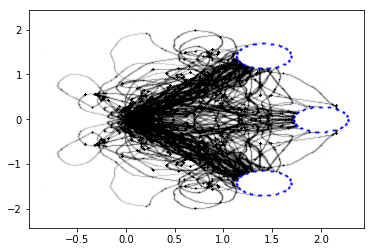

In [275]:

ANGLE = np.round(angle_used*180/math.pi).astype(int)
print('angle between posts:', str(ANGLE))

now= datetime.now()
act_date = now.strftime('%Y-%m-%d')

#trajectories
color = 'black'  # speeds #
#to plot with noise replace df6 by df3
plt.scatter(np.array(df6)[50:,9], np.array(df6)[50:,10],c=color ,s=0.5, alpha=0.02)# s=0.0005, alpha=0.5) #c=speeds   'black'
plt.scatter(np.array(df6)[50:,9], -(np.array(df6)[50:,10]),c=color ,s=0.5, alpha=0.02)

if type(color) is np.ndarray:
    col_param = 'speed_col'    
else:
    col_param = 'black'
print(col_param)


#posts (approx size)
dot_x = math.cos(habp)*dist
dot_y = math.sin(habp)*dist
#plt.scatter(dot_x,dot_y, c='red', s=2900)
#plt.scatter(dot_x,-dot_y, c='blue', s=2900)

#limits of x and y axis
#plt.xlim(-0.6,2.3)
#plt.ylim(-2.3,2.3)
#appropriate size of posts in grey lines
plotting_angles = list(range(0,361,5))
ploX=[]
ploY=[]
plo=[np.linspace(0, 360, num=100)]
for i in range(0,100):
    ploX.extend([(math.cos(plo[0][i]))])
    ploY.extend([(math.sin(plo[0][i]))])
    plt.scatter((np.array(ploX)[i])*0.28+dot_x, np.array(ploY)[i]*0.28+dot_y, c='blue', s=1, alpha=0.5)
    plt.scatter((np.array(ploX)[i])*0.28+dot_x, np.array(ploY)[i]*0.28-dot_y, c='blue', s=1, alpha=0.5)
    plt.scatter((np.array(ploX)[i])*0.28+2, np.array(ploY)[i]*0.28, c='blue', s=1, alpha=0.5)
#act_date
filename = '/home/bianca/Documents/github/locustVR/plotting/'+str(ANGLE) + '_3post_nonoise_mirrored'+ col_param +'_'+exper_date+'_'+'_all'+ '.png'
#filename = '/home/bianca/Documents/github/locustVR/plotting/'+str(ANGLE) + '_2post_'+ col_param +'_'+exper_date+'_'+tstart+ '.png'

#speeds[np.where(speeds>4)[0]] = 0
#fig.set_dpi(100)

plt.savefig(filename, dpi=(250))

# HEAT MAP

In [319]:
blu = pd.DataFrame()
blu = df6['x_rot'][0:10]
#bla = np.array(df6['x_rot'])
blu
bluu = np.array(blu)
print(bluu)
bluuu = np.append(bluu, -bluu)
bluuu

[0.00036188 0.00100441 0.0015386  0.00200584 0.00245401 0.00276161
 0.00311502 0.00337616 0.00352701 0.0035884 ]


array([ 0.00036188,  0.00100441,  0.0015386 ,  0.00200584,  0.00245401,
        0.00276161,  0.00311502,  0.00337616,  0.00352701,  0.0035884 ,
       -0.00036188, -0.00100441, -0.0015386 , -0.00200584, -0.00245401,
       -0.00276161, -0.00311502, -0.00337616, -0.00352701, -0.0035884 ])

In [320]:

xs = np.array(df6['x_rot'])
ys = np.array(df6['y_rot'])


In [321]:
len(xs)

246816

In [330]:
xxs.shape

NameError: name 'xxs' is not defined

In [329]:
del(yys)

In [331]:

xxs = np.append(xs, xs)
yys = np.append(ys, -ys)

In [332]:
xxs.shape

(493632,)

In [336]:
nbins =300
#bins 280, val 171      300,211  , 300 val=171,221
peak_threshold = 0.8
post0_x = dot_x
post0_y = -dot_y
post1_y = dot_y
thr = 0.9

def density_map(x, y, stats=True):

    val = 101#211 #201

    blur = (11,11) if stats == True else (val,val) #blur 11,11
    r = ([[0, post0_x], [post0_y, post1_y]])
    
    h, xedge, yedge, image = plt.hist2d(x, y, bins=nbins, normed=True, range=r)


    tmp_img = np.flipud(np.rot90(cv2.GaussianBlur(h, blur, 0)))
    for i in range(0, nbins):
        max_val = np.max(tmp_img[:, i])
        tmp_img[:, i] = tmp_img[:, i] / max_val

    return tmp_img

    '''for i in range(0, nbins):
        
        #max_val = np.sum(tmp_img[:, i])/(1+i**0.25)
        max_val = np.max(tmp_img[:, i])
        tmp_img[:, i] = tmp_img[:, i] / max_val
        tmp_img[(tmp_img[:, i])>thr, i]=thr
        tmp_img[:, i] = tmp_img[:, i] / thr
        
    return tmp_img'''


'''for i in range(0, nbins):
        
        #max_val = np.sum(tmp_img[:, i])/(1+i**0.25)
        max_val = np.max(tmp_img[:, i])
        tmp_img[:, i] = tmp_img[:, i] / max_val
        tmp_img[(tmp_img[:, i])>thr, i]=thr
        tmp_img[:, i] = tmp_img[:, i] / thr
    return tmp_img'''

'for i in range(0, nbins):\n        \n        #max_val = np.sum(tmp_img[:, i])/(1+i**0.25)\n        max_val = np.max(tmp_img[:, i])\n        tmp_img[:, i] = tmp_img[:, i] / max_val\n        tmp_img[(tmp_img[:, i])>thr, i]=thr\n        tmp_img[:, i] = tmp_img[:, i] / thr\n    return tmp_img'

In [ ]:
# xxs, yys is mirrored data, xs, ys plain data

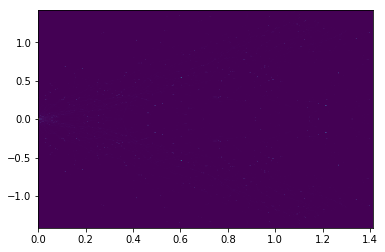

In [337]:


img = density_map(xxs, yys, stats=False)


x_peaks = np.where(img > peak_threshold)[1] * post0_x / nbins
y_peaks = np.where(img > peak_threshold)[0] * (post0_y - post1_y) / nbins + post1_y

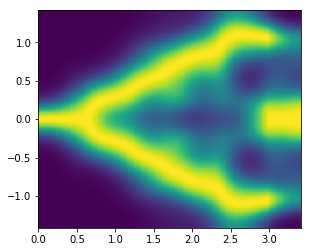

In [338]:
plt.imshow(img ** 2, extent=[0, post0_x+2, post0_y, post1_y])
filename = '/home/bianca/Documents/github/locustVR/plotting/'+str(ANGLE) + '_3post_mirrored_'+str(nbins)+'_'+exper_date+'_'+'heat'+ '.png'

plt.savefig(filename, dpi=(250))

NameError: name 'data' is not defined

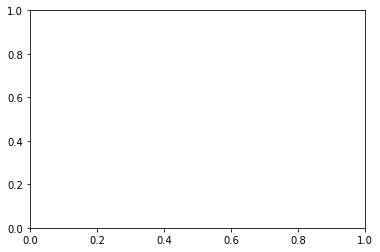

In [250]:


def forceAspect(ax,aspect=1):
    im = ax.get_images()
    extent =  im[0].get_extent()
    ax.set_aspect(abs((extent[5]-extent[1])/(extent[5]-extent[2]))/aspect)

#data = np.random.rand(0,2)

fig = plt.figure()
ax = fig.add_subplot(111)
ax.imshow(data)
ax.set_xlabel('xlabel')
ax.set_aspect(1)
plt.scatter(np.array(rot)[150:,0], np.array(rot)[150:,1],c=color ,s=0.5, alpha=0.02)# s=0.0005, alpha=0.5) #c=speeds   'black'


In [ ]:
speeds = np.array(d_v2)[:,0]

In [ ]:
#
speeds[np.where(speeds>4)[0]] = 0
speeds[np.where(speeds<0)[0]] = 0


In [ ]:
len(speeds)

In [ ]:
plt.hist(speeds)

In [ ]:
#dot plotting

plotting_angles = list(range(0,361,5))
ploX=[]
ploY=[]
plo=[np.linspace(0, 360, num=100)]
for i in range(0,100):
    ploX.extend([(math.cos(plo[0][i]))])
    ploY.extend([(math.sin(plo[0][i]))])
    plt.scatter((np.array(ploX)[i])*0.2+5, np.array(ploY)[i]*0.2+5, c='black', s=300, alpha=0.1)


In [ ]:

df = pd.read_csv('/home/bianca/Documents/flyVR/vivek_data/new_experiments/0b4dc1ba-58fe-4452-9f75-630dd7cd07a8/results.csv')
df2 = pd.read_csv('/home/bianca/Documents/flyVR/vivek_data/new_experiments/0cac2ffa-751c-47e2-a60c-a4394f0c3694/results.csv')

df.columns = ['x', 'y', 'z', 'dir', 'cntr', 't', 'nStimuli']
df2.columns = ['x', 'y', 'z', 'dir', 'cntr', 't', 'nStimuli']
df=df.append(df2)

#df, df2

In [ ]:
df4 = df[df['nStimuli'] == 4]
df4.head()

# plotting speed

In [ ]:
#taking unrotated x,y values from df3
#if df['nStimuli'][j]== stim:
#print(df3['y'][i])  
#i=10000 

#need of implementation speed in relation to post-distance or starting point distance. otherwise two different locusts 
#plotted on top of each other don't make sense. they need some synchronization which is post-distance?? 
#bifurcation point distance?
window = 50
d_v = []
for i in range(window,(len(df6))): #len(df3)
    d=((((df6['x'][i]-df6['x'][i-window])**2 + (df6['y'][i]-df3['y'][i-window])**2)**0.5)/(df6['t'][i]-df6['t'][i-window]))
    #if d != 0.0:
        #d_v=( )

#plt.scatter(np.array(rot)[:,0], np.array(rot)[:,1], c='black', s=1, alpha=0.01)
#plt.scatter(df4['x'], df4['y'], c='black', s=1, alpha=0.01)
    #speed relative to location on x
    d_v.extend([(d*100,df6['x'][i])]) # *100 to get cm/s
    #speed to time
    #d_v.extend([(d*100,df3['t'][i])]) # *100 to get cm/s


In [ ]:
#    rot.extend([(rotation(x,y,theta))])
d_v2 =[]
for i in range(window,(len(df6))): #len(df3)
    e=((((rot[i][0]-rot[i-window][0])**2 +       (rot[i][1]-rot[i-window][1]) **2)**0.5)/(df6['t'][i]-df6['t'][i-window]))
    #if d != 0.0:
        #d_v=( )
    d_v2.extend([(e*100,rot[i][0])])


In [ ]:
#color can get a list of colors to use for certain ID of the fly /locust

plt.scatter(np.array(d_v2)[50:8000,1], np.array(d_v2)[50:8000,0], c='black', s=0.1, alpha=1)
plt.ylim([0,4])

In [ ]:
plt.plot(df3['x'][:])
plt.plot(df3['y'][:])
# plt.xlim([8700,11200])

In [ ]:
xx = df3['x']
yy = df3['y']
distxxyy = np.sqrt(np.diff(xx)**2+np.diff(yy)**2)
speed = distxxyy/np.diff(tt)

In [ ]:
dt = 1/100.0
threshold = np.quantile(distxxyy,0.99)
plt.hist(distxxyy[distxxyy<threshold]/dt)

In [ ]:
np.quantile(distxxyy,[0.95,0.99,1])

In [ ]:
tt  = df3['t']
plt.hist(np.diff(tt))

In [ ]:
np.quantile(np.diff(tt),[0.95,0.99,1])

(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

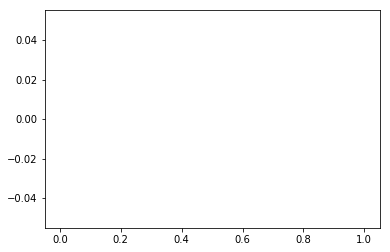

In [84]:
threshold = np.quantile(speed,0.99)
plt.hist(speed[speed<threshold])